## TOC:
* [Reading CVS files](#first-bullet)
* [Luminosity section](#second-bullet)
* [Trigger rate section](#third-bullet)
* [Model inference section](#fourth-bullet)

In [1]:
import math
import numpy as np
import pandas as pd
import tensorflow as tf

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from mpl_toolkits.axes_grid1 import make_axes_locatable

from scipy import ndimage, misc
import datetime
from datetime import timedelta

import keras
from keras import backend as K
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.models import Sequential, load_model
from keras.layers import Dense, Flatten, Reshape, Conv1D, \
MaxPooling1D, AveragePooling1D, UpSampling1D, InputLayer

from scipy import ndimage, misc

from sklearn import svm
from sklearn.ensemble import IsolationForest
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, auc
from sklearn.model_selection import cross_val_score, train_test_split,\
StratifiedKFold, GridSearchCV
from sklearn.preprocessing import MaxAbsScaler

Using TensorFlow backend.


In [2]:
# Change presentation settings
%matplotlib inline

matplotlib.rcParams["figure.figsize"] = (15.0, 8.0)
matplotlib.rcParams["xtick.labelsize"] = 16
matplotlib.rcParams["ytick.labelsize"] = 16
matplotlib.rcParams["axes.spines.left"] = True
matplotlib.rcParams["axes.spines.bottom"] = True
matplotlib.rcParams["axes.spines.right"] = True
matplotlib.rcParams["axes.spines.top"] = True
matplotlib.rcParams["axes.titlesize"] = 16
matplotlib.rcParams["figure.titlesize"] = 16
matplotlib.rcParams["axes.labelsize"] = 14
matplotlib.rcParams["legend.fontsize"] = 14

In [3]:
runs = [302634, 302635, 306125]
lumi_directory = data_directory = "./lumi"
rates_directory = "./rates"

# Reading cvs files <a class="anchor" id="first-bullet"></a>

Reading instantaneous luminosities from the cvs file produced with brilcalc and saving into a pandas dataframe:

In [4]:
df_rates = pd.DataFrame()
int_lumi2 = pd.DataFrame()
for run in runs:
    print("Loading %s" % run)
    path = "%s/lumi_%s.csv" % (lumi_directory, run)
    int_lumi2 = int_lumi2.append(pd.read_csv(path,
        names=["runfill", "ls", "time", "beamstatus", "energy", "delivered",\
               "recorded", "avgpu", "source"]), 
        ignore_index=True);    
    path = "%s/dt_rates_%s.csv" % (rates_directory, run)
    df_rates = df_rates.append(pd.read_csv(path, 
        names=["run", "time", "board", "RPC1", "RPC2", "RPC3", "RPC4",\
               "DT1", "DT2", "DT3", "DT4", "DT5"]), 
        ignore_index=True);
print("Done.")

Loading 302634
Loading 302635
Loading 306125
Done.


# Luminosity section <a class="anchor" id="second-bullet"></a>

Dropping useless rows inherited from the lumi CVS file:

In [5]:
int_lumi2["source"] = int_lumi2["source"].astype('str')
int_lumi2 = int_lumi2[int_lumi2["source"] != "nan"]
int_lumi2 = int_lumi2[int_lumi2["source"] != "source"]

Splitting run:fill field and the start and end lumi sections:

In [6]:
int_lumi2['run'], int_lumi2['fill'] = int_lumi2['runfill'].str.split(':', 1).str
int_lumi2['ls_start'], int_lumi2['ls_end'] = int_lumi2['ls'].str.split(':', 1).str

Converting run to integer and luminosities to float:

In [7]:
int_lumi2["run"] = int_lumi2["run"].astype('int')
int_lumi2["ls_start"] = int_lumi2["ls_start"].astype('int')
int_lumi2["ls_end"] = int_lumi2["ls_end"].astype('int')
int_lumi2["delivered"] = int_lumi2["delivered"].astype('float64')
int_lumi2["recorded"] = int_lumi2["recorded"].astype('float64') 

Converting time stamp to datetime:

In [8]:
def transform_time(data):
    from datetime import datetime
    time_str = data.time
    #print time_str
    datetime_object = datetime.strptime(time_str, "%m/%d/%y %H:%M:%S")
    #print datetime_object
    return datetime_object
int_lumi2["time"] = int_lumi2.apply(transform_time, axis=1);

Creating end time column from the start time:

In [9]:
int_lumi2["time_end"] = int_lumi2["time"]

Finding the runs and their start and end times:

In [10]:
boundaries = pd.DataFrame(columns=["run", "start", "end", "ls_start", "ls_end", "nLS"])
for i in runs:
    start = int_lumi2[int_lumi2["run"] == i]["time"]
    end = int_lumi2[int_lumi2["run"] == i]["time_end"]
    start_ls = int_lumi2[int_lumi2["run"] == i]["ls_start"]
    end_ls = int_lumi2[int_lumi2["run"] == i]["ls_end"]
    start =  start.reset_index(drop=True)
    end =  end.reset_index(drop=True)
    start_ls =  start_ls.reset_index(drop=True)
    end_ls =  end_ls.reset_index(drop=True)
    nLS = int(start_ls.iloc[-1]) - int(start_ls.iloc[0]) + 1
    print i, start.iloc[0], start.iloc[-1], start_ls.iloc[0], start_ls.iloc[-1], nLS
    boundaries = boundaries.append({"run": i, "start": start.iloc[0], "end": start.iloc[-1], 
                                   "ls_start": start_ls.iloc[0], "ls_end": start_ls.iloc[-1], "nLS": nLS}, 
                                   ignore_index = True)

302634 2017-09-12 01:07:57 2017-09-12 05:17:46 1 644 644
302635 2017-09-12 05:18:01 2017-09-12 13:42:19 1 1299 1299
306125 2017-11-03 14:46:12 2017-11-04 10:14:06 1 3007 3007


Reindexing the dataframe after removing some lines:

In [11]:
int_lumi2.index = pd.RangeIndex(len(int_lumi2.index))

In [12]:
print len(int_lumi2.index)

4950


Filling end time column:

In [13]:
def addTimeOffSet(startdate):
    enddate = pd.to_datetime(startdate) + pd.DateOffset(seconds=23)
    return enddate

def shiftElement(df, boundaries):
    run0 = boundaries["run"].iloc[0]
    for index, rows in df.iterrows():
        run = rows["run"]
        nls = int(boundaries[boundaries["run"] == run]["nLS"])
        if(run > run0):
            nls = nls + index
        #print run, nls
        if((index < nls) & (index < len(int_lumi2.index)-1)):
            #print index, run, rows["time"], df["time"][index+1]
            df.loc[index, "time_end"] = df["time"][index+1]
        elif (index == len(int_lumi2.index)-1):
            #print index, run, rows["time"], addTimeOffSet(rows["time"])
            df.loc[index, "time_end"] = addTimeOffSet(rows["time"])
                    
shiftElement(int_lumi2, boundaries)

In [14]:
#print int_lumi2["beamstatus"]
int_lumi2 = int_lumi2[int_lumi2["beamstatus"] == "STABLE BEAMS"]

Plotting the instantaneous luminosities:

In [15]:
def plot_inst_lumi(x_val, y_val, z_val, title):
    fig, ax = plt.subplots()
    plt.xlabel("Time")
    plt.ylabel(r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]")
    xfmt = mdates.DateFormatter('%y-%m-%d %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)
    ax.grid()
    fig.autofmt_xdate()
    plt.plot(x_val, y_val, 'ro-')
    plt.plot(x_val, z_val, 'bo-')
    plt.title(title)
    plt.legend(loc="best")
    plt.show();

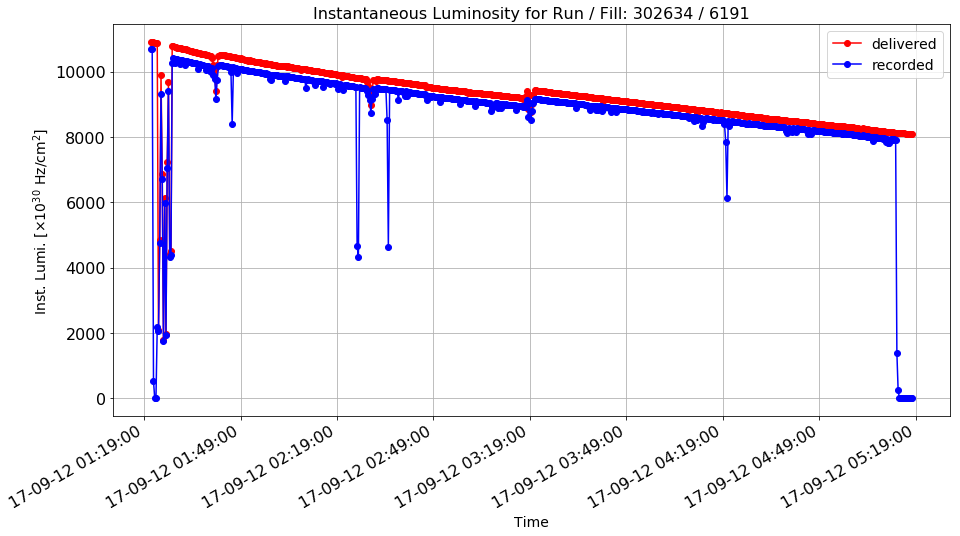

In [16]:
plot_inst_lumi(int_lumi2[int_lumi2["run"] == 302634]["time"], 
               int_lumi2[int_lumi2["run"] == 302634]["delivered"], 
               int_lumi2[int_lumi2["run"] == 302634]["recorded"], 
               ("Instantaneous Luminosity for Run / Fill: %s / %s" % 
               (boundaries["run"].iloc[0], int_lumi2["fill"].iloc[0])))

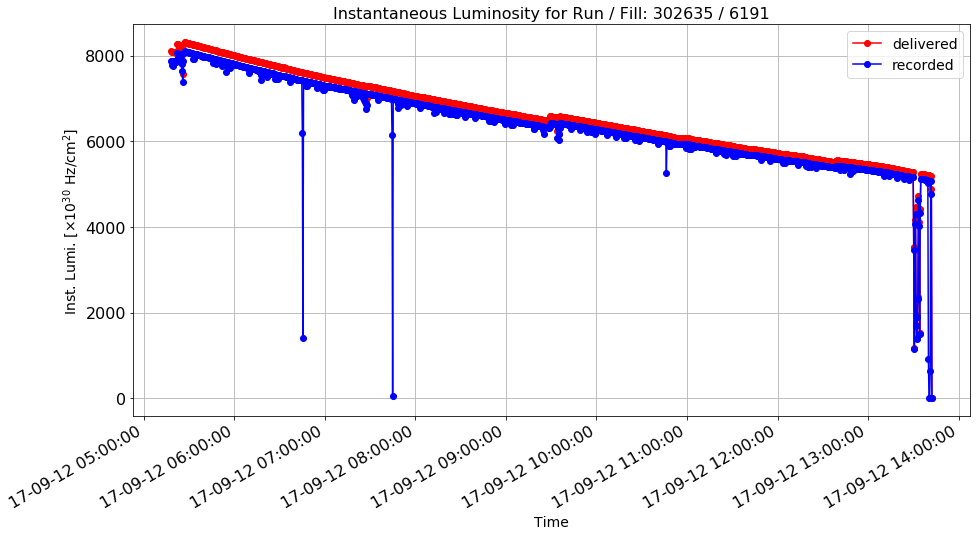

In [17]:
plot_inst_lumi(int_lumi2[int_lumi2["run"] == 302635]["time"], 
               int_lumi2[int_lumi2["run"] == 302635]["delivered"], 
               int_lumi2[int_lumi2["run"] == 302635]["recorded"], 
               ("Instantaneous Luminosity for Run / Fill: %s / %s" % 
               (boundaries["run"].iloc[1], int_lumi2["fill"].iloc[0])))

In [18]:
int_lumi2.to_csv("int_lumi_issues.csv", sep='\t')

# Trigger rate section <a class="anchor" id="third-bullet"></a>

Converting columns to proper data types:

In [19]:
df_rates["time"] = pd.to_datetime(df_rates["time"])
df_rates["run"] = df_rates["run"].astype('int')
#print df_rates["time"]

Splitting, converting and adding new columns:

In [20]:
df_rates['wheel'], df_rates['sector'] = df_rates['board'].str.split('_', 1).str
df_rates["wheel"] = df_rates["wheel"].astype(str)
df_rates["sector"] = df_rates["sector"].astype(str)

In [21]:
df_rates["wheel"].replace(regex=True,inplace=True,to_replace=r'YB',value=r'')
df_rates["sector"].replace(regex=True,inplace=True,to_replace=r'S',value=r'')
df_rates["wheel"] = df_rates["wheel"].astype('int')
df_rates["sector"] = df_rates["sector"].astype('int')
df_rates["ls"] = -1
df_rates["lumi"] = -1.0
df_rates["score"] = -1
df_rates.to_csv("df_rates.csv", sep='\t')

Plotting the rate coming from one of the stations:

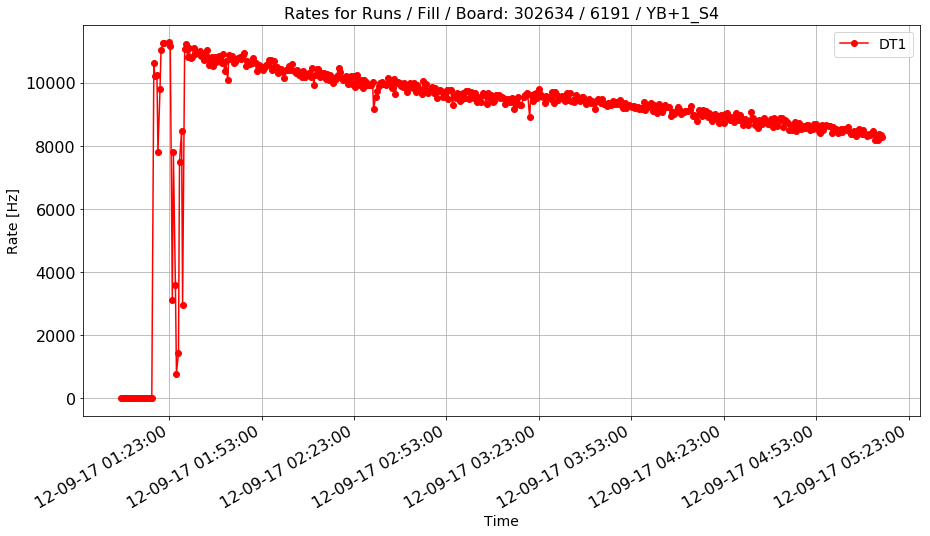

In [22]:
def plot_rate_vs_time(df, x_val, y_val, z_val, title):
    df_temp = df.copy()
    crit = df_temp["board"] == z_val
    df_temp = df_temp[crit]
    fig, ax = plt.subplots()
    plt.xlabel("Time")
    plt.ylabel("Rate [Hz]")
    ax.xaxis_date()
    xfmt = mdates.DateFormatter('%d-%m-%y %H:%M:%S')
    ax.xaxis.set_major_formatter(xfmt)
    ax.grid()
    fig.autofmt_xdate()
    plt.plot(df_temp[x_val], df_temp[y_val], 'ro-')
    plt.title(title)
    plt.legend(loc="best")
    plt.show();

plot_rate_vs_time(df_rates[df_rates.run == 302634], "time", "DT1",\
                  "YB+1_S4", "Rates for Runs / Fill / Board: %s / %s / %s" % \
                  ("302634", int_lumi2["fill"].iloc[2], "YB+1_S4"))

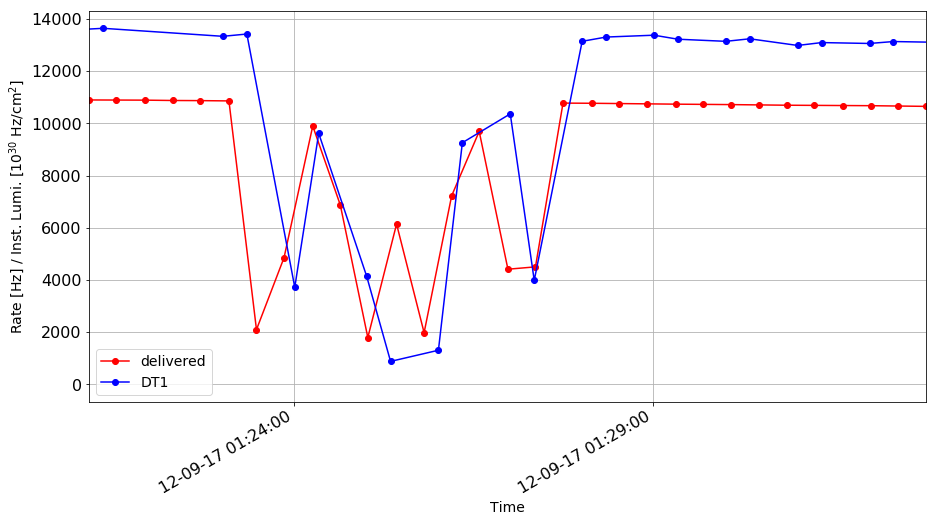

In [23]:
fig, ax = plt.subplots()
#ax.set_yscale('log')
plt.xlabel("Time")
plt.ylabel("Rate [Hz] / Inst. Lumi. [10$^{30}$ Hz/cm$^2$]")
plt.xlim(int_lumi2[int_lumi2["run"] == 302634]["time"].iloc[0],\
         int_lumi2[int_lumi2["run"] == 302634]["time"].iloc[30])
ax.xaxis_date()
xfmt = mdates.DateFormatter('%d-%m-%y %H:%M:%S')
ax.xaxis.set_major_formatter(xfmt)
ax.grid()
fig.autofmt_xdate()
plt.plot(int_lumi2[int_lumi2["run"] == 302634]["time"],\
         int_lumi2[int_lumi2["run"] == 302634]["delivered"], 'ro-')
rule = (df_rates.run == 302634) & (df_rates.board == "YB+1_S3")
plt.plot(df_rates[rule]["time"], df_rates[rule]["DT1"], 'bo-')
plt.title("")
plt.legend(loc='best')
plt.show()

Associating a LS and an instantaneous luminosity to each rate:

In [24]:
#Just a backup copy
df_rates_backup = df_rates.copy()

In [25]:
#Uncomment to restore backup copy
#df_rates = df_rates_backup.copy()

Removing the measurements taken before and after the start and end time reported by the brilcalc output. All the 60 boards are measured at the same time. In order to speed-up the association, we take just one board, the first one. This reduces the dataframe and the time needed to go though it by a factor of 60.

In [26]:
time0 = boundaries["start"].iloc[0]
timeF = boundaries["end"].iloc[-1]
print time0, timeF
#print df_rates[(df_rates.time >= time0) & (df_rates.time <= timeF)]
df_rates = df_rates[(df_rates.time >= time0) & (df_rates.time <= timeF)]
rule = df_rates.duplicated(subset=["time"])
count = (rule == False).sum()
print "Duplicates:", rule.sum()
df_rates_noduplicates = df_rates[rule == False]
#print df_rates_noduplicates

2017-09-12 01:07:57 2017-11-04 10:14:06
Duplicates: 1369390


In [27]:
print len(df_rates_noduplicates)

23210


Assigning the LS and the inst. lumi. to the measurements for the selected board:

In [28]:
def assignLS(df1, df2, boundaries):
    temp = df1.copy()
    j = 1
    for index1, row1 in df1.iterrows():
        run1 = row1["run"]
        time1 = row1["time"]
        #print index1, run1, time1
        ti = time1 - 2*pd.DateOffset(seconds=23)
        tf = time1 + 2*pd.DateOffset(seconds=23)
        indexes2 = df2[(df2.run == run1) & (df2.time > ti) & (df2.time < tf)].index
        #print indexes2
        for i in indexes2:
            if((time1 >= df2["time"].loc[i]) & (time1 < df2["time_end"].loc[i])):
                #print time1, df2["time"].loc[i], df2["time_end"].loc[i]
                if(j%1000 == 0): 
                    print j
                j = j + 1
                ls = df2["ls_start"].loc[i]
                lumi = df2["delivered"].loc[i]
                #print index1, run1, time1, ls, lumi
                temp.loc[index1, "ls"] = ls
                temp.loc[index1, "lumi"] = lumi
                break
    return temp

temp = assignLS(df_rates_noduplicates, int_lumi2, boundaries)
df_rates_noduplicates = temp

1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000
12000
13000
14000
15000
16000
17000
18000
19000
20000
21000
22000
23000


Removing the few cases not assigned and that are still at -1:

In [29]:
df_rates_noduplicates = df_rates_noduplicates[df_rates_noduplicates["ls"] > 0]
print len(df_rates_noduplicates)

23176


Save in a csv file:

In [30]:
df_rates.to_csv("df_rates_issues.csv", sep='\t')
df_rates_noduplicates.to_csv("df_rates_nodup_issues.csv", sep='\t')

In [31]:
#Uncomment to restore backup copy
#df_rates = df_rates_backup.copy()

Assign the LS and the inst. lumi. to all the 60 boards for each time:

In [32]:
def assignLS_ext(df1, df2):
    temp = df1.copy()
    indexes = []
    for index in df2.index:
        if index%10000 == 0:
            print index
        time = df2["time"].loc[index]
        ls = df2["ls"].loc[index]
        lumi = df2["lumi"].loc[index]
        des = (temp["time"] == time)
        indexes = temp[des].index
        #print time, ls, indexes
        temp.loc[des, "ls"] = ls
        temp.loc[des, "lumi"] = lumi
    return temp
    
temp = assignLS_ext(df_rates, df_rates_noduplicates)

30000
60000
90000
120000
150000
180000
210000
240000
270000
300000
330000
360000
390000
420000
450000
480000
510000
540000
570000
600000
630000
660000
690000
720000
750000
780000
810000
840000
870000
900000
930000
960000
990000
1020000
1050000
1080000
1110000
1140000
1170000
1200000
1230000
1260000
1290000
1320000
1350000
1380000


Save another backup copy:

In [33]:
df_rates = temp.copy()
#print df_rates[df_rates.ls <= 0]

Removing measurements without LS assignment:

In [34]:
df_rates_backup = df_rates.copy()
df_rates = df_rates[df_rates.ls > 0]
#print df_rates["ls"]

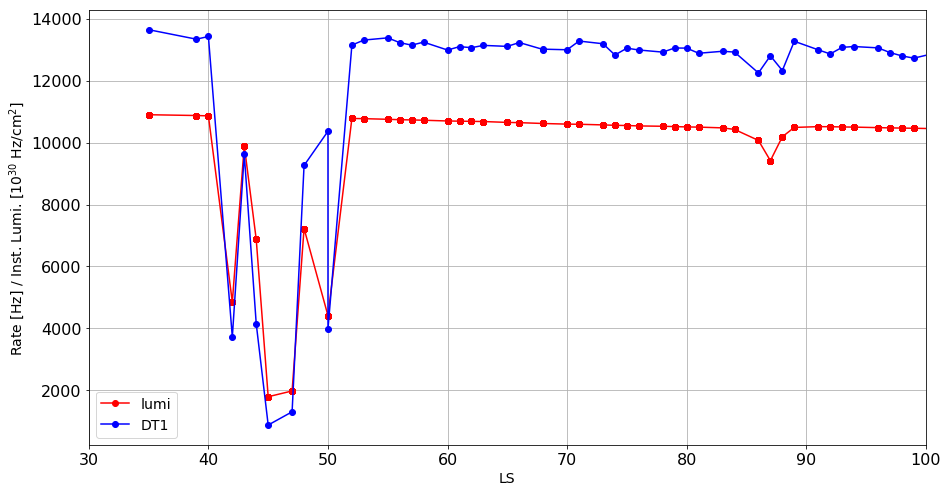

In [35]:
fig, ax = plt.subplots()
#ax.set_yscale('log')
plt.xlabel("LS")
plt.ylabel("Rate [Hz] / Inst. Lumi. [10$^{30}$ Hz/cm$^2$]")
plt.xlim(30, 100)
ax.grid()
plt.plot(df_rates[df_rates["run"] == 302634]["ls"],\
         df_rates[df_rates["run"] == 302634]["lumi"], 'ro-')
rule = (df_rates.run == 302634) & (df_rates.board == "YB+1_S3")
plt.plot(df_rates[rule]["ls"], df_rates[rule]["DT1"], 'bo-')
plt.title("")
plt.legend(loc='best')
plt.show()

In [36]:
#print df_rates[df_rates.ls <= 0]
df_rates.to_csv("df_rates_issues.csv", sep='\t')

Averaging the rates associated to the same LS:

In [37]:
df_boards = df_rates.copy()
df_boards = df_boards.groupby(['board']).size().reset_index(name='counts')
print len(df_boards)
#print df_boards

60


Too slow to use all the measurements. Averaging over 10 LS:

In [38]:
#Uncomment to restore backup copy
#df_rates = df_rates_backup.copy()

In [39]:
bunch = 10
def assignGroup(data, div = bunch):
    res = int(data/div)
    #print data, res
    return res

df_rates["group"] = df_rates["ls"]
df_rates["group"] = df_rates["group"].apply(assignGroup)

In [40]:
temp1 = df_rates.groupby(['run', 'group', 'board', 'wheel', 'sector'])\
[["ls", "lumi", "RPC1", "RPC2", "RPC3", "RPC4", "DT1", "DT2", "DT3", "DT4", "DT5"]].mean().reset_index()

temp2 = df_rates.groupby(['run', 'group', 'board', 'wheel', 'sector'])\
[["lumi", "RPC1", "RPC2", "RPC3", "RPC4", "DT1", "DT2", "DT3", "DT4", "DT5"]].std().reset_index()

temp3 = df_rates.groupby(['run', 'group', 'board', 'wheel', 'sector'])\
[["lumi", "RPC1", "RPC2", "RPC3", "RPC4", "DT1", "DT2", "DT3", "DT4", "DT5"]]\
.size().reset_index(name='counts')

temp2 = temp2.rename(index=str, columns={"lumi": "errLumi", "RPC1": "errRPC1", "RPC2": "errRPC2",\
                                         "RPC3": "errRPC3", "RPC4": "errRPC4", "DT1": "errDT1",\
                                         "DT2": "errDT2", "DT3": "errDT3",\
                                         "DT4": "errDT4", "DT5": "errDT5"})

cols_to_use2 = temp2.columns.difference(temp1.columns)
cols_to_use3 = temp3.columns.difference(temp1.columns)

temp2 = temp2[cols_to_use2]
temp3 = temp3[cols_to_use3]

#print temp1.iloc[100]
#print temp2.iloc[100]
#print temp3.iloc[100]

temp1.reset_index(drop=True, inplace=True)
temp2.reset_index(drop=True, inplace=True)
temp3.reset_index(drop=True, inplace=True)

df_rates = pd.concat([temp1, temp2, temp3], axis = 1)

Calculating the errors on the mean values calculated in the previous step:

In [41]:
import math
def applySqrt(data):
    return math.sqrt(data)

df_rates["counts"] = df_rates["counts"].apply(applySqrt)

for i in list(df_rates):
    if "err" in i:
        #print i
        df_rates[i] = df_rates[i]/df_rates["counts"]

Check for null or NaN values:

In [42]:
print df_rates.isnull().values.any()
null_columns=df_rates.columns[df_rates.isnull().any()]
print(df_rates[df_rates.isnull().any(axis=1)][null_columns].head())
df_rates = df_rates.fillna(0)
print(df_rates[df_rates.isnull().any(axis=1)][null_columns].head())

False
Empty DataFrame
Columns: []
Index: []
Empty DataFrame
Columns: []
Index: []


In [43]:
#Another backup
#df_rates_backup = df_rates.copy()
#df_rates.to_csv("df_rates_issues.csv", sep='\t')

In [44]:
#Restore backup
#df_rates = df_rates_backup.copy()

In [45]:
print len(df_rates)

29520


Uncomment to check just one case:

In [46]:
#for index, row in df_rates.iterrows():
    #if row["board"] == "YB0_S1":
        #print "Index:", index,", Run:", row["run"],", Board: ",row["board"],",\
        #LS: ",row["ls"],", Rate: ",row["DT1"],", Error: ",row["errDT1"]

Plotting the result:

In [47]:
def plot_ratio_vs_ls(df, run, x_val, y_val, z_val, x_err, y_err, title_x, title_y, title, opt, log):
    df_temp = df.copy()
    fig, ax = plt.subplots()
    fig.autofmt_xdate()
    plt.xlabel(title_x)
    plt.ylabel(title_y)
    ax.grid()
    if log:
        ax.set_yscale('log')
    inter = []
    errors = []
    df_temp["ratio"] = df_temp[y_val]/df_temp[x_val]
    df_temp["errRatio"] = (1/df_temp[x_val])*\
    np.sqrt(df_temp[y_err]**2 + df_temp["errLumi"]**2*df_temp["ratio"]**2)
    for i in range(len(run)):
        rule = ((df_temp["board"] == z_val) & (df_temp["run"] == run[i]))
        val1 = df_temp[rule][x_val]
        val2 = df_temp[rule]["ratio"]
        inter.append(np.polyfit(val1, val2, 0)) #append anomalous fit,\
                                                #then normal fit, and ratio of the two
        errors.append(df_temp[rule]["errRatio"])
        #plt.plot(df_temp[rule][x_val], df_temp[rule]["ratio"], opt[i], label=str(run[i]))
        newstr = opt[i].replace("o", "")
        plt.errorbar(df_temp[rule][x_val], df_temp[rule]["ratio"], xerr=x_err,\
        yerr=df_temp[rule]["errRatio"], fmt=opt[i], ecolor=newstr, label=str(run[i]))
    a, b, c = inter[0], inter[1], 1-inter[0]/inter[1]
    plt.legend(loc="best")
    plt.title(title)
    plt.show()
    return float(a), float(b), float(c)

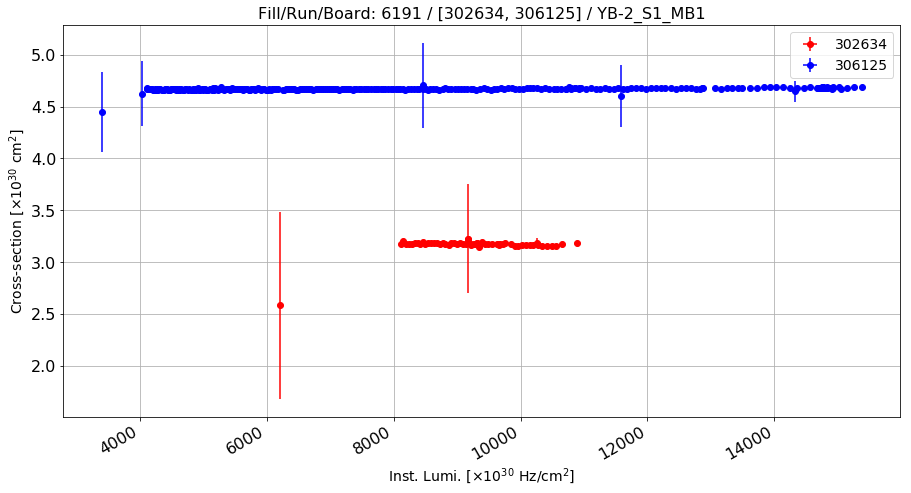

Anomalous CS: 3.16709695405 , Normal CS: 4.66988379125 , Ratio: 0.321803904418


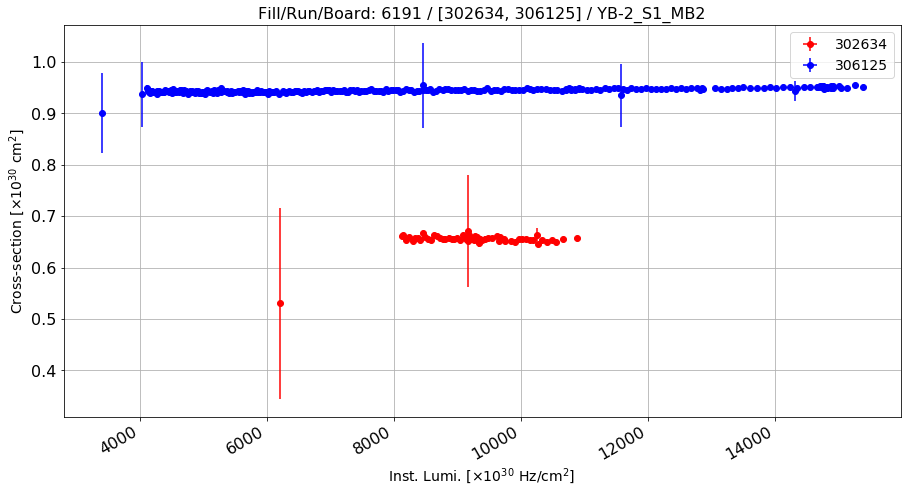

Anomalous CS: 0.654219113023 , Normal CS: 0.944563582753 , Ratio: 0.307384780688


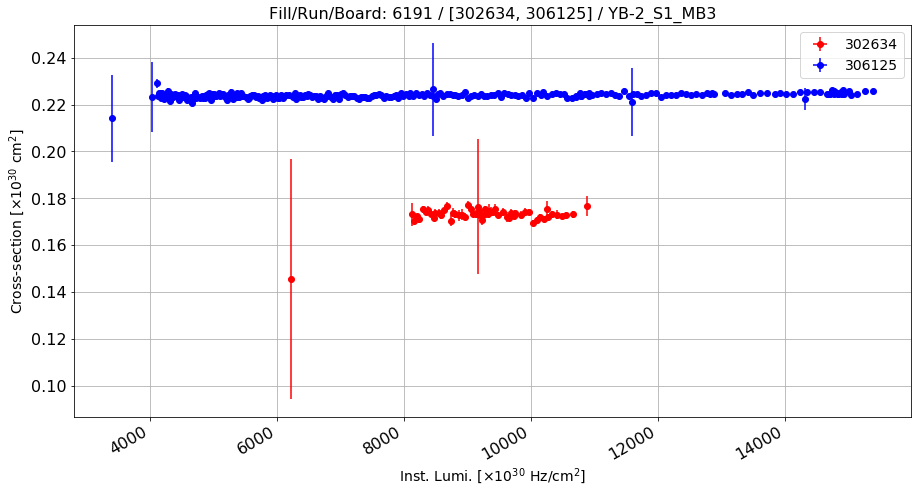

Anomalous CS: 0.172908531826 , Normal CS: 0.223930448254 , Ratio: 0.227847158909


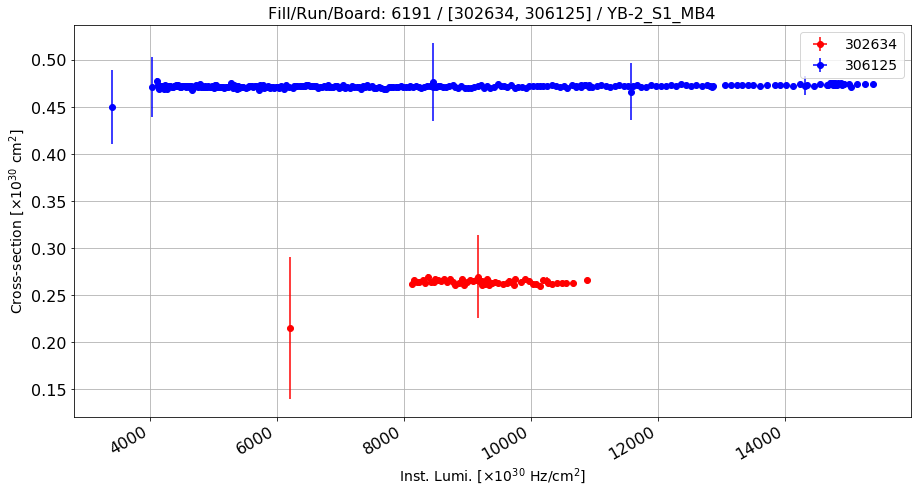

Anomalous CS: 0.263610084654 , Normal CS: 0.472247572679 , Ratio: 0.441796845755


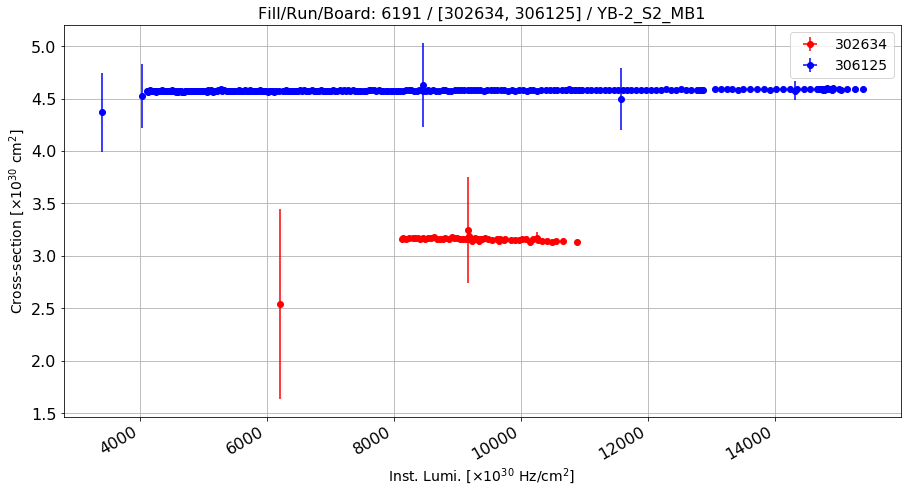

Anomalous CS: 3.1511467052 , Normal CS: 4.57753377078 , Ratio: 0.311606016909


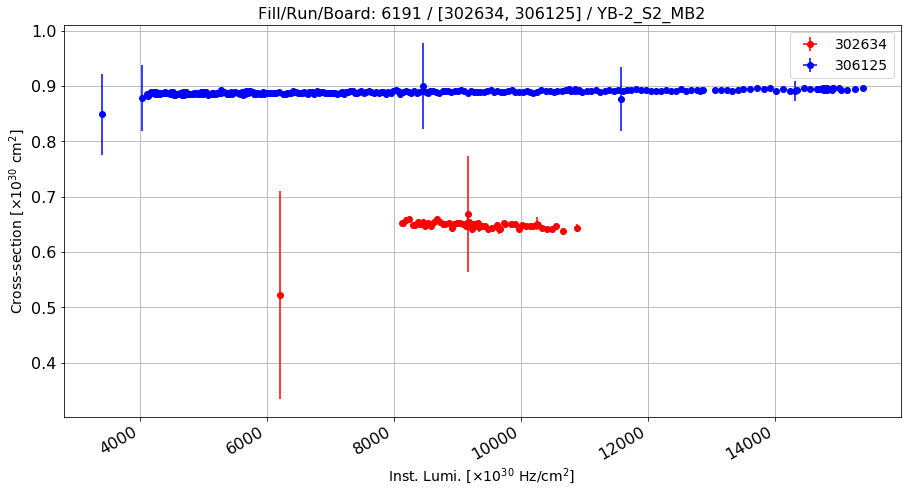

Anomalous CS: 0.647437036831 , Normal CS: 0.889454080052 , Ratio: 0.272096163983


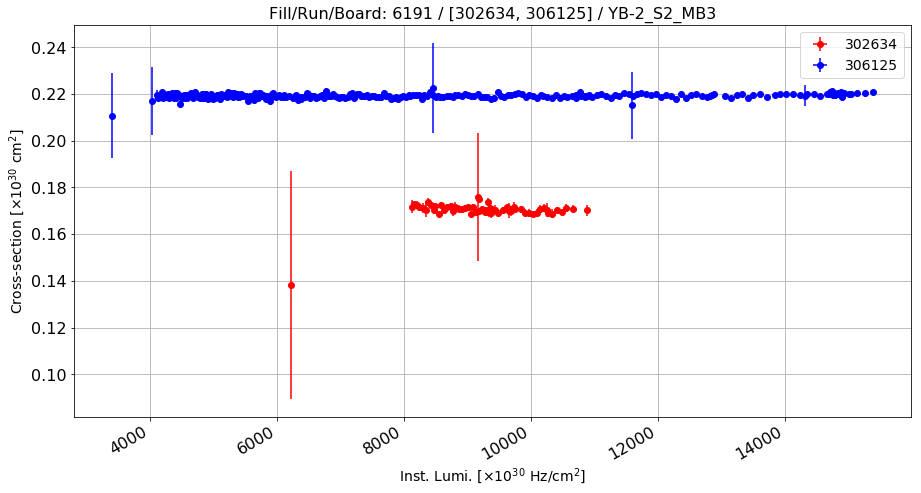

Anomalous CS: 0.170271680416 , Normal CS: 0.219239652948 , Ratio: 0.223353630937


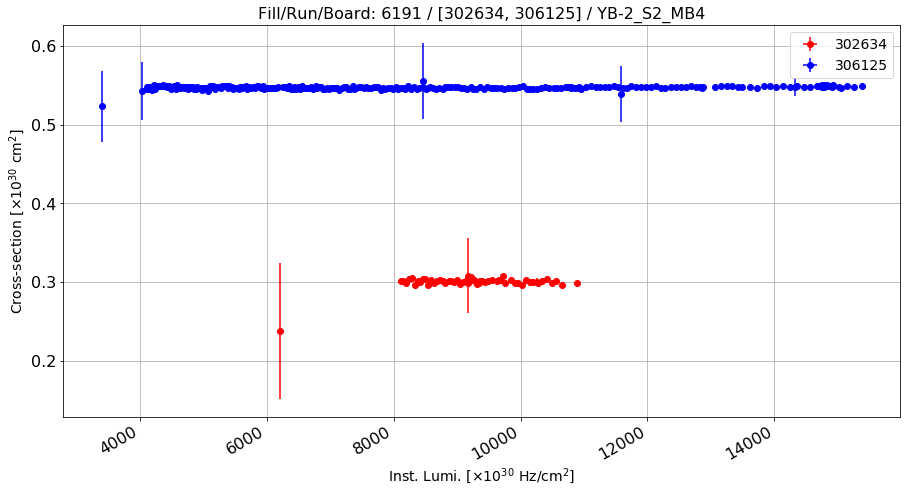

Anomalous CS: 0.299931088715 , Normal CS: 0.547224975107 , Ratio: 0.451905336271


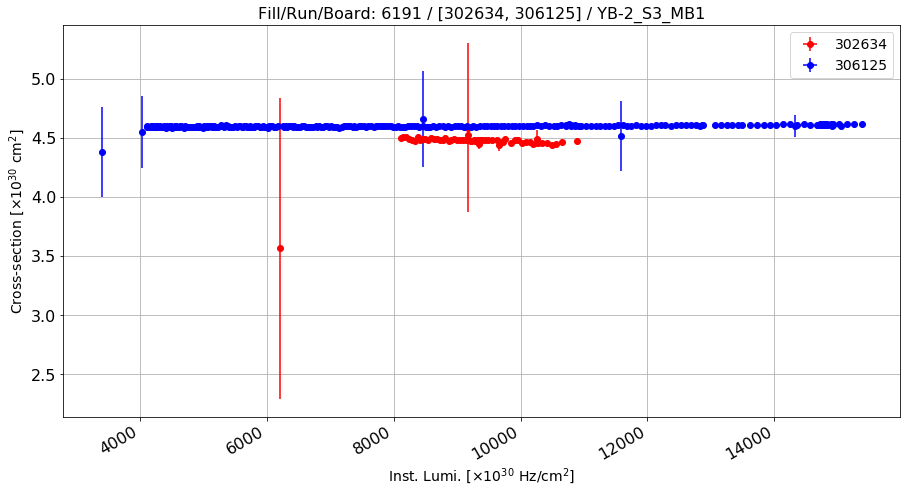

Anomalous CS: 4.4666736995 , Normal CS: 4.60036284219 , Ratio: 0.0290605648465


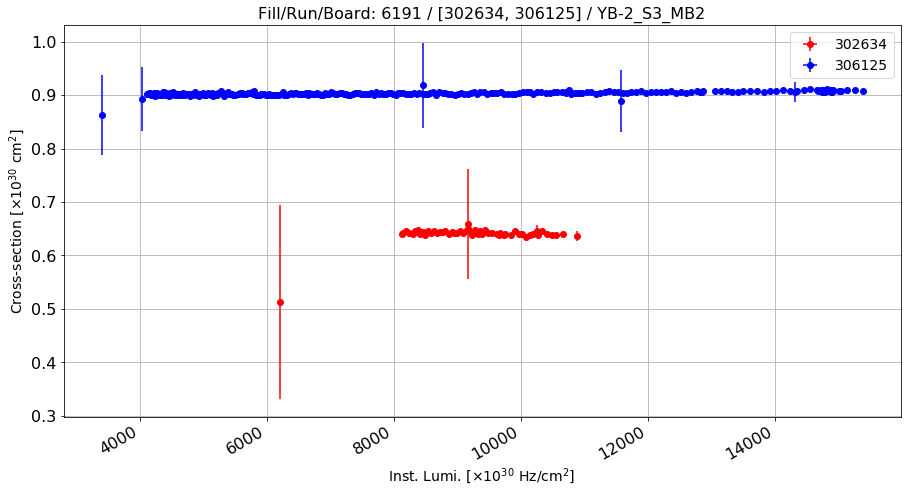

Anomalous CS: 0.640411520216 , Normal CS: 0.903374965541 , Ratio: 0.291090029451


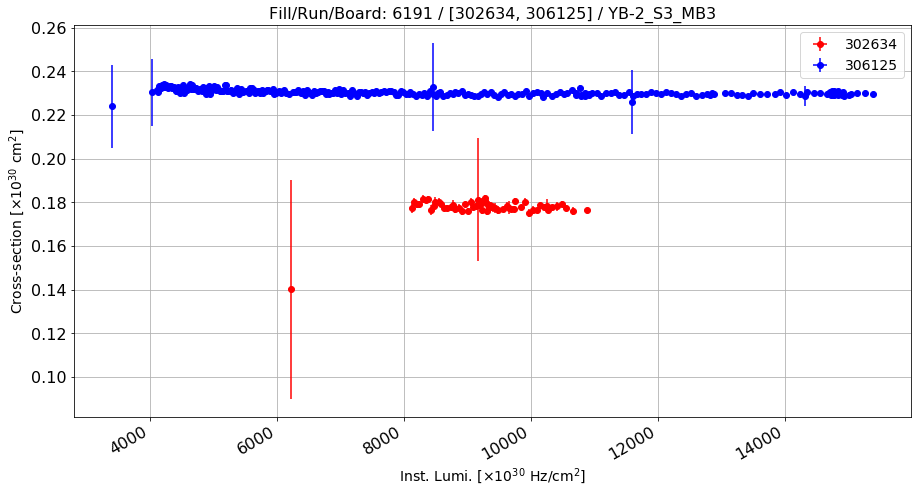

Anomalous CS: 0.177654116021 , Normal CS: 0.230469344326 , Ratio: 0.229163789482


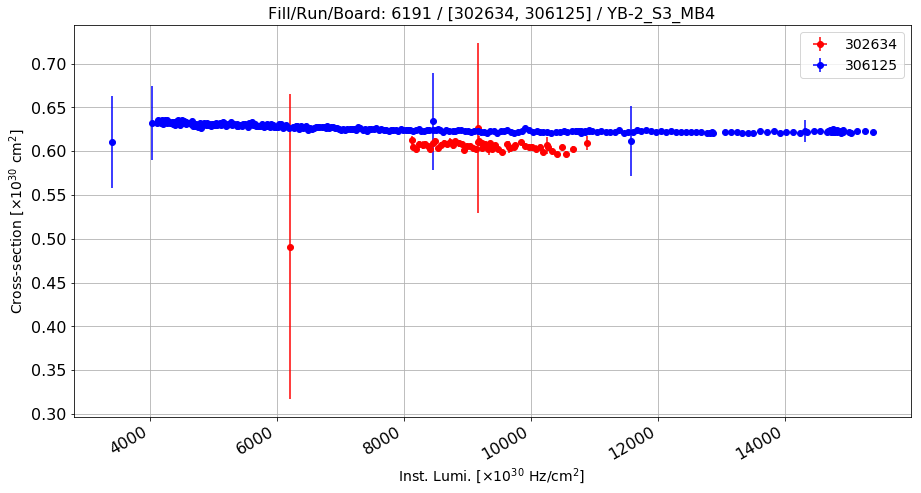

Anomalous CS: 0.604196084858 , Normal CS: 0.62619431155 , Ratio: 0.0351300327812


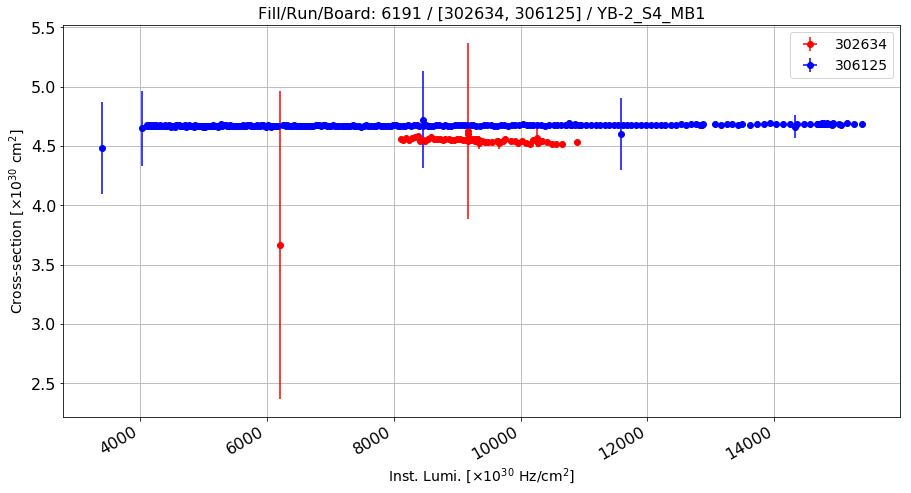

Anomalous CS: 4.53394342803 , Normal CS: 4.67276457582 , Ratio: 0.0297085687793


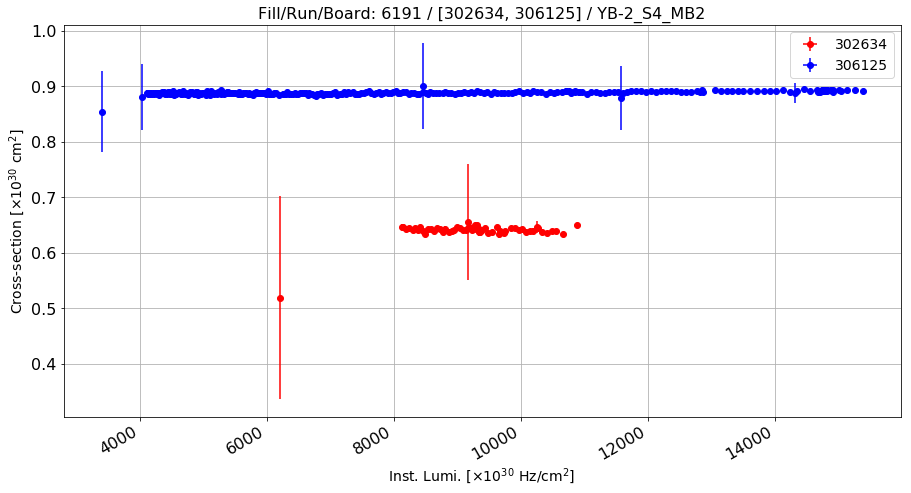

Anomalous CS: 0.639948288412 , Normal CS: 0.888827925349 , Ratio: 0.280008795672


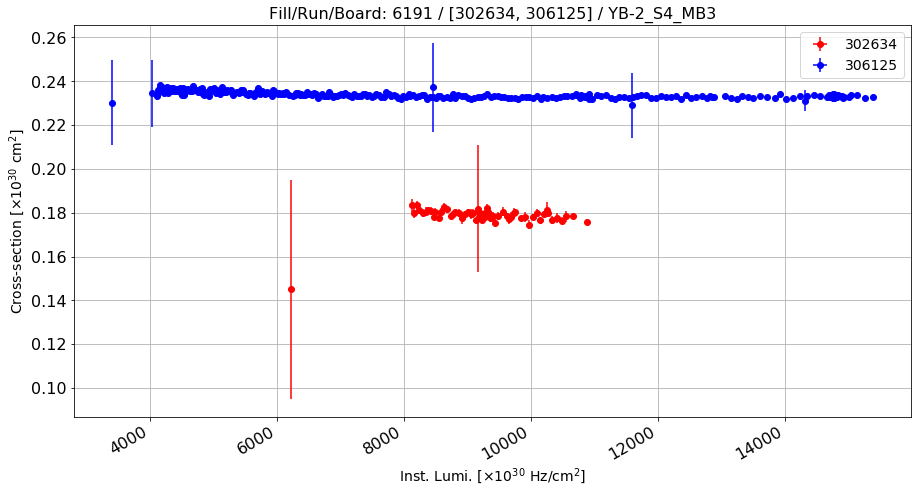

Anomalous CS: 0.178581900448 , Normal CS: 0.233940717368 , Ratio: 0.236636091157


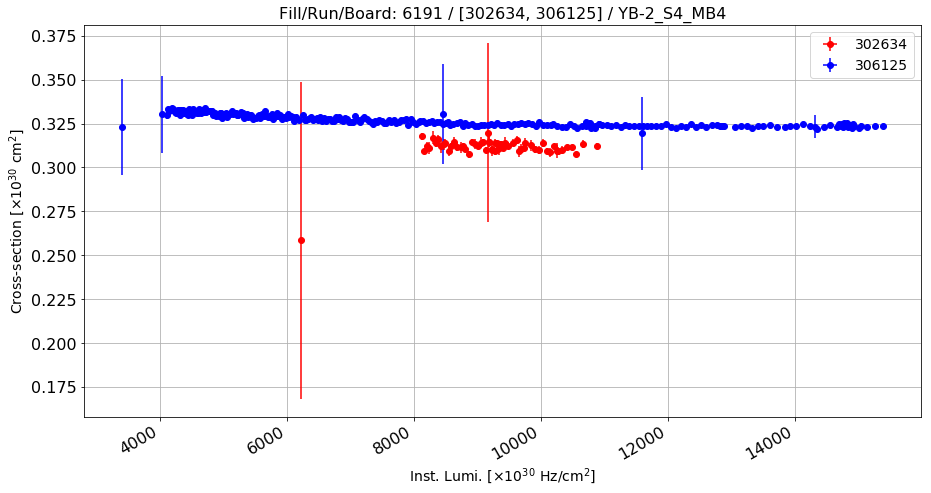

Anomalous CS: 0.311360422019 , Normal CS: 0.326986003628 , Ratio: 0.0477866986208


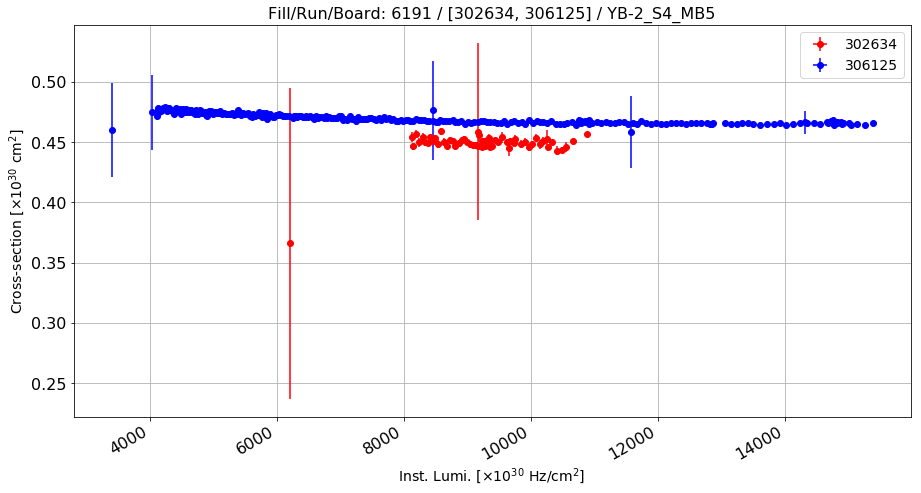

Anomalous CS: 0.448905505575 , Normal CS: 0.469950662641 , Ratio: 0.0447816307939


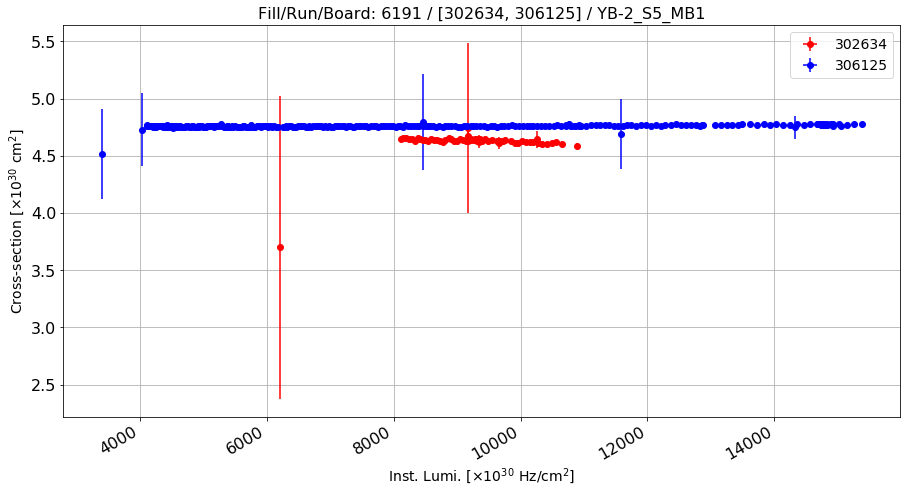

Anomalous CS: 4.61968213763 , Normal CS: 4.76006054759 , Ratio: 0.0294908874694


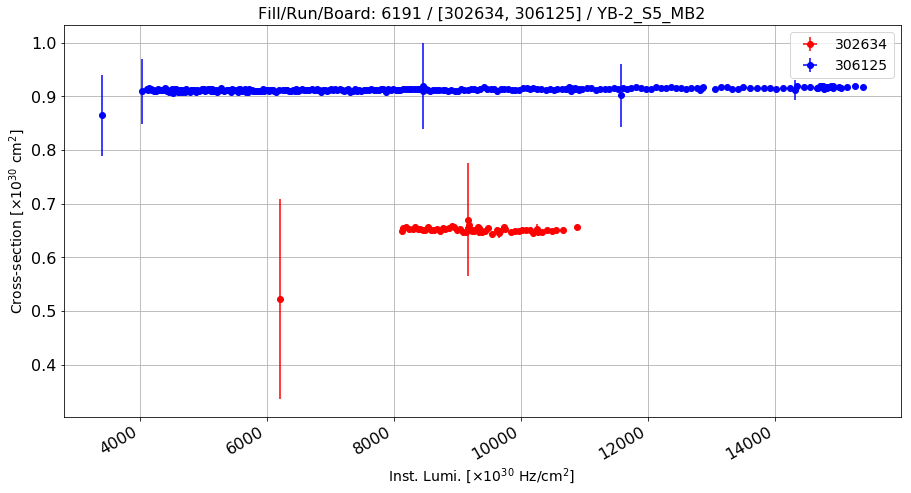

Anomalous CS: 0.649717669892 , Normal CS: 0.912657736511 , Ratio: 0.288103695504


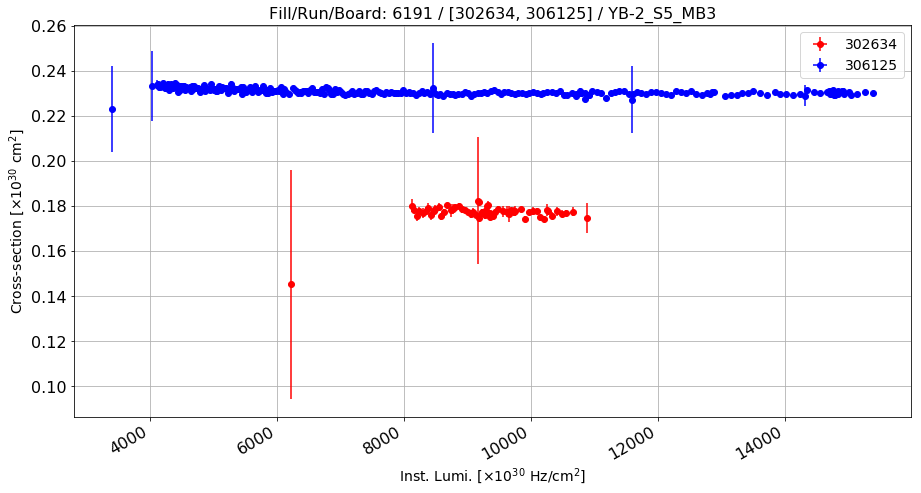

Anomalous CS: 0.177027074278 , Normal CS: 0.230881061537 , Ratio: 0.233254243119


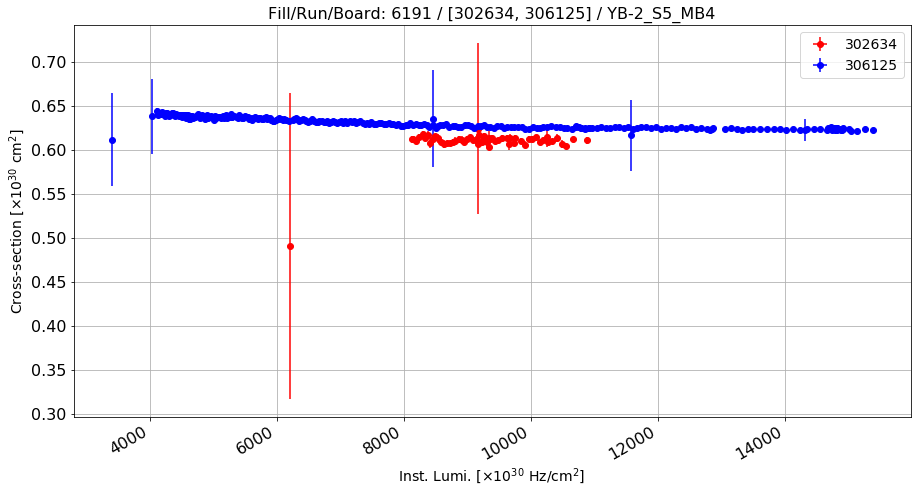

Anomalous CS: 0.609147185428 , Normal CS: 0.630619704554 , Ratio: 0.0340498702637


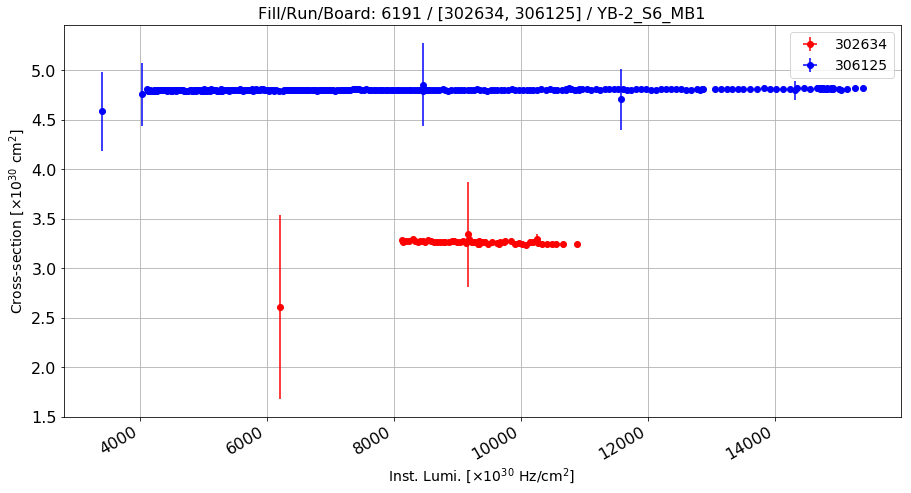

Anomalous CS: 3.2560249717 , Normal CS: 4.80380690642 , Ratio: 0.322199031908


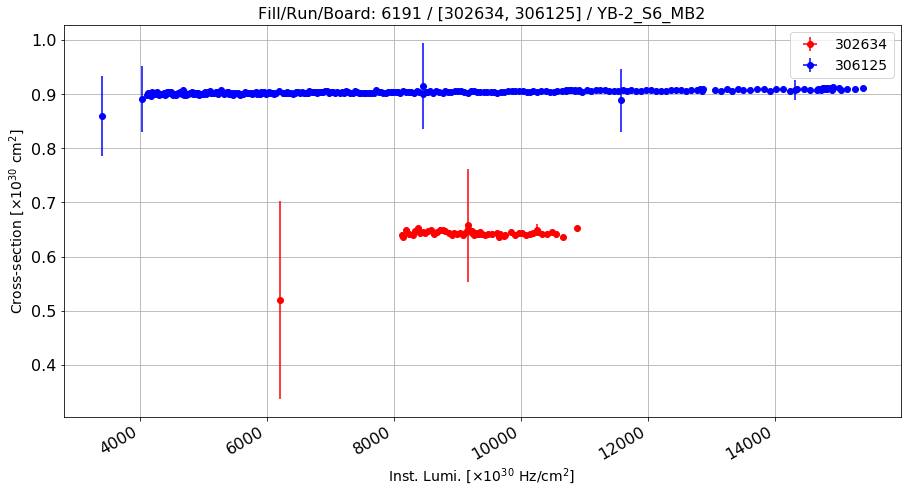

Anomalous CS: 0.641738835302 , Normal CS: 0.904233865254 , Ratio: 0.29029550876


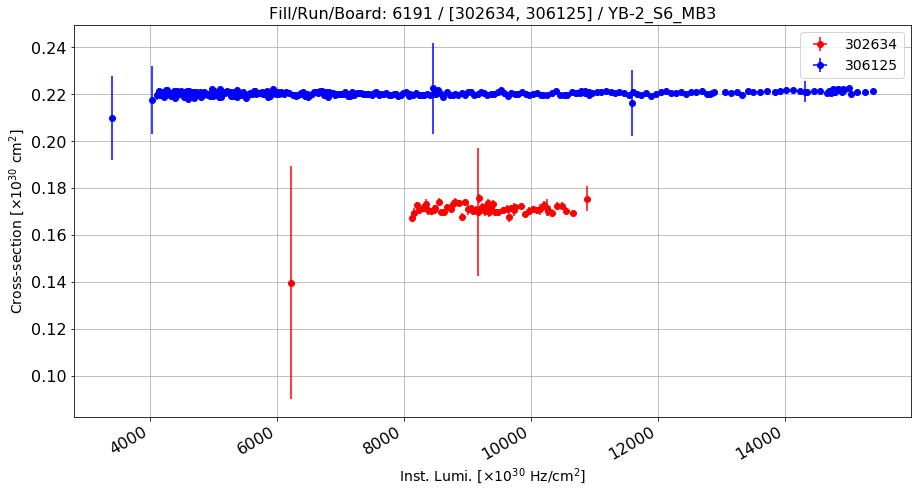

Anomalous CS: 0.170772049957 , Normal CS: 0.220386902886 , Ratio: 0.225126140801


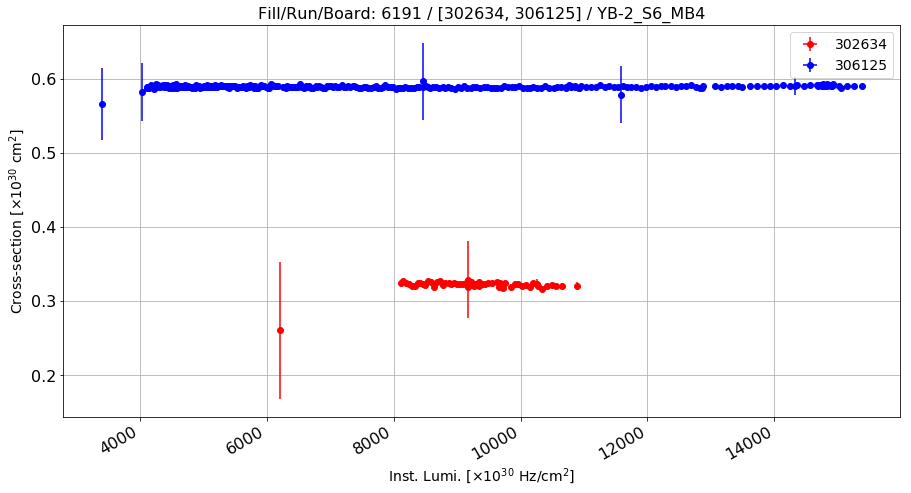

Anomalous CS: 0.32185280389 , Normal CS: 0.589389721012 , Ratio: 0.453921925654


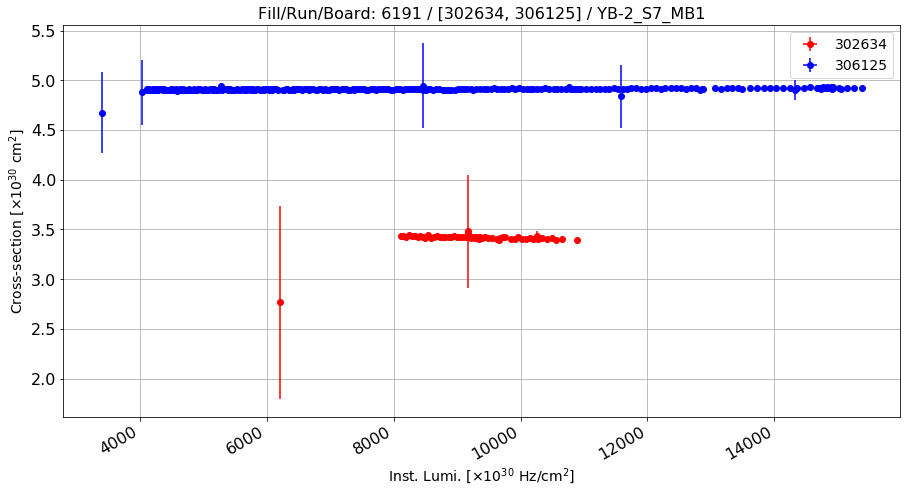

Anomalous CS: 3.41076162405 , Normal CS: 4.91080958988 , Ratio: 0.305458384889


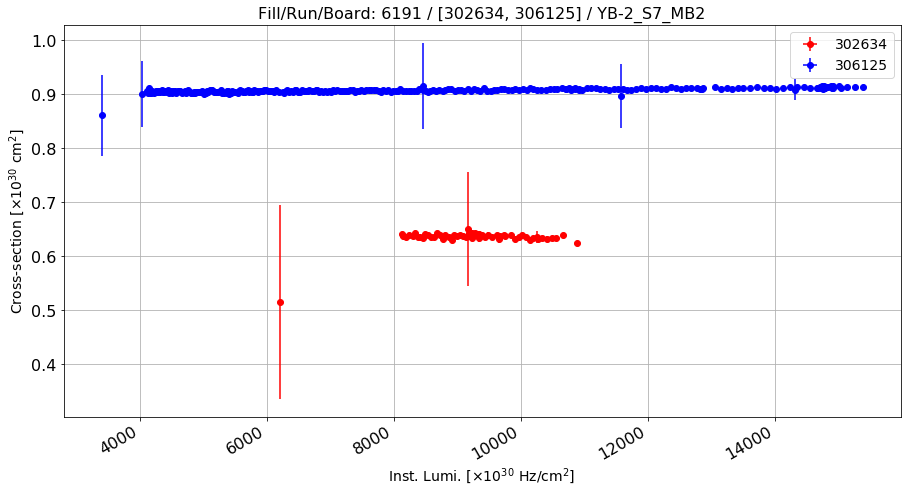

Anomalous CS: 0.635479454261 , Normal CS: 0.907505506073 , Ratio: 0.299751406456


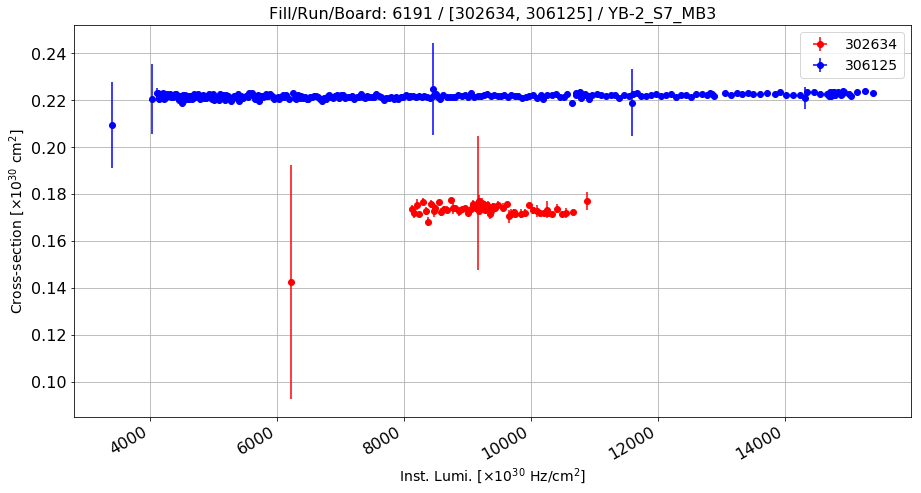

Anomalous CS: 0.173104280445 , Normal CS: 0.221744251724 , Ratio: 0.219351667071


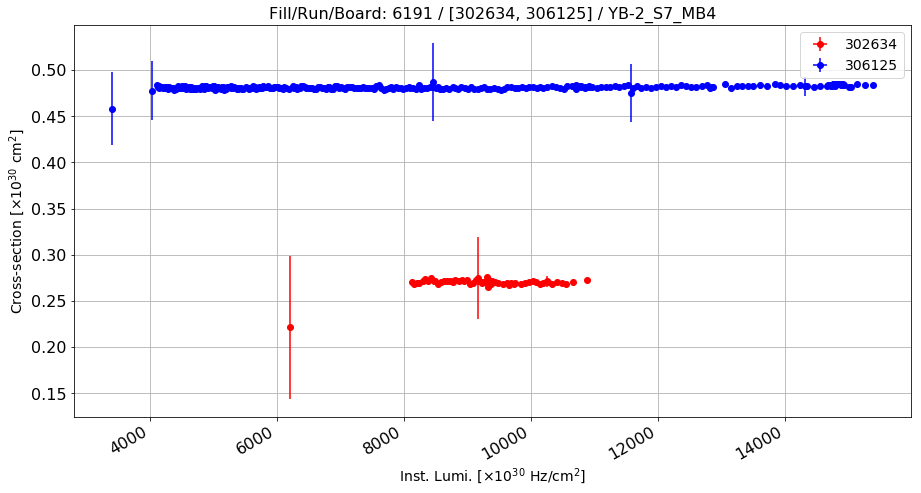

Anomalous CS: 0.269661938279 , Normal CS: 0.481261695538 , Ratio: 0.439677122074


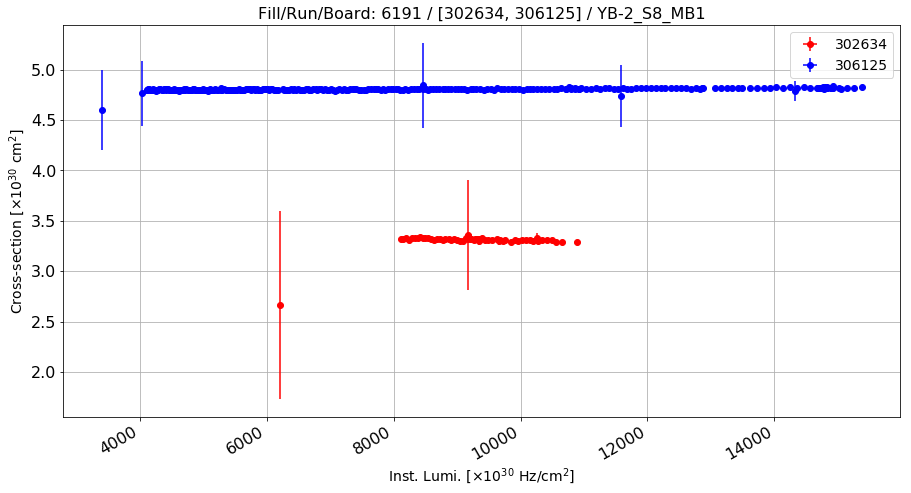

Anomalous CS: 3.30454864126 , Normal CS: 4.80432977793 , Ratio: 0.312172812023


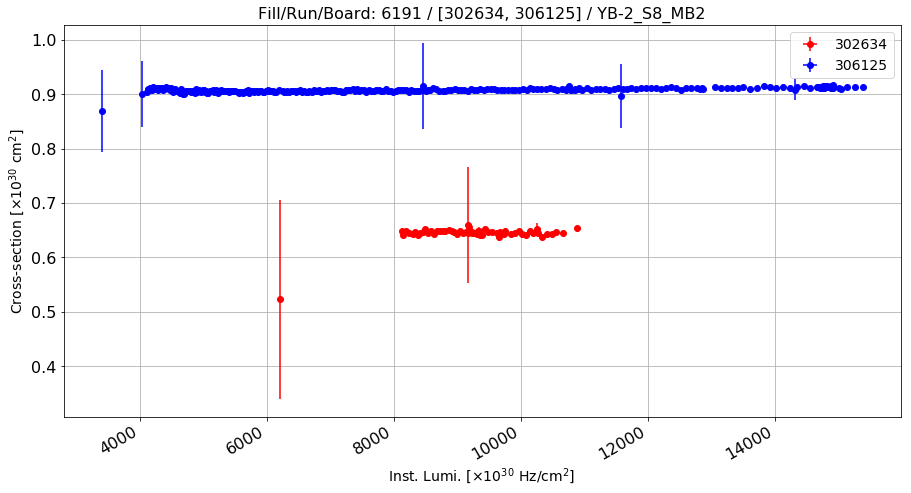

Anomalous CS: 0.644166630197 , Normal CS: 0.907995372687 , Ratio: 0.290561769835


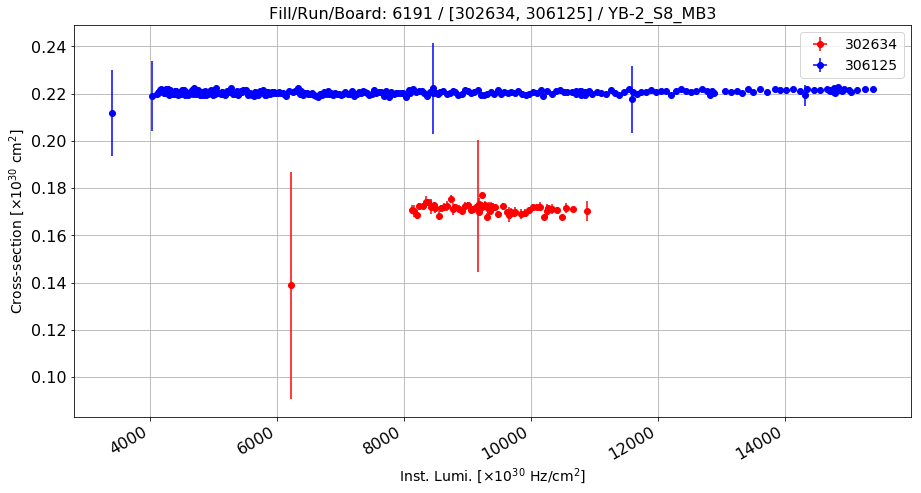

Anomalous CS: 0.170739343868 , Normal CS: 0.220520373036 , Ratio: 0.225743447114


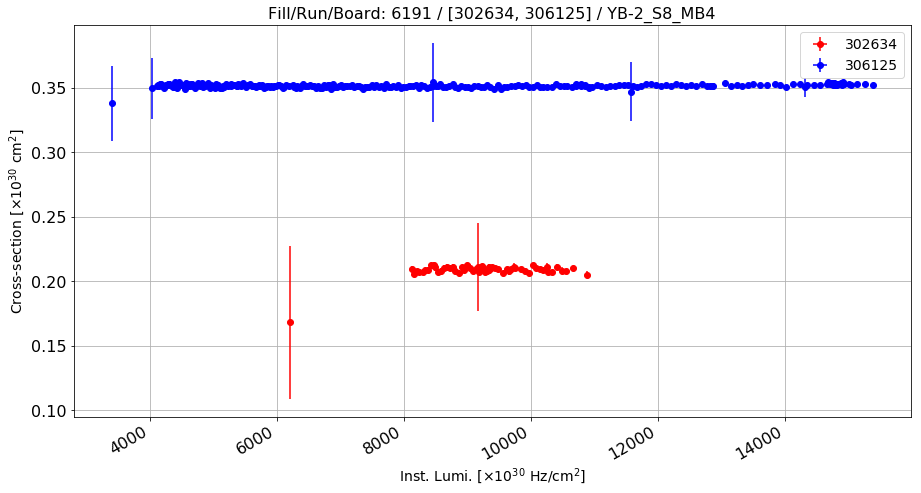

Anomalous CS: 0.208755915918 , Normal CS: 0.351796998808 , Ratio: 0.406601202893


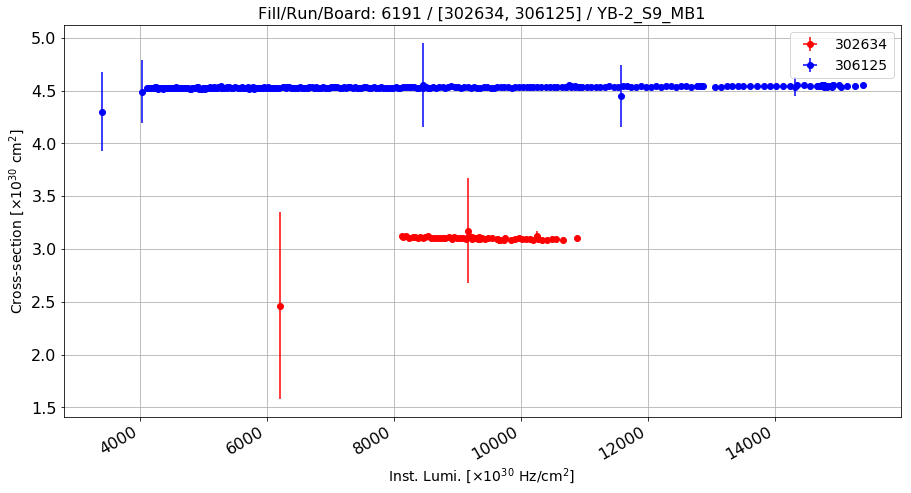

Anomalous CS: 3.09253792519 , Normal CS: 4.52981086867 , Ratio: 0.317292042682


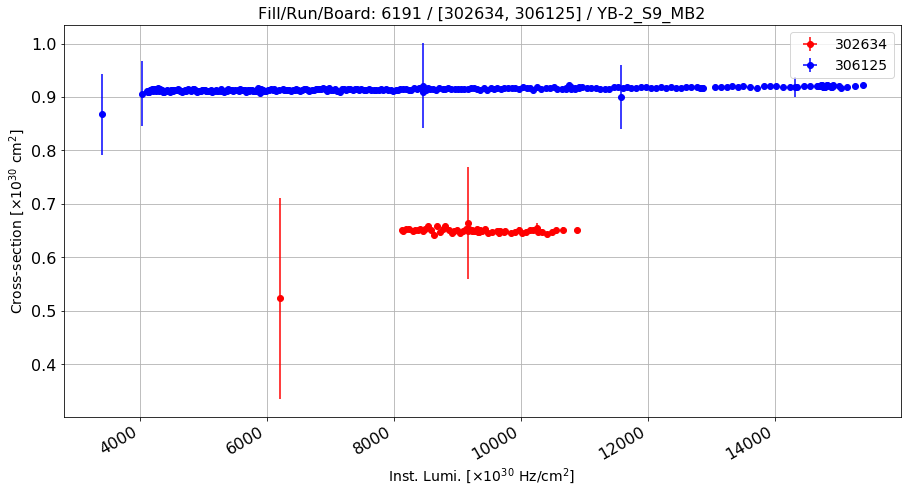

Anomalous CS: 0.648269155682 , Normal CS: 0.914699684209 , Ratio: 0.291276506515


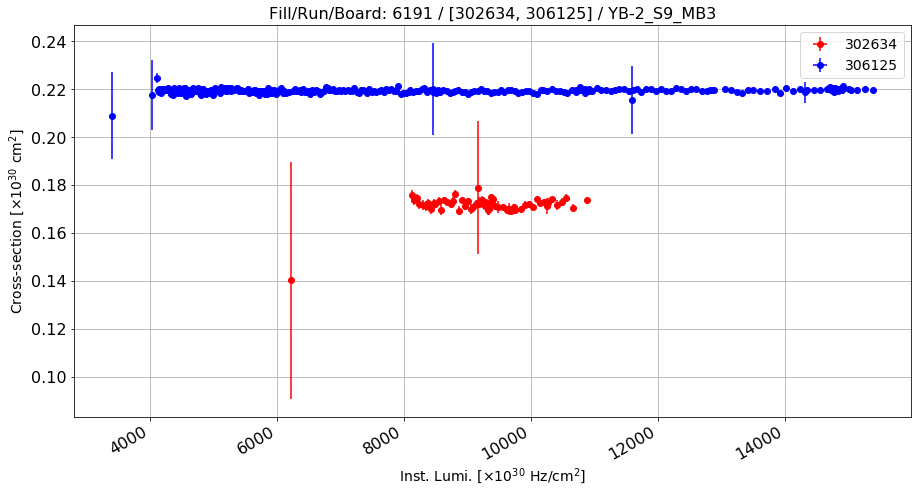

Anomalous CS: 0.171763726202 , Normal CS: 0.219451099771 , Ratio: 0.217302960061


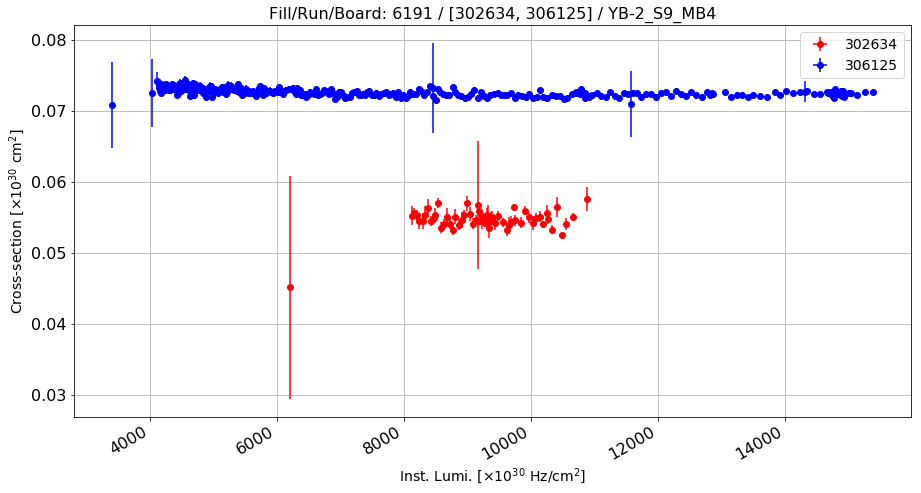

Anomalous CS: 0.0547215649844 , Normal CS: 0.0726253255928 , Ratio: 0.246522276661


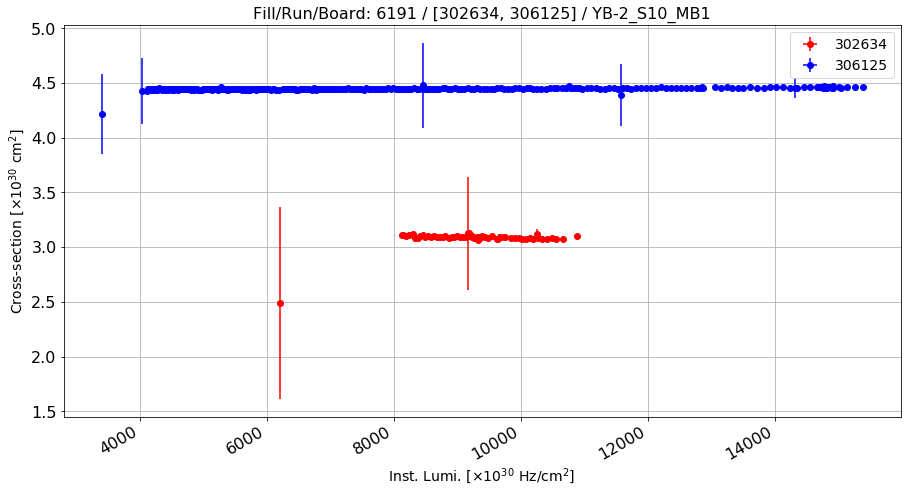

Anomalous CS: 3.08257617609 , Normal CS: 4.44769780213 , Ratio: 0.306927693105


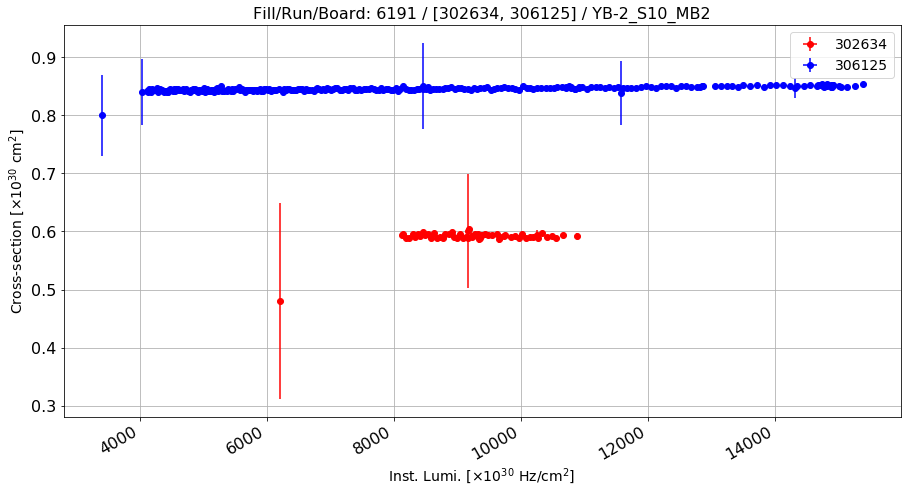

Anomalous CS: 0.590881363598 , Normal CS: 0.845786177642 , Ratio: 0.301382099616


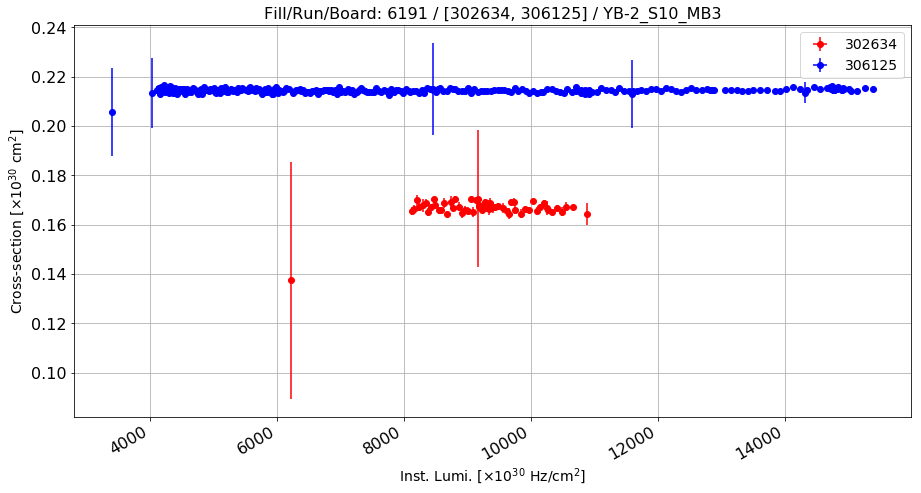

Anomalous CS: 0.166676699529 , Normal CS: 0.214480511953 , Ratio: 0.22288184595


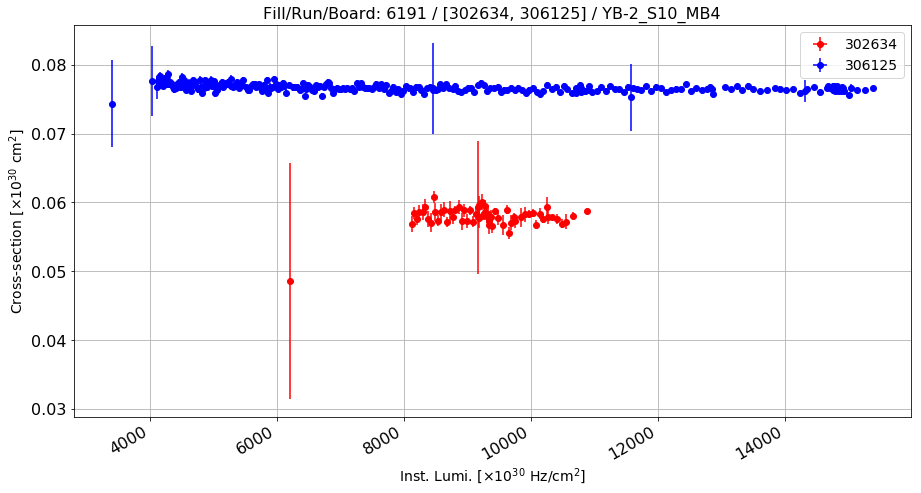

Anomalous CS: 0.0579363351179 , Normal CS: 0.0767101350807 , Ratio: 0.244736890934


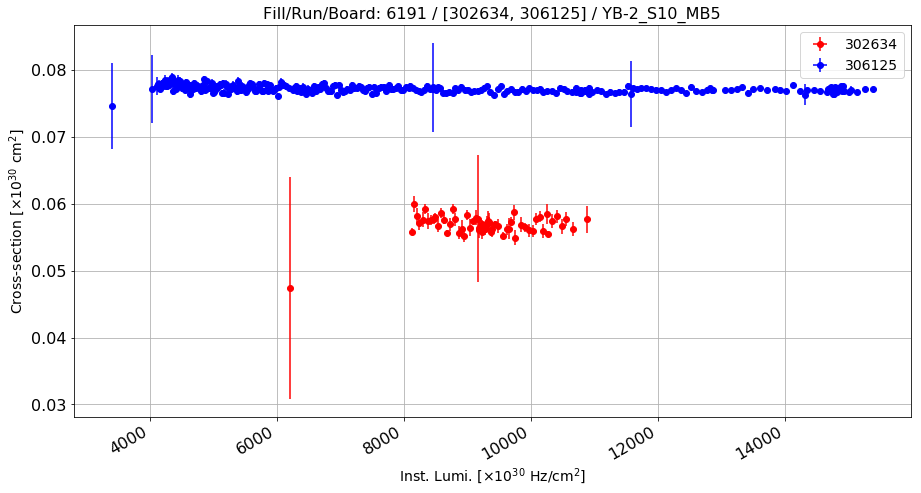

Anomalous CS: 0.0568637687939 , Normal CS: 0.0771833777263 , Ratio: 0.26326405414


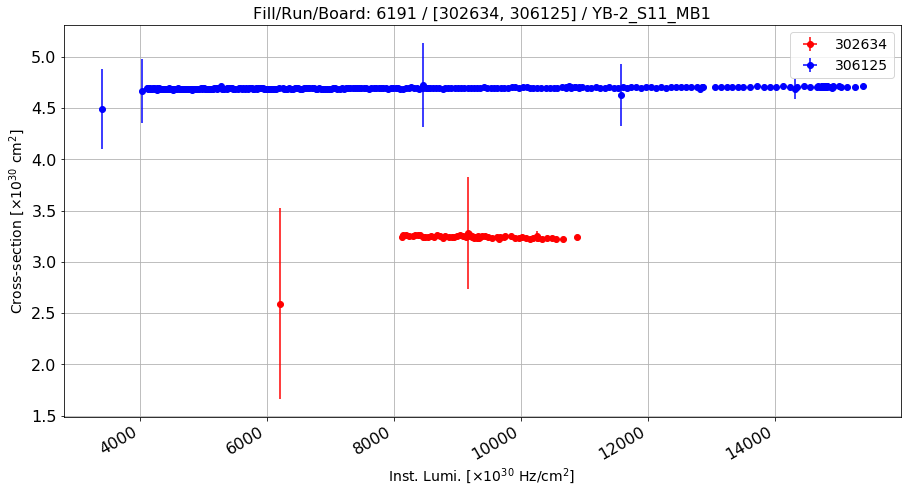

Anomalous CS: 3.23325710017 , Normal CS: 4.69363313769 , Ratio: 0.311139791859


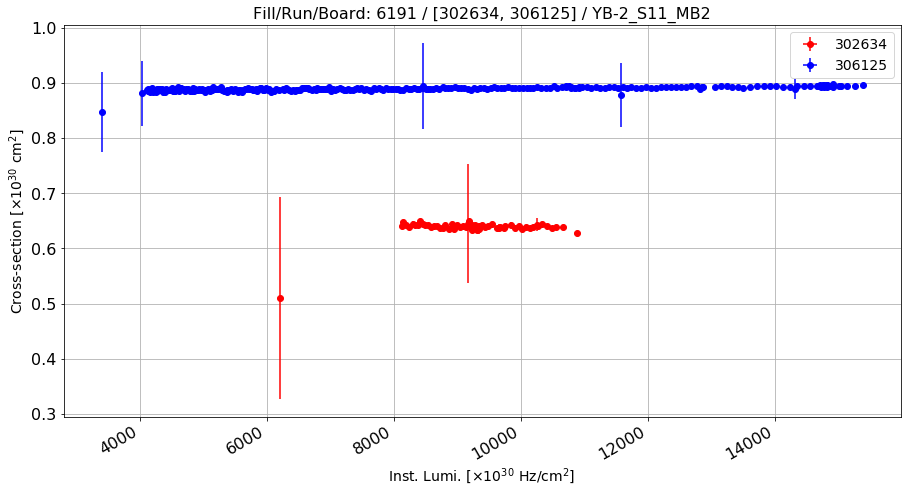

Anomalous CS: 0.638048128418 , Normal CS: 0.889482667763 , Ratio: 0.282675029495


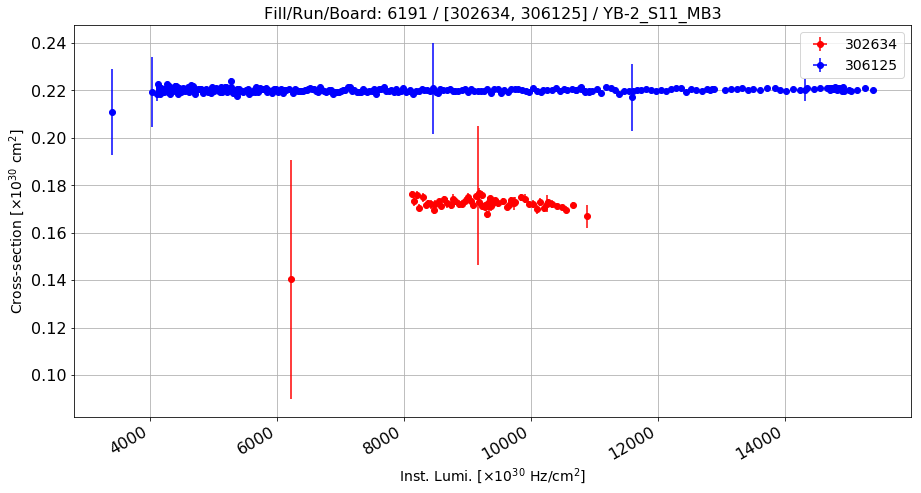

Anomalous CS: 0.172017307798 , Normal CS: 0.220068557835 , Ratio: 0.218346730263


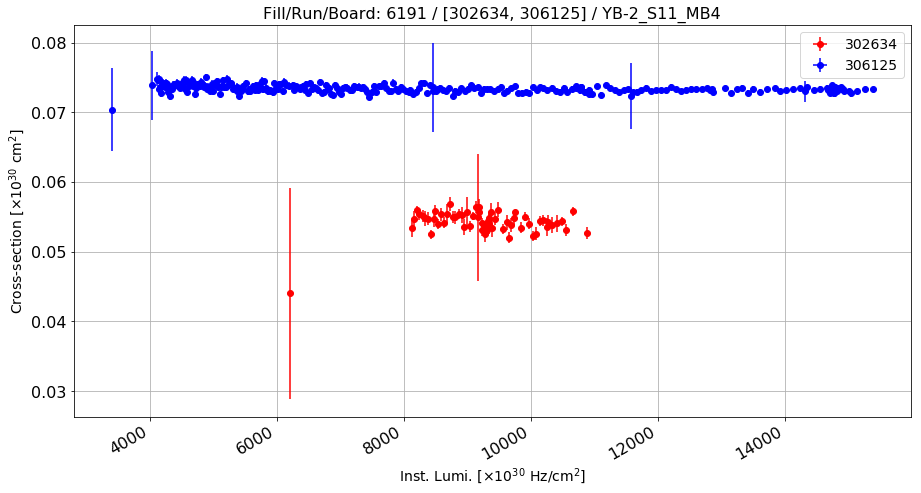

Anomalous CS: 0.0542766688024 , Normal CS: 0.0734447204056 , Ratio: 0.260986106248


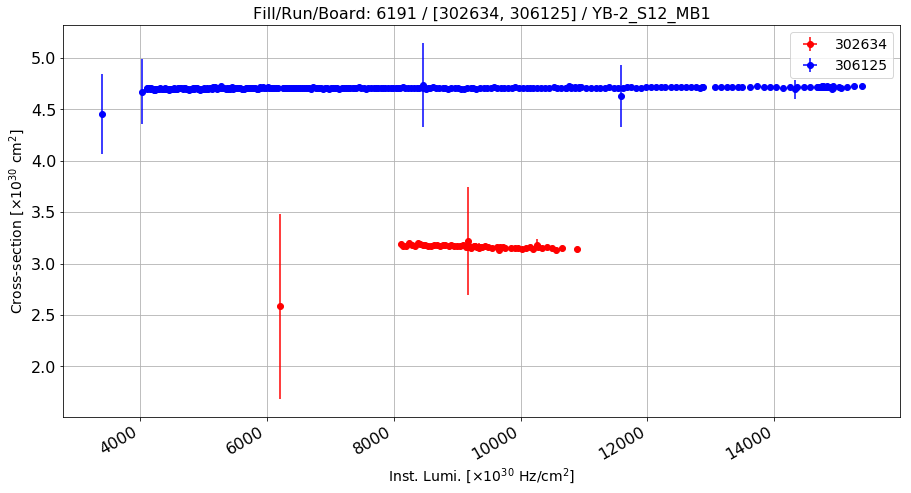

Anomalous CS: 3.15663160794 , Normal CS: 4.70600581579 , Ratio: 0.329233381448


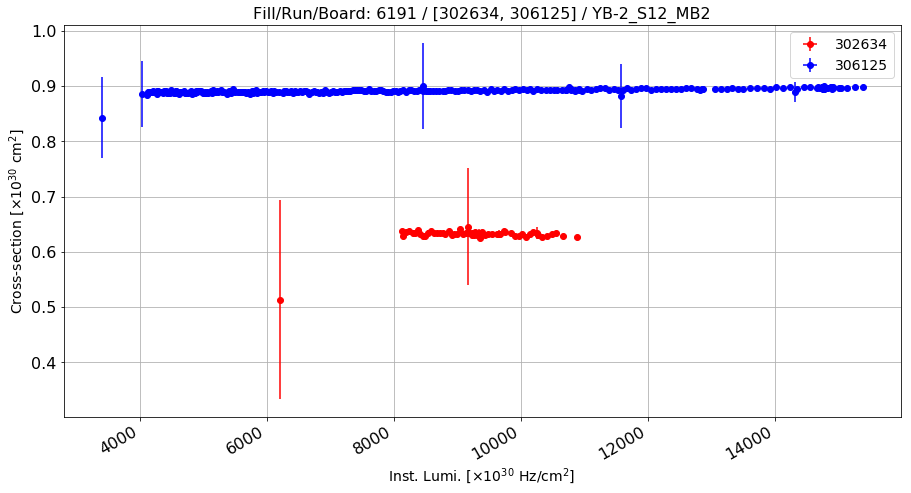

Anomalous CS: 0.631049862725 , Normal CS: 0.891604411356 , Ratio: 0.292231112041


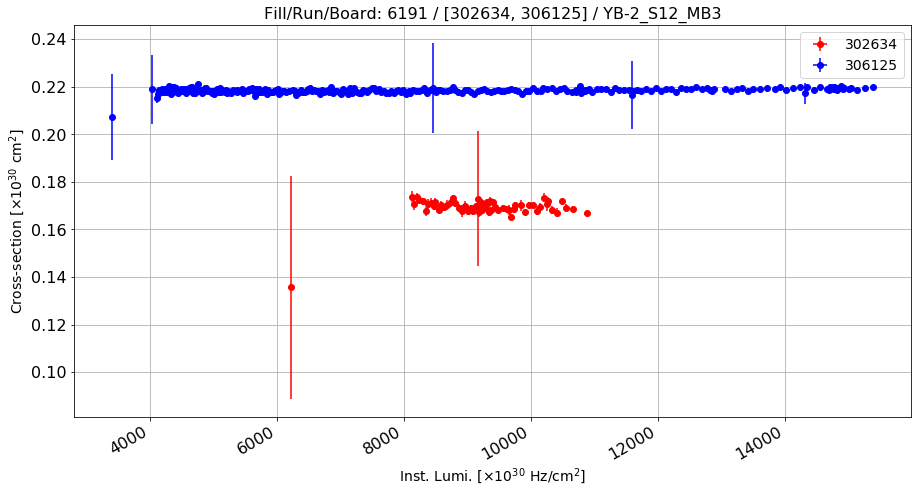

Anomalous CS: 0.169211720527 , Normal CS: 0.21840925515 , Ratio: 0.225253891321


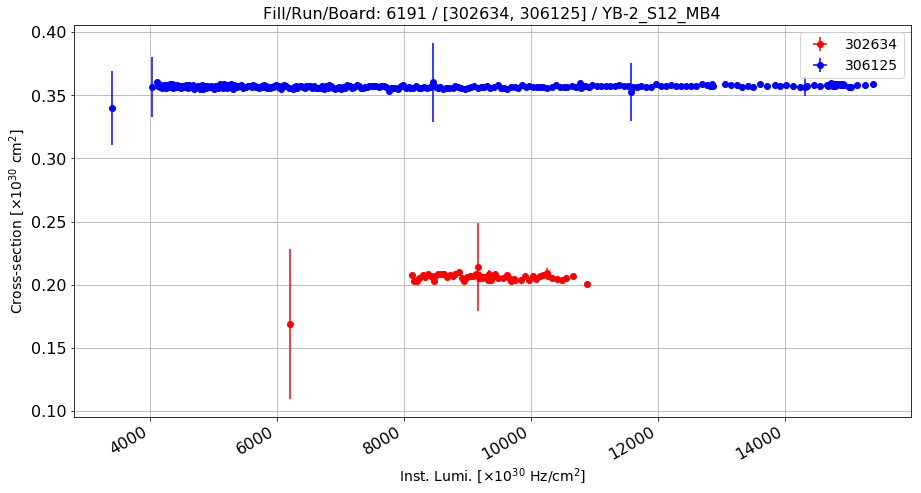

Anomalous CS: 0.205557407074 , Normal CS: 0.356938292114 , Ratio: 0.424109400376


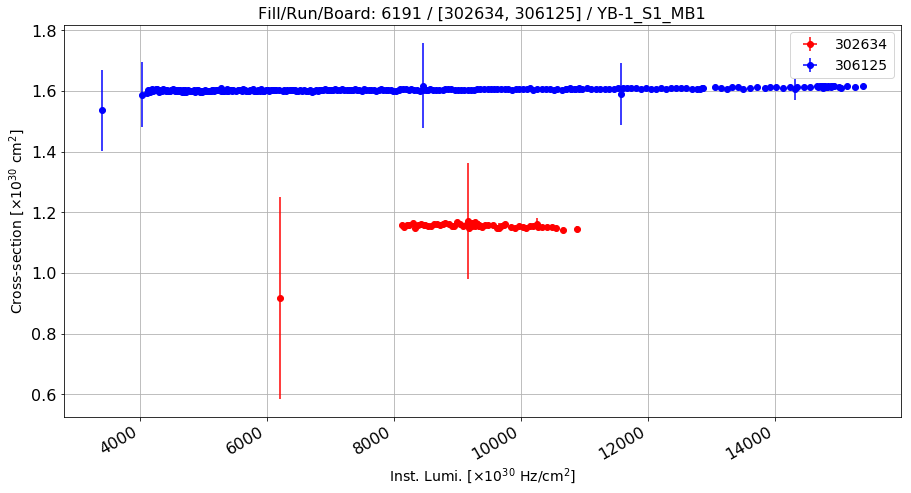

Anomalous CS: 1.15299879541 , Normal CS: 1.60535513839 , Ratio: 0.281779608858


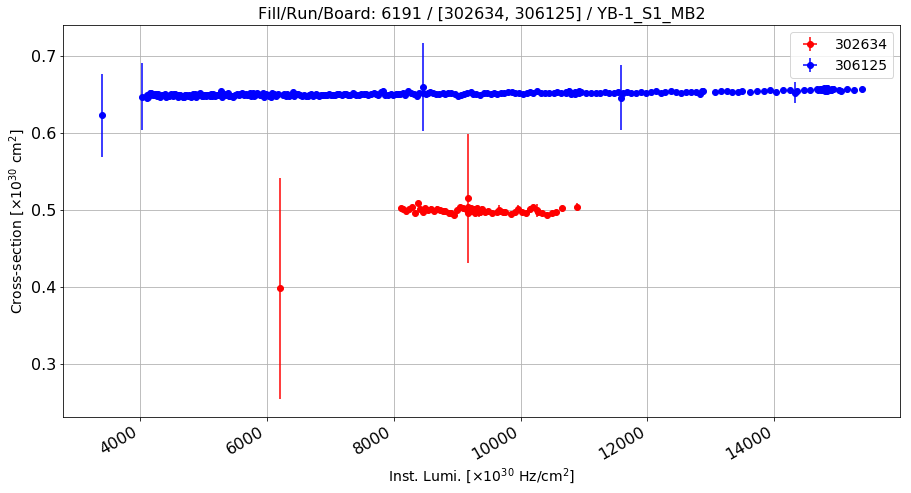

Anomalous CS: 0.497831797433 , Normal CS: 0.650717865632 , Ratio: 0.234949855035


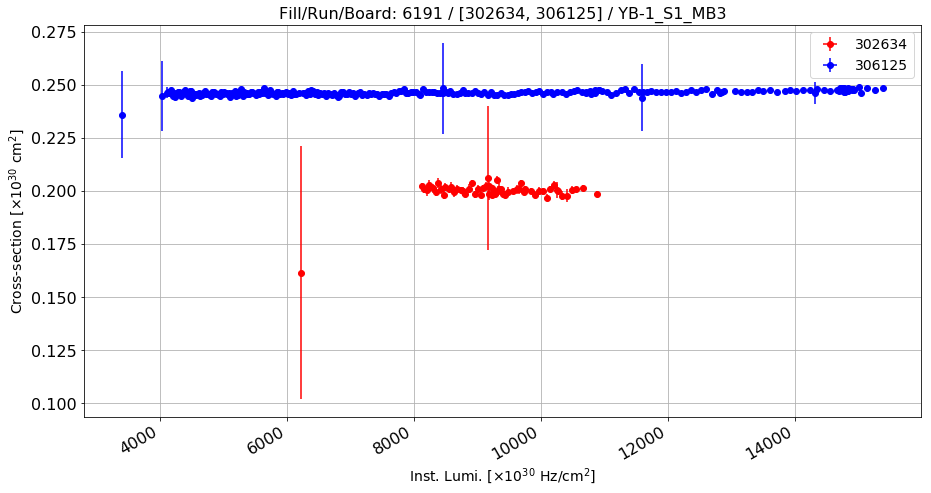

Anomalous CS: 0.199889390928 , Normal CS: 0.246372901092 , Ratio: 0.188671359385


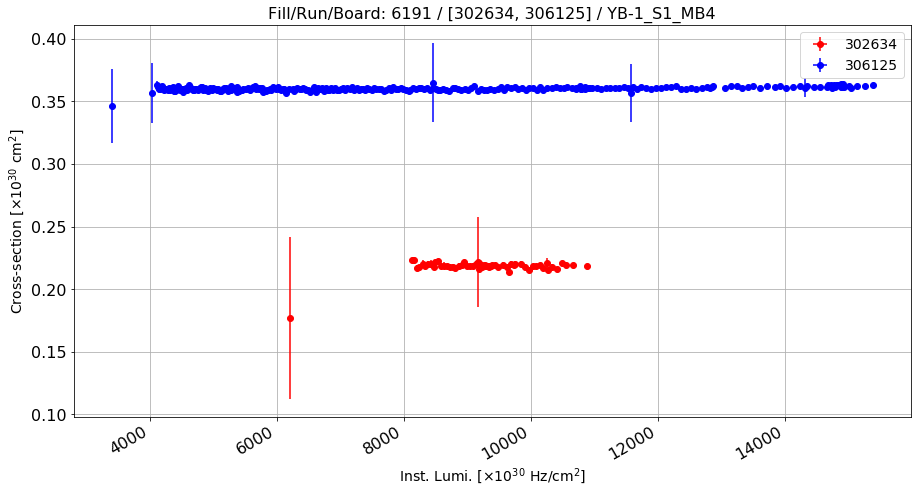

Anomalous CS: 0.218215604577 , Normal CS: 0.360328315626 , Ratio: 0.39439784465


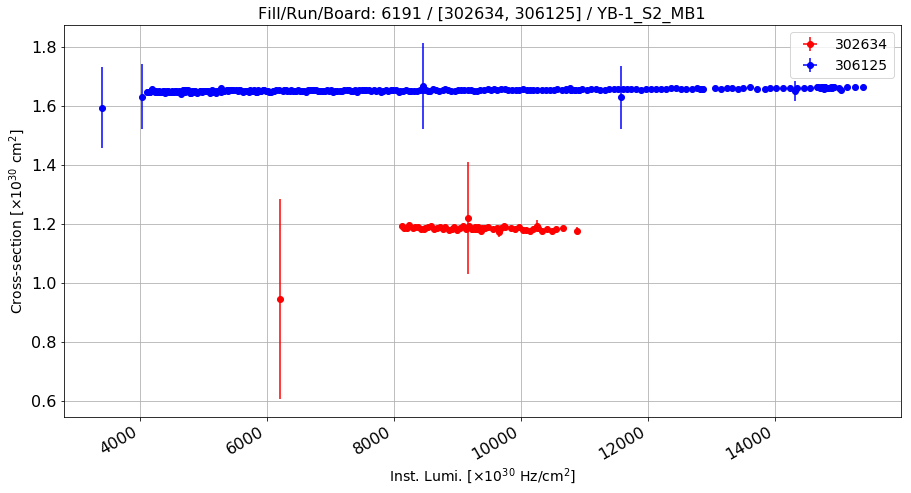

Anomalous CS: 1.18168884095 , Normal CS: 1.65352380676 , Ratio: 0.285351177821


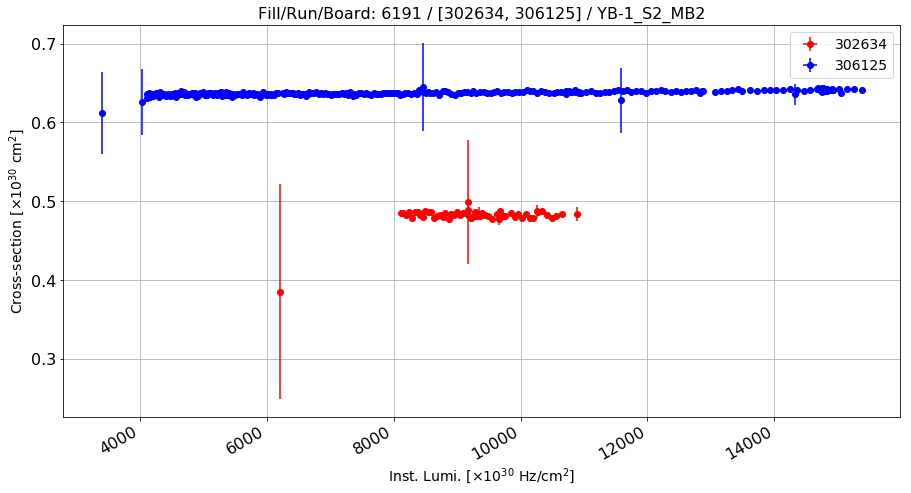

Anomalous CS: 0.481714375681 , Normal CS: 0.637459700549 , Ratio: 0.244321836713


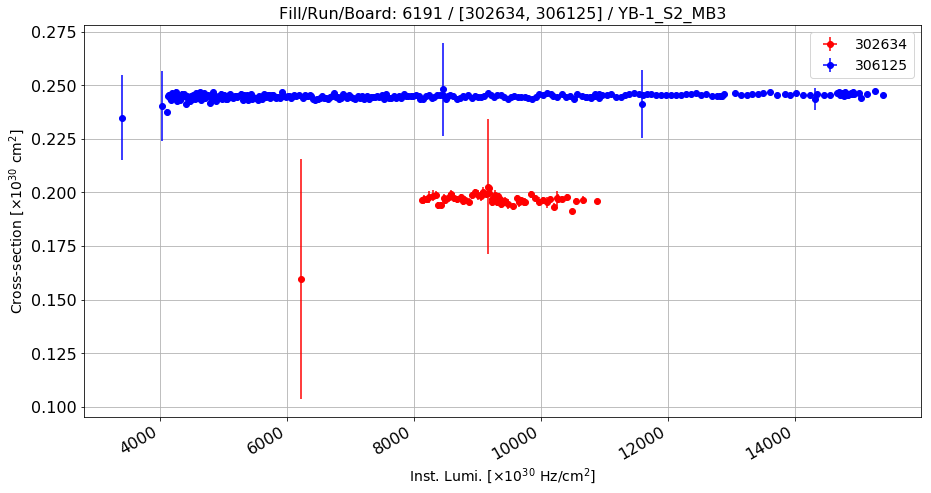

Anomalous CS: 0.196378443659 , Normal CS: 0.244911574917 , Ratio: 0.19816593509


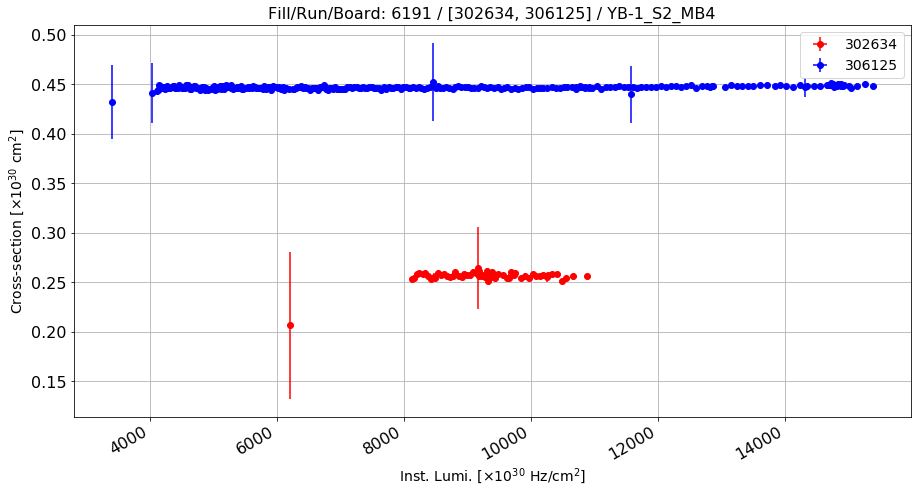

Anomalous CS: 0.256268925049 , Normal CS: 0.446962187819 , Ratio: 0.426642941992


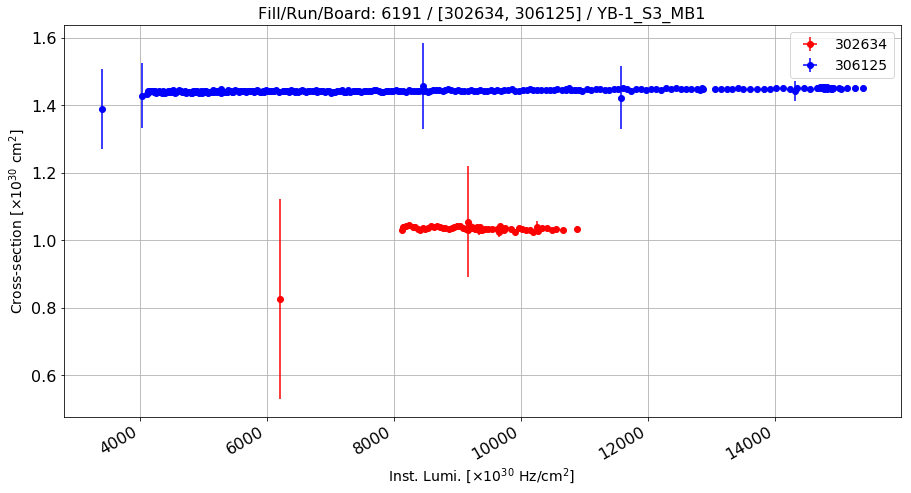

Anomalous CS: 1.03248566945 , Normal CS: 1.44397601181 , Ratio: 0.284970345069


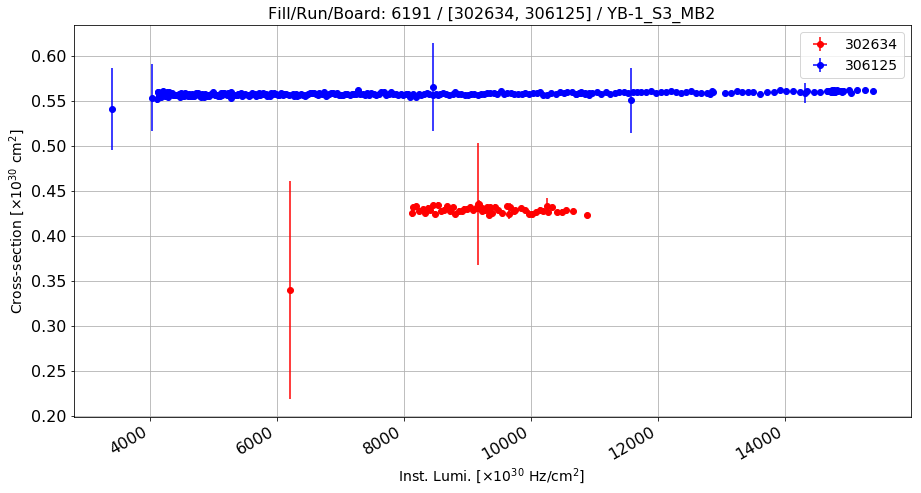

Anomalous CS: 0.427596597714 , Normal CS: 0.558042073637 , Ratio: 0.233755628986


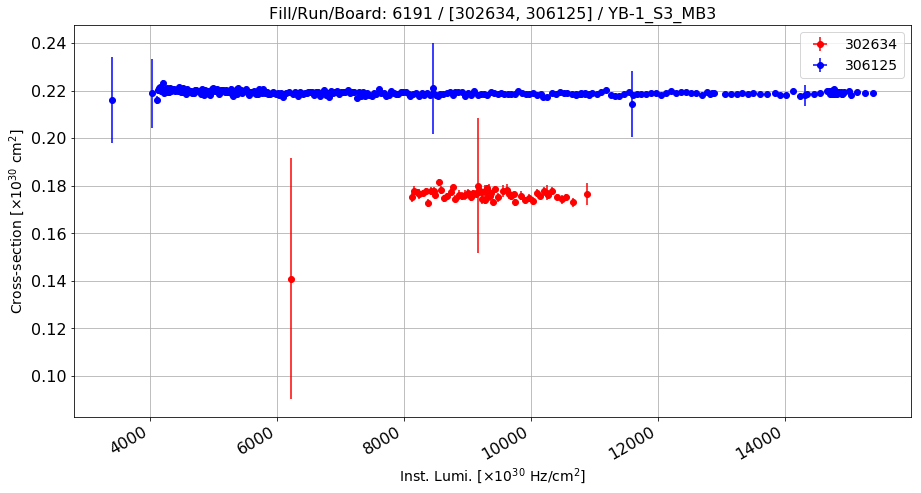

Anomalous CS: 0.17577244461 , Normal CS: 0.219096247567 , Ratio: 0.197738680776


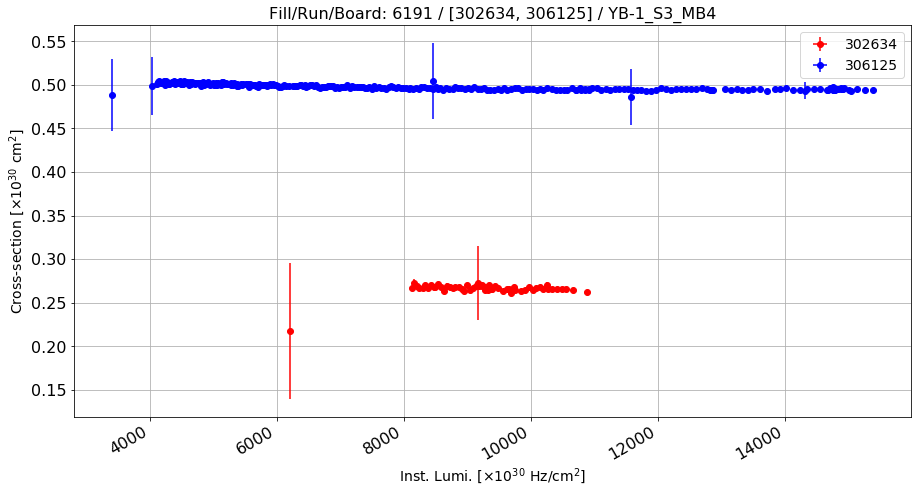

Anomalous CS: 0.266153596992 , Normal CS: 0.497813268315 , Ratio: 0.465354553741


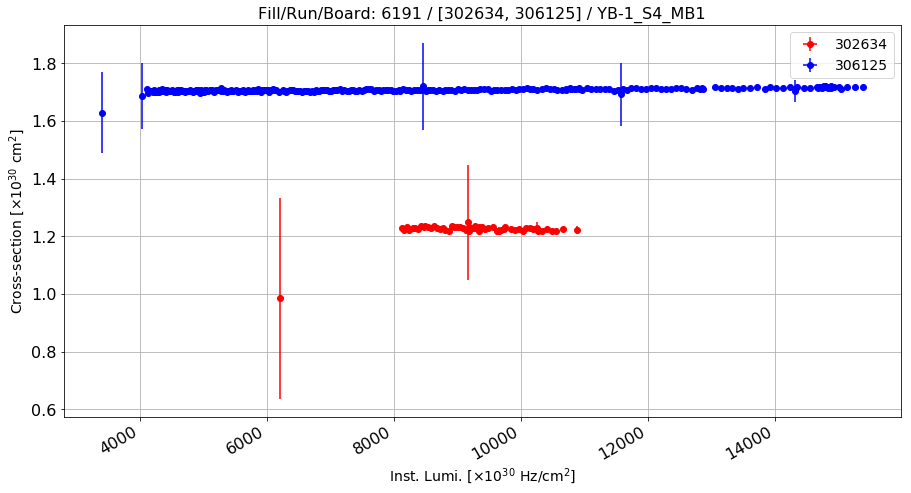

Anomalous CS: 1.22333616071 , Normal CS: 1.70751976545 , Ratio: 0.283559590082


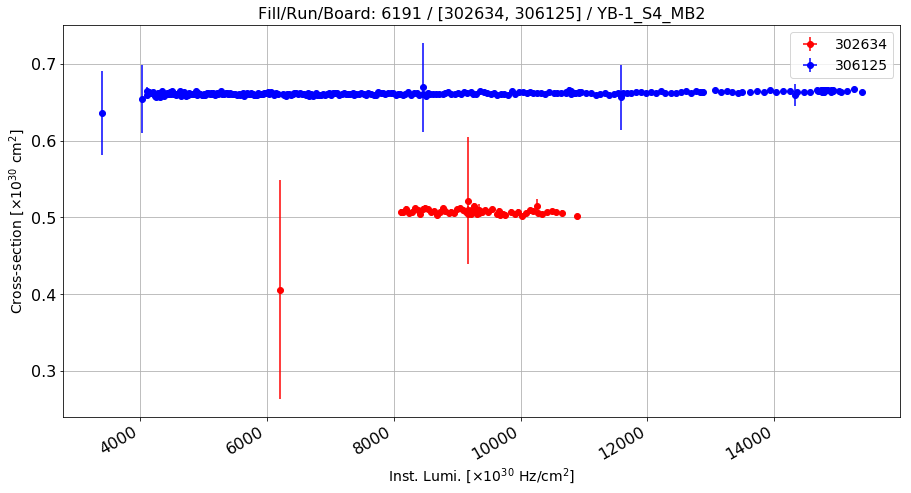

Anomalous CS: 0.506191050827 , Normal CS: 0.661547536318 , Ratio: 0.234837977563


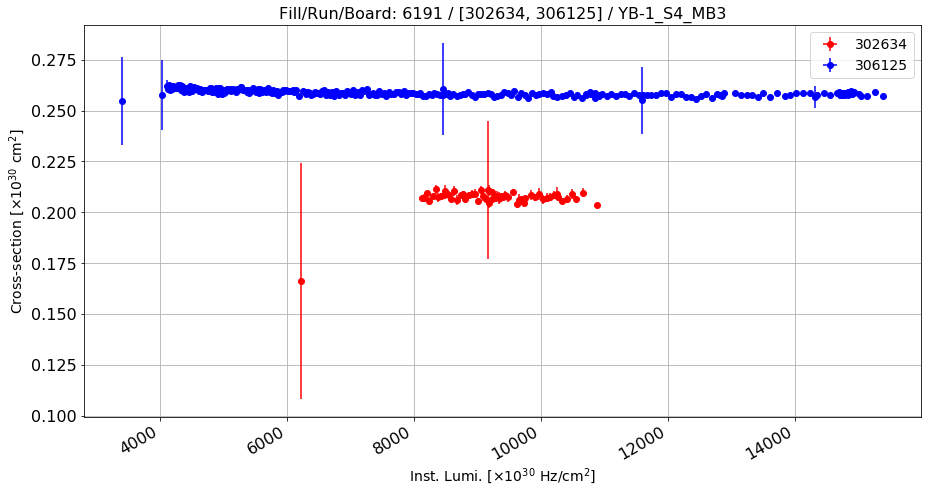

Anomalous CS: 0.207051188554 , Normal CS: 0.258817048939 , Ratio: 0.200009468455


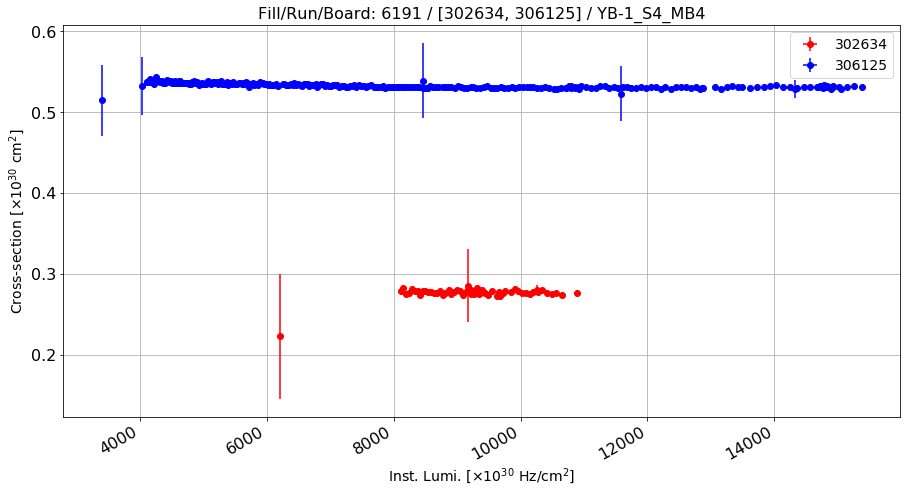

Anomalous CS: 0.276765091754 , Normal CS: 0.533209330118 , Ratio: 0.48094476949


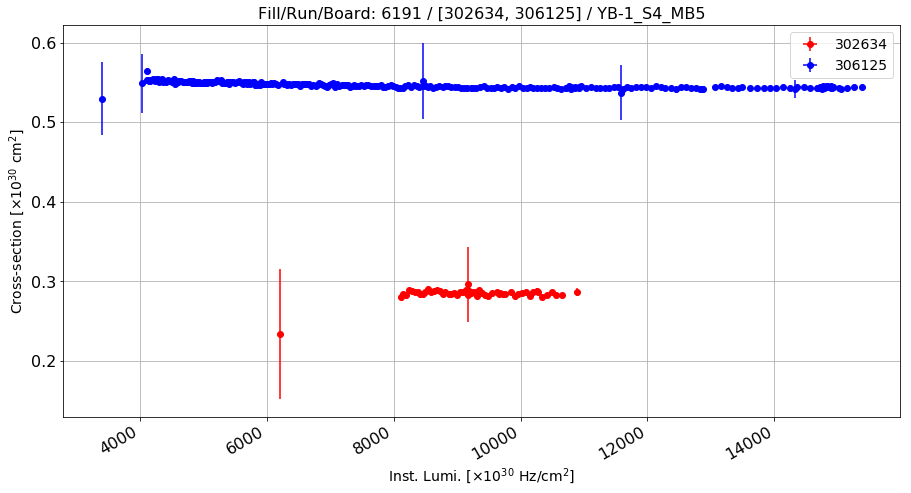

Anomalous CS: 0.284505770431 , Normal CS: 0.546708695565 , Ratio: 0.479602624323


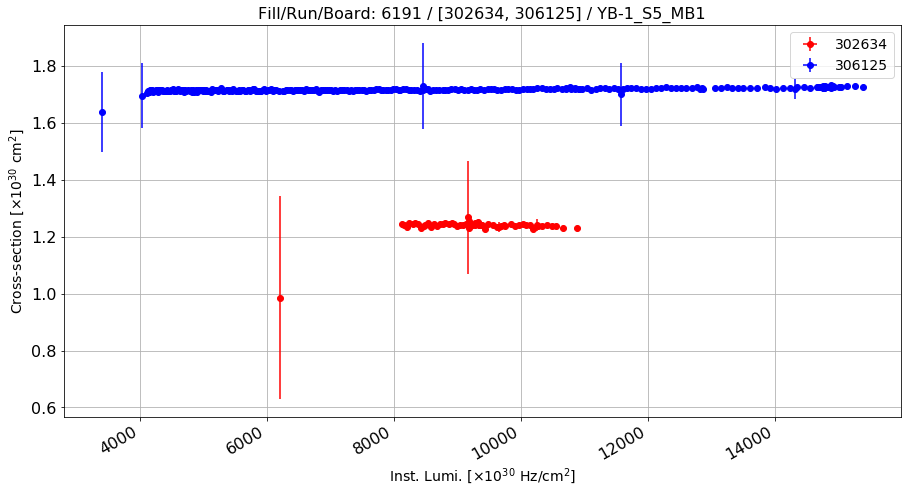

Anomalous CS: 1.23712565051 , Normal CS: 1.71696700512 , Ratio: 0.279470341118


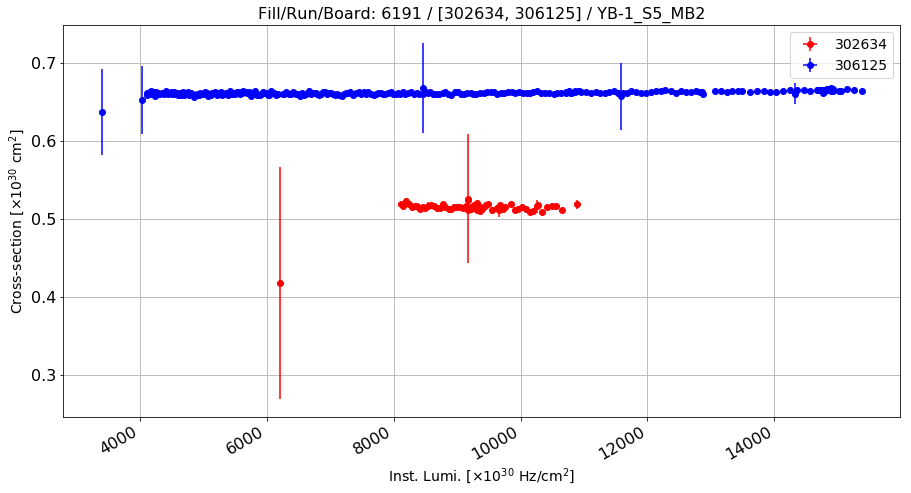

Anomalous CS: 0.513419744056 , Normal CS: 0.661158395308 , Ratio: 0.223454246819


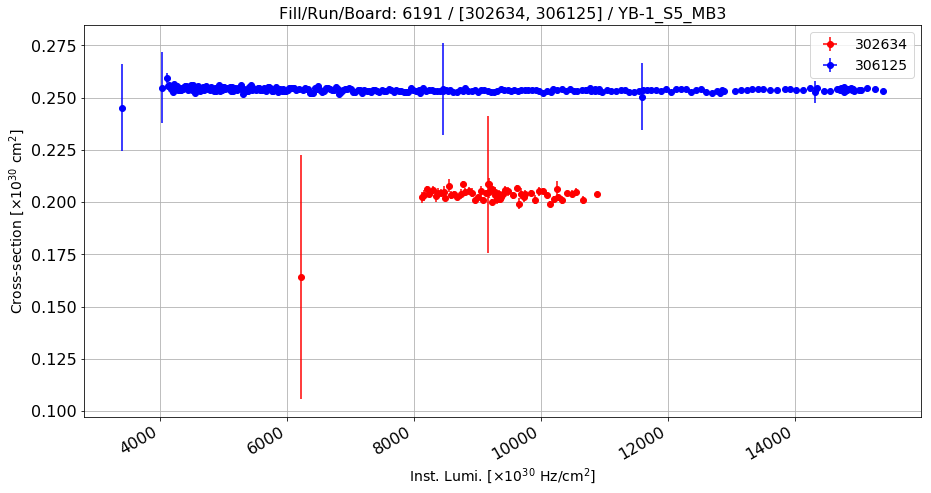

Anomalous CS: 0.203111814607 , Normal CS: 0.253750255881 , Ratio: 0.199560158464


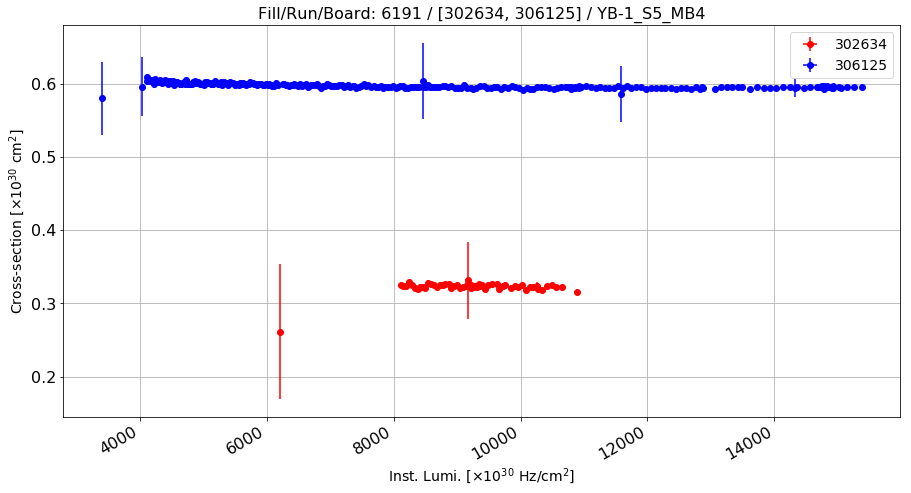

Anomalous CS: 0.322440945174 , Normal CS: 0.597622039601 , Ratio: 0.460460083785


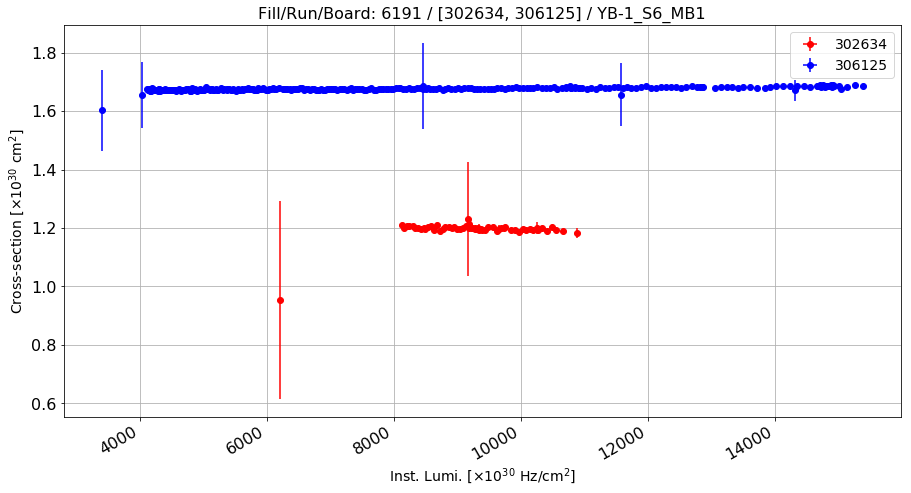

Anomalous CS: 1.19491289278 , Normal CS: 1.67662814947 , Ratio: 0.287311922353


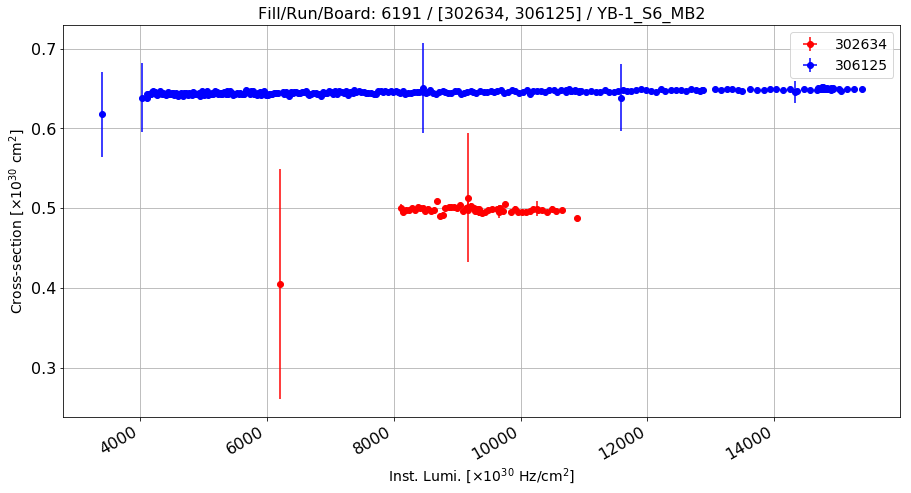

Anomalous CS: 0.496797574618 , Normal CS: 0.64539999572 , Ratio: 0.230248562268


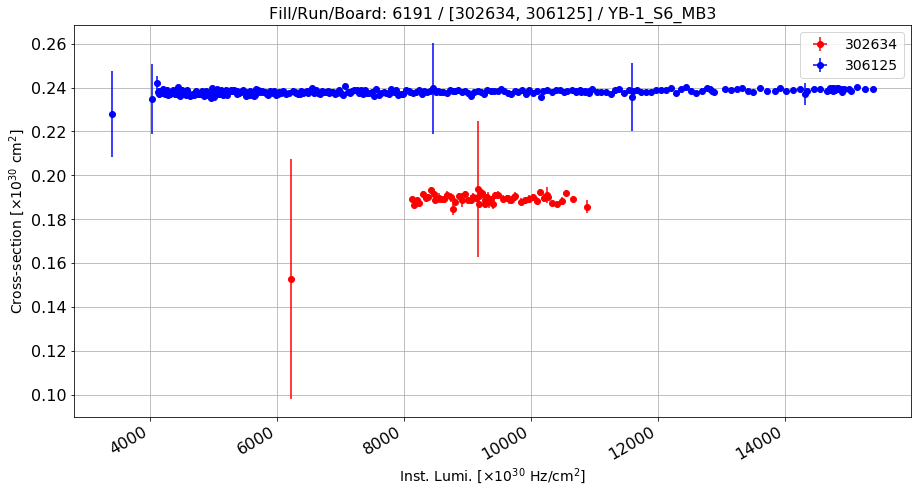

Anomalous CS: 0.188818701236 , Normal CS: 0.238080282957 , Ratio: 0.206911639672


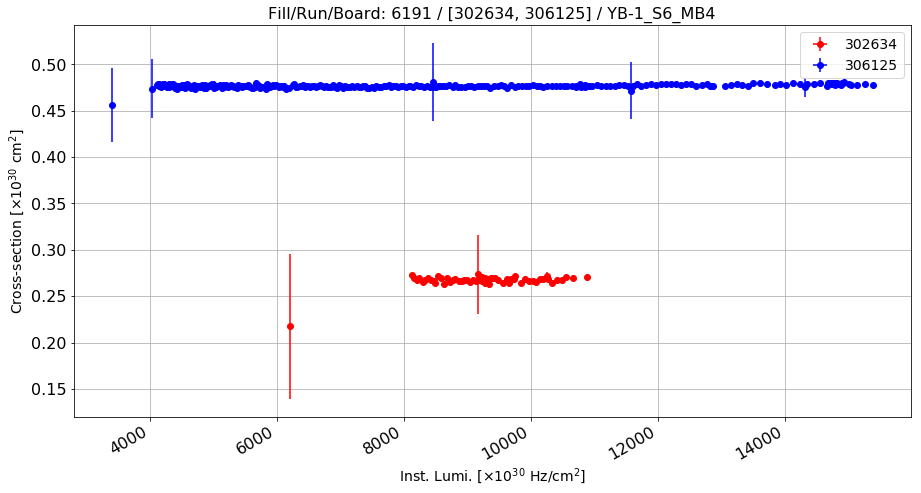

Anomalous CS: 0.266946947812 , Normal CS: 0.476846144468 , Ratio: 0.440182224584


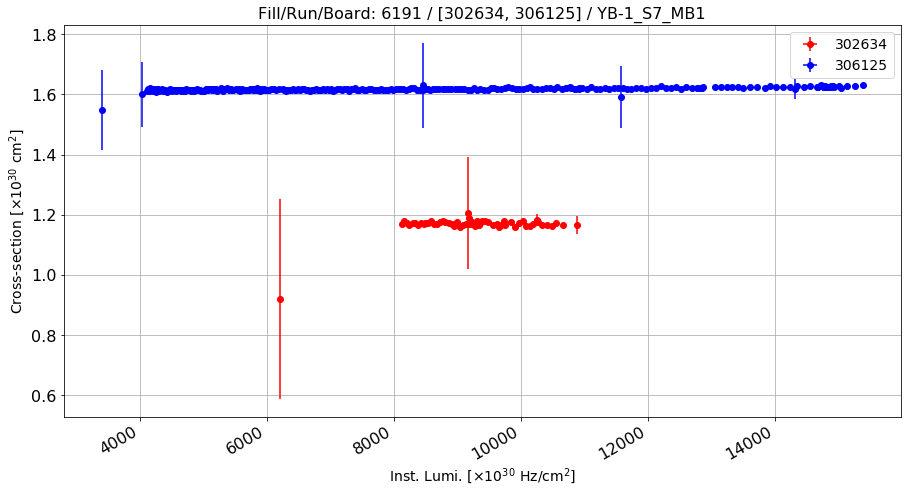

Anomalous CS: 1.16776592887 , Normal CS: 1.61789564479 , Ratio: 0.278219251881


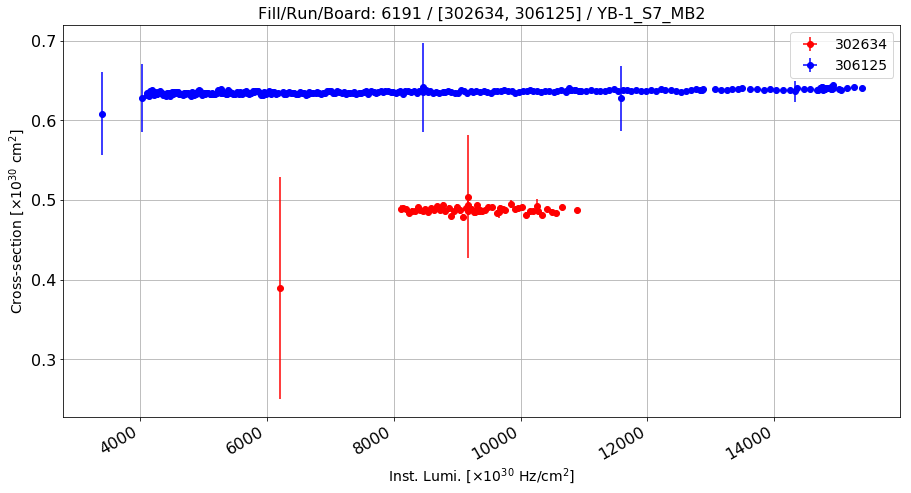

Anomalous CS: 0.486487730004 , Normal CS: 0.635986063491 , Ratio: 0.235065423707


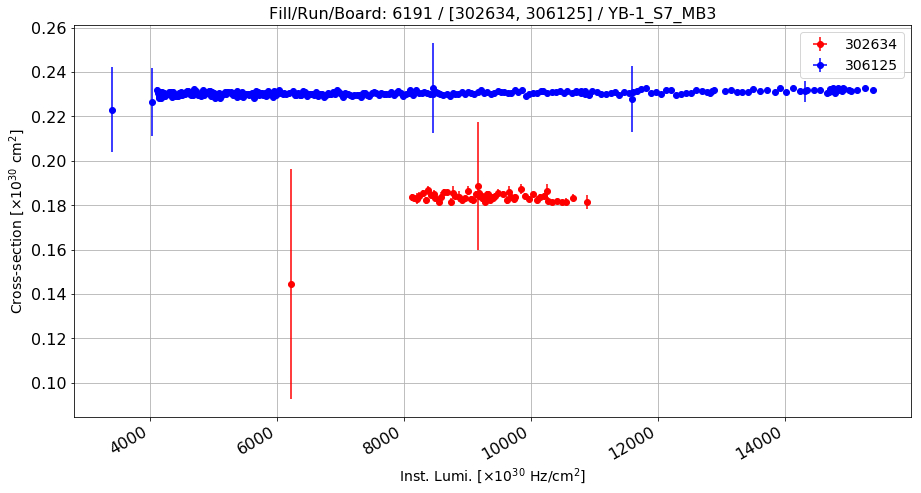

Anomalous CS: 0.183217504392 , Normal CS: 0.230559349248 , Ratio: 0.205334743573


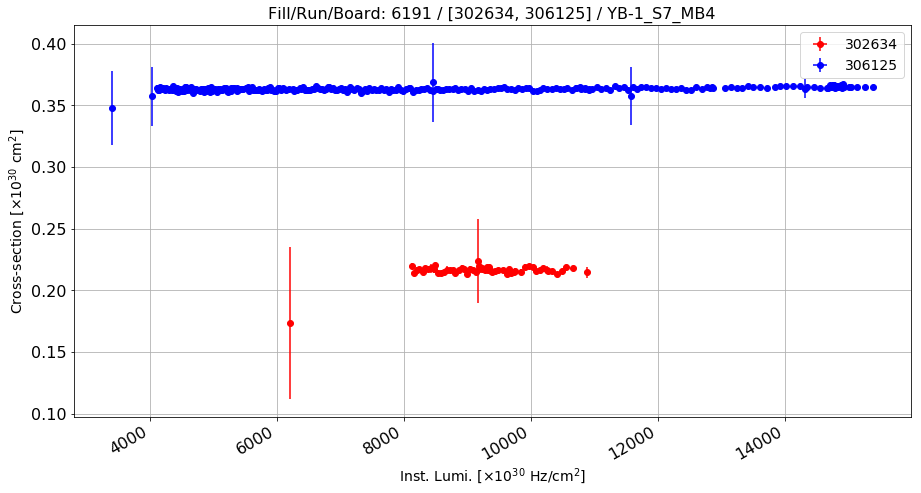

Anomalous CS: 0.215845286267 , Normal CS: 0.363249907397 , Ratio: 0.405793967536


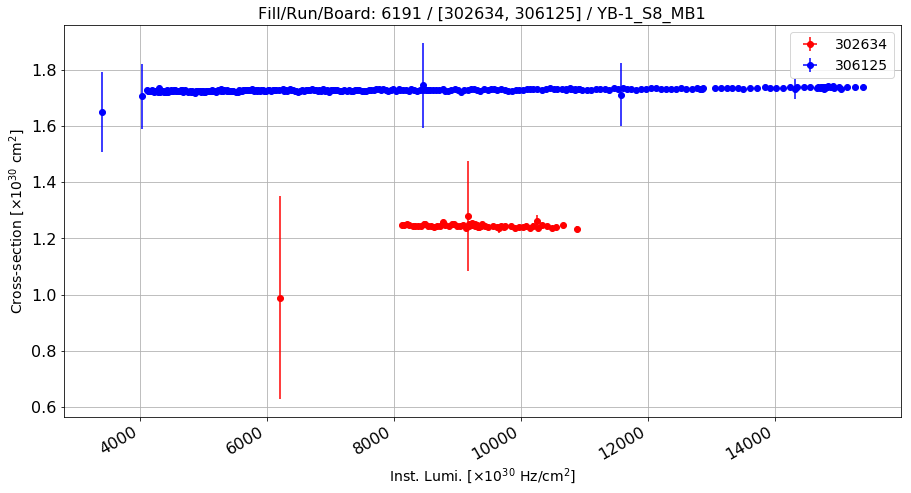

Anomalous CS: 1.24108602356 , Normal CS: 1.72760489565 , Ratio: 0.281614663927


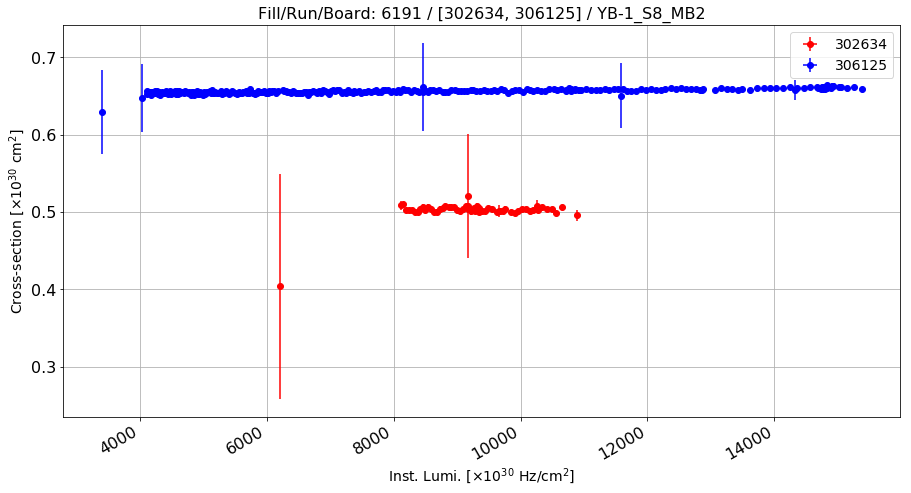

Anomalous CS: 0.501945344985 , Normal CS: 0.656456182642 , Ratio: 0.235371136326


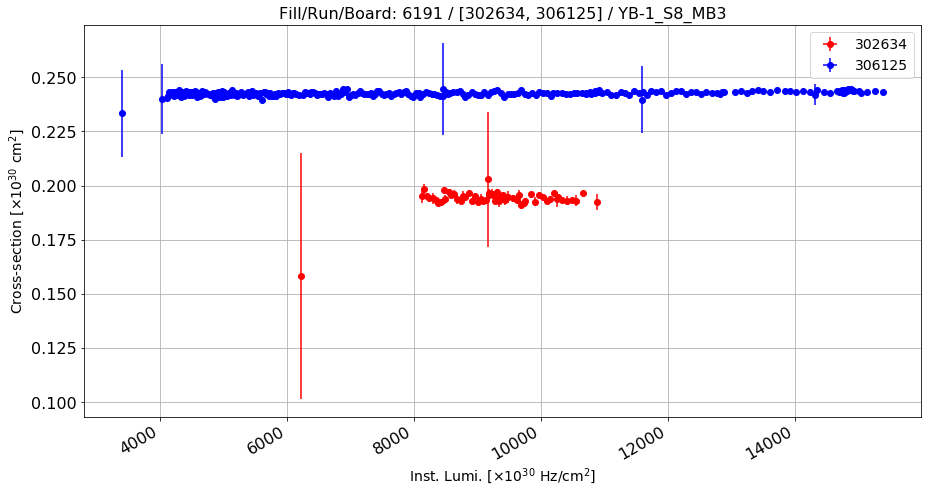

Anomalous CS: 0.193985336234 , Normal CS: 0.242589050972 , Ratio: 0.200354115499


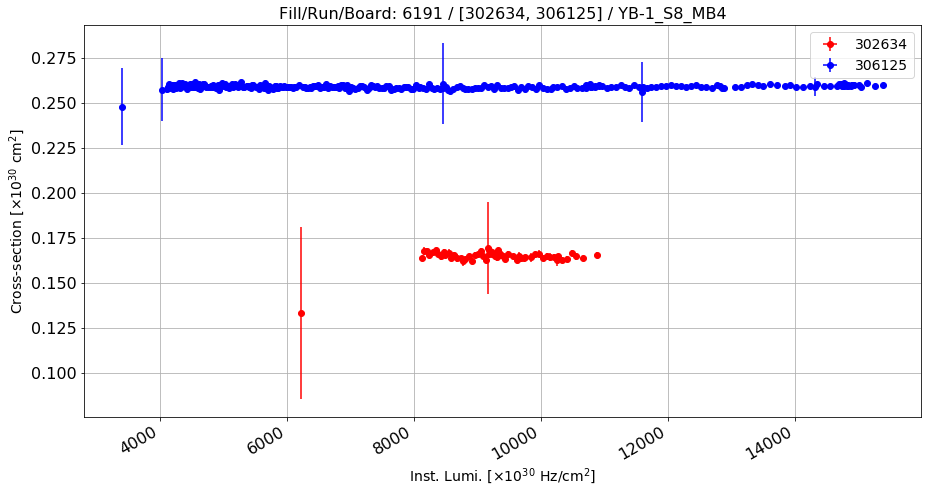

Anomalous CS: 0.164629716995 , Normal CS: 0.258818909225 , Ratio: 0.363919284385


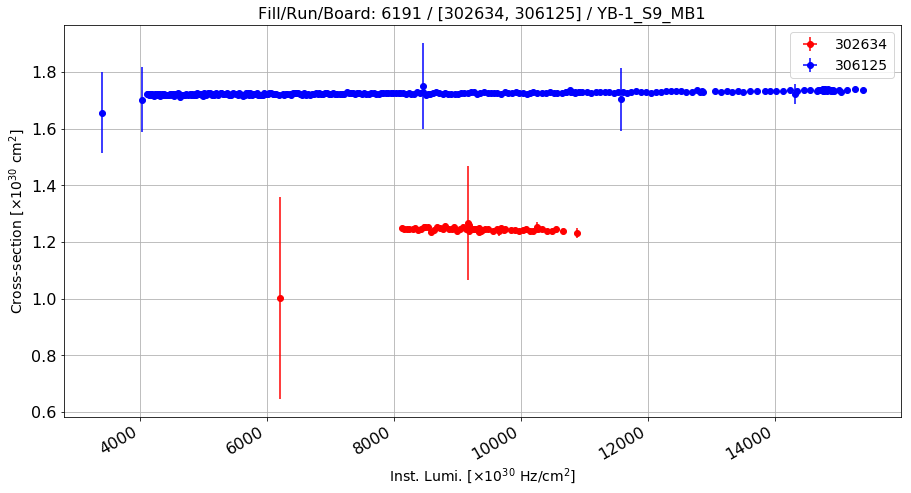

Anomalous CS: 1.24171845781 , Normal CS: 1.7257872729 , Ratio: 0.280491589371


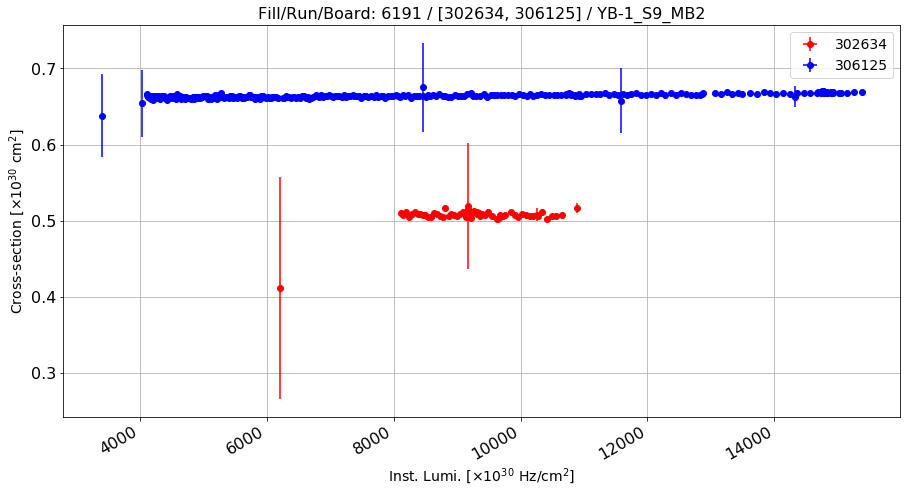

Anomalous CS: 0.506816893311 , Normal CS: 0.663998795464 , Ratio: 0.236720161582


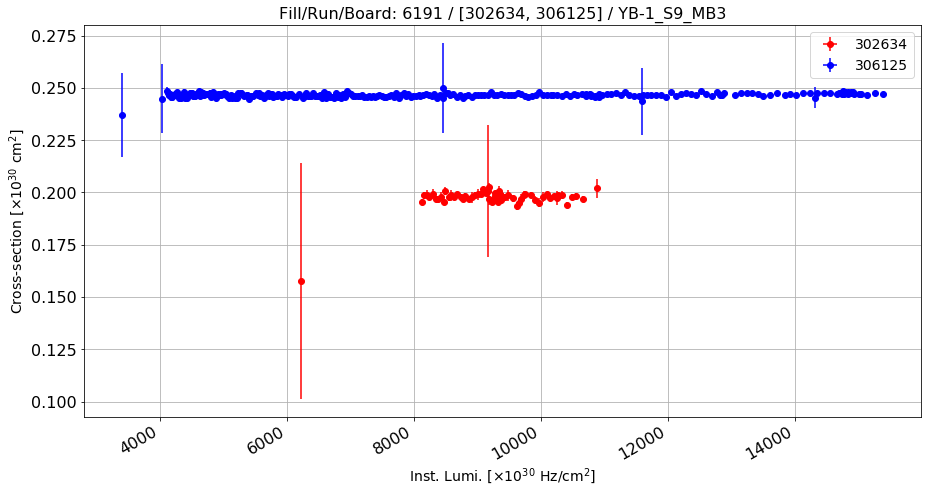

Anomalous CS: 0.197261621551 , Normal CS: 0.246642830389 , Ratio: 0.200213437223


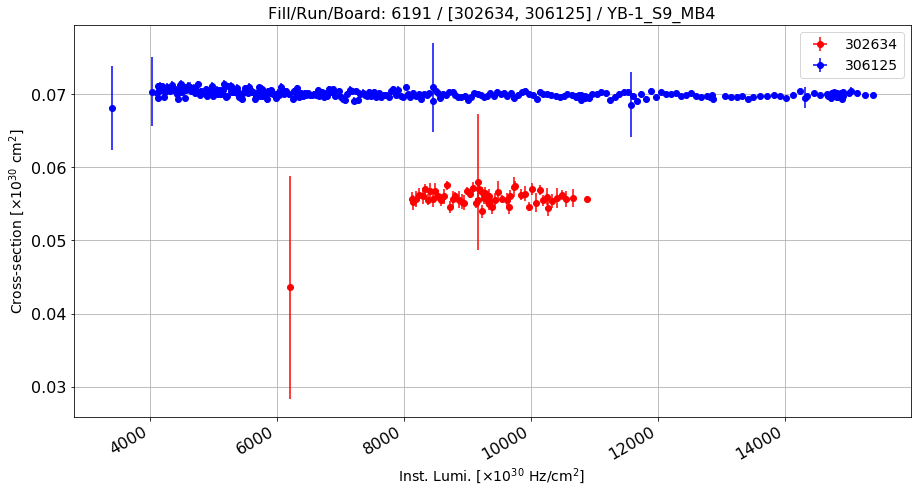

Anomalous CS: 0.0557226117896 , Normal CS: 0.0700745999464 , Ratio: 0.204810133311


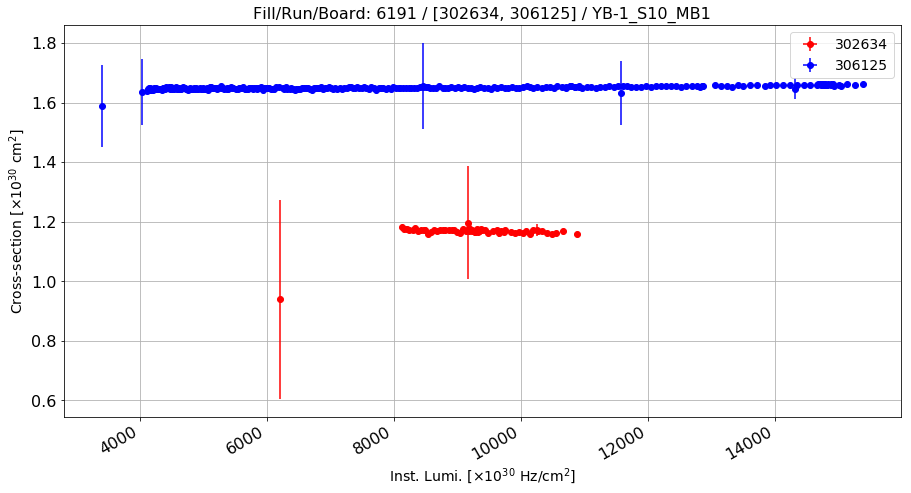

Anomalous CS: 1.16570906725 , Normal CS: 1.65041352546 , Ratio: 0.293686673506


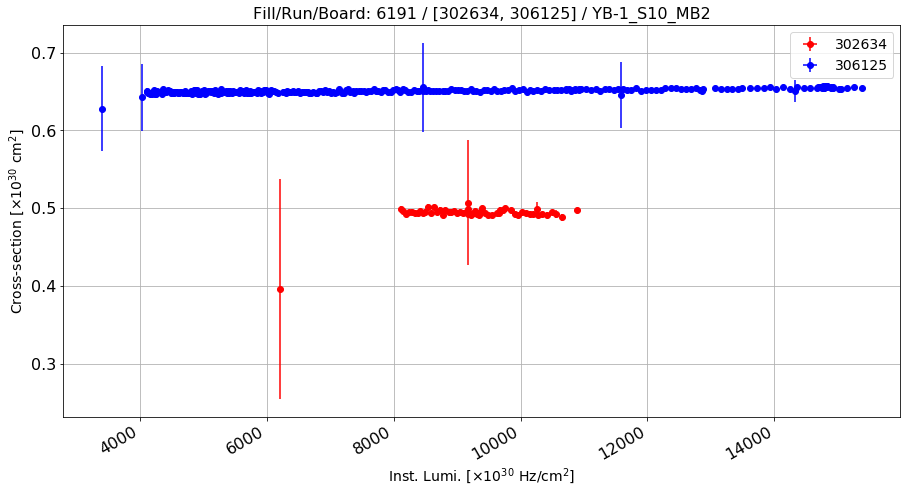

Anomalous CS: 0.493298947258 , Normal CS: 0.650918132067 , Ratio: 0.242149015435


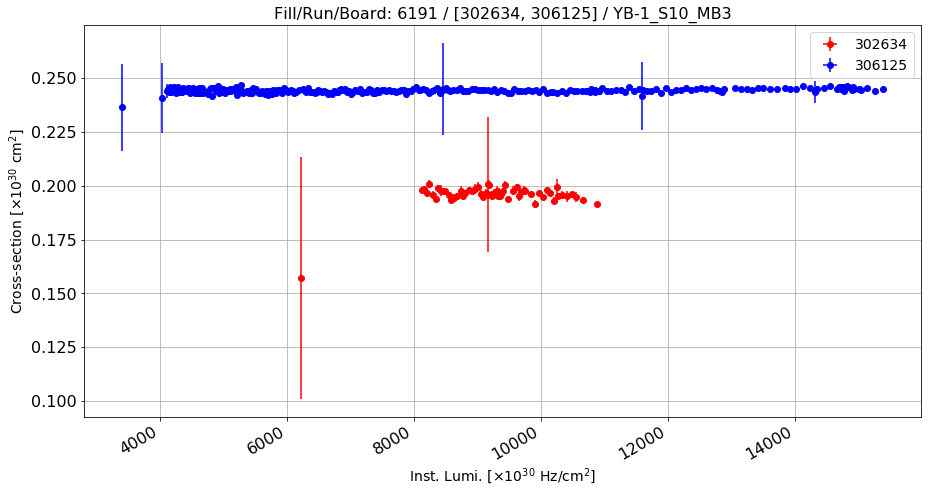

Anomalous CS: 0.195907096523 , Normal CS: 0.244294155751 , Ratio: 0.198068836642


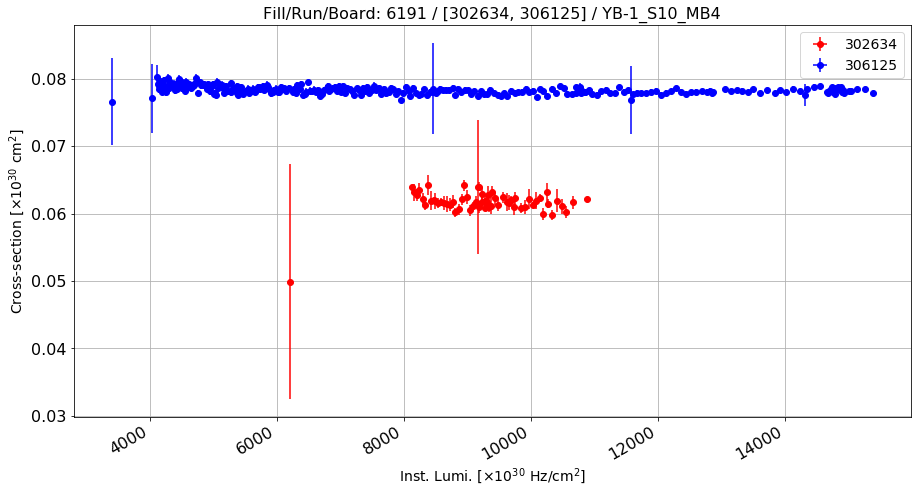

Anomalous CS: 0.0616630724282 , Normal CS: 0.0783562825657 , Ratio: 0.213042395464


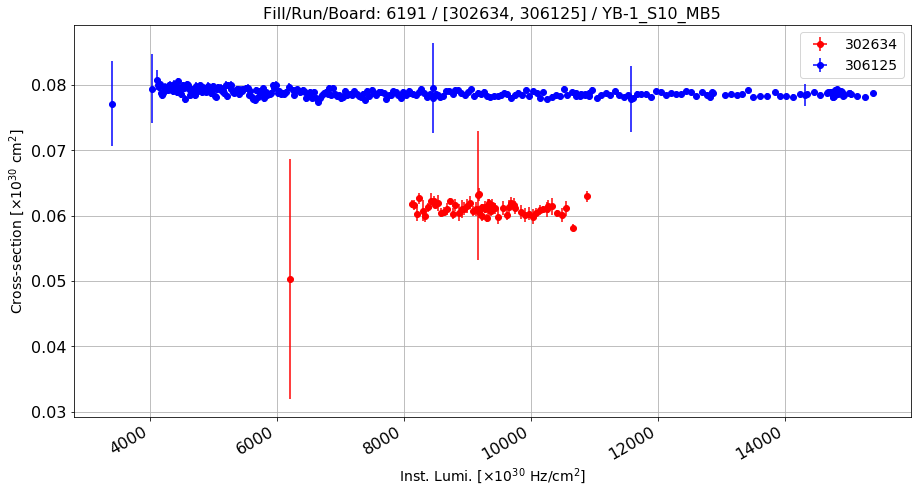

Anomalous CS: 0.0609174378445 , Normal CS: 0.0788371440047 , Ratio: 0.2273002959


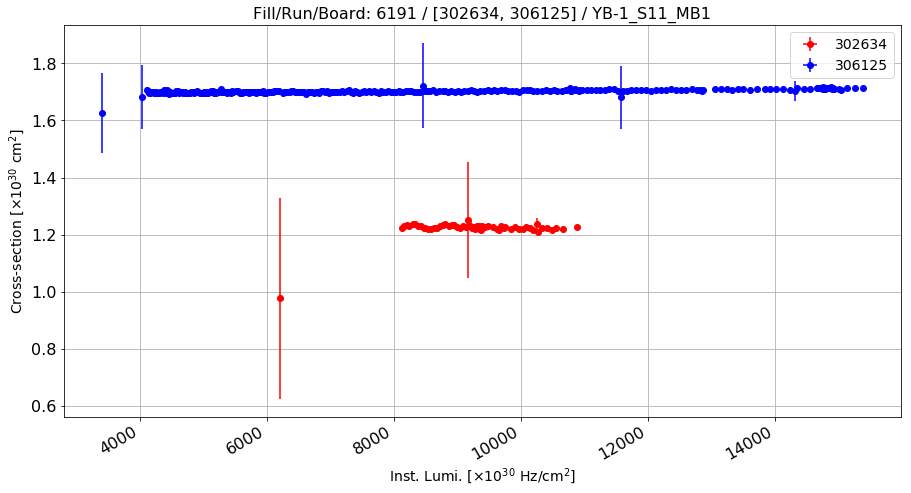

Anomalous CS: 1.22246977905 , Normal CS: 1.70237916417 , Ratio: 0.281905109757


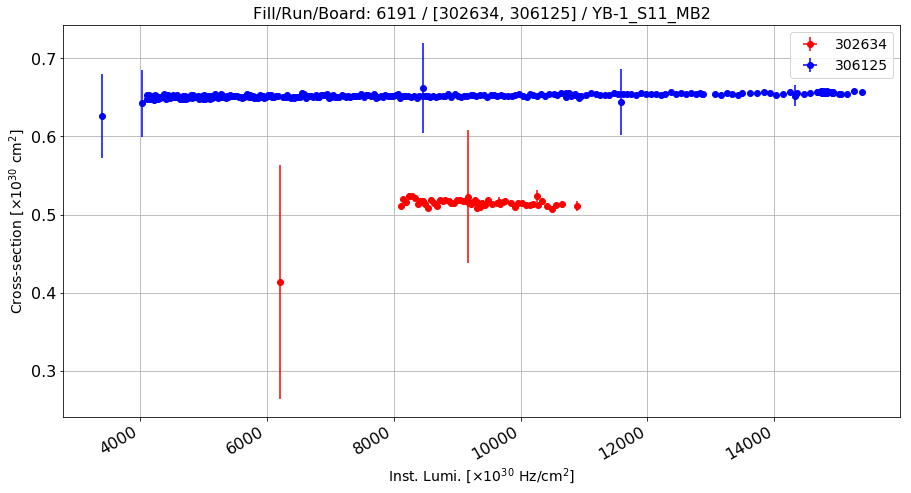

Anomalous CS: 0.513534895647 , Normal CS: 0.652121912933 , Ratio: 0.2125170379


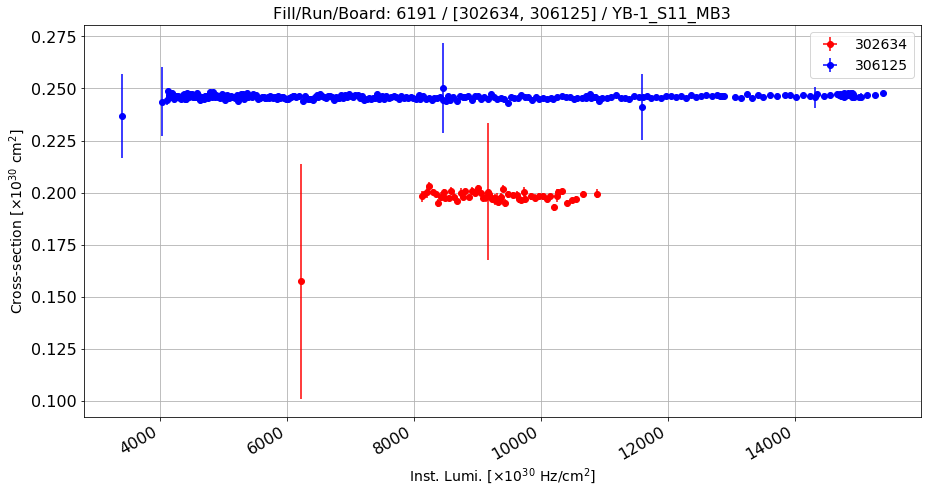

Anomalous CS: 0.197712055017 , Normal CS: 0.245981863201 , Ratio: 0.196233200105


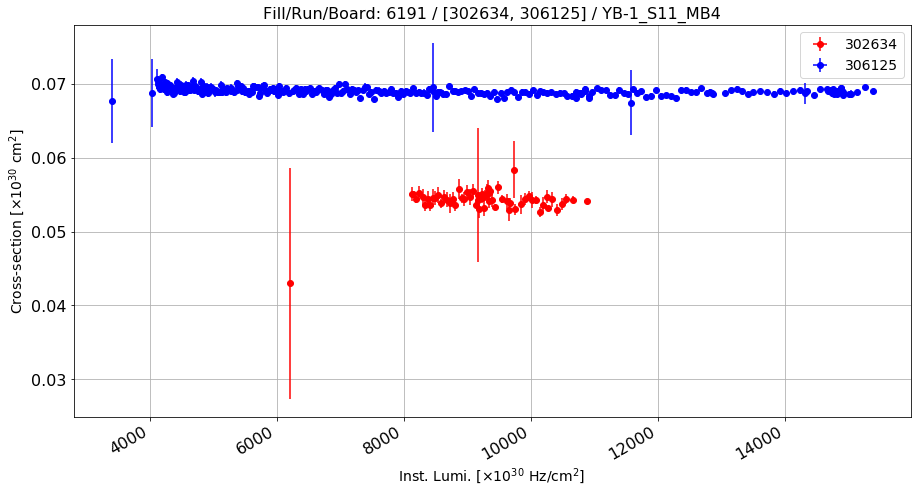

Anomalous CS: 0.0542391820067 , Normal CS: 0.0691013607202 , Ratio: 0.215077945768


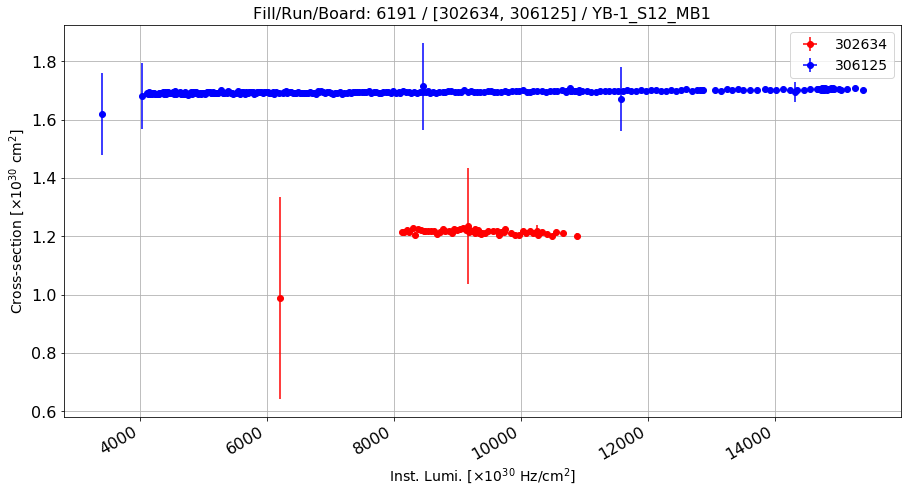

Anomalous CS: 1.21295203309 , Normal CS: 1.69564545701 , Ratio: 0.284666480201


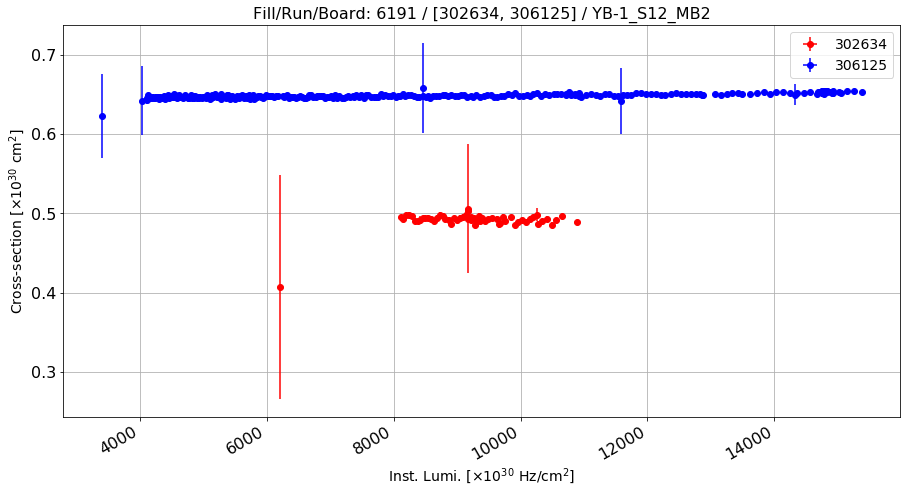

Anomalous CS: 0.491426548853 , Normal CS: 0.648372266728 , Ratio: 0.242061121255


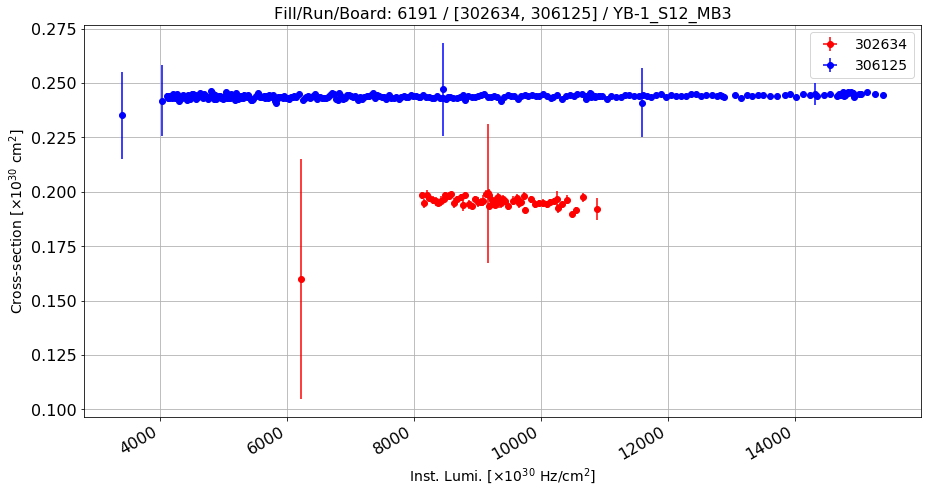

Anomalous CS: 0.195131173349 , Normal CS: 0.243907478794 , Ratio: 0.19997872015


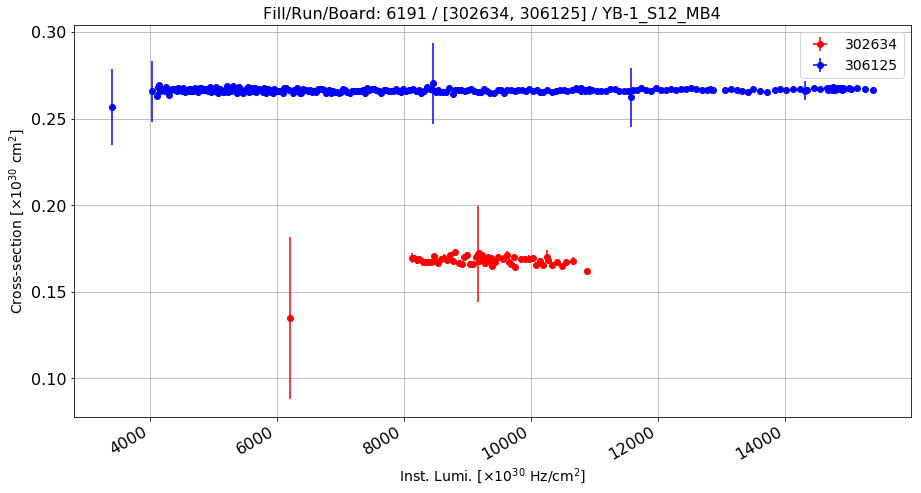

Anomalous CS: 0.167742485217 , Normal CS: 0.266425827178 , Ratio: 0.370397055744


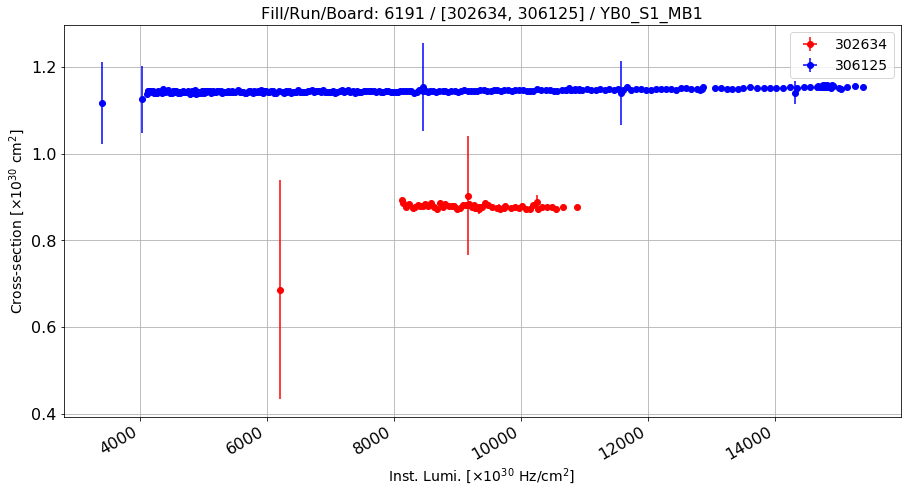

Anomalous CS: 0.875834990765 , Normal CS: 1.14546422538 , Ratio: 0.235388612443


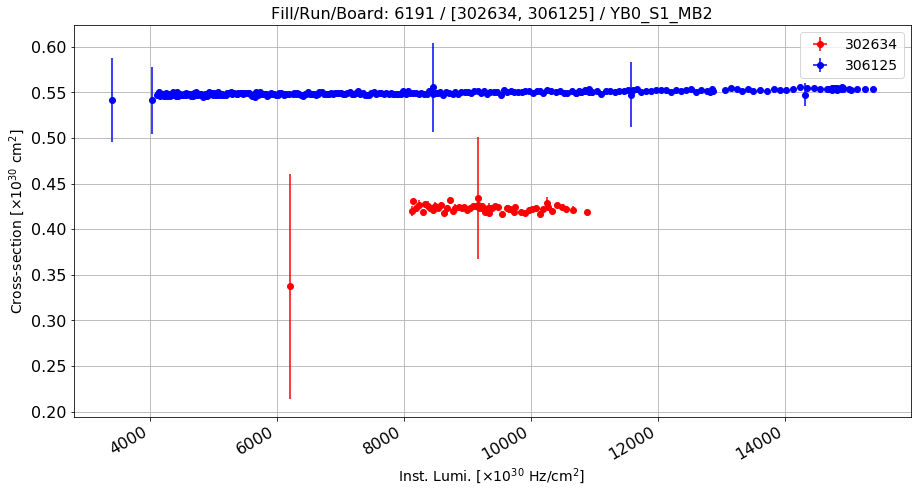

Anomalous CS: 0.421652477845 , Normal CS: 0.54964923599 , Ratio: 0.232869891859


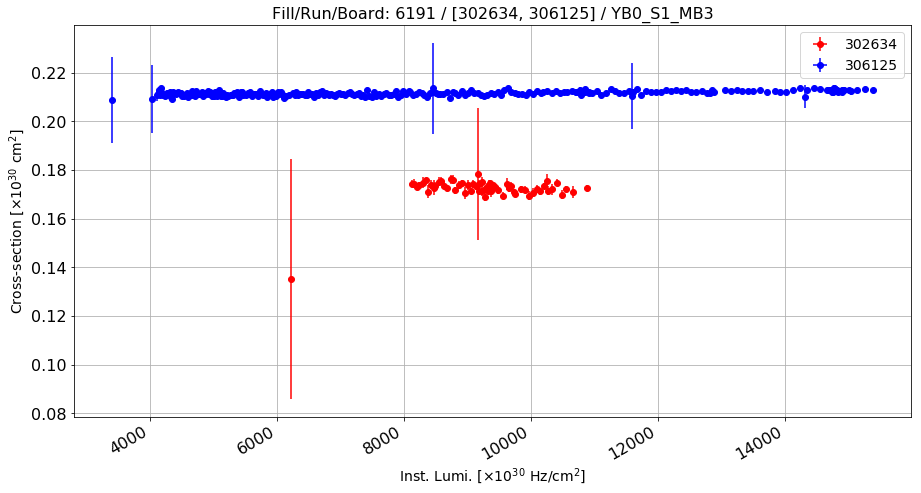

Anomalous CS: 0.172296890196 , Normal CS: 0.211557705364 , Ratio: 0.185579698458


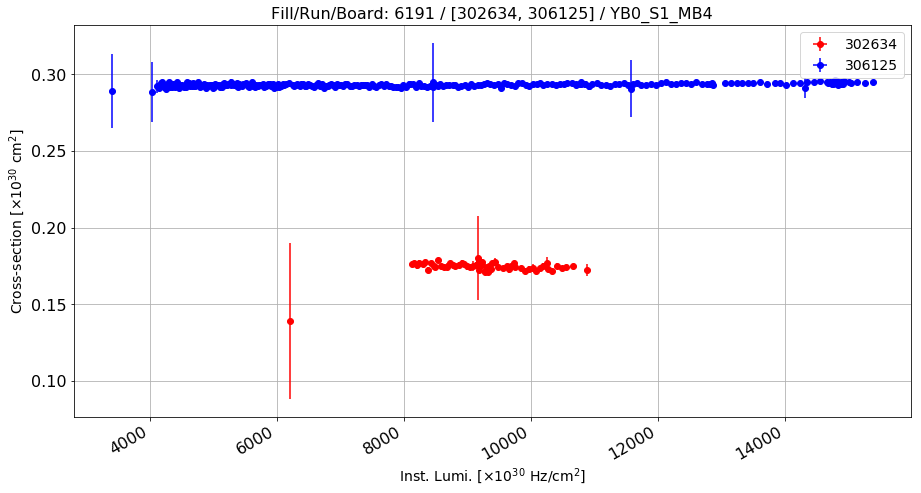

Anomalous CS: 0.174213164542 , Normal CS: 0.293250037381 , Ratio: 0.405922788289


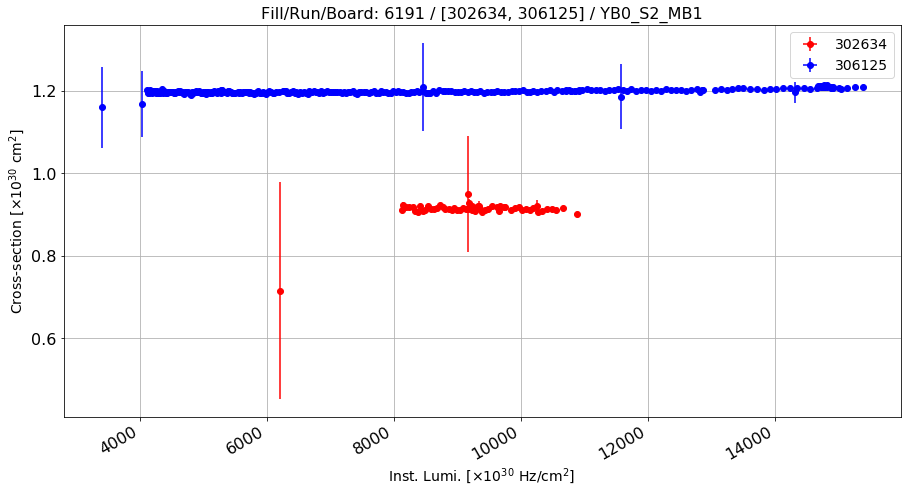

Anomalous CS: 0.911808145107 , Normal CS: 1.19832304729 , Ratio: 0.23909654649


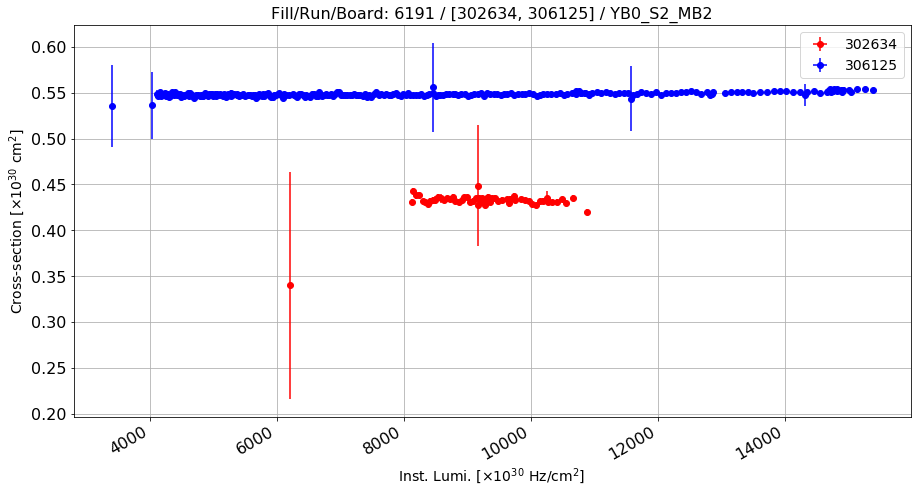

Anomalous CS: 0.431667182154 , Normal CS: 0.548527257923 , Ratio: 0.213043333911


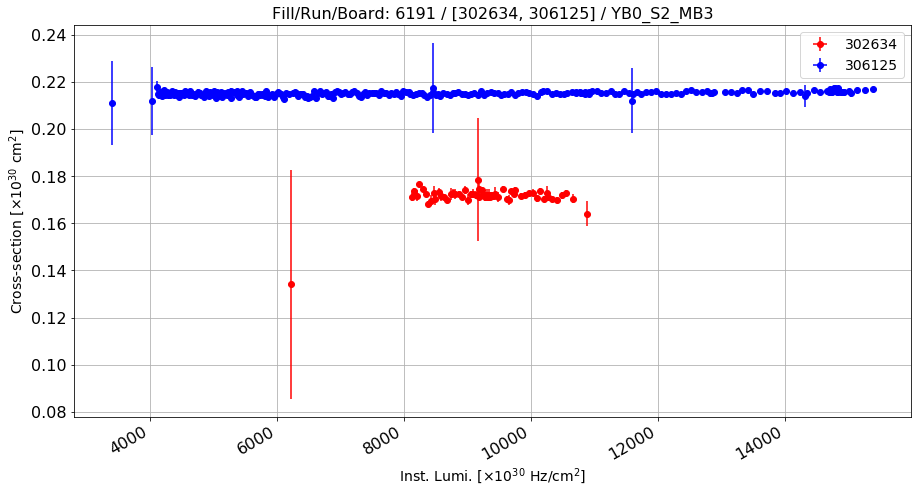

Anomalous CS: 0.171371893031 , Normal CS: 0.215199922098 , Ratio: 0.203661918828


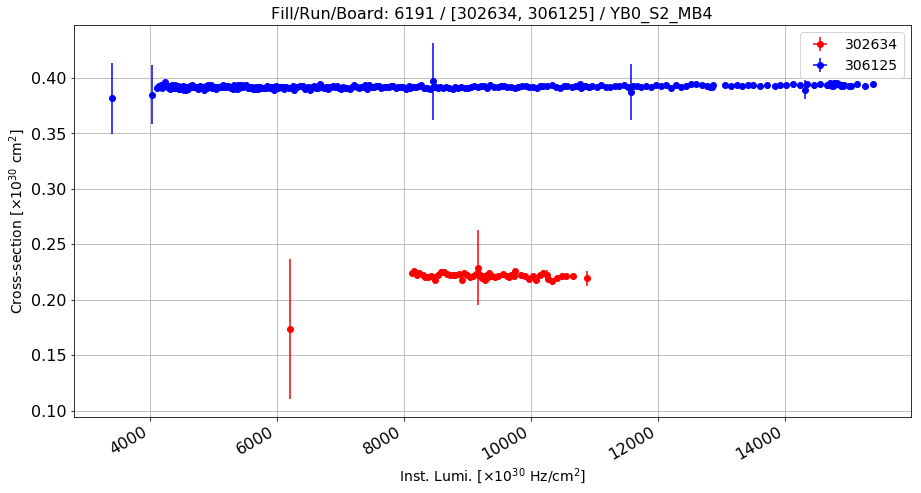

Anomalous CS: 0.220836523847 , Normal CS: 0.391959131713 , Ratio: 0.436582781265


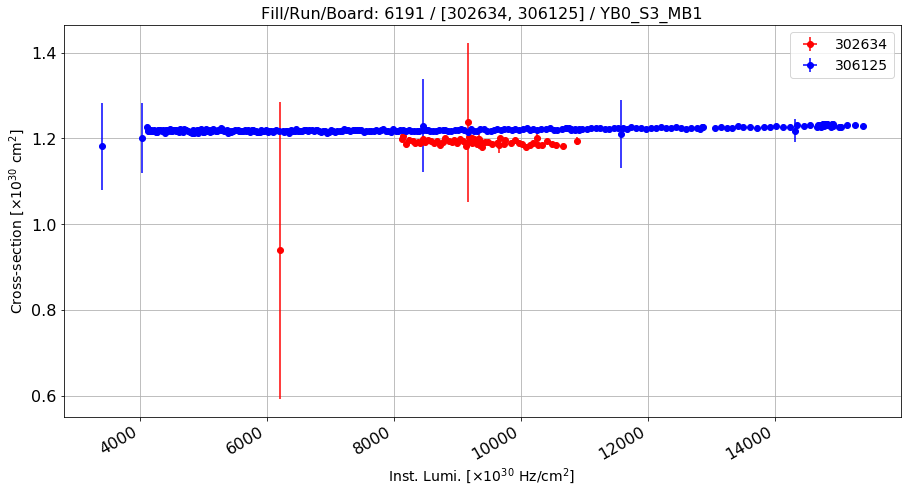

Anomalous CS: 1.18835780285 , Normal CS: 1.2204288524 , Ratio: 0.026278508156


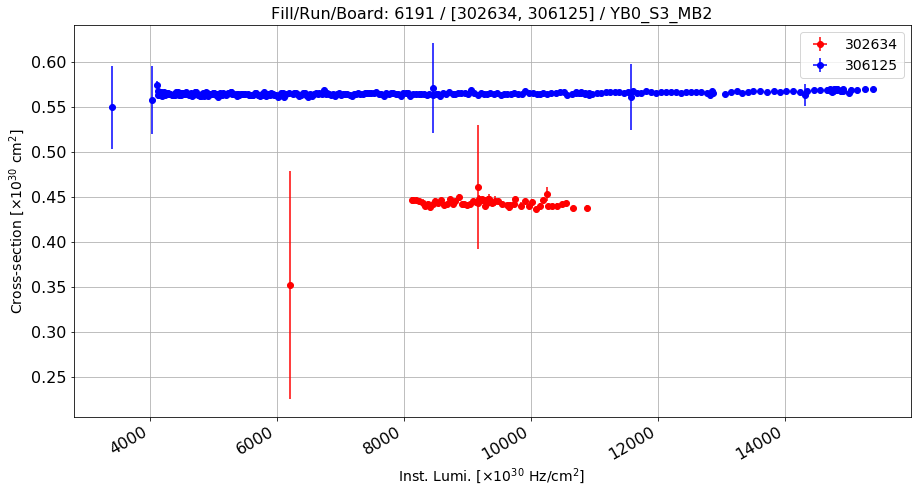

Anomalous CS: 0.442320575553 , Normal CS: 0.564934286881 , Ratio: 0.217040661499


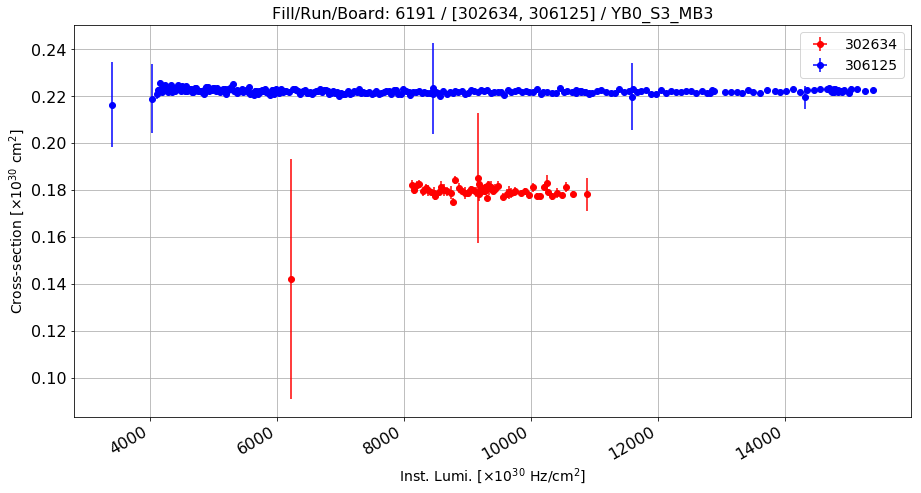

Anomalous CS: 0.17920985223 , Normal CS: 0.222183816284 , Ratio: 0.19341626574


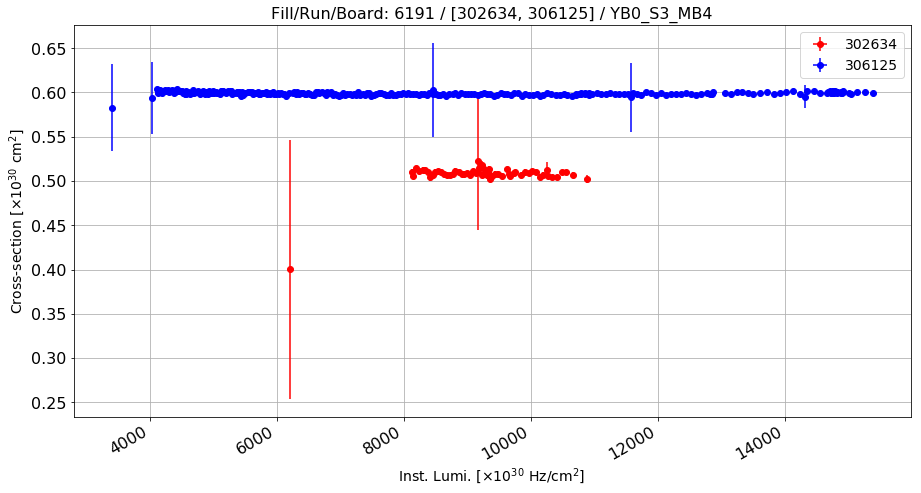

Anomalous CS: 0.507184034084 , Normal CS: 0.599150537986 , Ratio: 0.153494819868


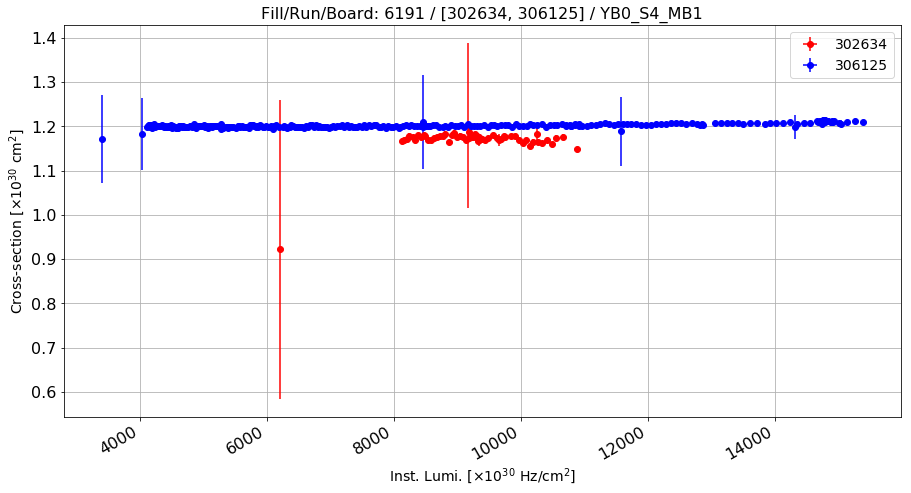

Anomalous CS: 1.16918191555 , Normal CS: 1.20168603158 , Ratio: 0.0270487591401


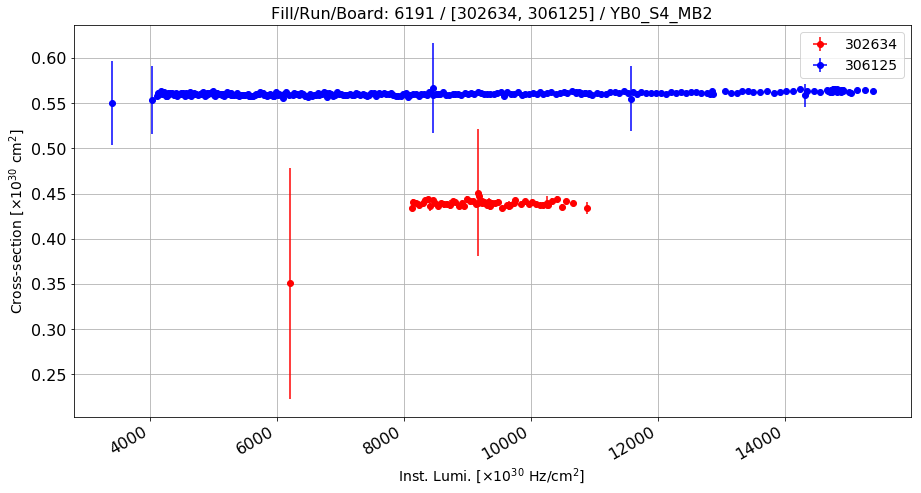

Anomalous CS: 0.438196004405 , Normal CS: 0.560817089448 , Ratio: 0.218647197722


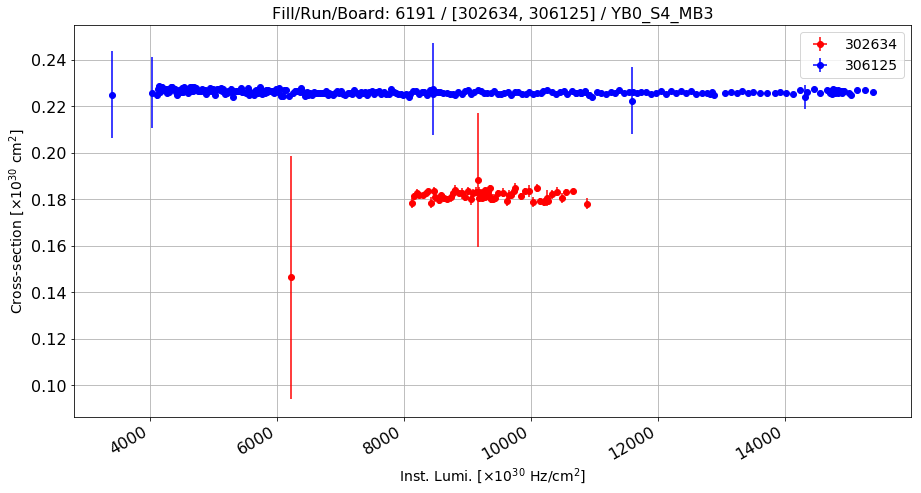

Anomalous CS: 0.181195823184 , Normal CS: 0.226143570824 , Ratio: 0.198757574565


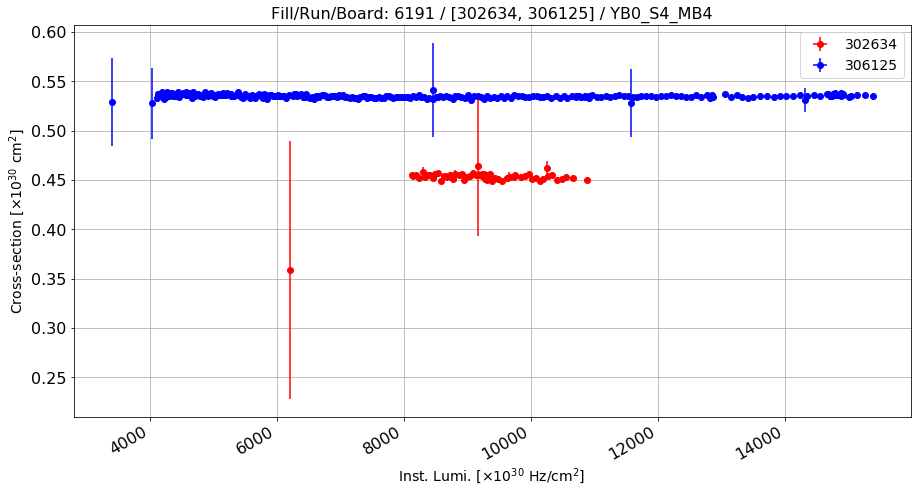

Anomalous CS: 0.452144109072 , Normal CS: 0.535266464263 , Ratio: 0.155291543075


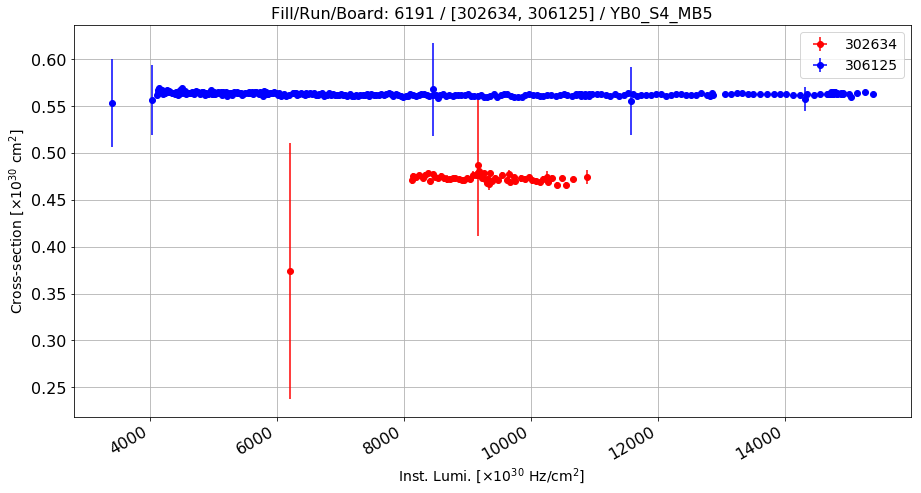

Anomalous CS: 0.471654700578 , Normal CS: 0.56292837206 , Ratio: 0.162140826456


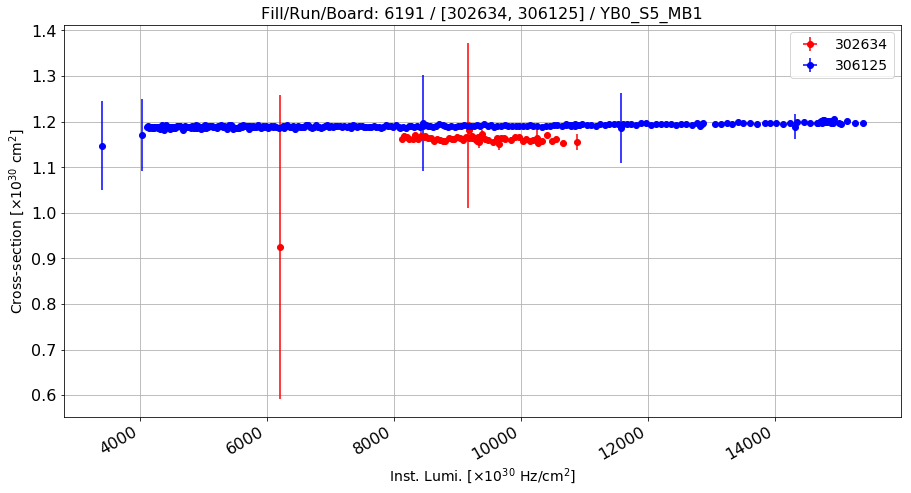

Anomalous CS: 1.15924410886 , Normal CS: 1.19099177639 , Ratio: 0.0266564960071


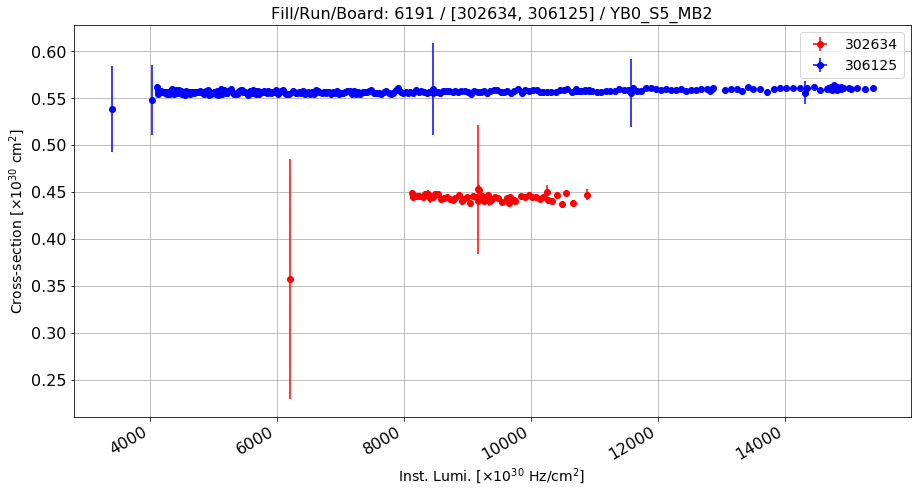

Anomalous CS: 0.442792429901 , Normal CS: 0.557273661826 , Ratio: 0.205430903642


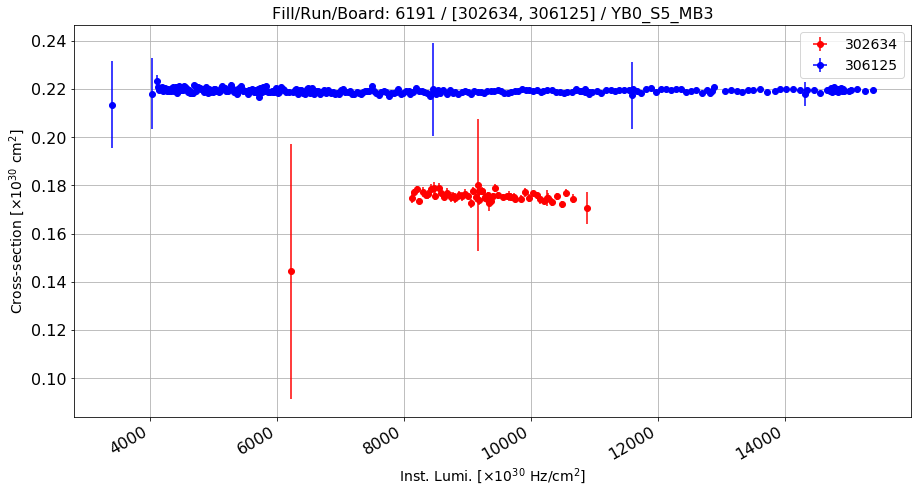

Anomalous CS: 0.175141168527 , Normal CS: 0.219329197831 , Ratio: 0.201468977872


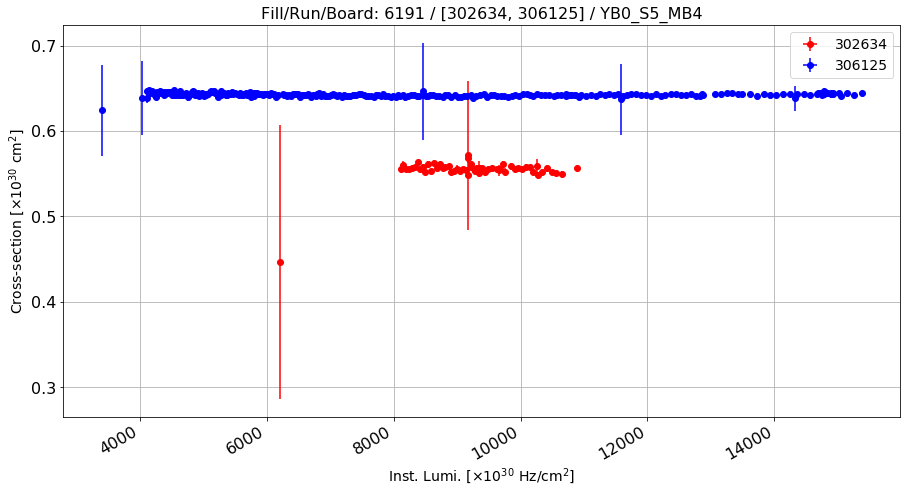

Anomalous CS: 0.554394771544 , Normal CS: 0.642649392239 , Ratio: 0.137329345926


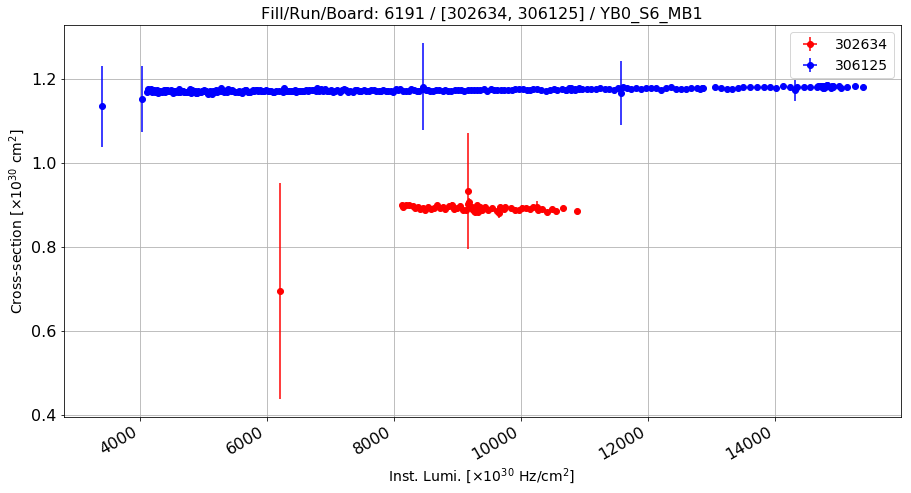

Anomalous CS: 0.889430317129 , Normal CS: 1.17285145497 , Ratio: 0.241651350339


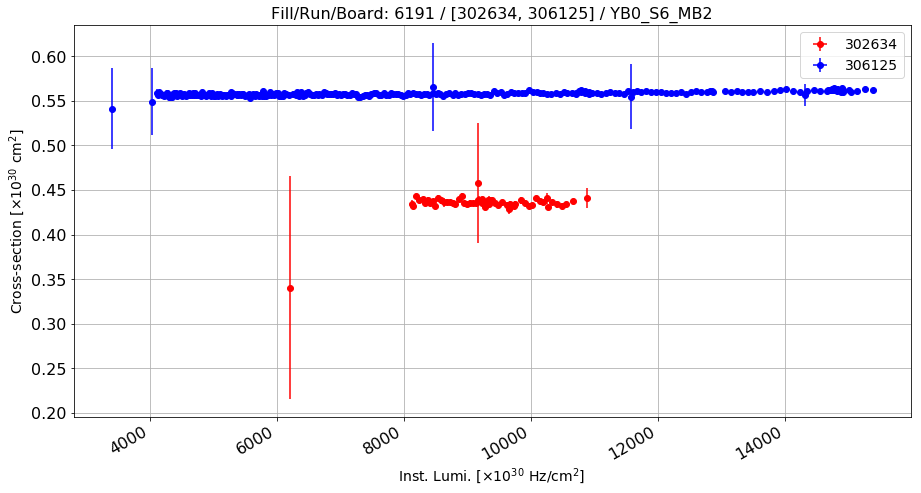

Anomalous CS: 0.43509002199 , Normal CS: 0.55830335481 , Ratio: 0.220692445709


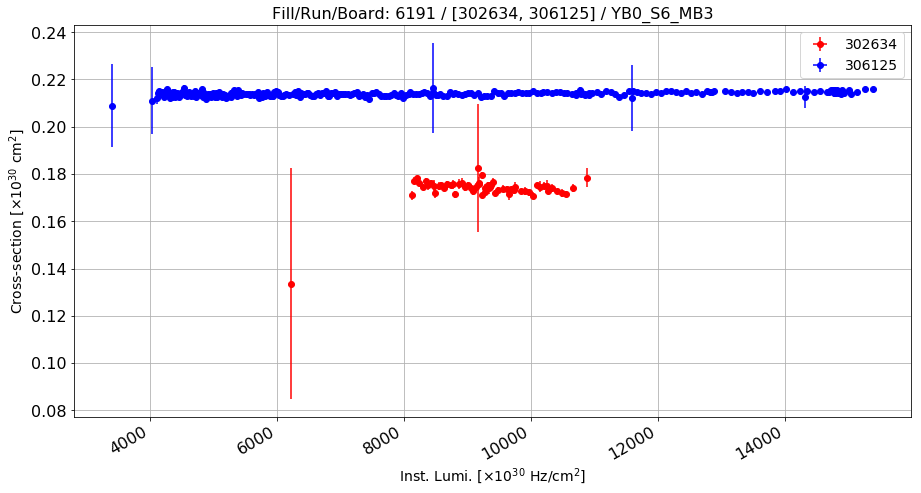

Anomalous CS: 0.17383545715 , Normal CS: 0.214044733766 , Ratio: 0.187854547545


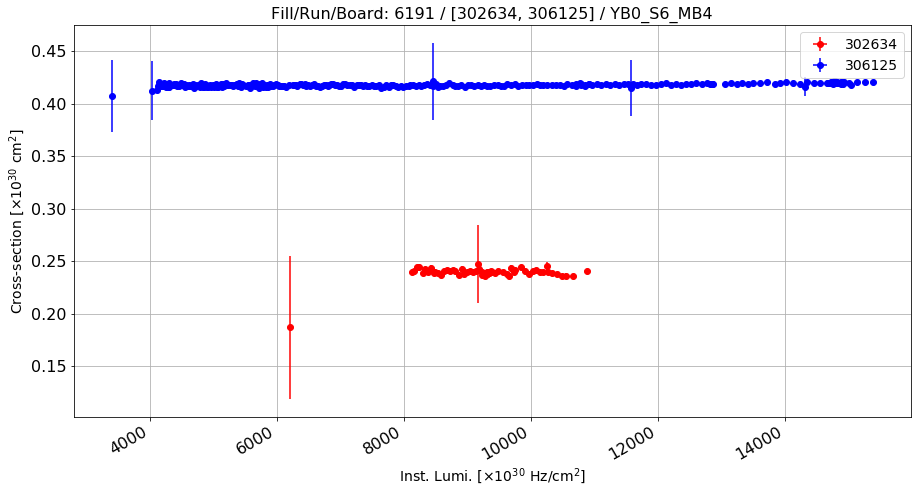

Anomalous CS: 0.239059584323 , Normal CS: 0.41783280148 , Ratio: 0.427858264177


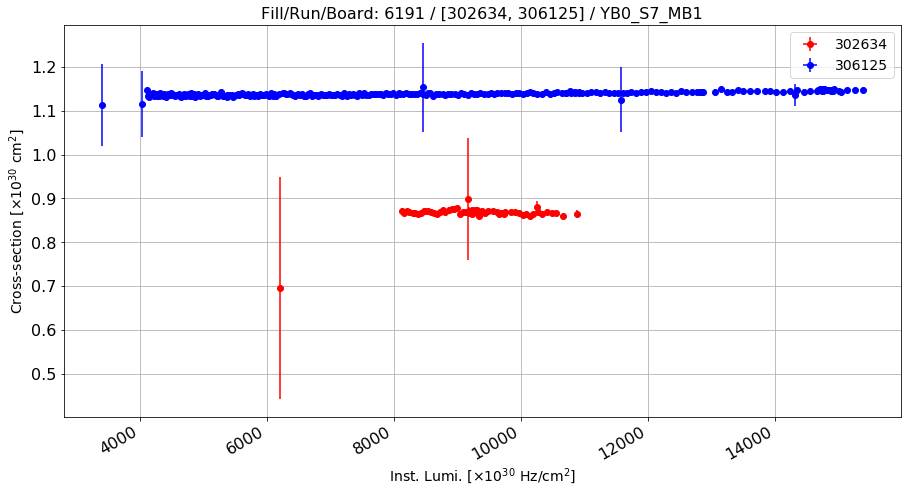

Anomalous CS: 0.866157648053 , Normal CS: 1.13884841715 , Ratio: 0.239444306189


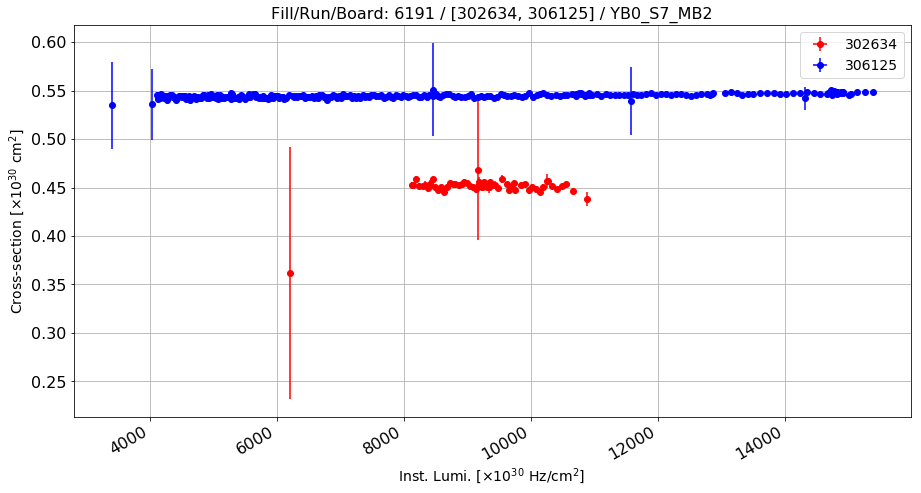

Anomalous CS: 0.450498332372 , Normal CS: 0.54466391874 , Ratio: 0.172887505723


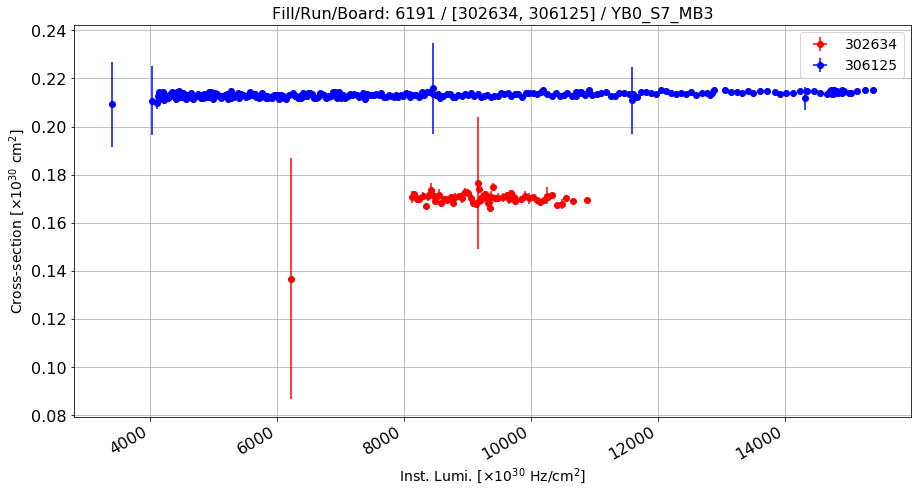

Anomalous CS: 0.169833210898 , Normal CS: 0.213218747081 , Ratio: 0.203478994117


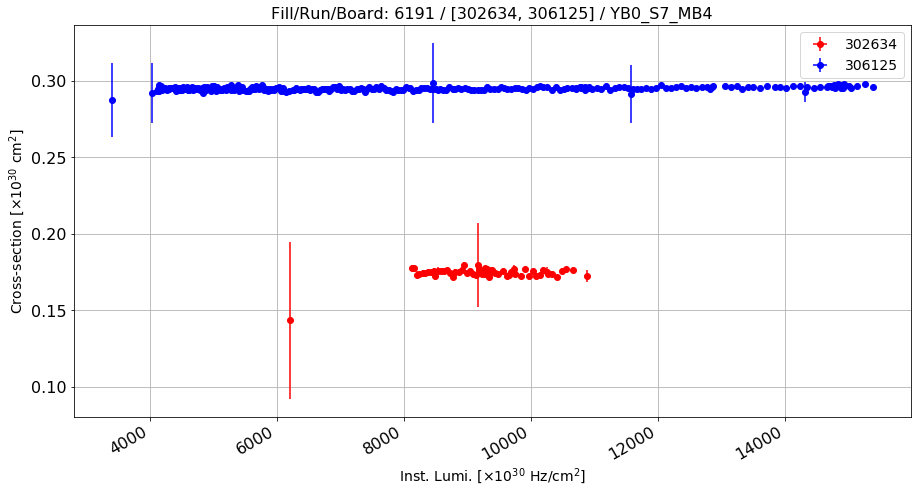

Anomalous CS: 0.174353093603 , Normal CS: 0.29506681039 , Ratio: 0.409106387218


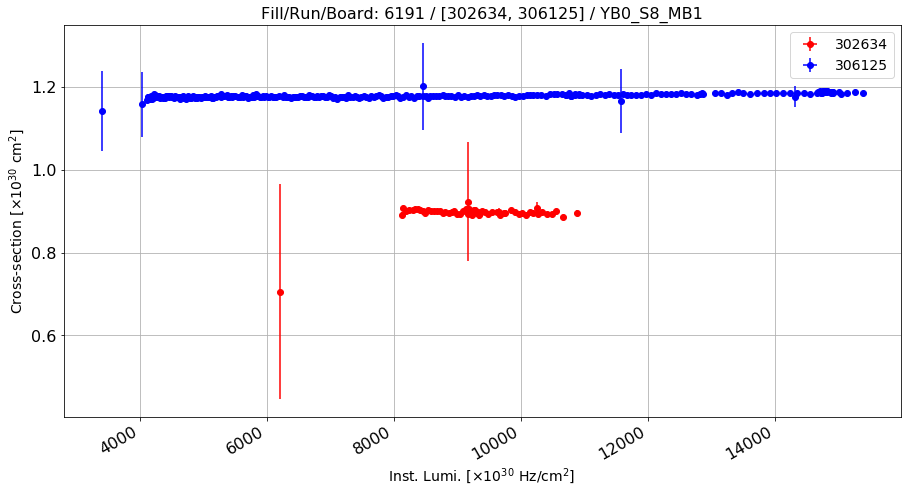

Anomalous CS: 0.895464344211 , Normal CS: 1.17909313164 , Ratio: 0.240548248323


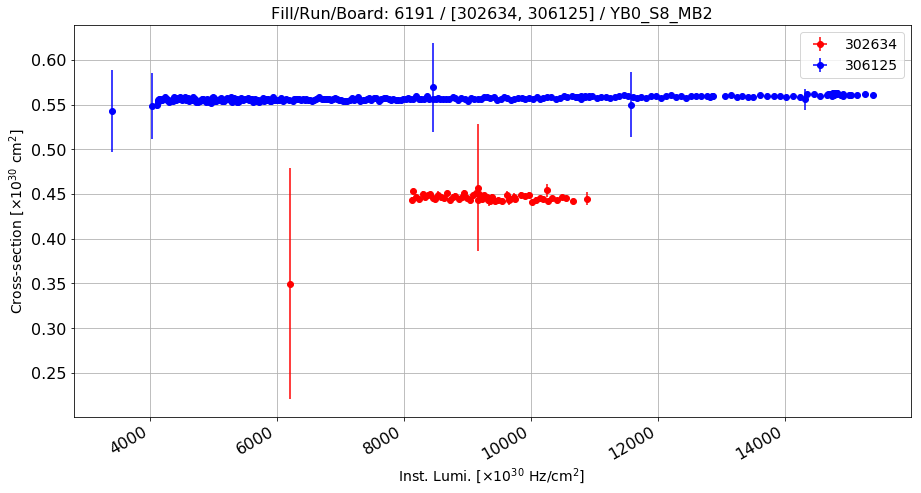

Anomalous CS: 0.444757908789 , Normal CS: 0.557095825676 , Ratio: 0.201649180821


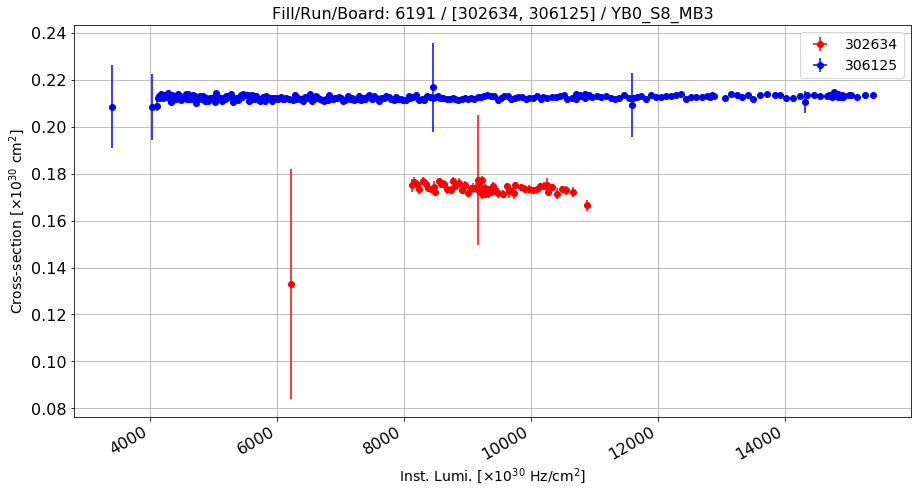

Anomalous CS: 0.173055350687 , Normal CS: 0.212422270443 , Ratio: 0.185323881882


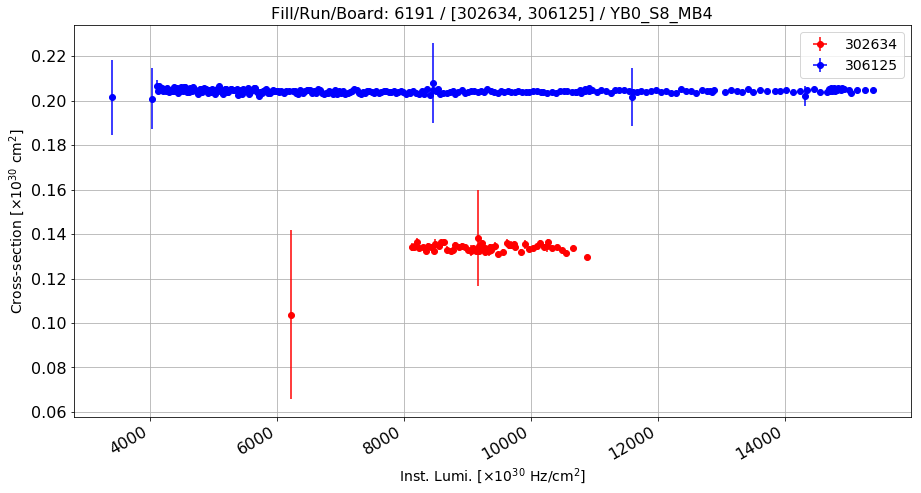

Anomalous CS: 0.133419523089 , Normal CS: 0.204335221306 , Ratio: 0.347055675295


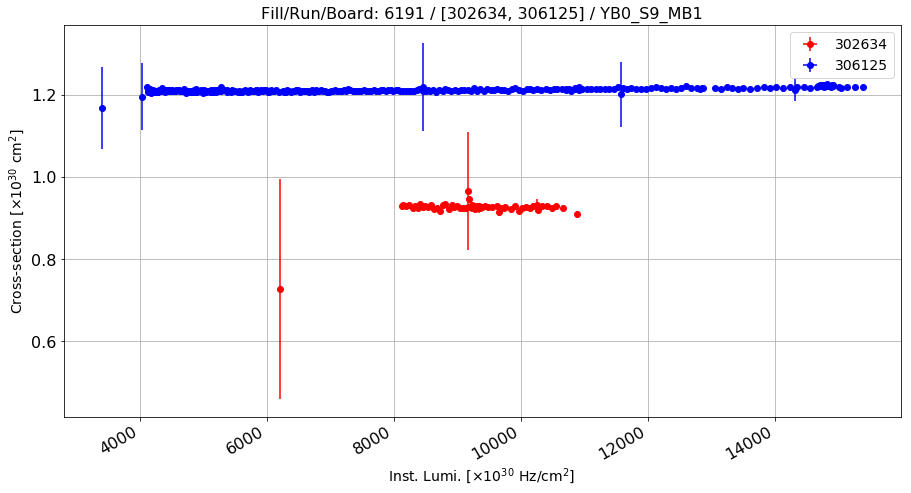

Anomalous CS: 0.924622401763 , Normal CS: 1.21248270168 , Ratio: 0.237413943738


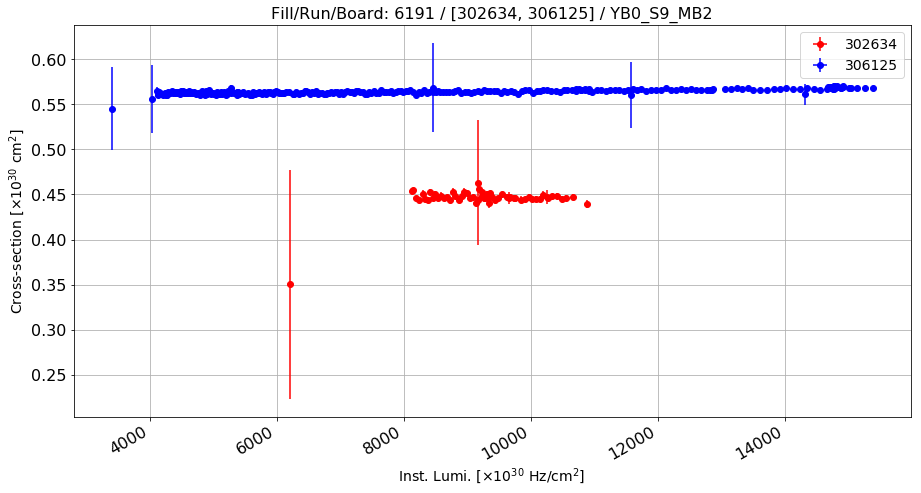

Anomalous CS: 0.445966799557 , Normal CS: 0.564169616838 , Ratio: 0.209516453478


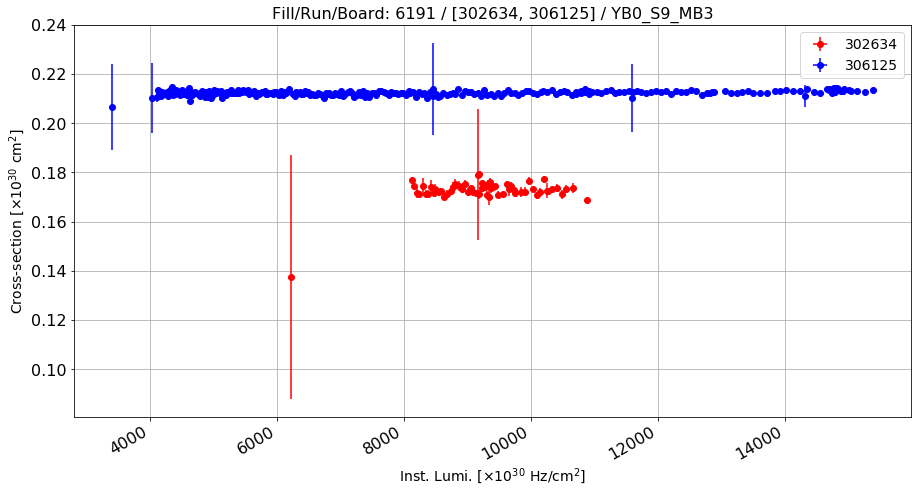

Anomalous CS: 0.172671273873 , Normal CS: 0.212428845867 , Ratio: 0.187157124693


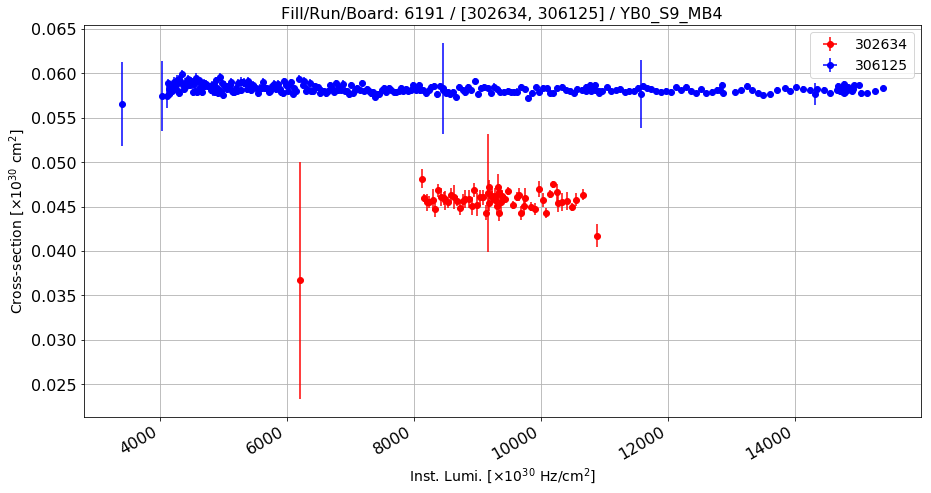

Anomalous CS: 0.0456187100542 , Normal CS: 0.0582754174784 , Ratio: 0.217187760669


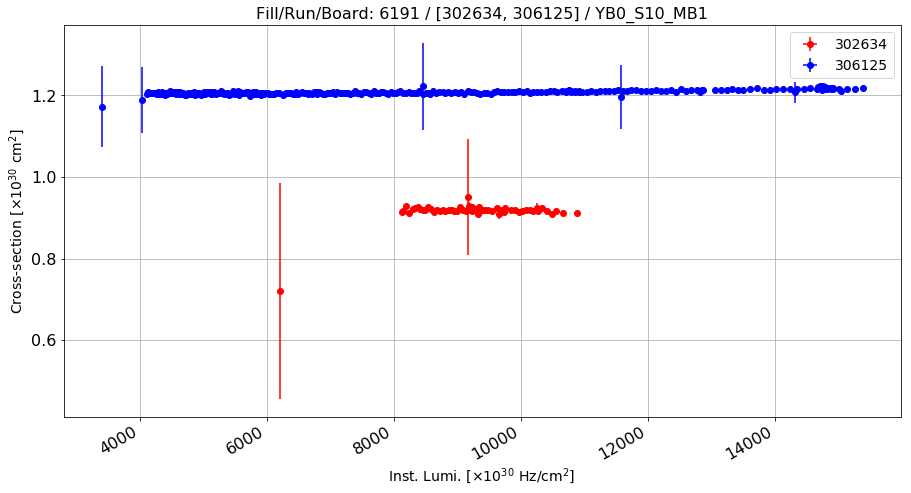

Anomalous CS: 0.916234866063 , Normal CS: 1.20805721314 , Ratio: 0.241563349736


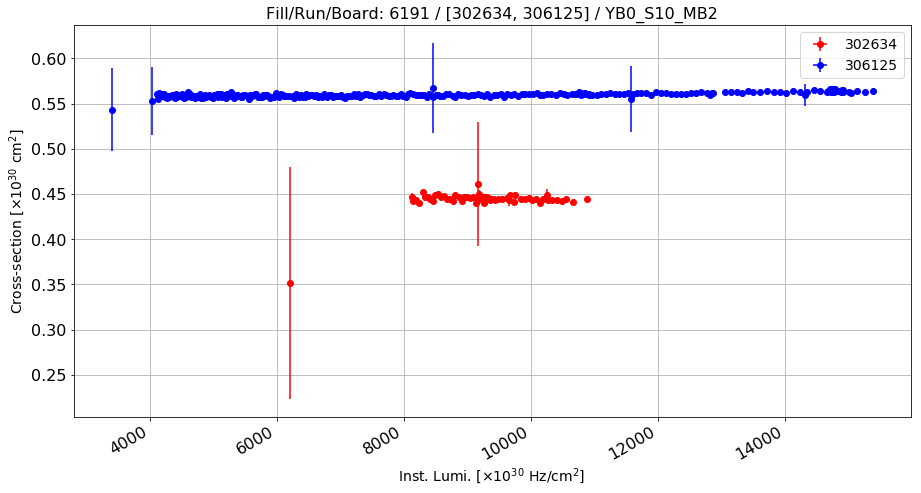

Anomalous CS: 0.443792605157 , Normal CS: 0.559856232508 , Ratio: 0.207309699548


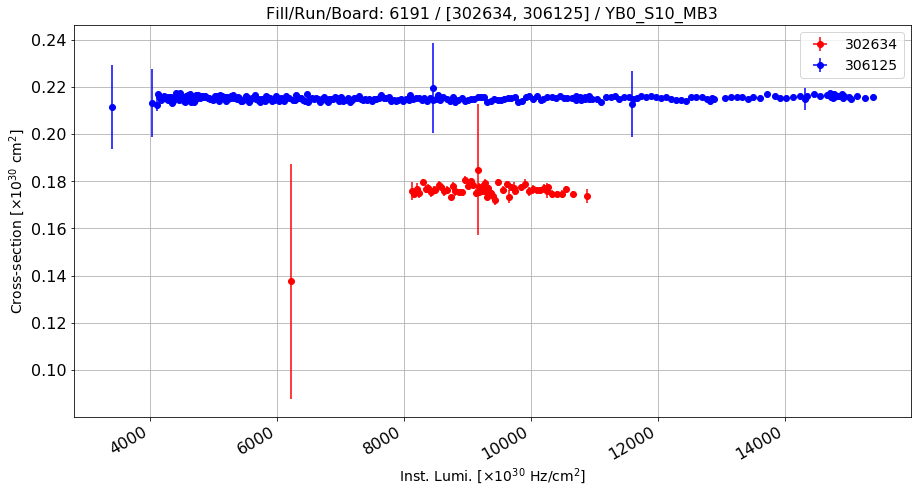

Anomalous CS: 0.175840458946 , Normal CS: 0.215214783325 , Ratio: 0.182953623217


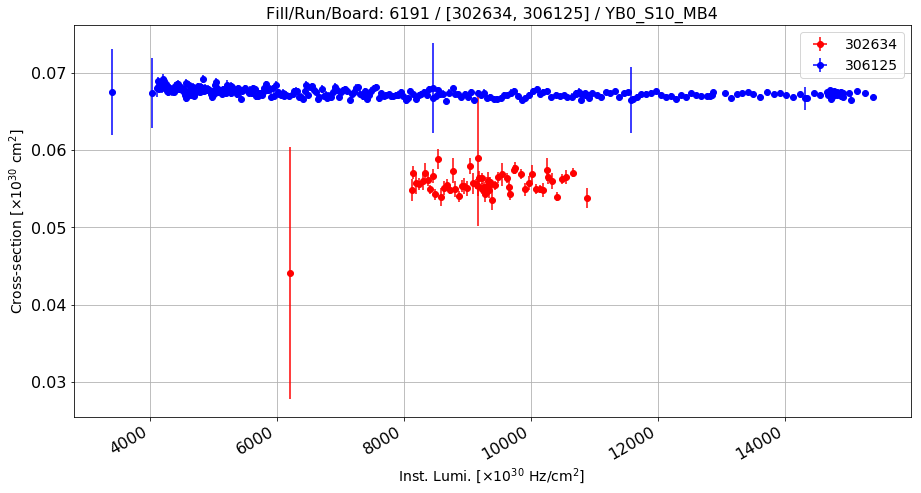

Anomalous CS: 0.0555710247162 , Normal CS: 0.0673973575843 , Ratio: 0.175471758715


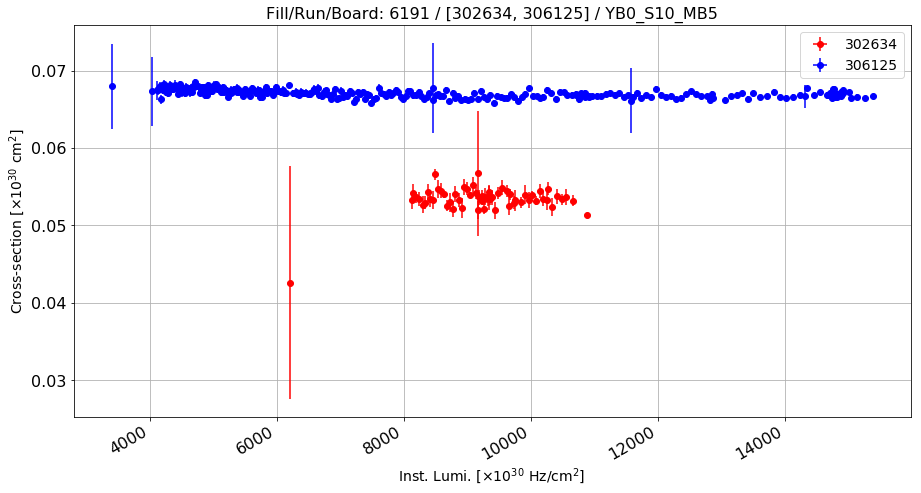

Anomalous CS: 0.0534586467065 , Normal CS: 0.0671098838338 , Ratio: 0.203416193674


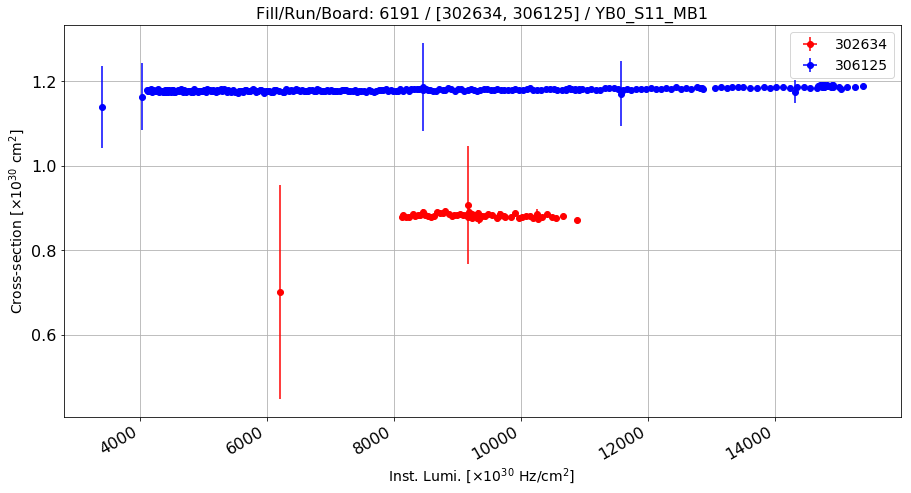

Anomalous CS: 0.879449498626 , Normal CS: 1.18015164645 , Ratio: 0.254799583363


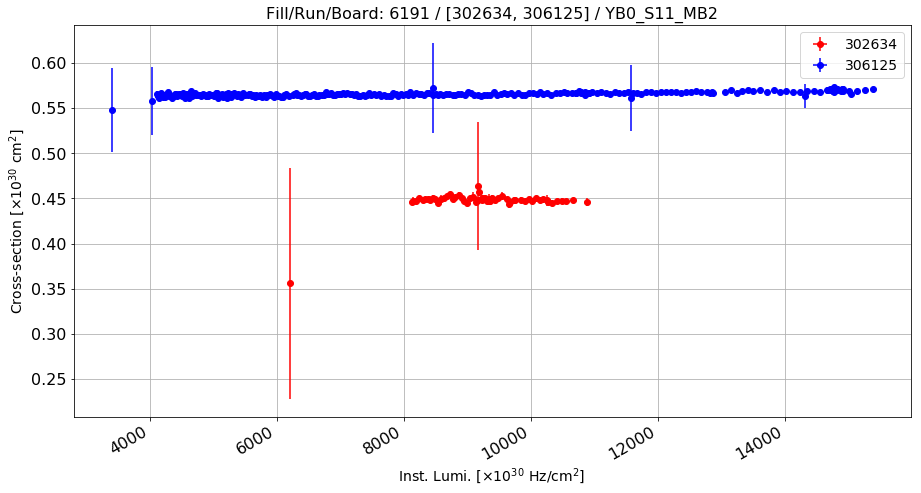

Anomalous CS: 0.447503002686 , Normal CS: 0.565719798988 , Ratio: 0.208967047845


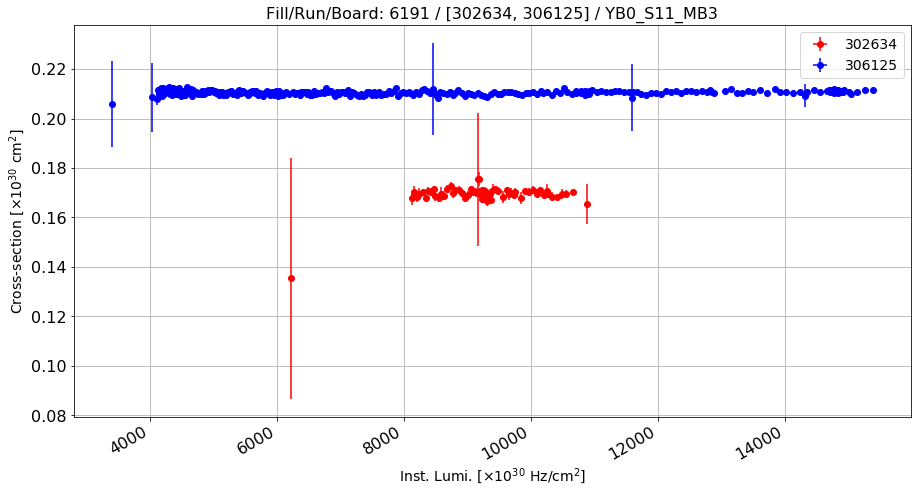

Anomalous CS: 0.169219753214 , Normal CS: 0.210527911011 , Ratio: 0.196212262775


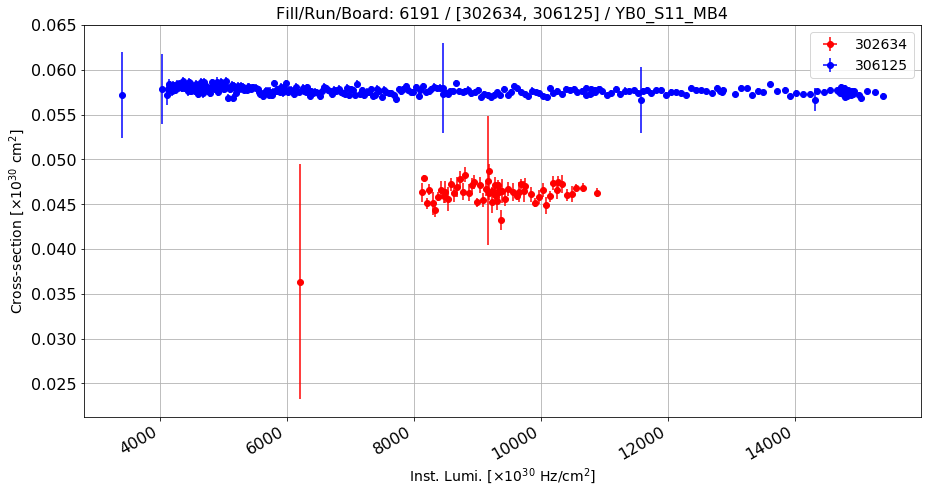

Anomalous CS: 0.0462289643974 , Normal CS: 0.0576900466175 , Ratio: 0.198666544613


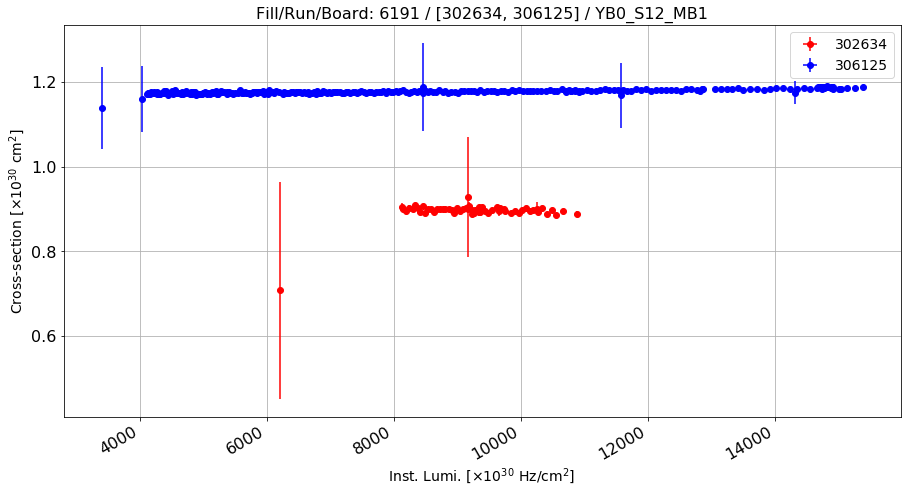

Anomalous CS: 0.894996346268 , Normal CS: 1.17748304584 , Ratio: 0.239907233118


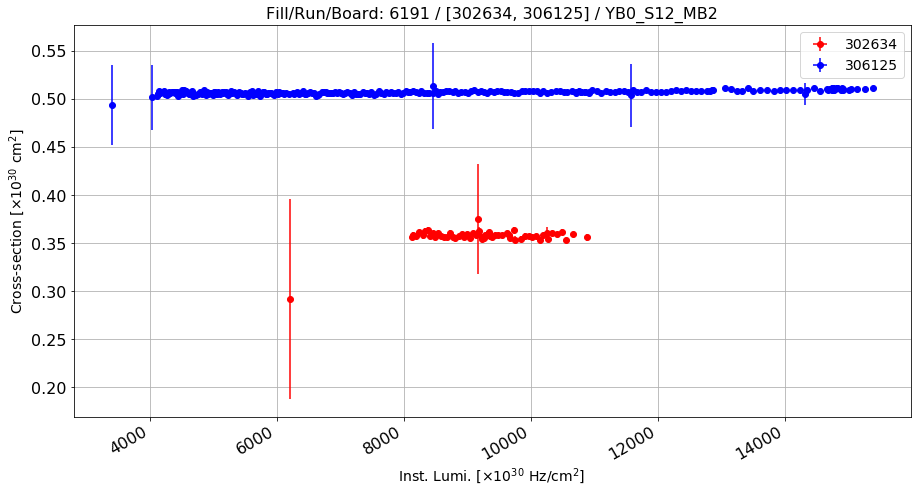

Anomalous CS: 0.357380143593 , Normal CS: 0.507276474489 , Ratio: 0.295492376316


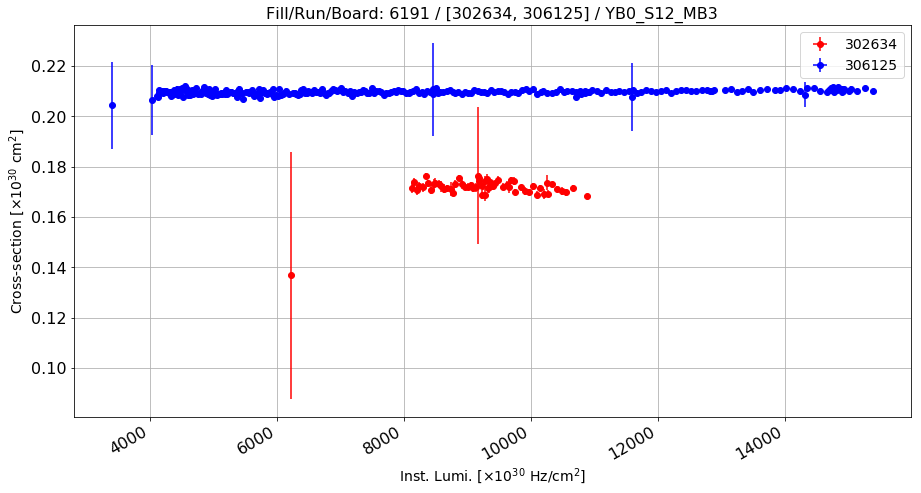

Anomalous CS: 0.171560963145 , Normal CS: 0.209668469238 , Ratio: 0.181751248681


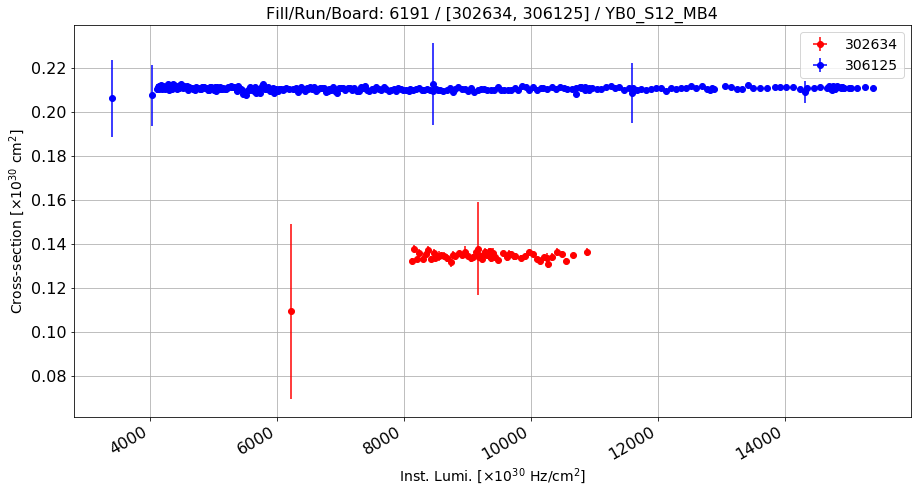

Anomalous CS: 0.134281017404 , Normal CS: 0.210614314893 , Ratio: 0.36243166818


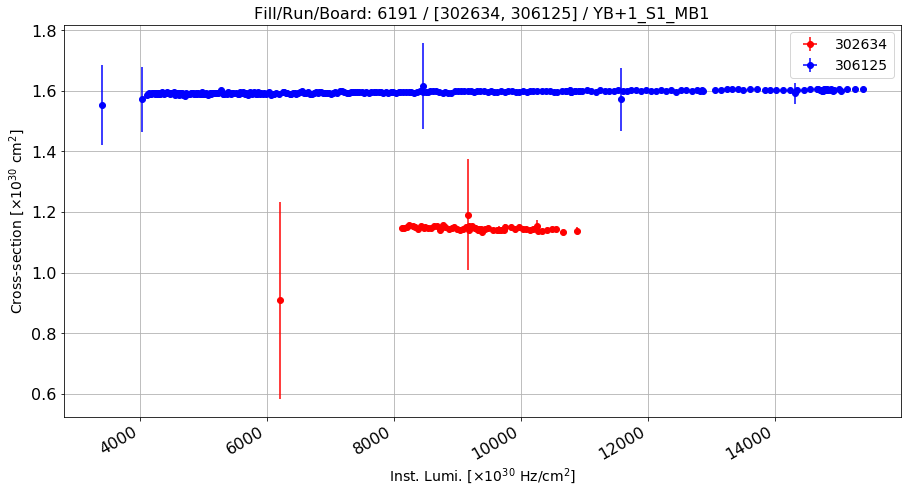

Anomalous CS: 1.14302764052 , Normal CS: 1.59583439629 , Ratio: 0.283742947778


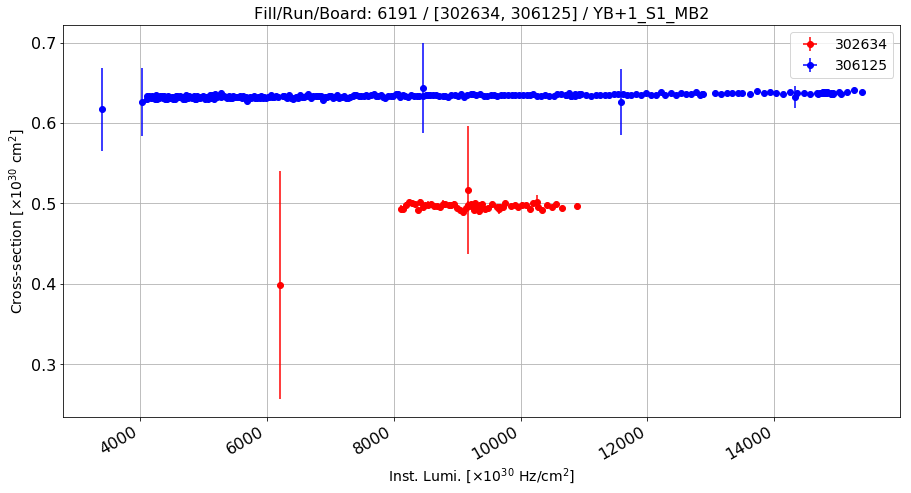

Anomalous CS: 0.49533612072 , Normal CS: 0.633821361352 , Ratio: 0.21849254234


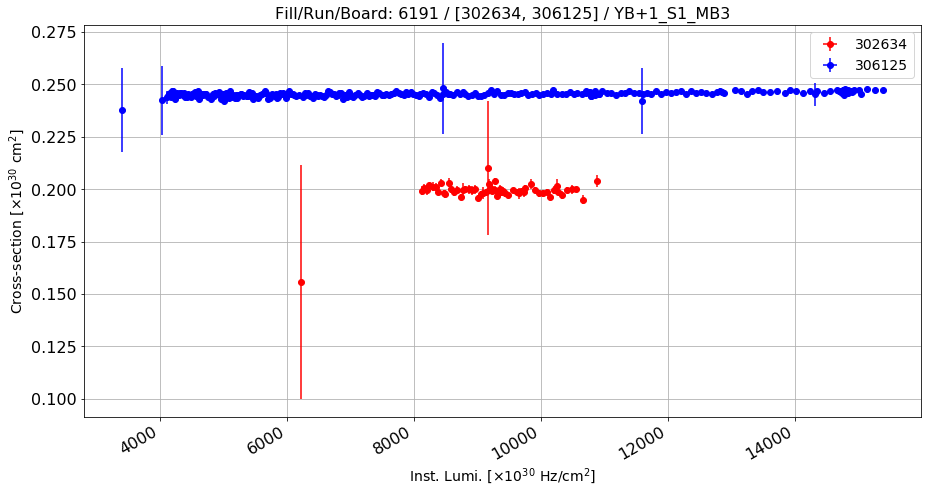

Anomalous CS: 0.198825949315 , Normal CS: 0.245463571581 , Ratio: 0.189998140931


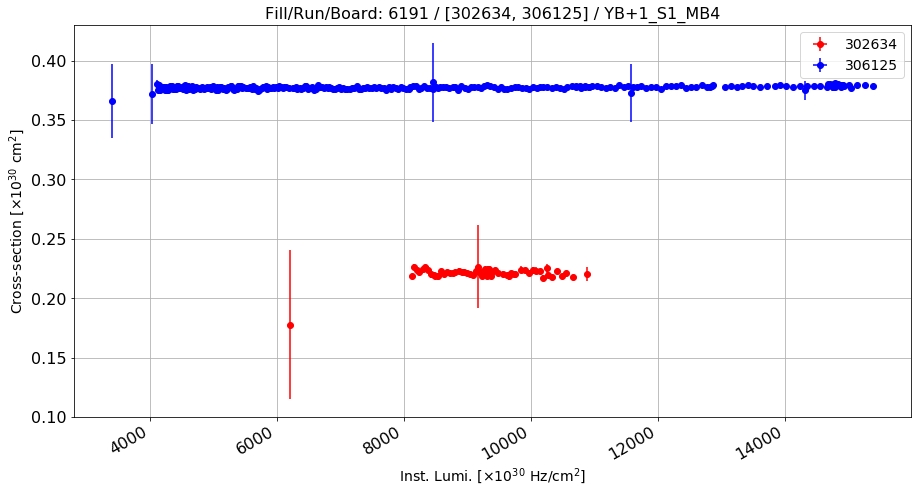

Anomalous CS: 0.220909942338 , Normal CS: 0.377436806054 , Ratio: 0.414710121549


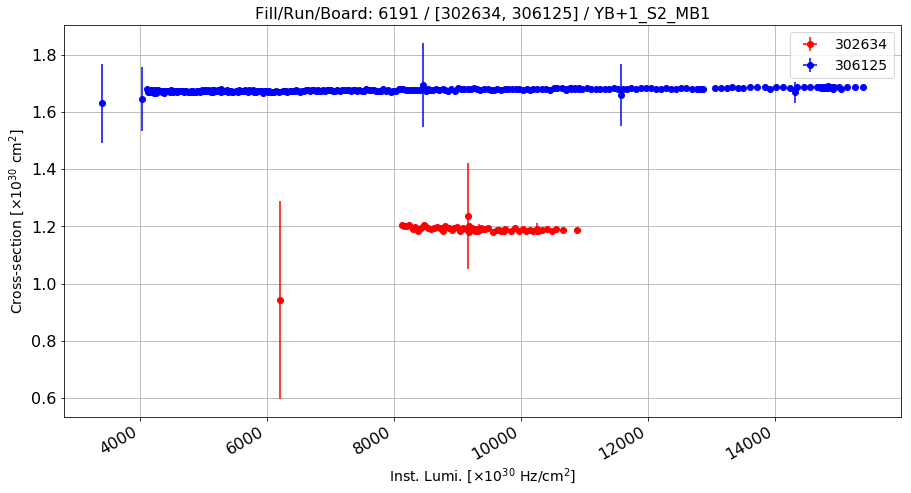

Anomalous CS: 1.1874479726 , Normal CS: 1.67699942539 , Ratio: 0.291921061736


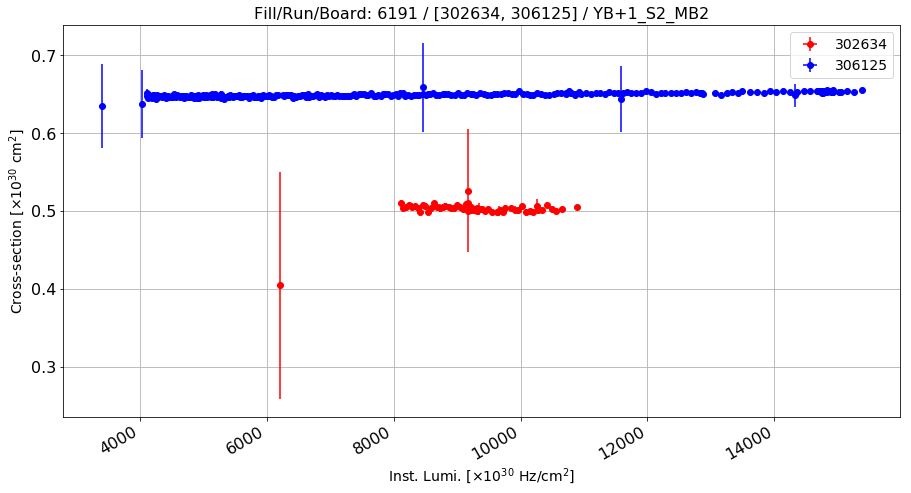

Anomalous CS: 0.50238683275 , Normal CS: 0.649566802629 , Ratio: 0.226581729984


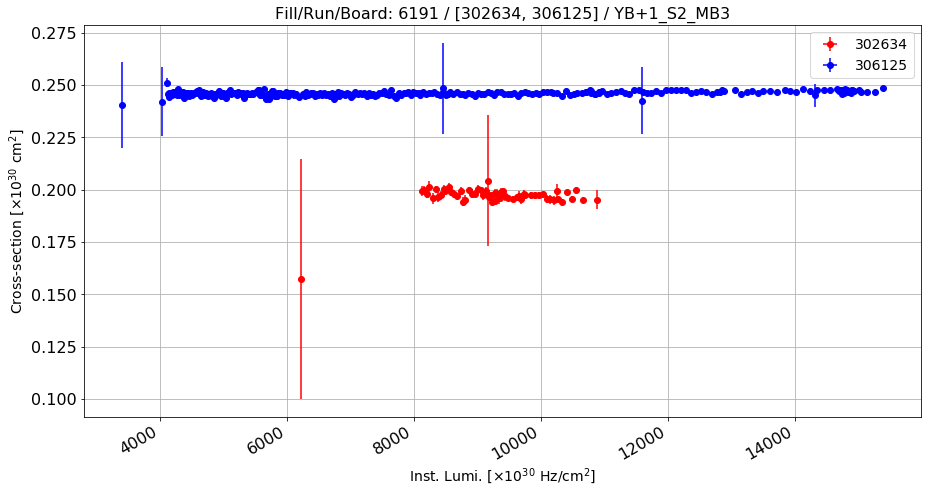

Anomalous CS: 0.196953091979 , Normal CS: 0.246169652912 , Ratio: 0.19992944033


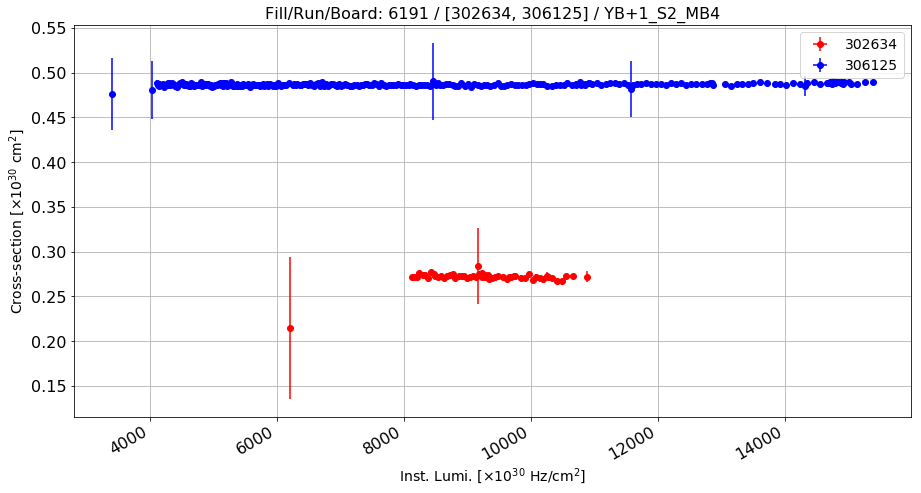

Anomalous CS: 0.271420158128 , Normal CS: 0.486843859371 , Ratio: 0.442490332571


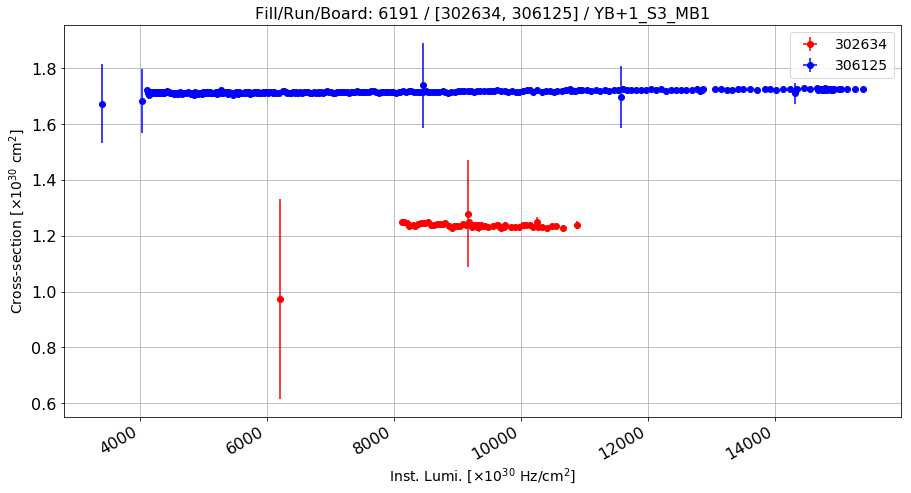

Anomalous CS: 1.23435764935 , Normal CS: 1.71697927147 , Ratio: 0.281087622979


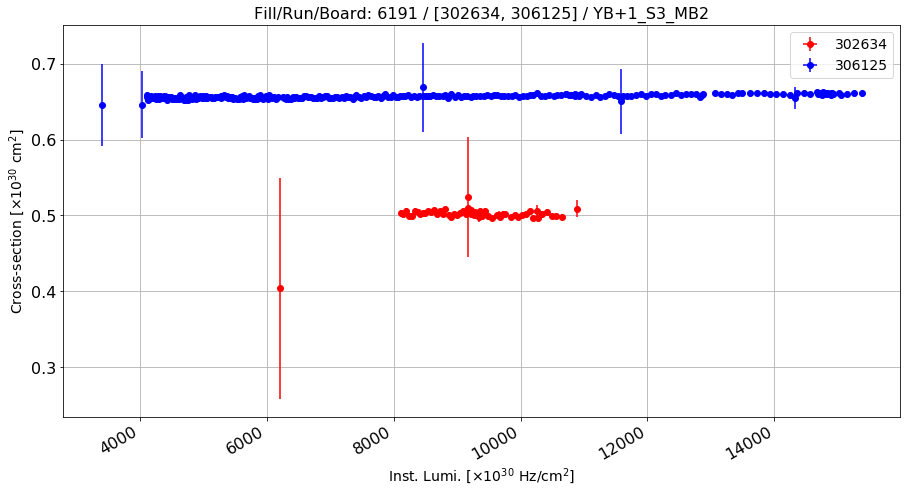

Anomalous CS: 0.501099783096 , Normal CS: 0.656838416279 , Ratio: 0.237103417405


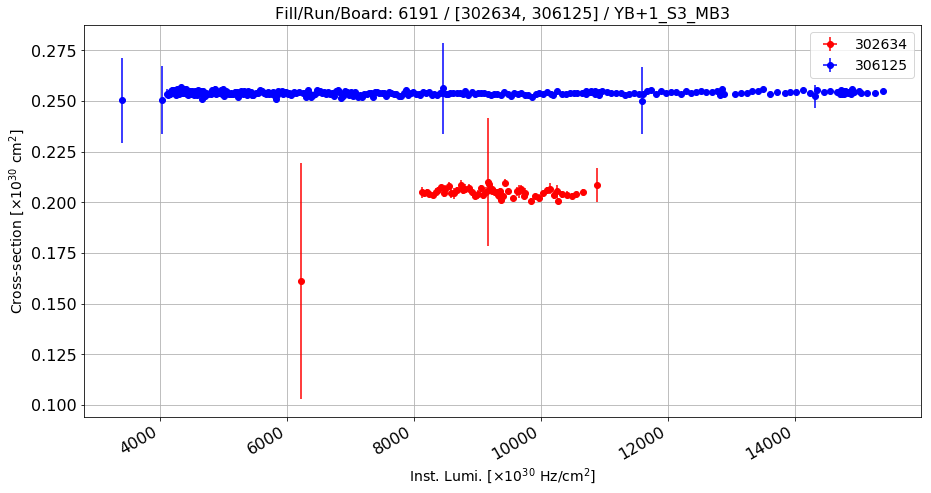

Anomalous CS: 0.204465051271 , Normal CS: 0.254015798564 , Ratio: 0.195069549111


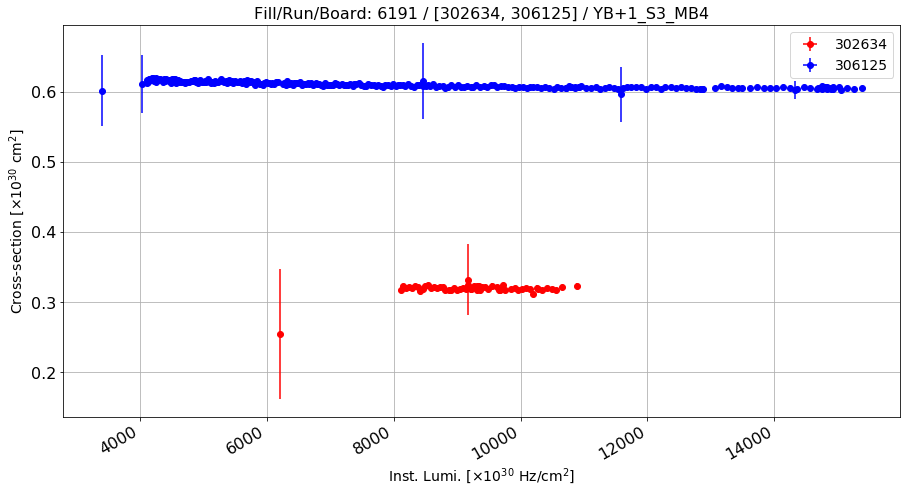

Anomalous CS: 0.319215817736 , Normal CS: 0.610278210272 , Ratio: 0.476933941991


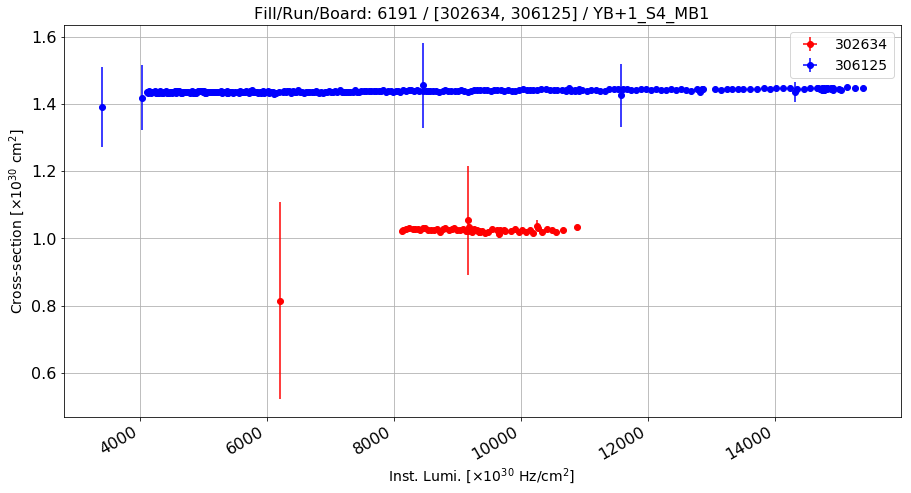

Anomalous CS: 1.02181758088 , Normal CS: 1.43848687838 , Ratio: 0.289658045383


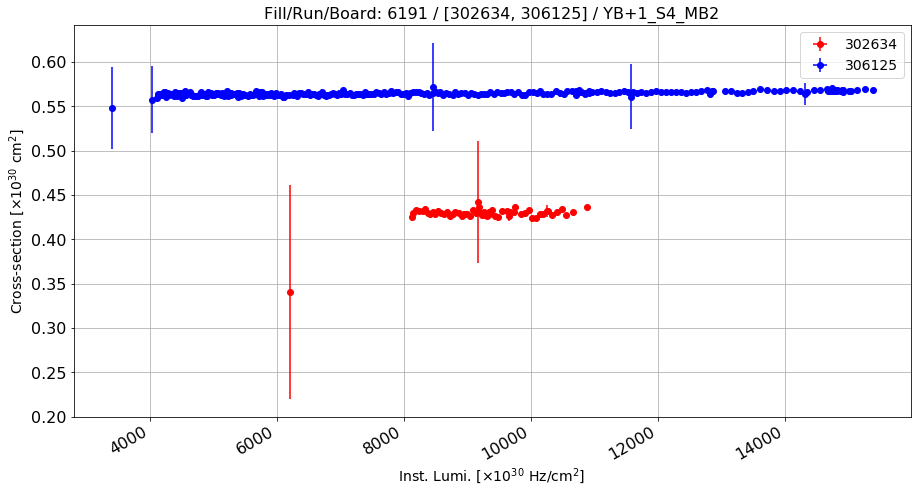

Anomalous CS: 0.428733634269 , Normal CS: 0.564790588792 , Ratio: 0.240898055355


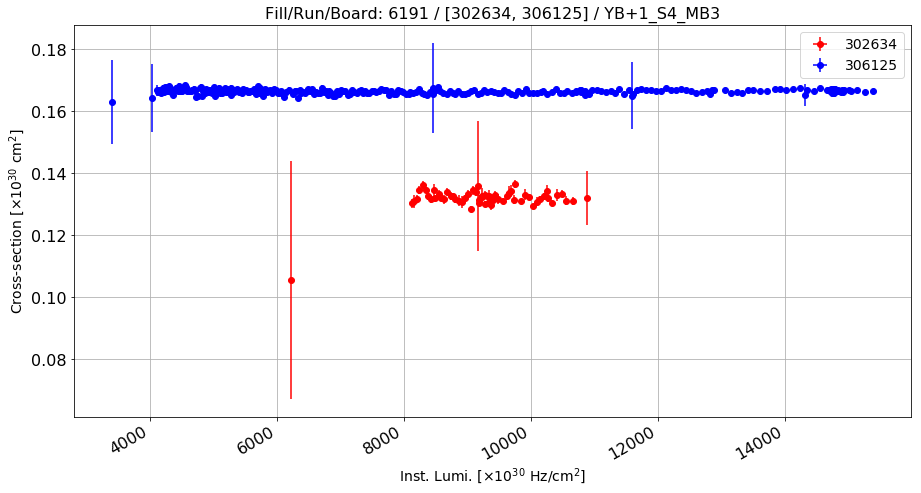

Anomalous CS: 0.131955533433 , Normal CS: 0.166493607195 , Ratio: 0.207443843304


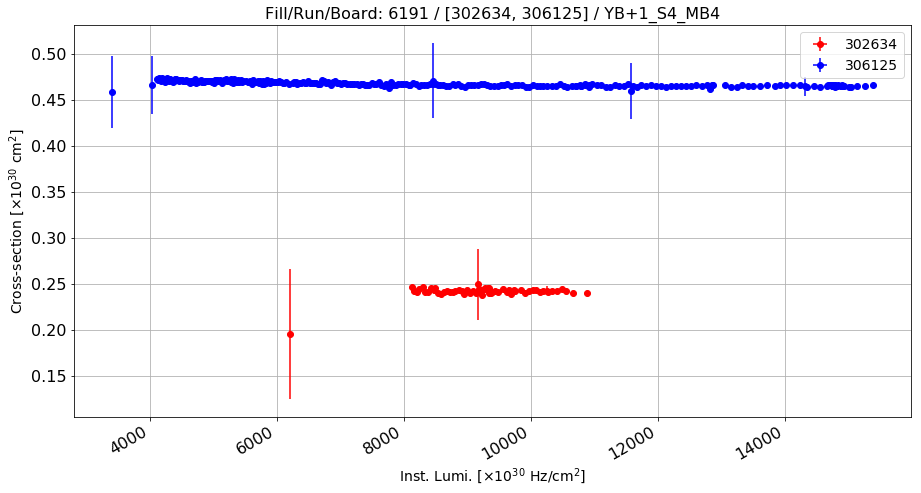

Anomalous CS: 0.241629154561 , Normal CS: 0.467517133308 , Ratio: 0.483165134824


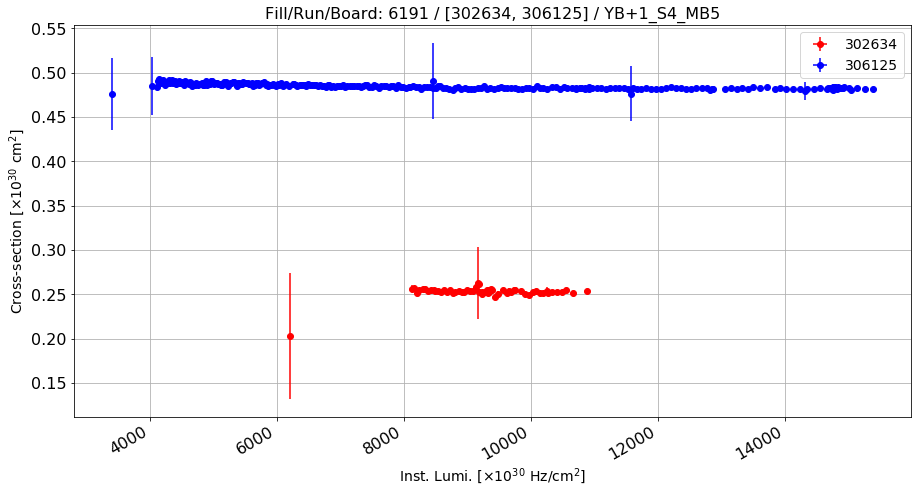

Anomalous CS: 0.252860953581 , Normal CS: 0.485020115092 , Ratio: 0.478658831432


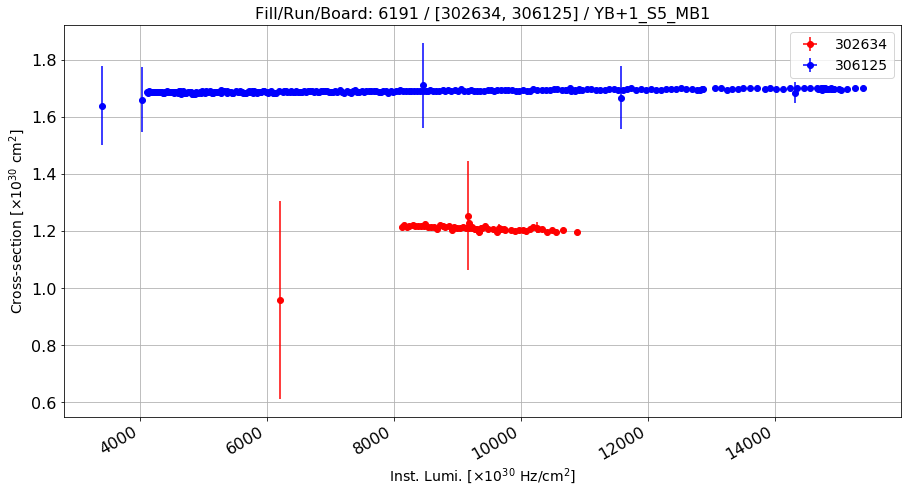

Anomalous CS: 1.2068736876 , Normal CS: 1.69094246338 , Ratio: 0.286271583014


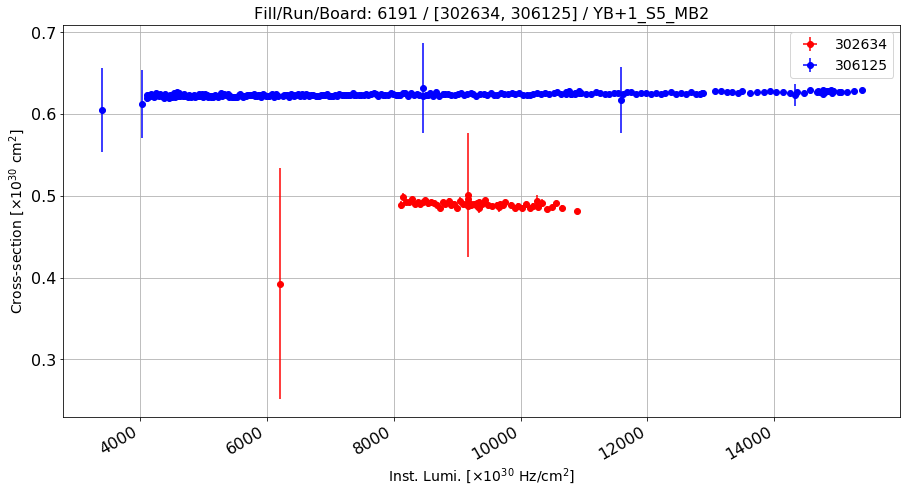

Anomalous CS: 0.488357902231 , Normal CS: 0.623973468911 , Ratio: 0.217341879802


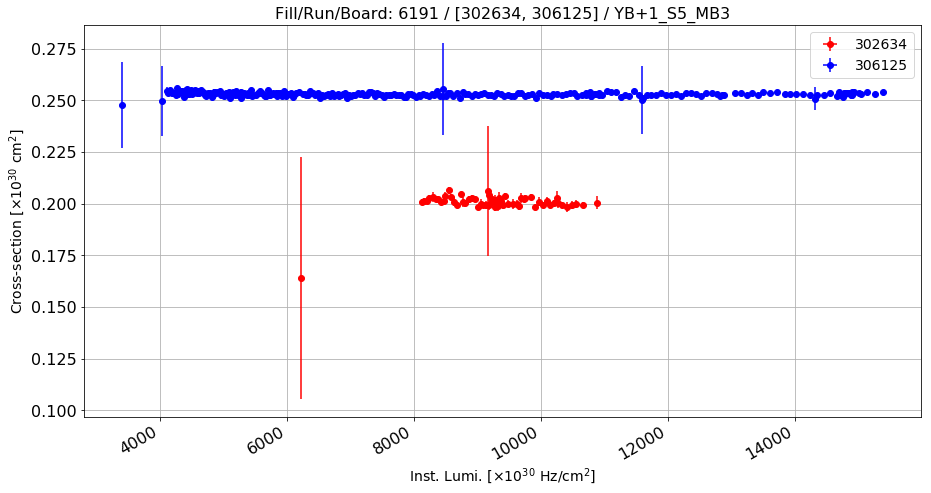

Anomalous CS: 0.200633704417 , Normal CS: 0.253126876439 , Ratio: 0.20737889536


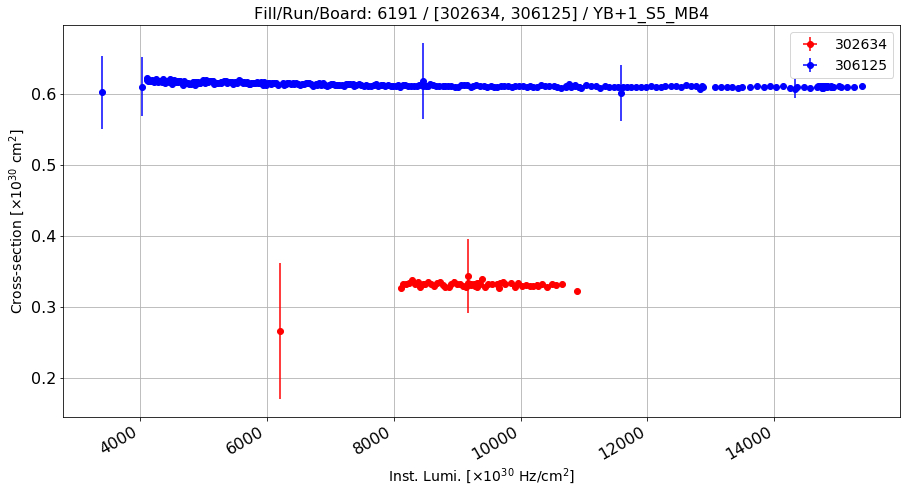

Anomalous CS: 0.330753547294 , Normal CS: 0.613295026493 , Ratio: 0.460694228706


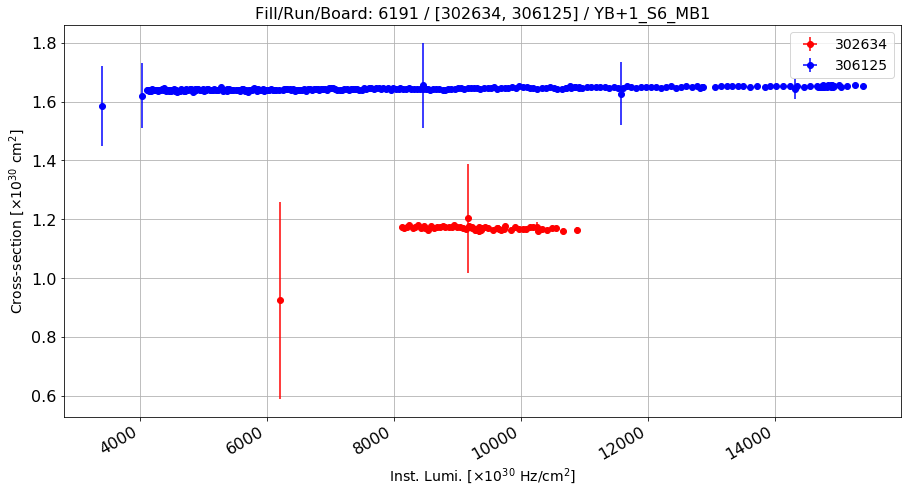

Anomalous CS: 1.1670034406 , Normal CS: 1.64357576068 , Ratio: 0.289960664716


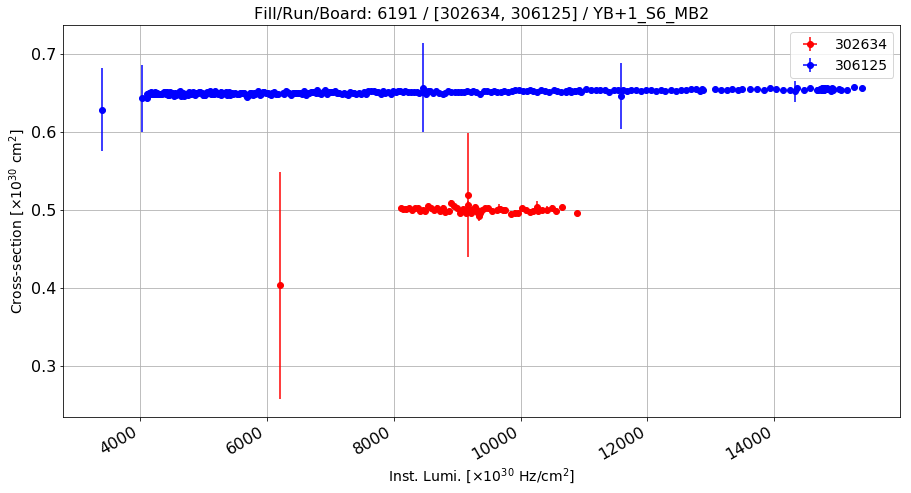

Anomalous CS: 0.499085757672 , Normal CS: 0.651179925083 , Ratio: 0.233567039696


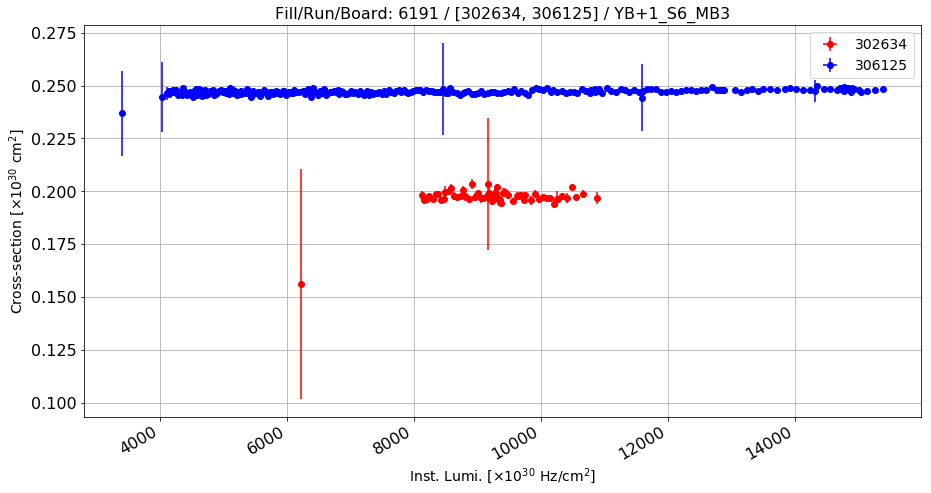

Anomalous CS: 0.197086387048 , Normal CS: 0.247175783493 , Ratio: 0.202646860211


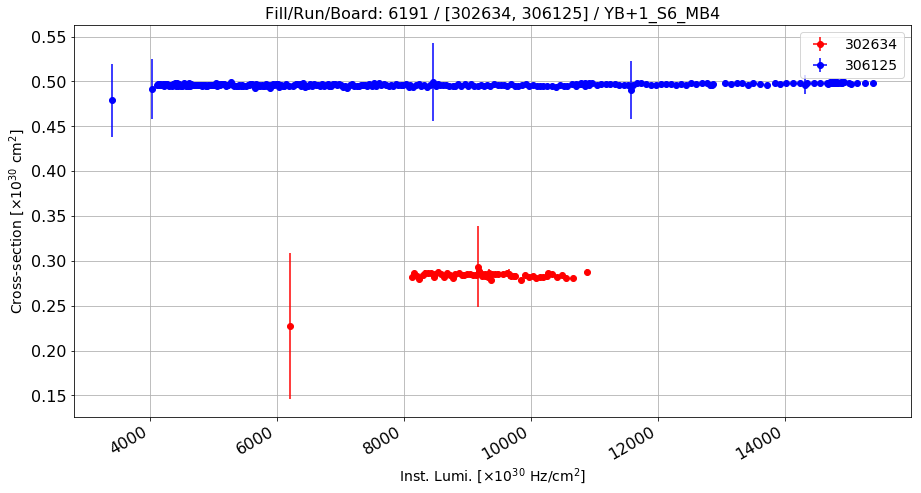

Anomalous CS: 0.283314765845 , Normal CS: 0.496328108437 , Ratio: 0.429178478856


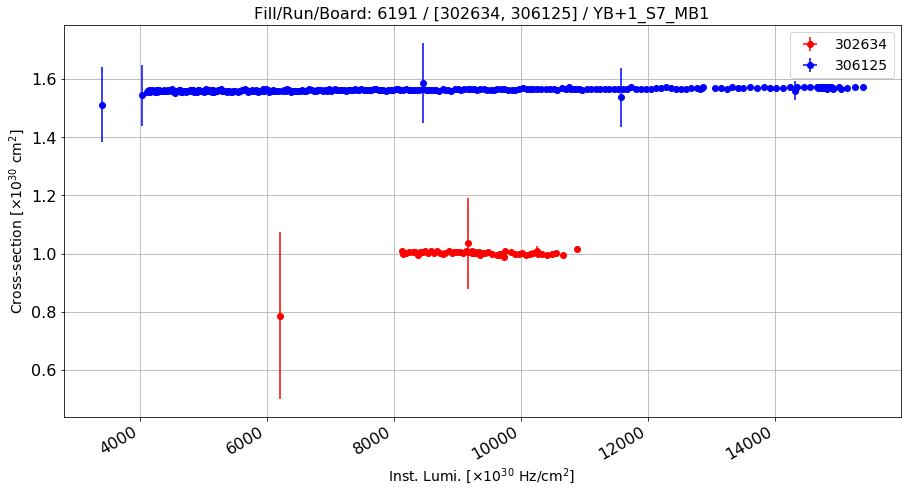

Anomalous CS: 0.999590054969 , Normal CS: 1.56335786316 , Ratio: 0.360613408791


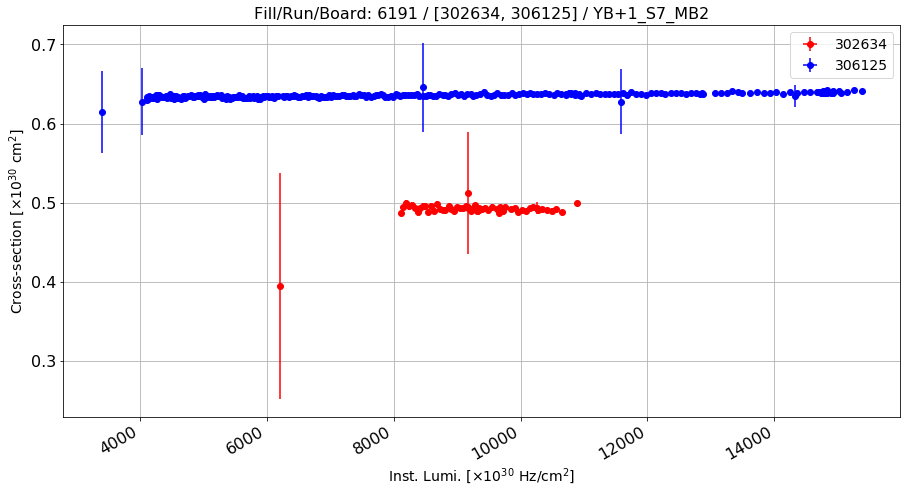

Anomalous CS: 0.49137572172 , Normal CS: 0.63576764148 , Ratio: 0.227114295128


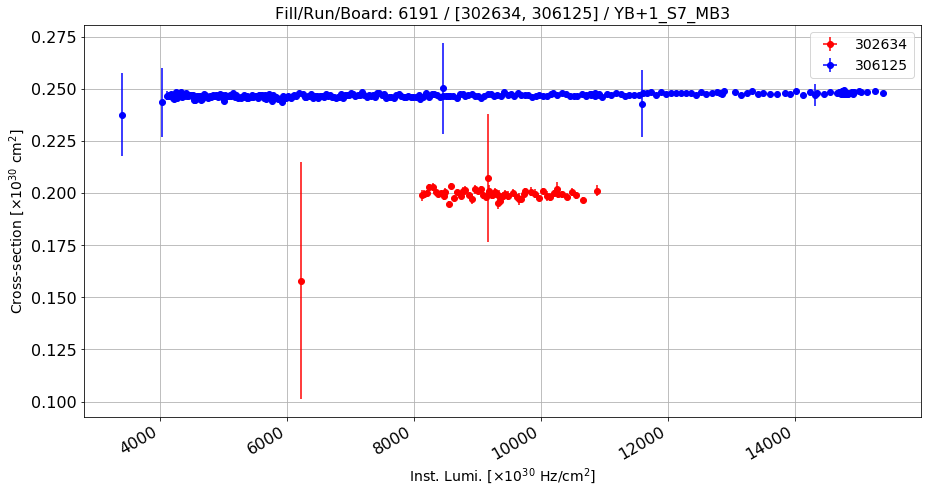

Anomalous CS: 0.198997797568 , Normal CS: 0.246967862636 , Ratio: 0.194236061954


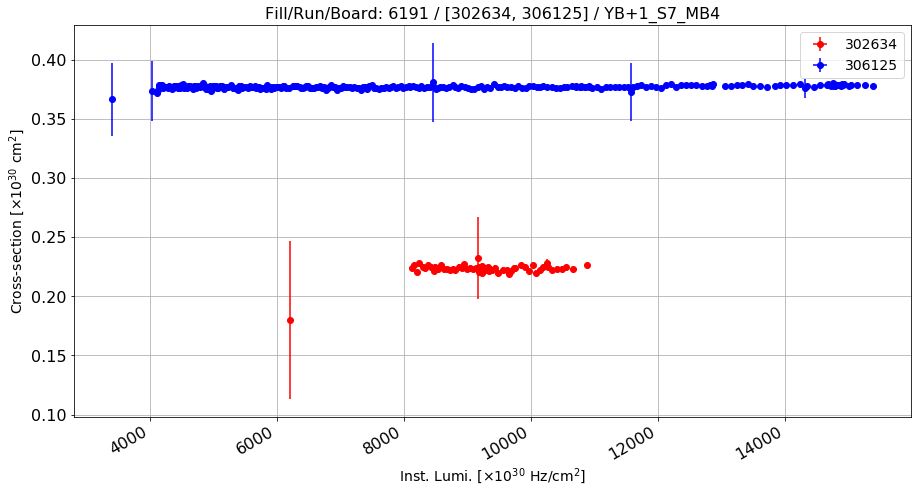

Anomalous CS: 0.222988288065 , Normal CS: 0.377027007605 , Ratio: 0.408561499397


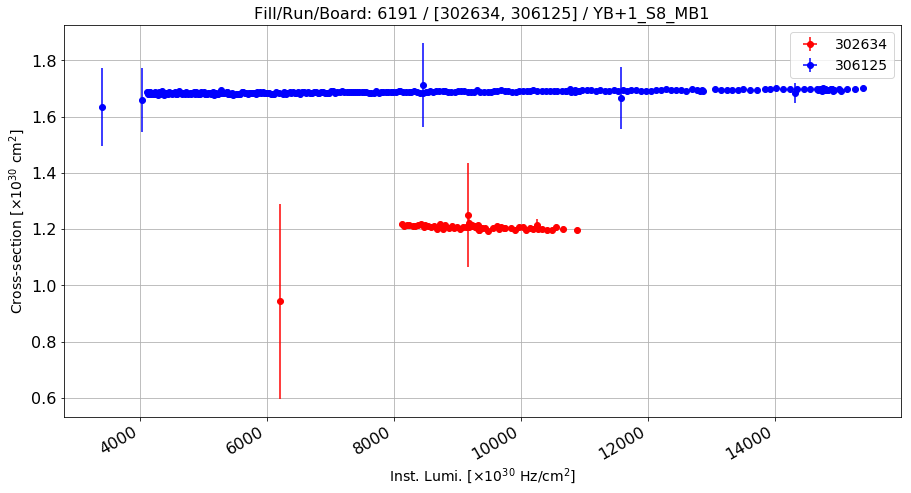

Anomalous CS: 1.20338556956 , Normal CS: 1.68775002163 , Ratio: 0.286988265954


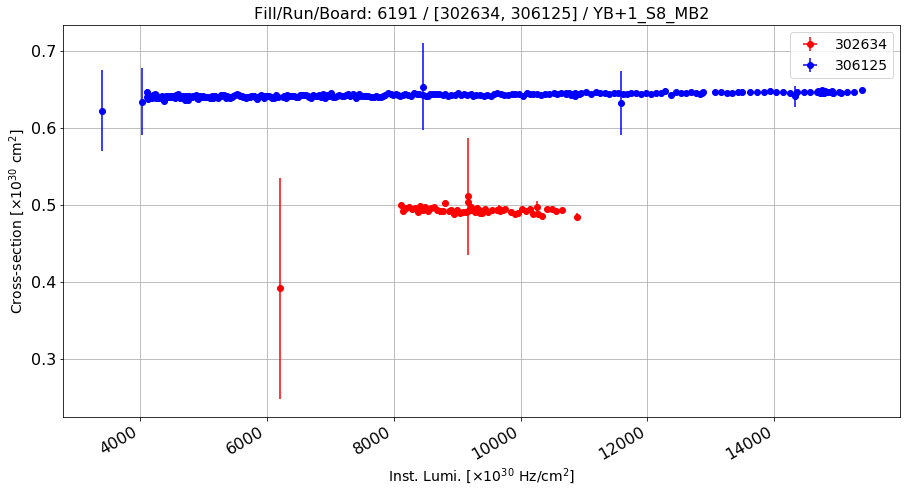

Anomalous CS: 0.491682733338 , Normal CS: 0.642603576219 , Ratio: 0.234858392431


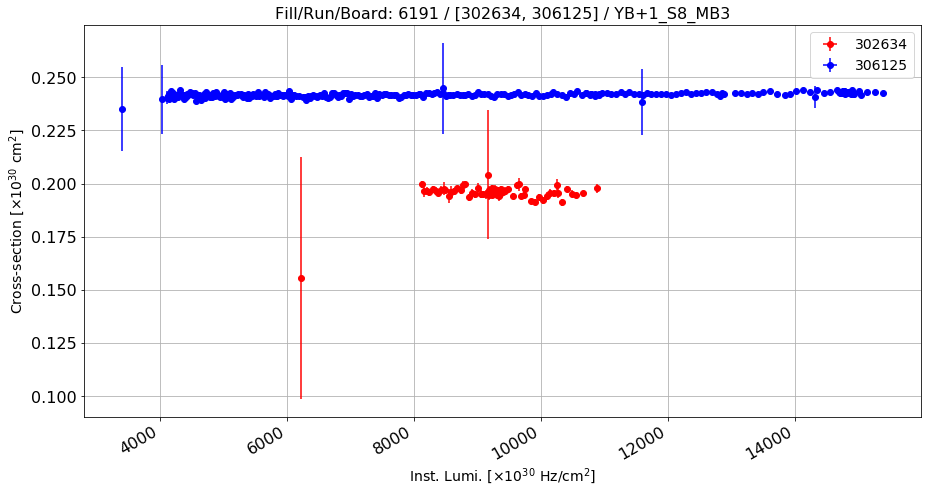

Anomalous CS: 0.195454187959 , Normal CS: 0.241800585107 , Ratio: 0.191671980971


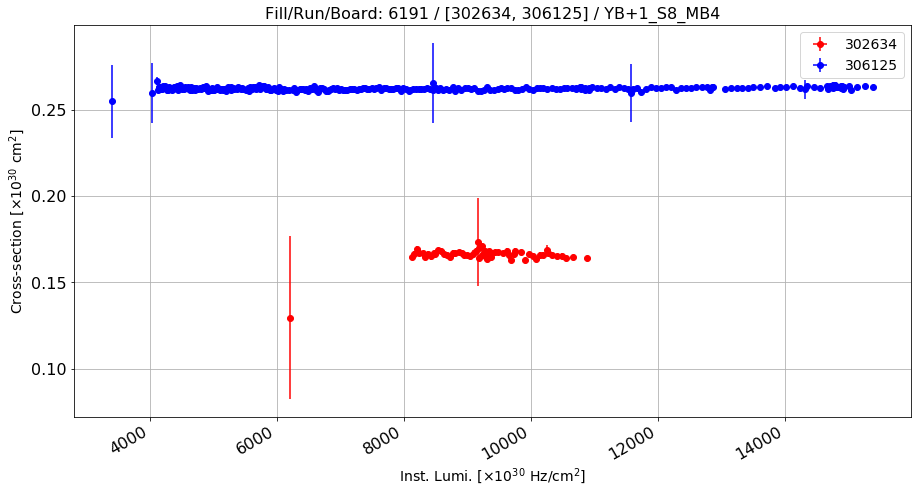

Anomalous CS: 0.165878566253 , Normal CS: 0.262488346361 , Ratio: 0.368053597226


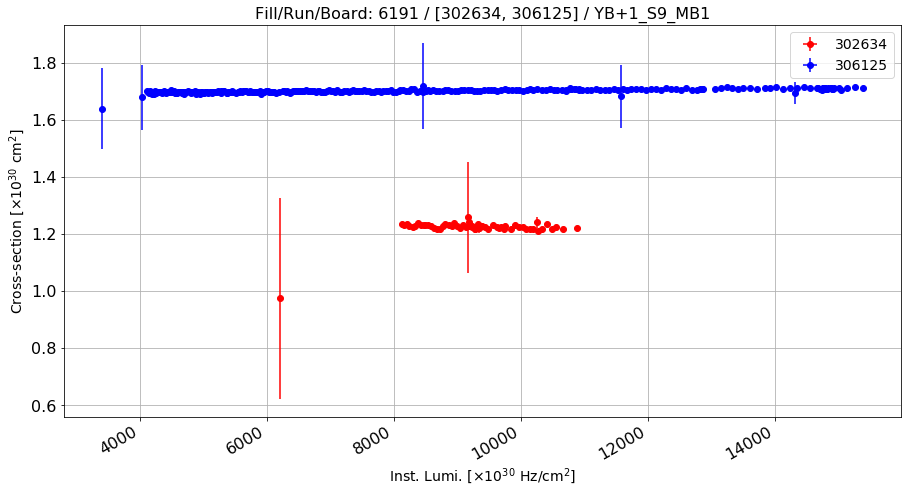

Anomalous CS: 1.22195157101 , Normal CS: 1.70110361785 , Ratio: 0.281671287868


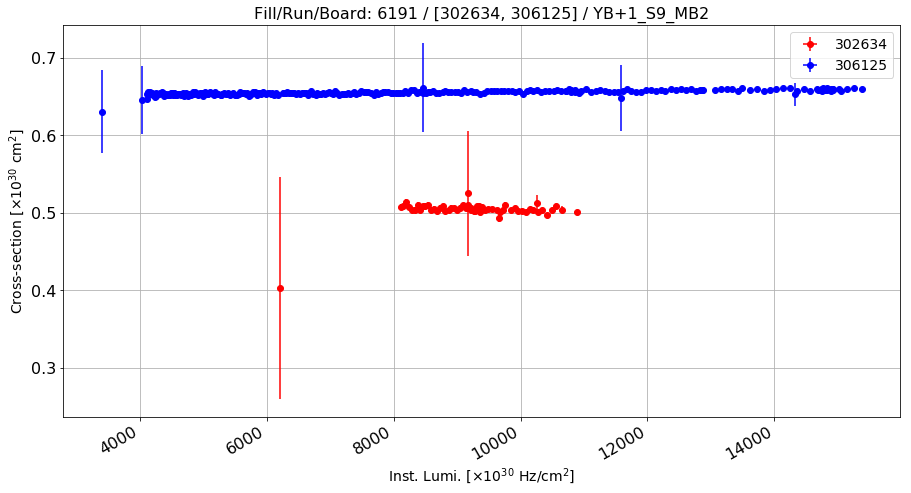

Anomalous CS: 0.503935263956 , Normal CS: 0.655673281144 , Ratio: 0.231423212675


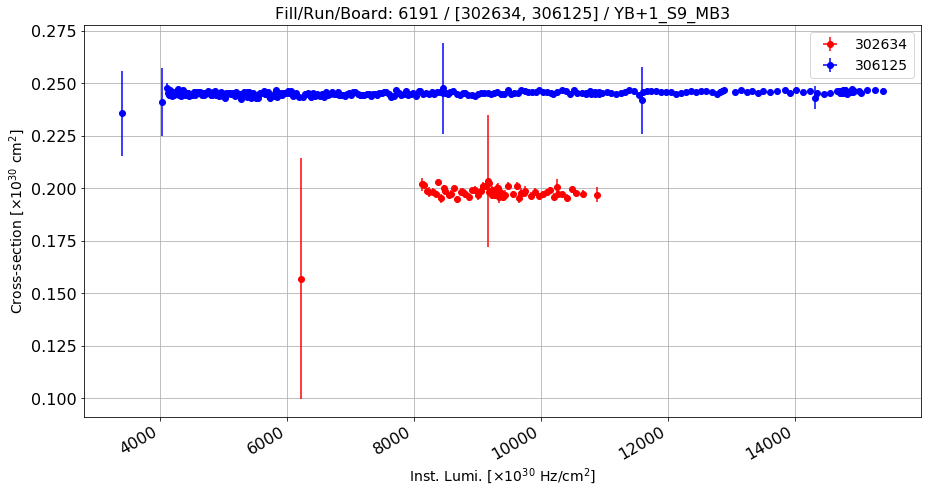

Anomalous CS: 0.197670231412 , Normal CS: 0.245296120149 , Ratio: 0.194156714374


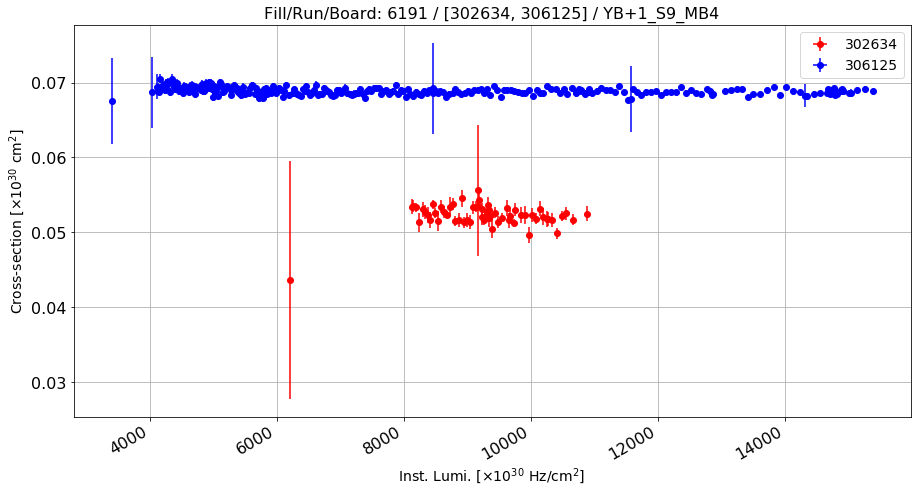

Anomalous CS: 0.0522746192377 , Normal CS: 0.0688974967436 , Ratio: 0.241269687456


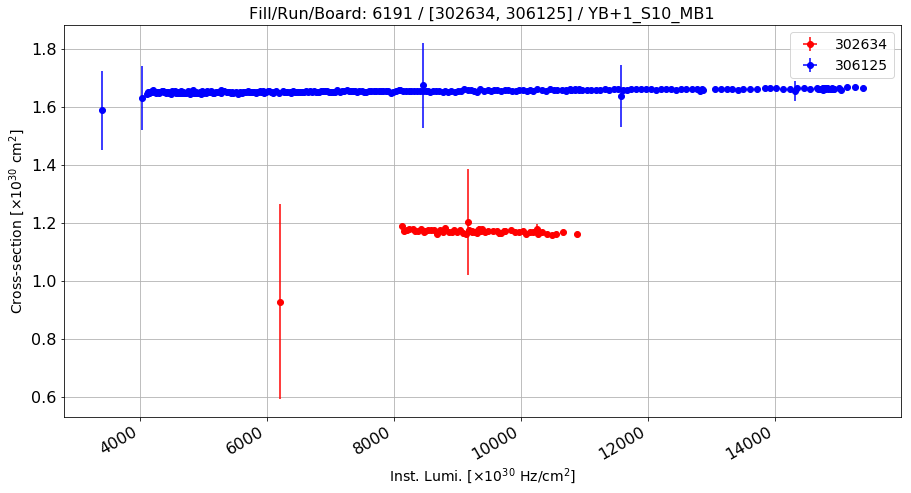

Anomalous CS: 1.16674880091 , Normal CS: 1.65396649849 , Ratio: 0.294575312152


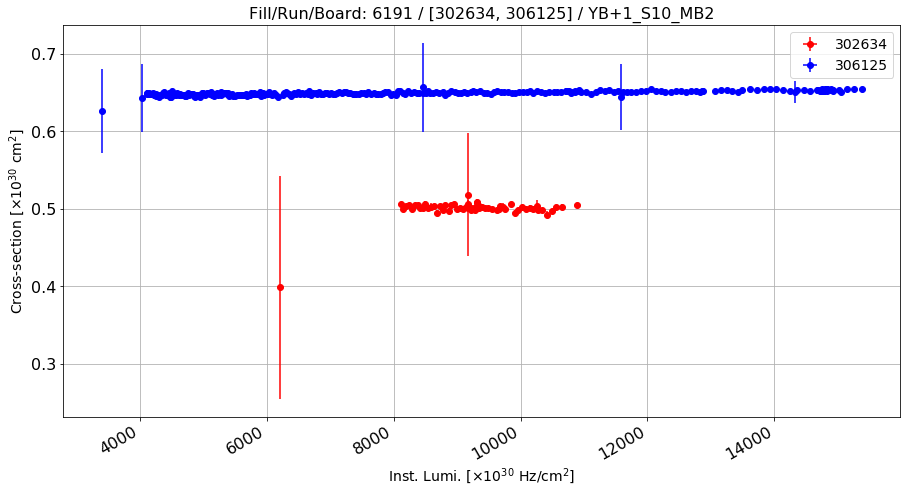

Anomalous CS: 0.500061244766 , Normal CS: 0.64948948732 , Ratio: 0.230070302094


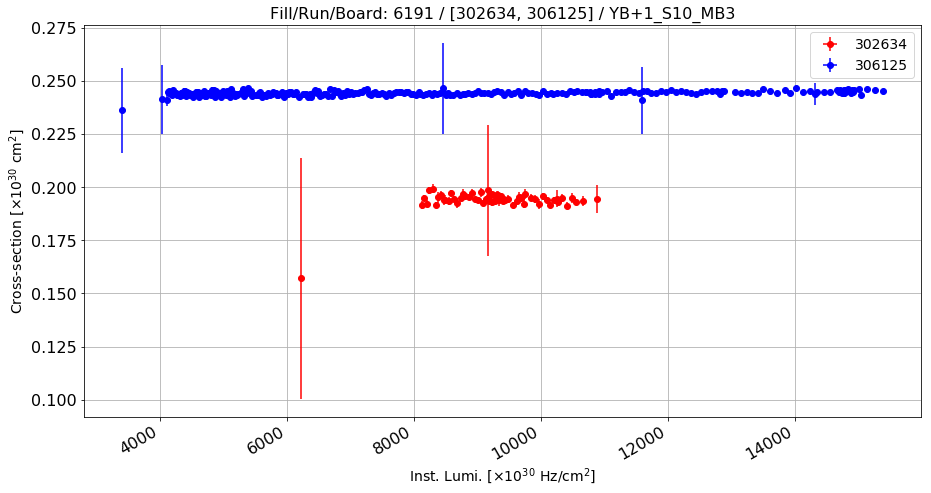

Anomalous CS: 0.194026312012 , Normal CS: 0.244302656143 , Ratio: 0.205795323413


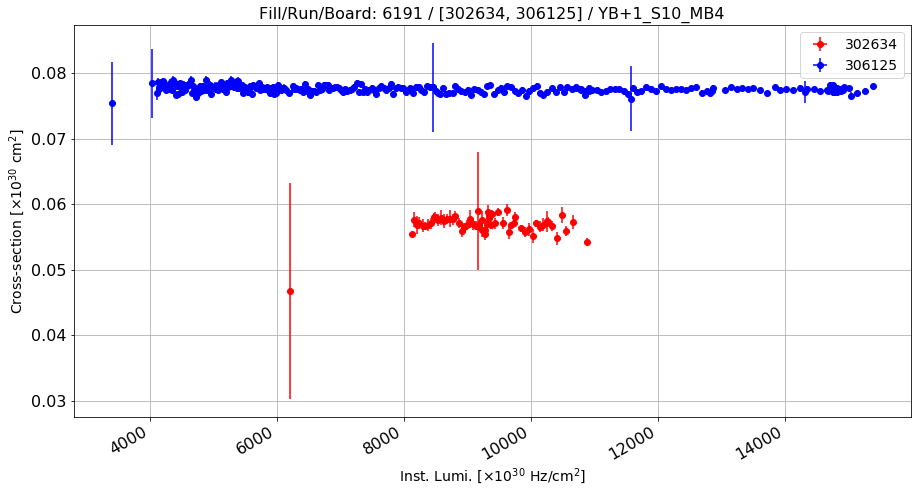

Anomalous CS: 0.0568654533086 , Normal CS: 0.077583032622 , Ratio: 0.267037503088


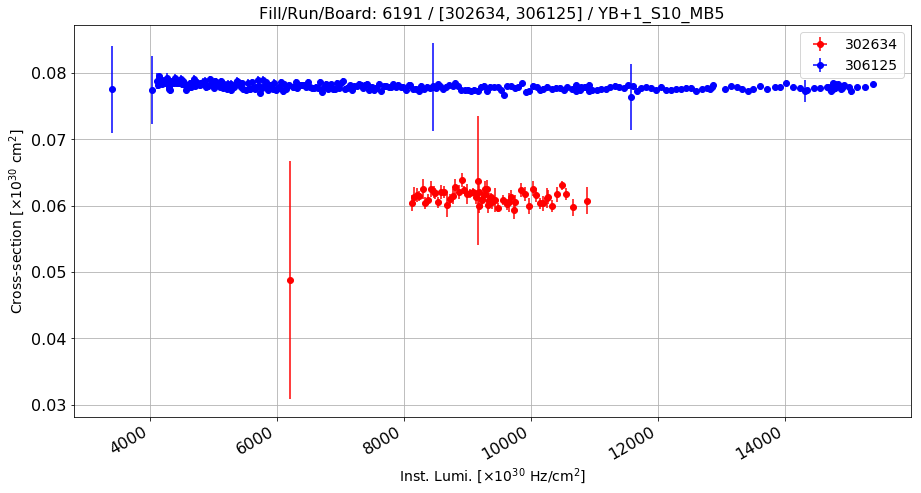

Anomalous CS: 0.061127163304 , Normal CS: 0.0779854792155 , Ratio: 0.216172498792


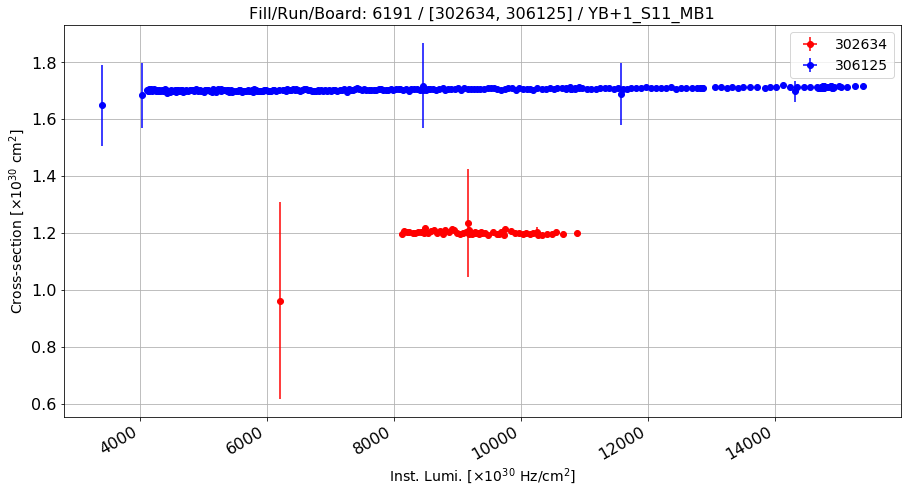

Anomalous CS: 1.19766893201 , Normal CS: 1.70441307071 , Ratio: 0.297312985574


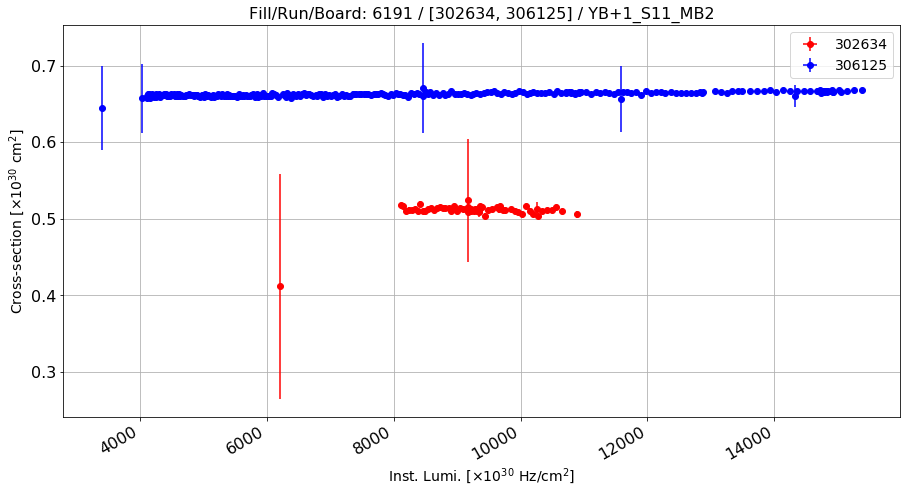

Anomalous CS: 0.510521597871 , Normal CS: 0.662878592885 , Ratio: 0.229841477232


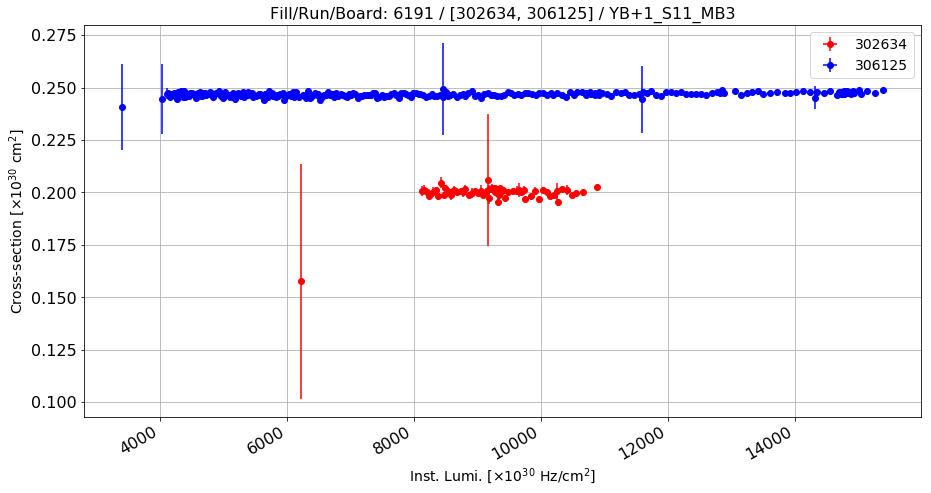

Anomalous CS: 0.19942334252 , Normal CS: 0.246770144449 , Ratio: 0.191866005649


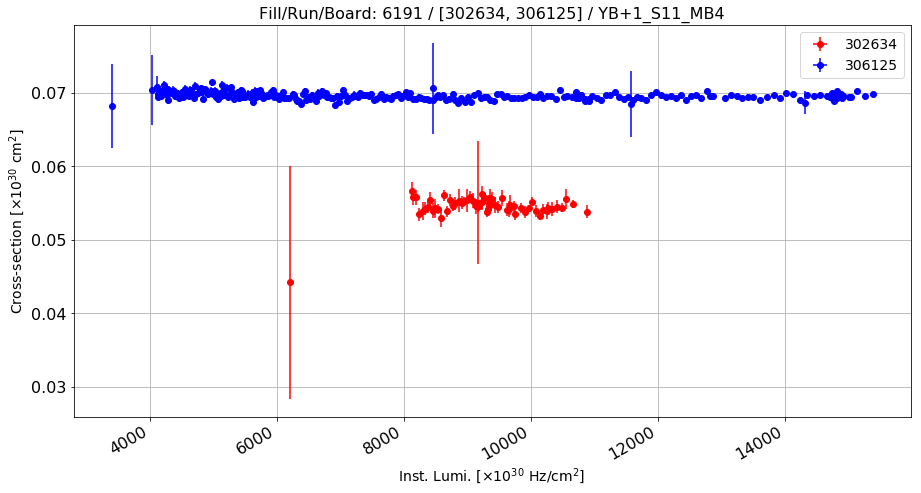

Anomalous CS: 0.0545472148661 , Normal CS: 0.0696394929833 , Ratio: 0.21672010336


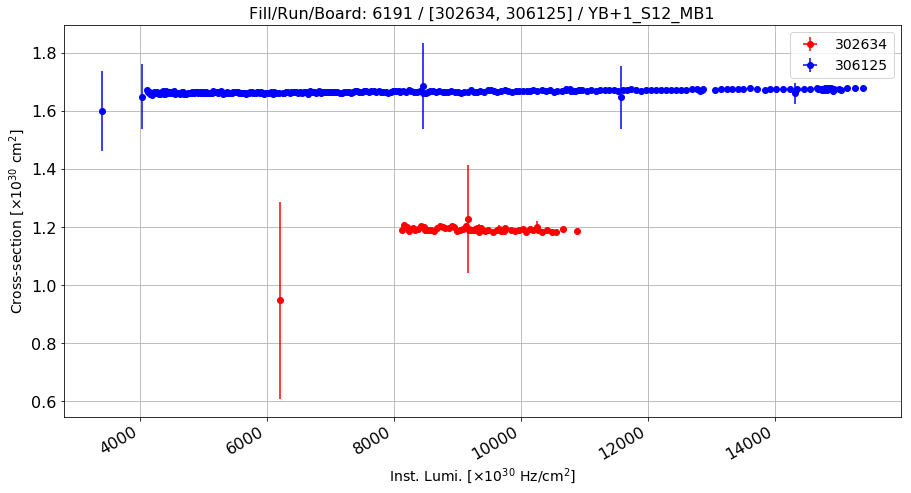

Anomalous CS: 1.18923101804 , Normal CS: 1.66727183561 , Ratio: 0.286720381983


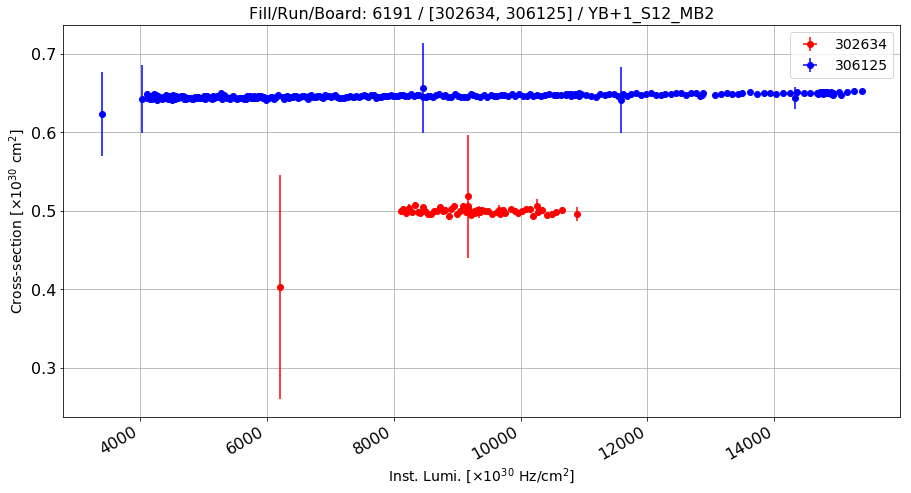

Anomalous CS: 0.498511125843 , Normal CS: 0.646109929728 , Ratio: 0.22844224658


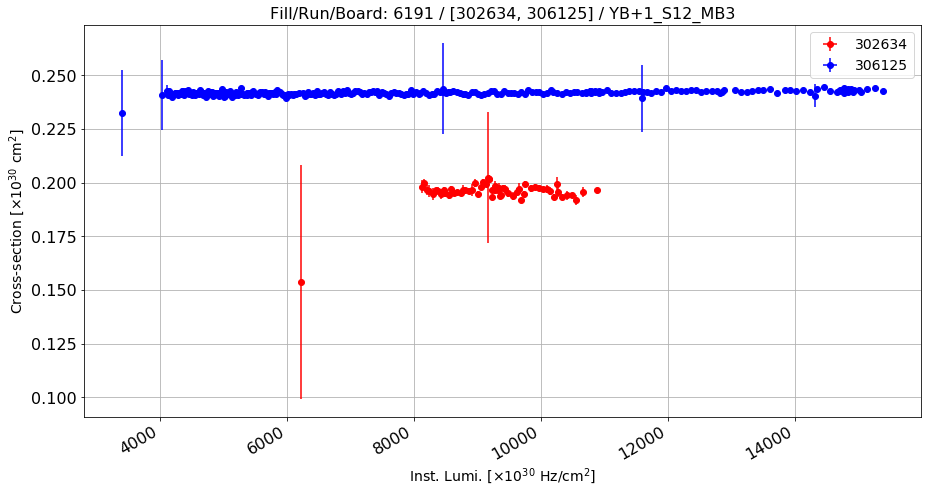

Anomalous CS: 0.195820574198 , Normal CS: 0.242002871936 , Ratio: 0.190833676348


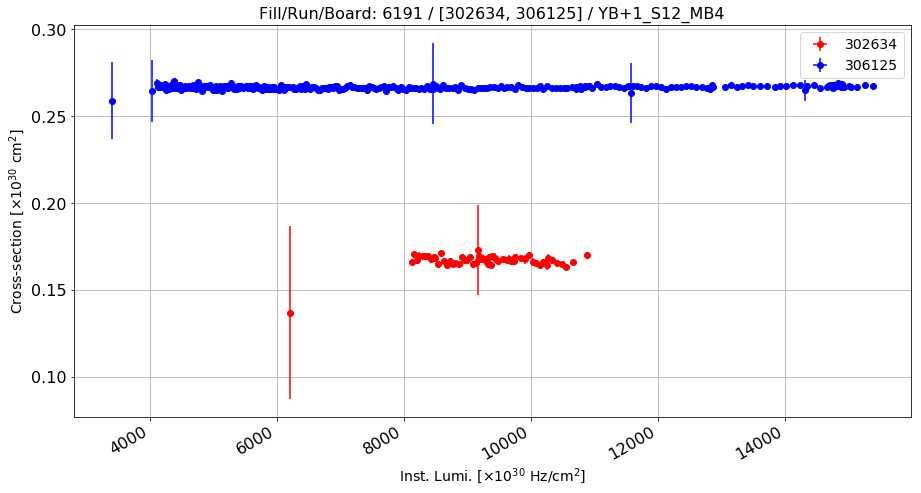

Anomalous CS: 0.166912107721 , Normal CS: 0.266725701092 , Ratio: 0.374218131071


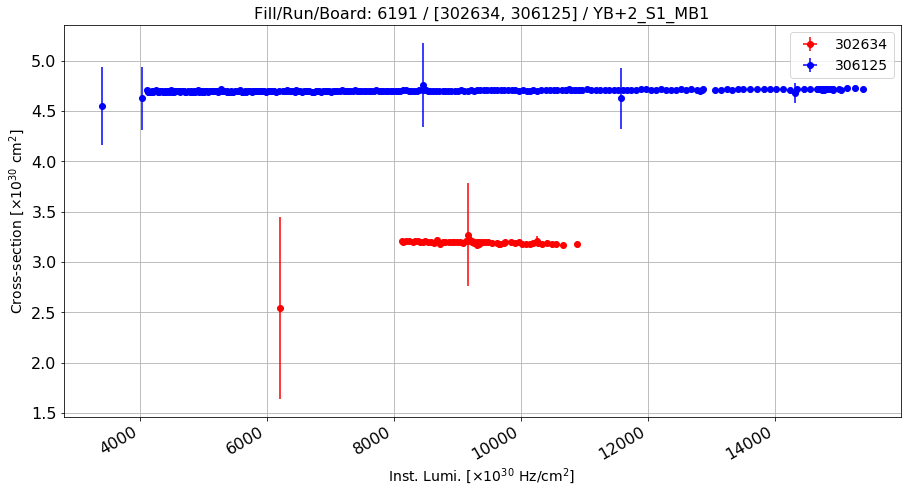

Anomalous CS: 3.18437732699 , Normal CS: 4.70128821496 , Ratio: 0.322658560507


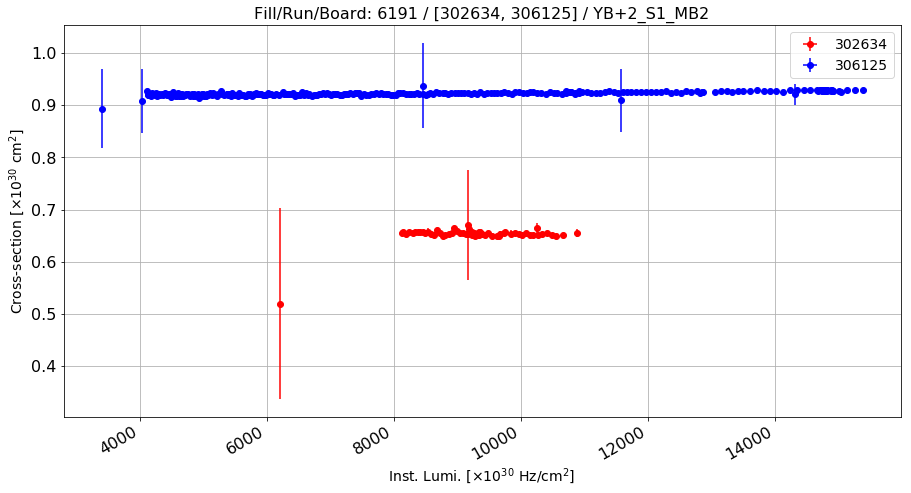

Anomalous CS: 0.652401331955 , Normal CS: 0.922365247435 , Ratio: 0.292686564494


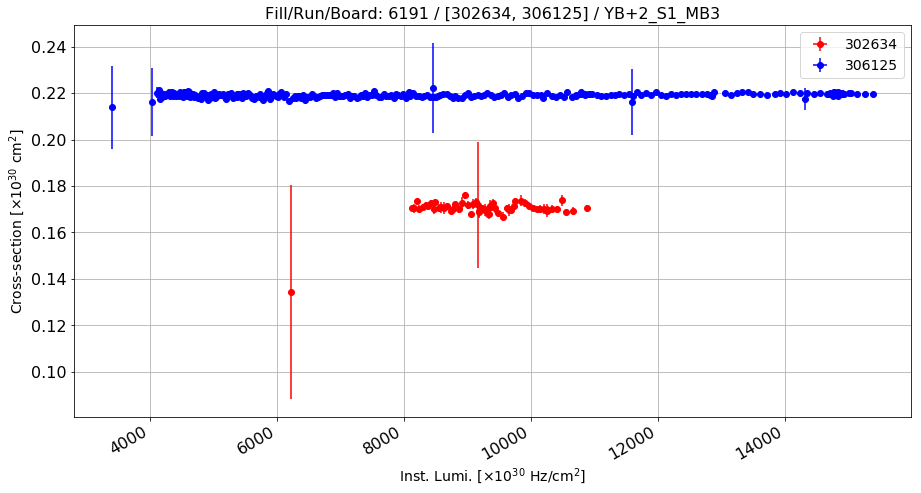

Anomalous CS: 0.170097884737 , Normal CS: 0.219143528099 , Ratio: 0.223806031544


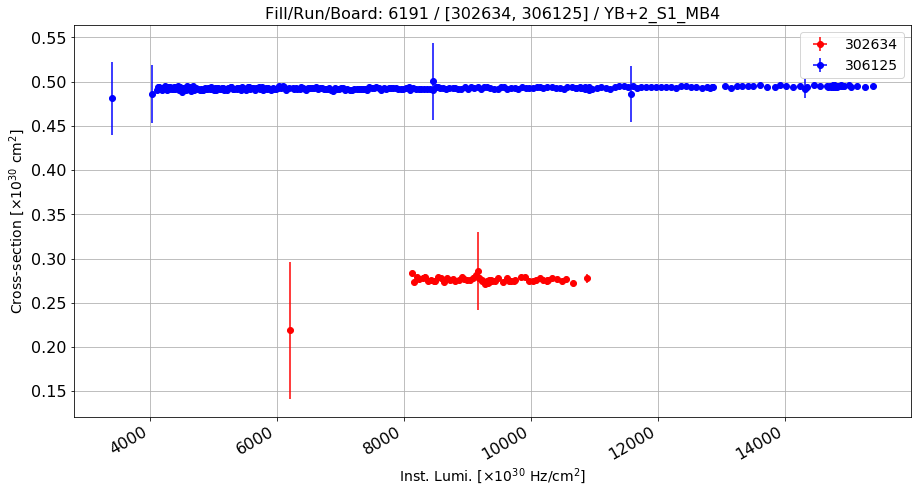

Anomalous CS: 0.275368427448 , Normal CS: 0.492866602787 , Ratio: 0.441292175426


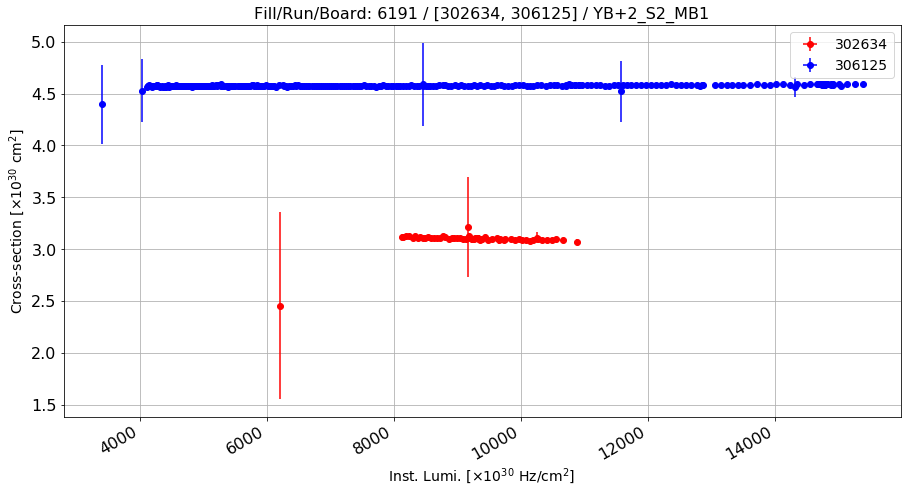

Anomalous CS: 3.09464022045 , Normal CS: 4.57560604319 , Ratio: 0.323665501085


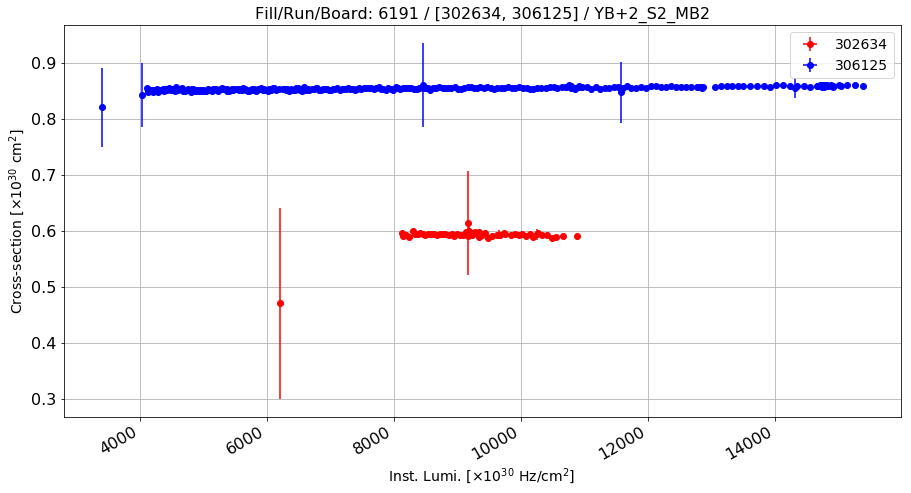

Anomalous CS: 0.591483446211 , Normal CS: 0.853685970613 , Ratio: 0.307141657972


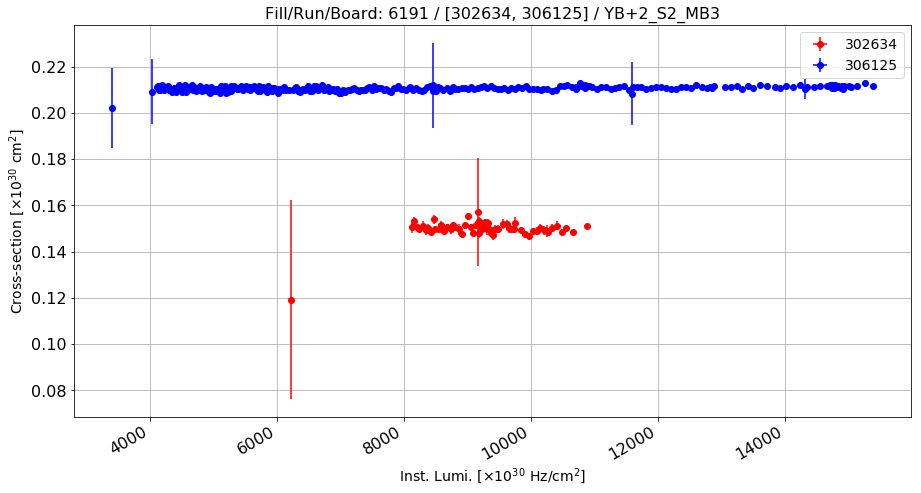

Anomalous CS: 0.149768764448 , Normal CS: 0.210560743233 , Ratio: 0.288714685612


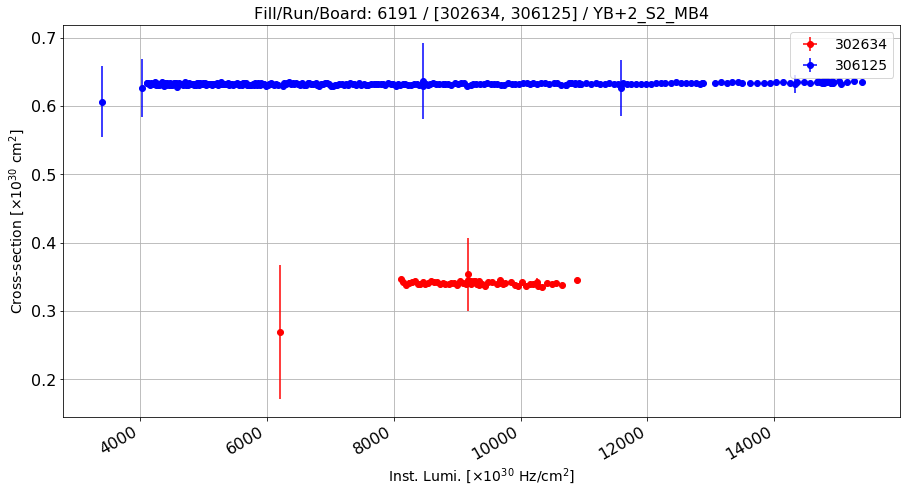

Anomalous CS: 0.339826456282 , Normal CS: 0.63275625662 , Ratio: 0.462942558487


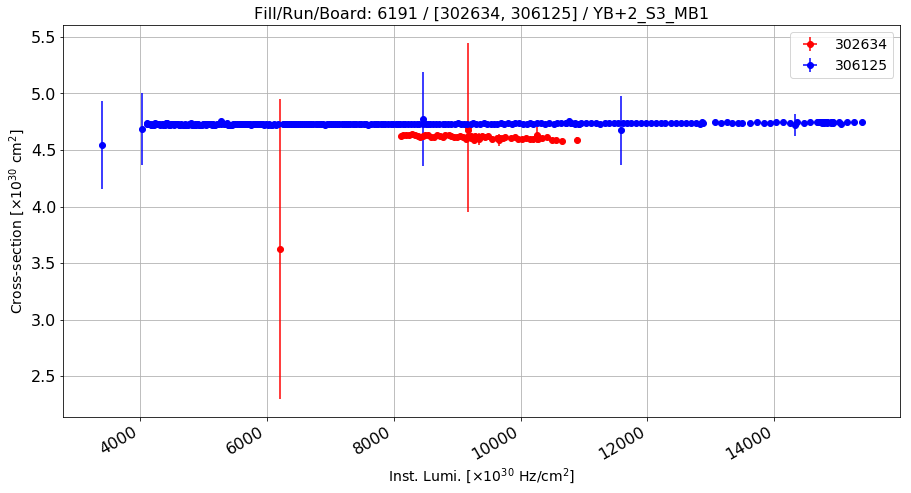

Anomalous CS: 4.59981809506 , Normal CS: 4.73183792402 , Ratio: 0.0279003277535


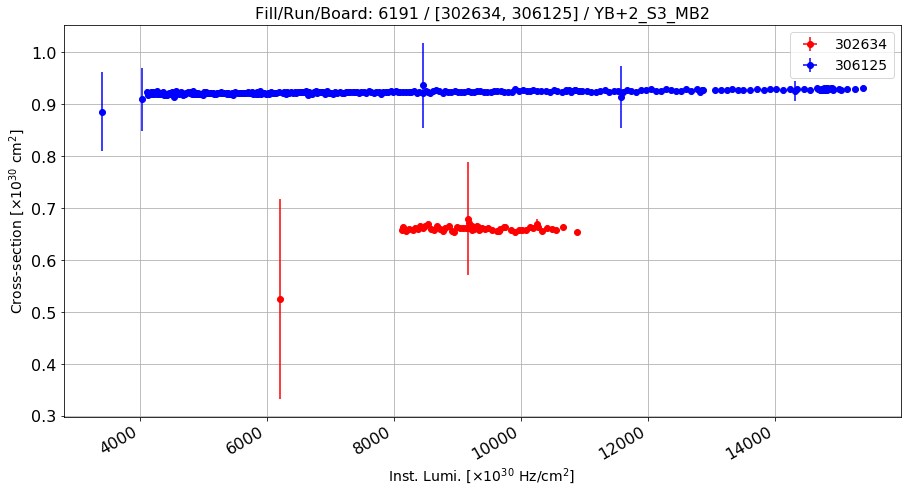

Anomalous CS: 0.659363435846 , Normal CS: 0.924000300218 , Ratio: 0.286403439814


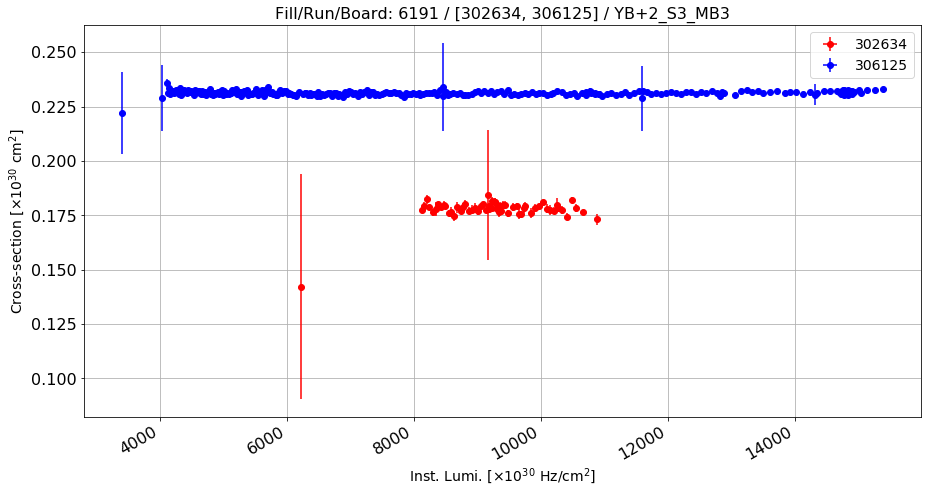

Anomalous CS: 0.177761341906 , Normal CS: 0.231257166 , Ratio: 0.231326125019


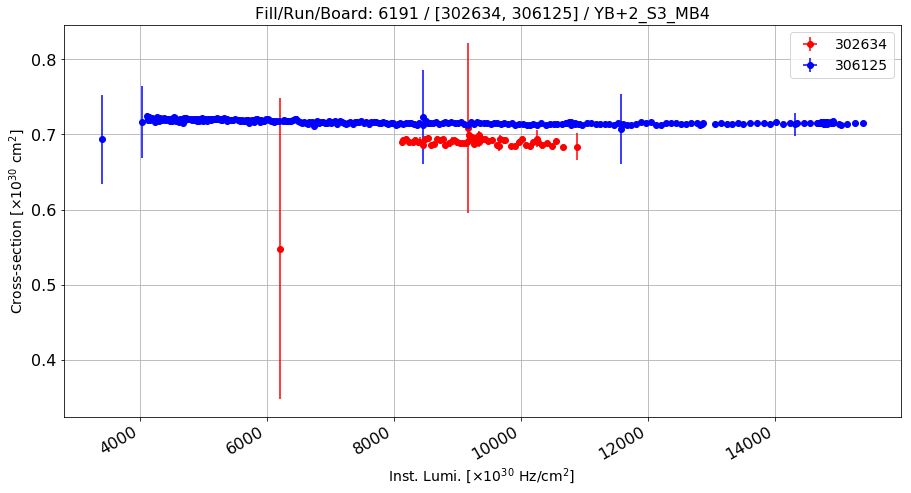

Anomalous CS: 0.688519010535 , Normal CS: 0.716790500653 , Ratio: 0.0394417756546


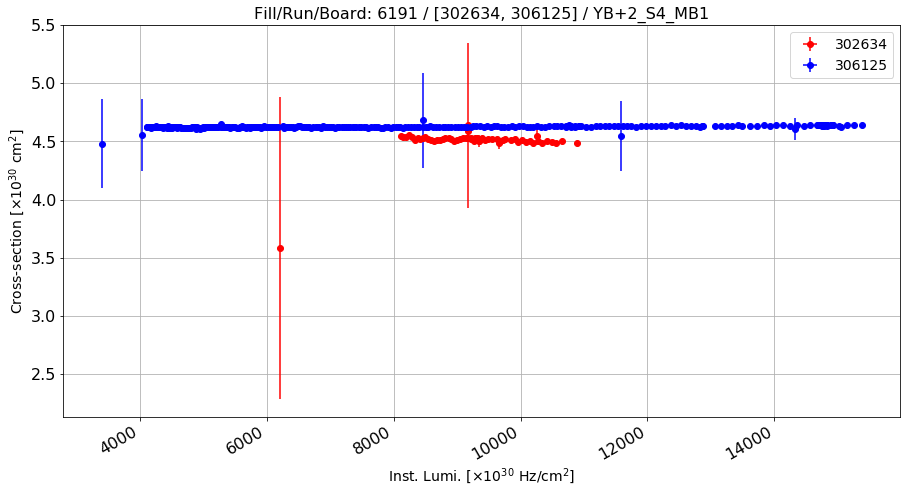

Anomalous CS: 4.50368809064 , Normal CS: 4.62503571108 , Ratio: 0.0262371207528


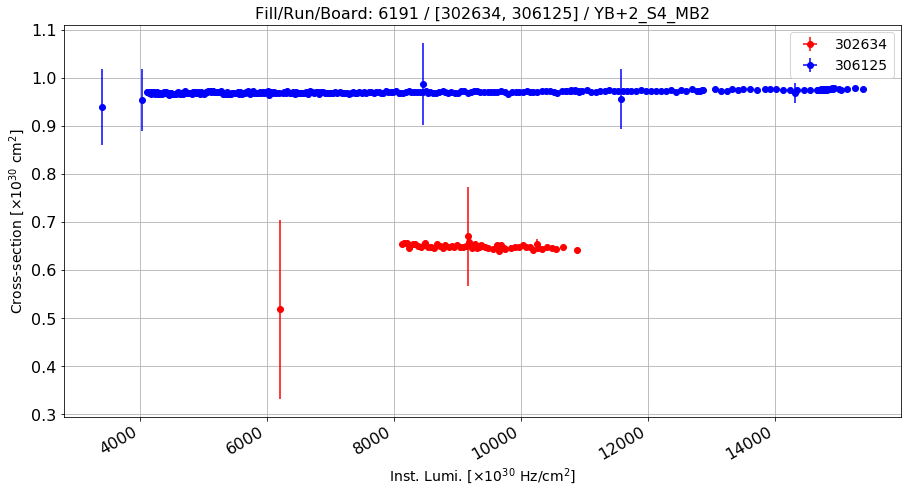

Anomalous CS: 0.647558062521 , Normal CS: 0.970871635131 , Ratio: 0.333013717685


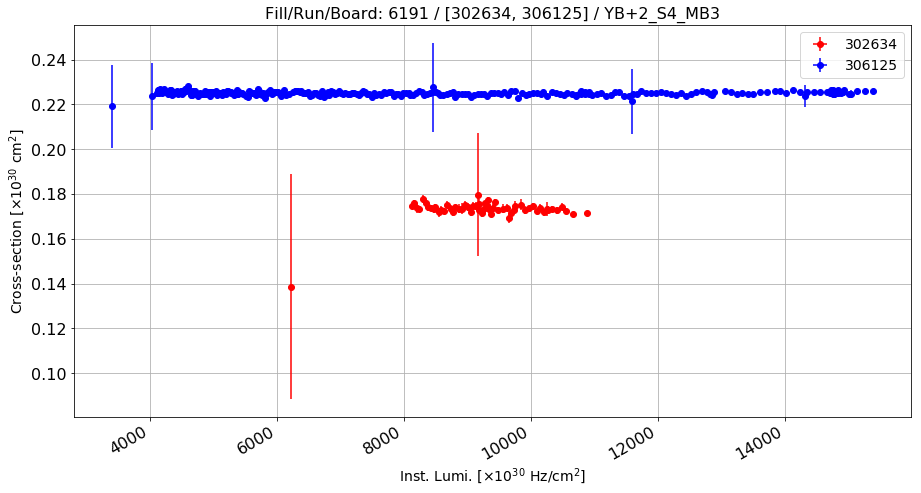

Anomalous CS: 0.17315885187 , Normal CS: 0.225082636469 , Ratio: 0.230687650608


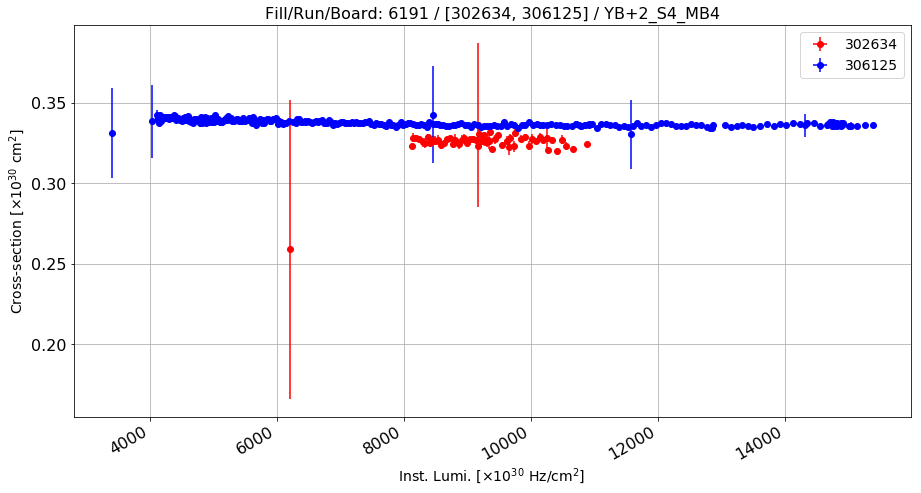

Anomalous CS: 0.325340752957 , Normal CS: 0.337728449711 , Ratio: 0.0366794587899


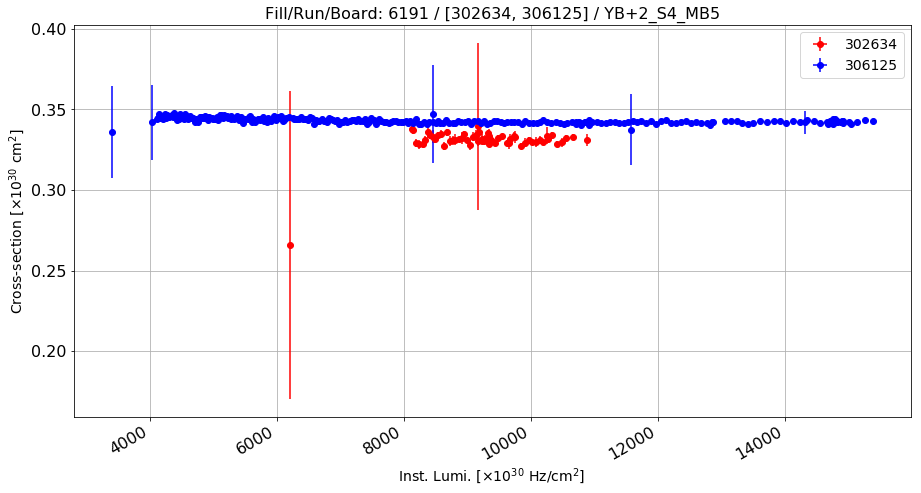

Anomalous CS: 0.330680784047 , Normal CS: 0.343135203101 , Ratio: 0.0362959525611


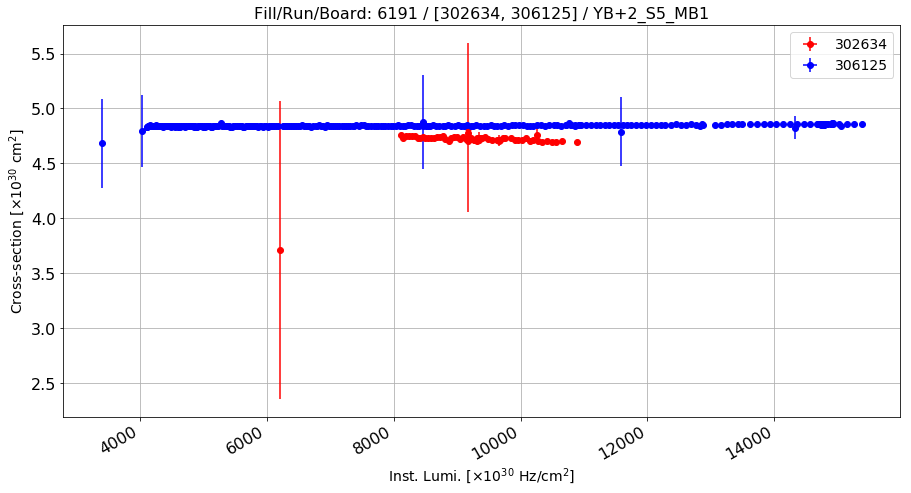

Anomalous CS: 4.71107755281 , Normal CS: 4.84364937722 , Ratio: 0.0273702355567


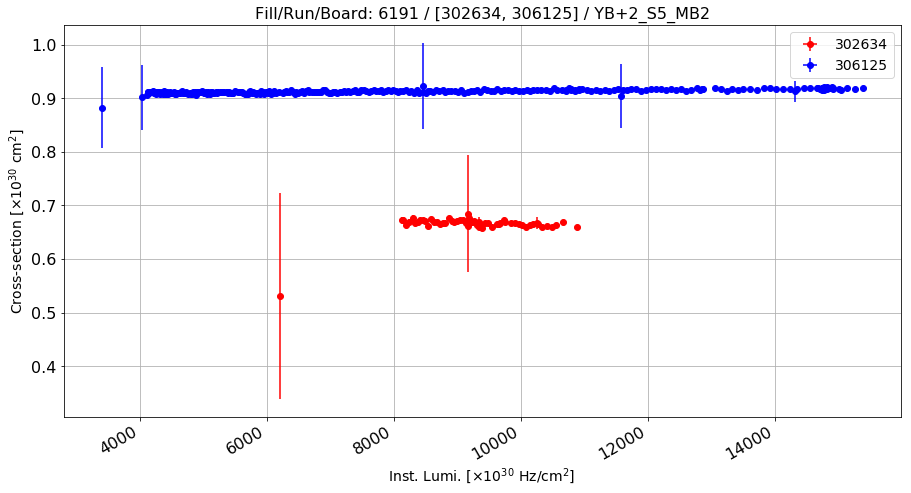

Anomalous CS: 0.665463177064 , Normal CS: 0.912997383819 , Ratio: 0.27112258057


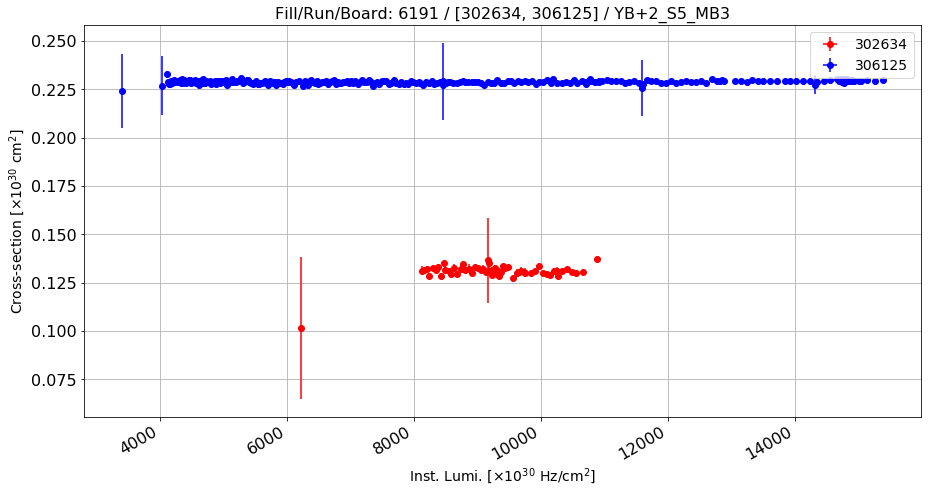

Anomalous CS: 0.130839071288 , Normal CS: 0.228863102201 , Ratio: 0.428308582601


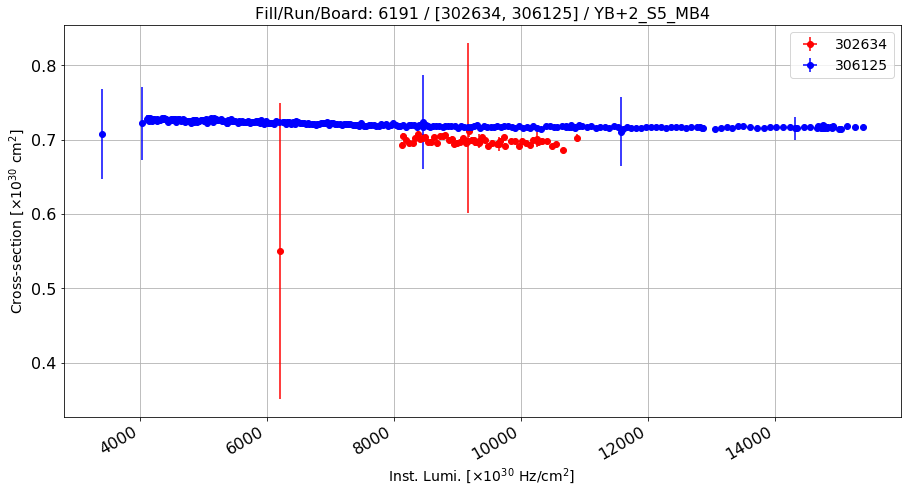

Anomalous CS: 0.696138290159 , Normal CS: 0.720889102623 , Ratio: 0.0343337309073


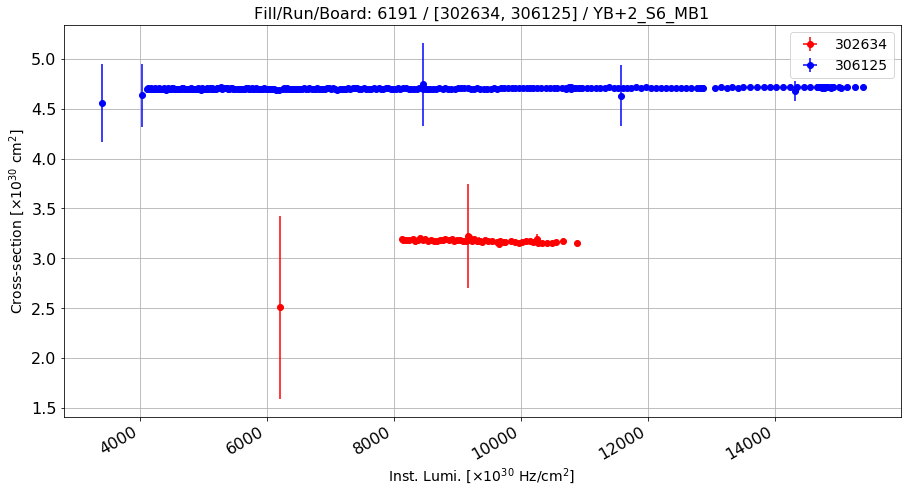

Anomalous CS: 3.16581746187 , Normal CS: 4.70273039748 , Ratio: 0.326812895001


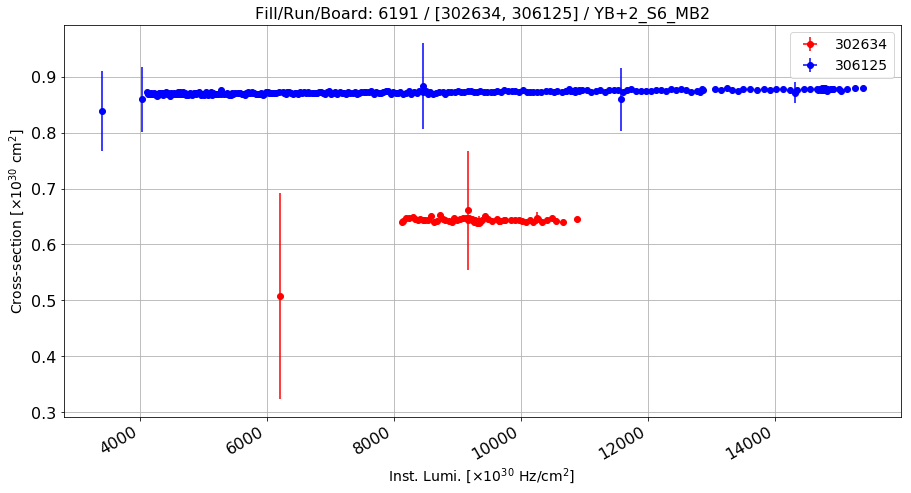

Anomalous CS: 0.641950802533 , Normal CS: 0.872353362222 , Ratio: 0.264116090643


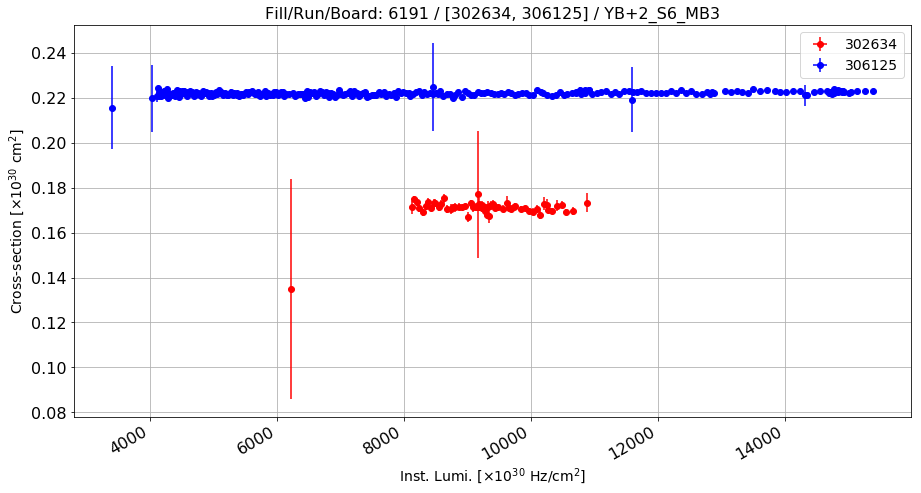

Anomalous CS: 0.17083972906 , Normal CS: 0.222132895444 , Ratio: 0.230912068567


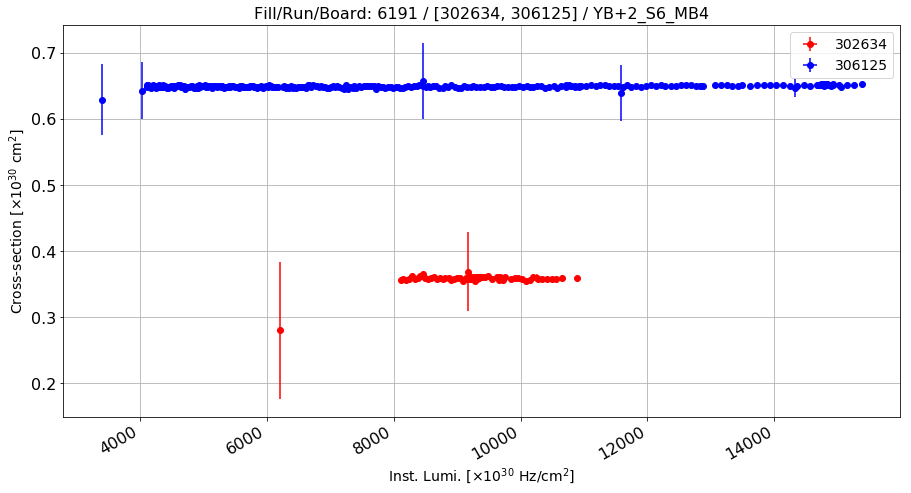

Anomalous CS: 0.358045202914 , Normal CS: 0.64956360811 , Ratio: 0.448791160029


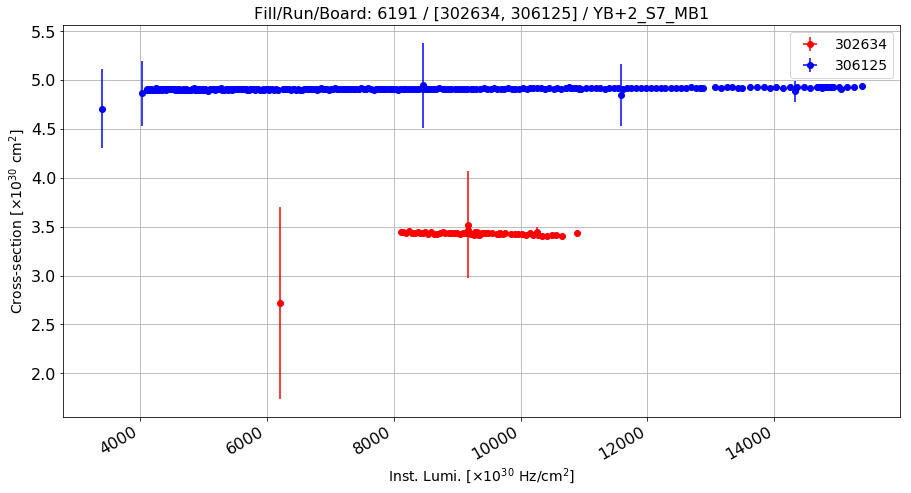

Anomalous CS: 3.42111073256 , Normal CS: 4.91070327618 , Ratio: 0.303335888944


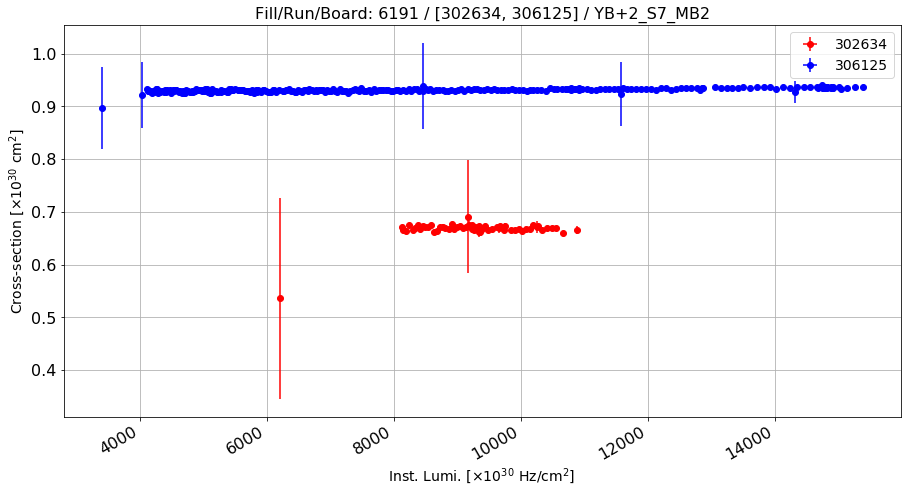

Anomalous CS: 0.667376879215 , Normal CS: 0.931046319841 , Ratio: 0.283196909763


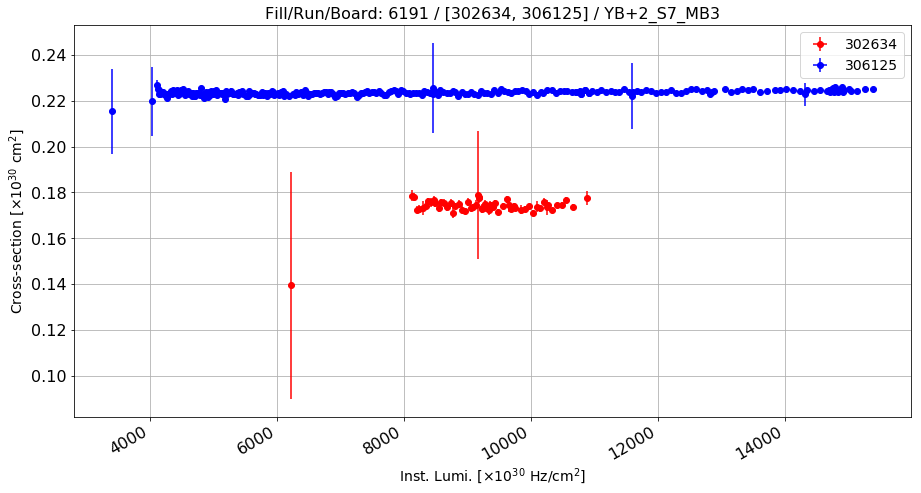

Anomalous CS: 0.173809729254 , Normal CS: 0.223561999236 , Ratio: 0.222543500915


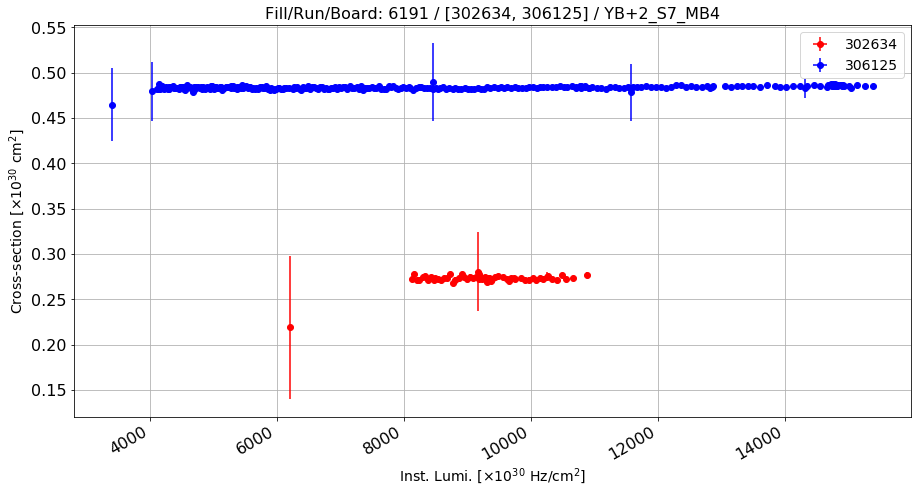

Anomalous CS: 0.272625181901 , Normal CS: 0.4837669205 , Ratio: 0.436453444111


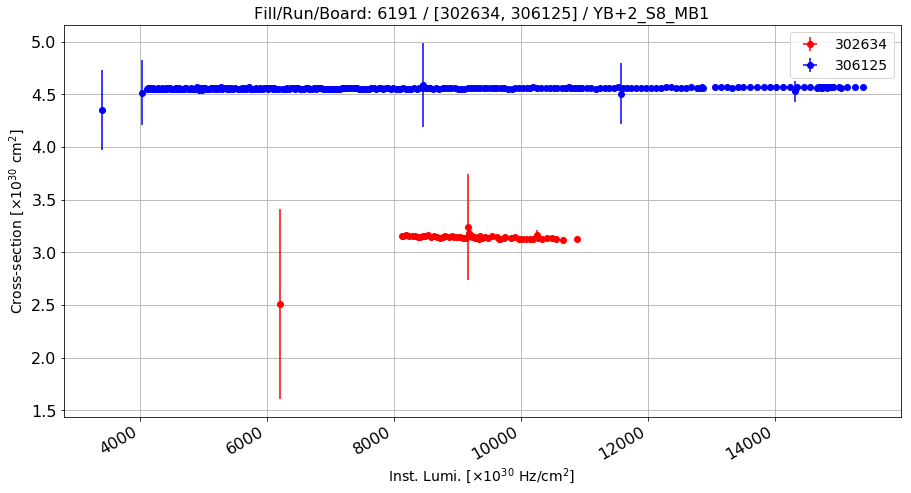

Anomalous CS: 3.13487417393 , Normal CS: 4.55702629981 , Ratio: 0.312078981406


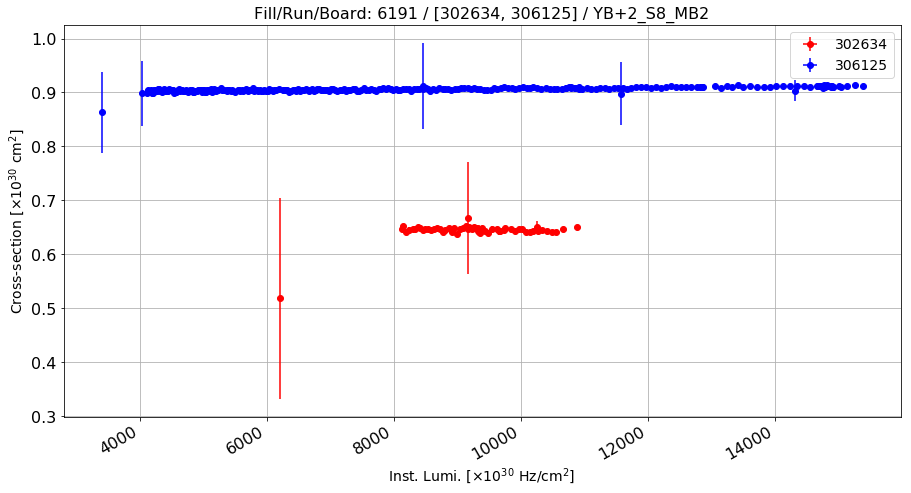

Anomalous CS: 0.644250245269 , Normal CS: 0.906045140129 , Ratio: 0.288942441458


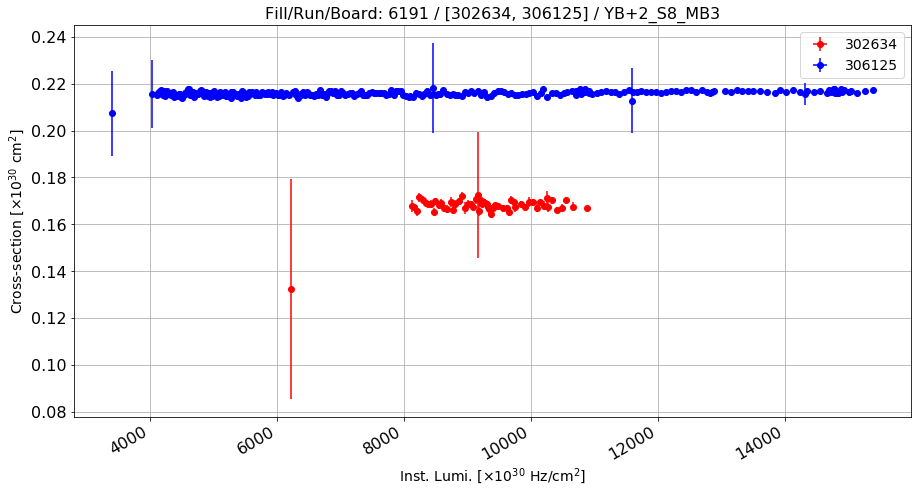

Anomalous CS: 0.167739024265 , Normal CS: 0.215934709379 , Ratio: 0.223195637479


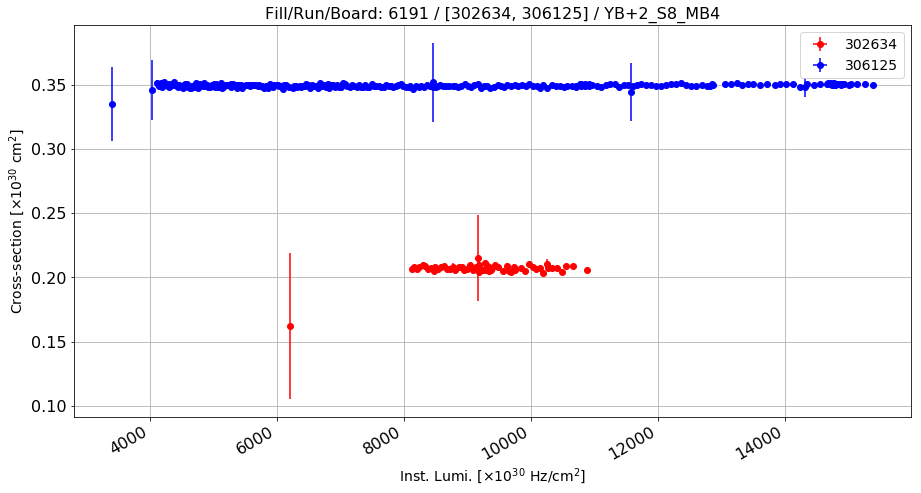

Anomalous CS: 0.20654246334 , Normal CS: 0.349314297816 , Ratio: 0.408720271024


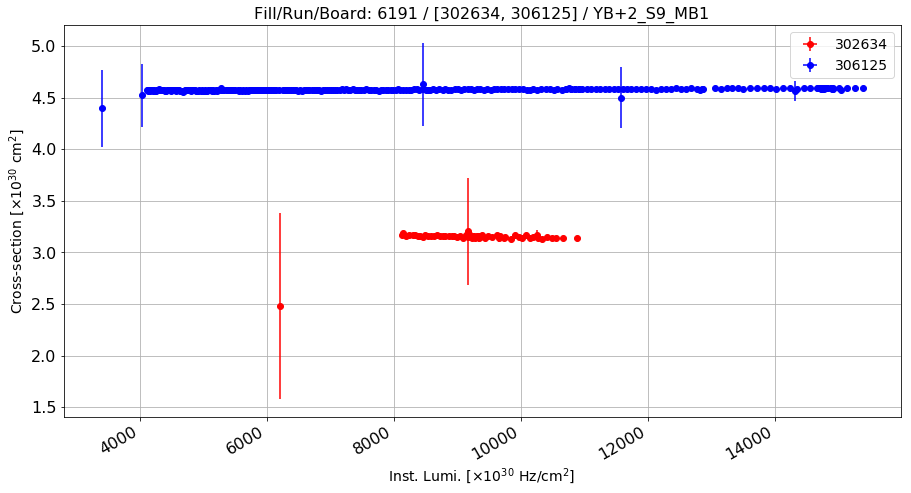

Anomalous CS: 3.14386371131 , Normal CS: 4.57594936429 , Ratio: 0.312959243858


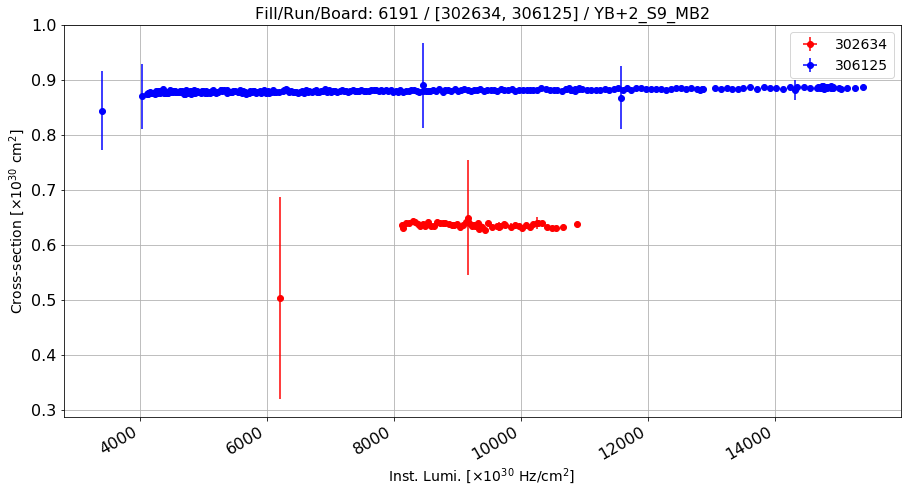

Anomalous CS: 0.633920029467 , Normal CS: 0.88068729121 , Ratio: 0.280198504289


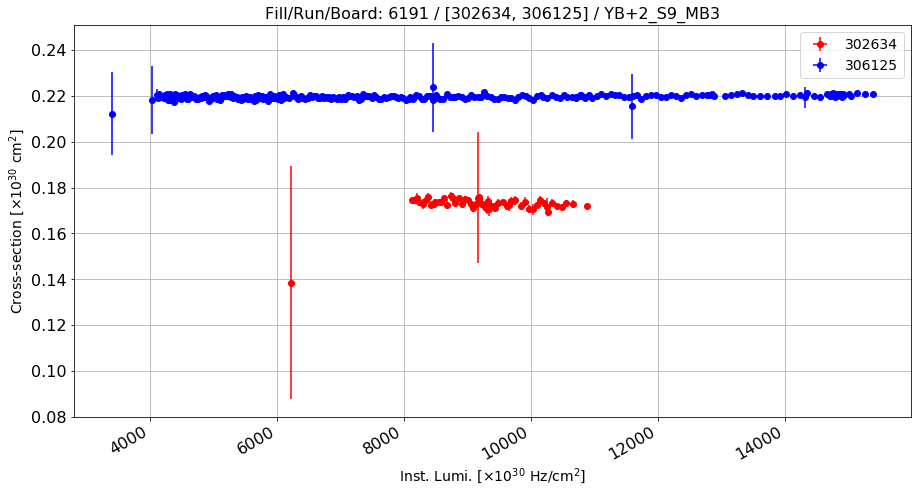

Anomalous CS: 0.172624933254 , Normal CS: 0.219640531234 , Ratio: 0.214057021788


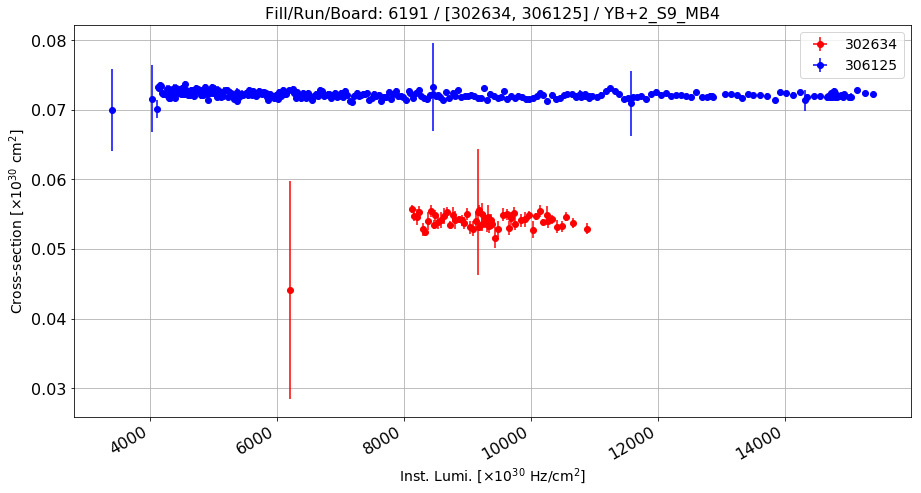

Anomalous CS: 0.0539615473884 , Normal CS: 0.0721978744602 , Ratio: 0.252588143462


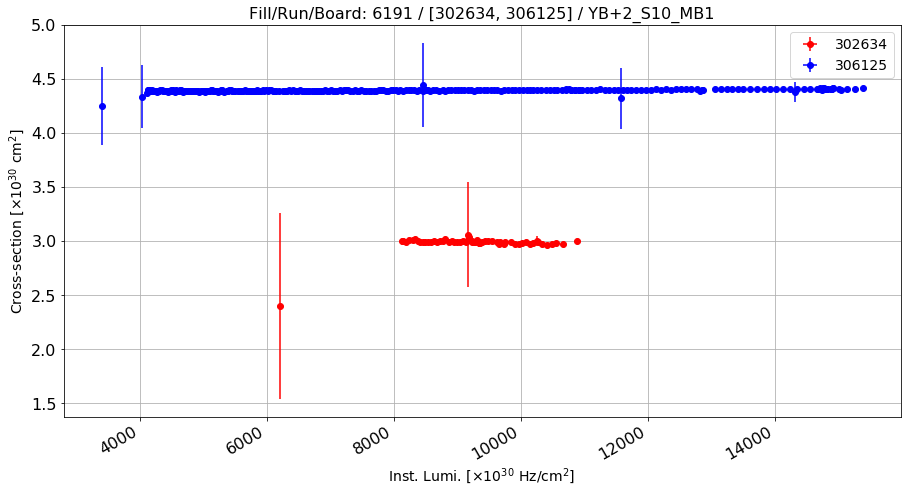

Anomalous CS: 2.98513402233 , Normal CS: 4.39385766887 , Ratio: 0.320612034503


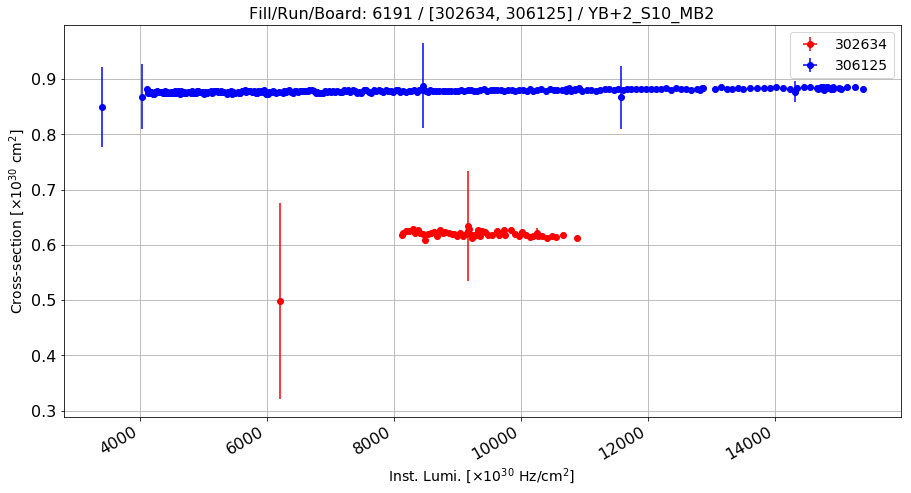

Anomalous CS: 0.618122947565 , Normal CS: 0.878827853328 , Ratio: 0.296650708982


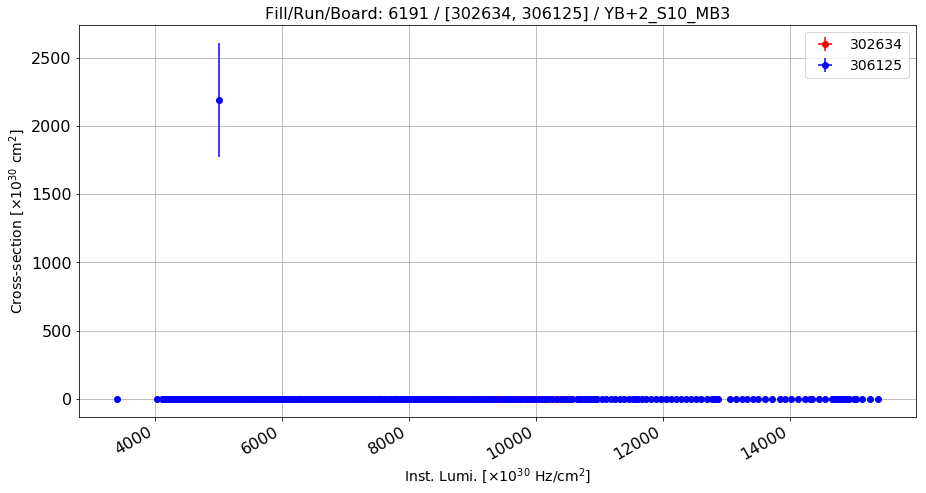

Anomalous CS: 0.168688678724 , Normal CS: 7.491386283 , Ratio: 0.977482314708


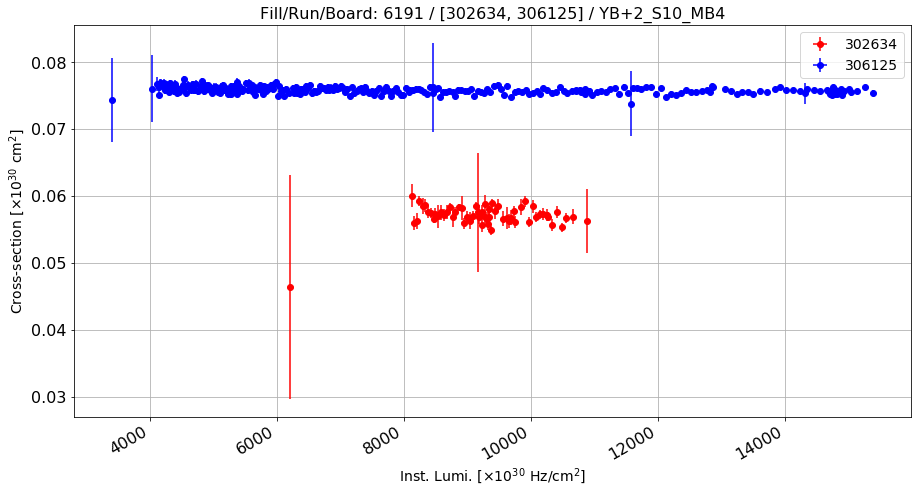

Anomalous CS: 0.0570770293728 , Normal CS: 0.0758608017127 , Ratio: 0.247608407977


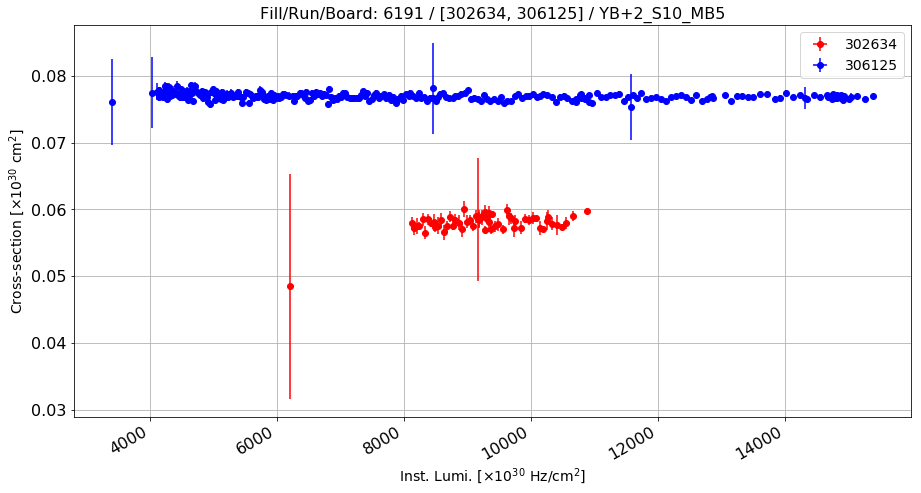

Anomalous CS: 0.0580156558287 , Normal CS: 0.0769824039082 , Ratio: 0.246377706029


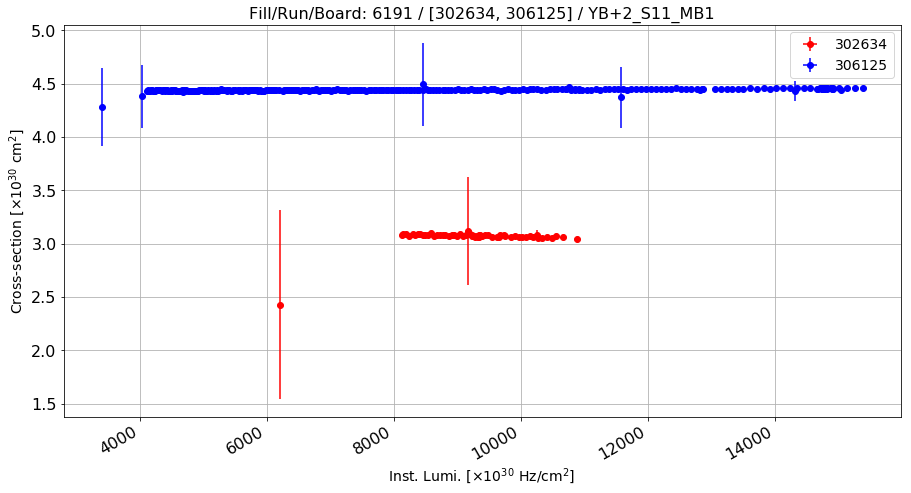

Anomalous CS: 3.06636764632 , Normal CS: 4.44317016931 , Ratio: 0.309869410922


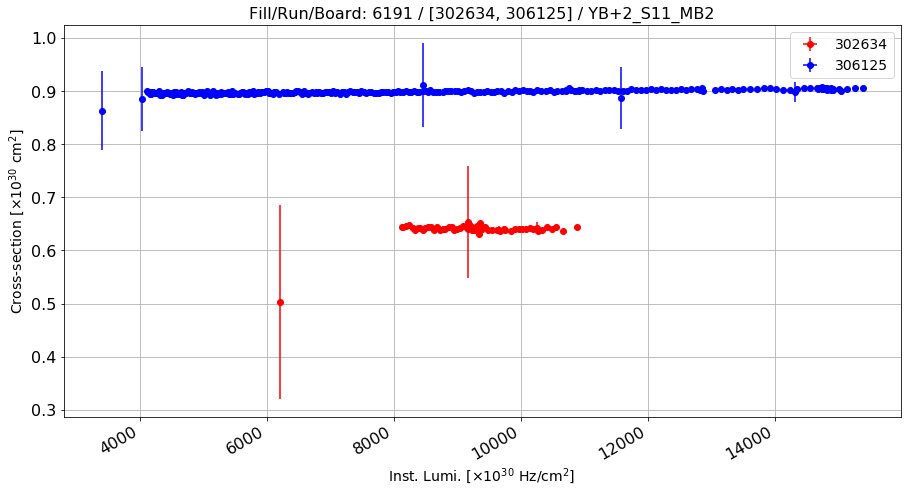

Anomalous CS: 0.639465467813 , Normal CS: 0.899197979246 , Ratio: 0.288849082657


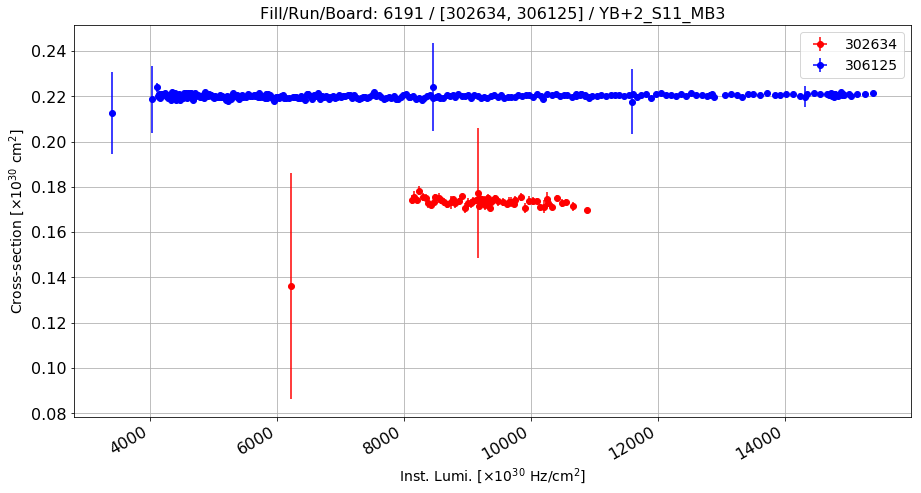

Anomalous CS: 0.172909038314 , Normal CS: 0.22014361316 , Ratio: 0.214562549273


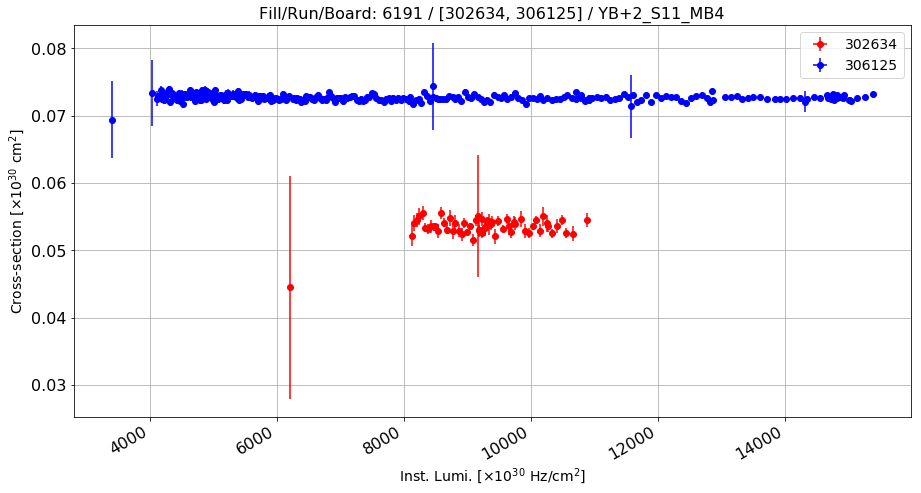

Anomalous CS: 0.0535125064427 , Normal CS: 0.0726836096484 , Ratio: 0.26376102258


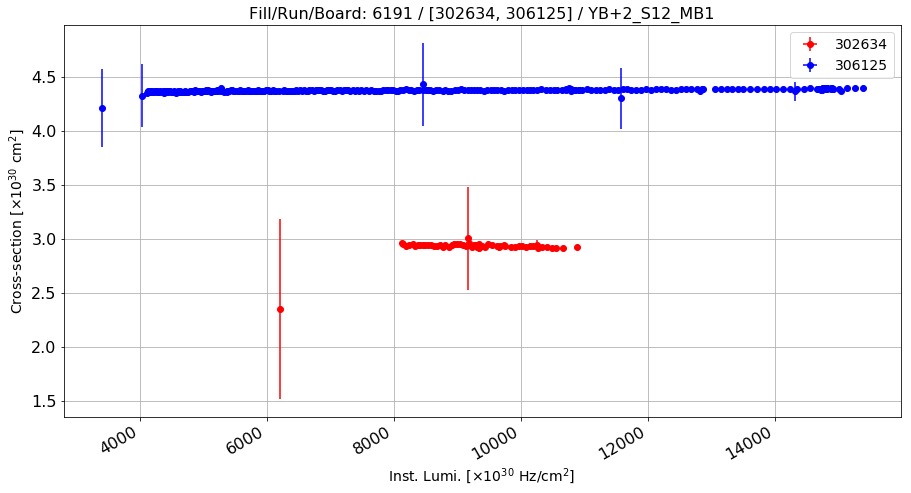

Anomalous CS: 2.92727277288 , Normal CS: 4.37506066837 , Ratio: 0.330918358676


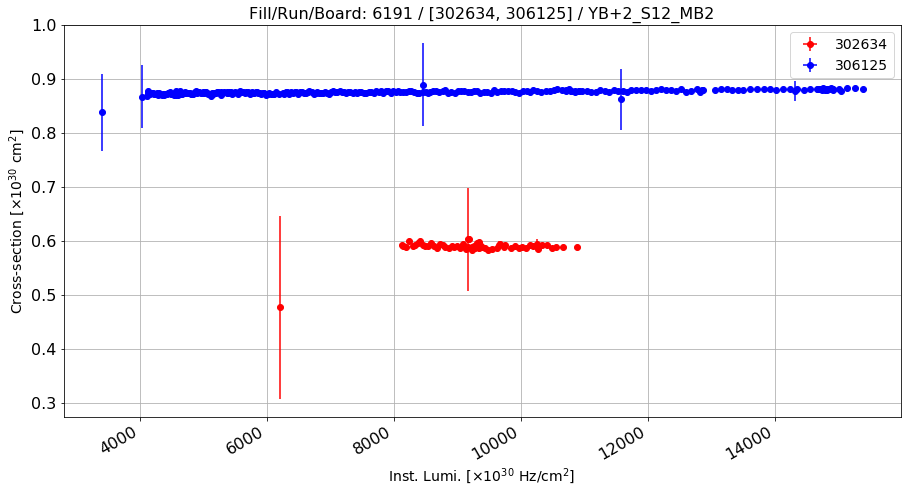

Anomalous CS: 0.588522747483 , Normal CS: 0.875991390209 , Ratio: 0.328163776425


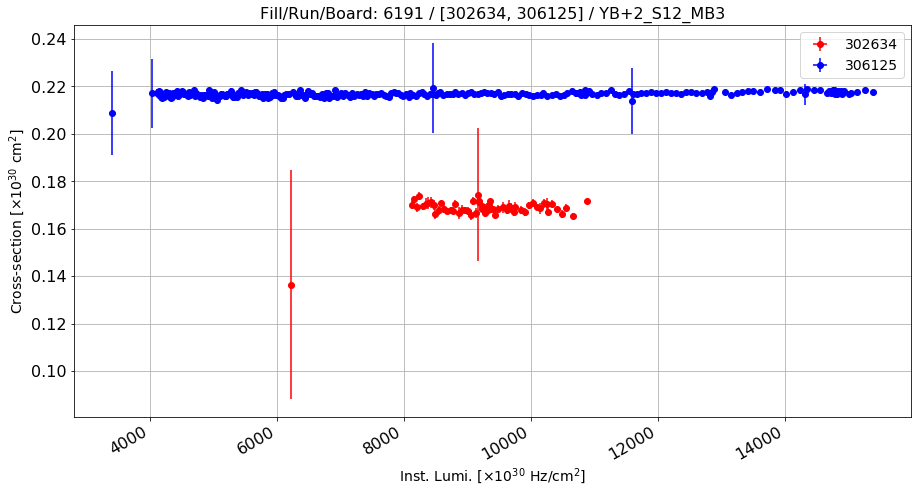

Anomalous CS: 0.168484663414 , Normal CS: 0.216849156175 , Ratio: 0.223032884305


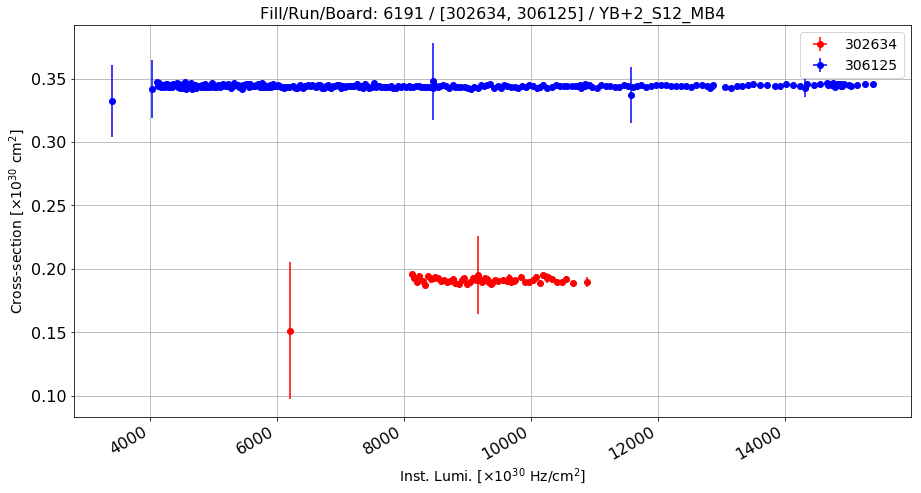

Anomalous CS: 0.190499120205 , Normal CS: 0.344164629126 , Ratio: 0.446488383512


In [48]:
ratio = pd.DataFrame(columns=["wheel", "sector", "station", "ratio", "ref", "anomal",\
                              "cs_norm", "cs_anomal"])
for i in [-2, -1, 0, +1, +2]:
    for j in range(1, 13):
        if ((j == 4) | (j == 10)):
            range_ = range(1, 6)
        else:
            range_ = range(1, 5)
        for k in range_:

            if (i > 0):
                board = "YB+" + str(i) + "_S" + str(j)
            else:
                board = "YB" + str(i) + "_S" + str(j)
            station = "DT" + str(k)
            
            error = "err"+station
            
            title = "Fill/Run/Board: "+str(int_lumi2["fill"].iloc[0])+\
                            " / "+str("[302634, 306125]")+" / " + board + "_MB" + str(k)
                
            (a, b, c) = plot_ratio_vs_ls(df_rates, [302634, 306125], "lumi", station, board, 0,\
                            error, r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]", 
                            r"Cross-section [$\times10^{30}$ cm$^{2}$]", title, ["ro", "bo"], False)

            ratio = ratio.append({"wheel": i, "sector": j, "station": k, "ratio": c, "ref": b,\
                                  "anomal": a, "cs_norm": 1/b, "cs_anomal": 1/a}, ignore_index = True)
            
            print "Anomalous CS:", a, ", Normal CS:", b, ", Ratio:", c
            

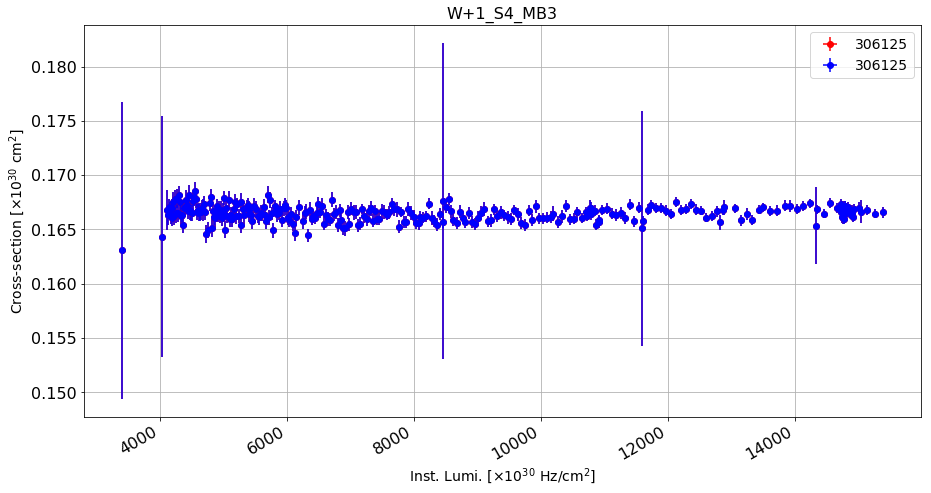

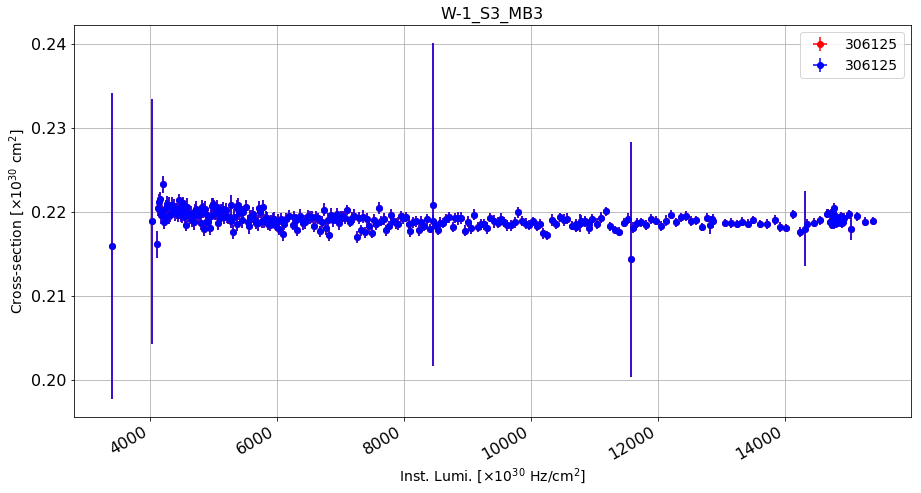

Fit W+1_S4_MB3:  0.166493607195 , Fit W-1_S3_MB3: 0.219096247567 , Ratio: 0.24008918891


In [49]:
(a1, b1, c1) = plot_ratio_vs_ls(df_rates, [306125, 306125], "lumi", "DT3", "YB+1_S4", 0,\
                            "errDT3", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]", 
                            r"Cross-section [$\times10^{30}$ cm$^{2}$]", "W+1_S4_MB3",\
                                ["ro", "bo"], False)
(a2, b2, c2) = plot_ratio_vs_ls(df_rates, [306125, 306125], "lumi", "DT3", "YB-1_S3", 0,\
                            "errDT3", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]", 
                            r"Cross-section [$\times10^{30}$ cm$^{2}$]", "W-1_S3_MB3",\
                                ["ro", "bo"], False)
print "Fit W+1_S4_MB3: ", a1, ", Fit W-1_S3_MB3:", a2, ", Ratio:", abs(a1-a2)/a2
value = abs(a1-a2)/a2

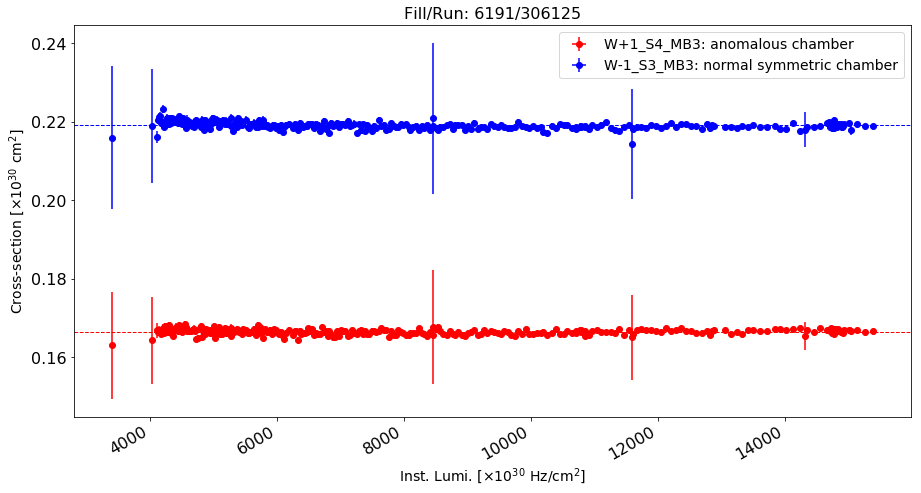

In [50]:
def plot_ratio_vs_ls_2(df, run, x_val, y_val, z_val, x_err, y_err, title_x, title_y,\
                       title, opt, log, labels):
    df_temp = df.copy()
    fig, ax = plt.subplots()
    fig.autofmt_xdate()
    plt.xlabel(title_x)
    plt.ylabel(title_y)
    #plt.ylim(0, 5.)
    #plt.xlim(0, 4000)
    #ax.grid()
    if log:
        ax.set_yscale('log')
    df_temp["ratio"] = df_temp[y_val]/df_temp[x_val]
    df_temp["errRatio"] = (1/df_temp[x_val])*\
    np.sqrt(df_temp[y_err]**2 + df_temp["errLumi"]**2*df_temp["ratio"]**2)
    for i in range(0, len(z_val)):
        rule = ((df_temp["board"] == z_val[i]) & (df_temp["run"] == run))
        #plt.plot(df_temp[rule][x_val], df_temp[rule]["ratio"], opt[i], label=labels[i])
        newstr = opt[i].replace("o", "")
        plt.errorbar(df_temp[rule][x_val], df_temp[rule]["ratio"], xerr=x_err,\
        yerr=df_temp[rule]["errRatio"],\
        fmt=opt[i], ecolor=newstr, label=labels[i])
    plt.legend(loc="best")
    plt.title(title)
    plt.axhline(a1, color='r', linestyle='dashed', linewidth=1)
    plt.axhline(a2, color='b', linestyle='dashed', linewidth=1)
    plt.show()

title = "Fill/Run: "+str(int_lumi2["fill"].iloc[0])+"/"+str("306125")
plot_ratio_vs_ls_2(df_rates, 306125, "lumi", "DT3", ["YB+1_S4", "YB-1_S3"], 0,\
                            "errDT3", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]", 
                            r"Cross-section [$\times10^{30}$ cm$^{2}$]",\
                   title, ["ro", "bo"], False,\
                   ["W+1_S4_MB3: anomalous chamber", "W-1_S3_MB3: normal symmetric chamber"])

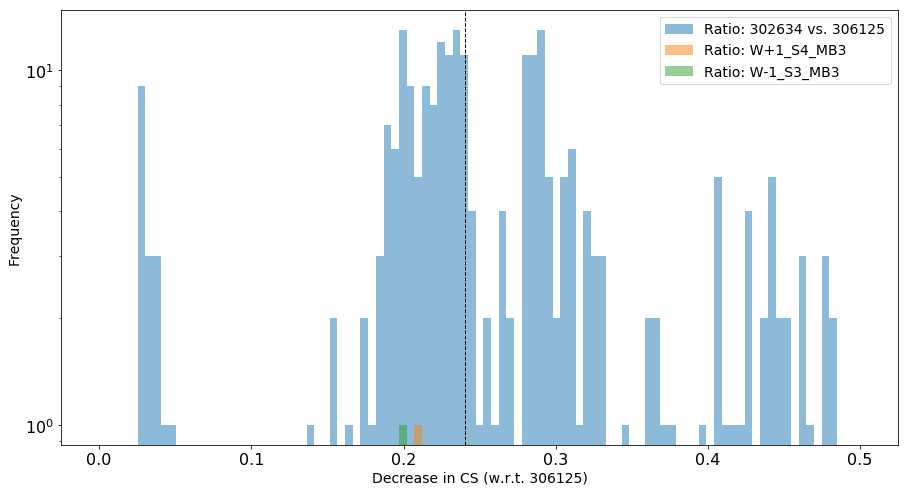

In [51]:
fig, ax = plt.subplots()
ax.set_yscale('log')
bins = np.linspace(0, 0.5, 100)
rule1 = (ratio.wheel == 1) & (ratio.sector == 4) & (ratio.station == 3)
rule2 = (ratio.wheel == -1) & (ratio.sector == 3) & (ratio.station == 3)
plt.hist(ratio["ratio"], bins=bins, alpha=0.5, label="Ratio: 302634 vs. 306125")
plt.hist(ratio[rule1]["ratio"], bins=bins, alpha=0.5, label="Ratio: W+1_S4_MB3")
plt.hist(ratio[rule2]["ratio"], bins=bins, alpha=0.5, label="Ratio: W-1_S3_MB3")
plt.title("")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Decrease in CS (w.r.t. 306125)')
plt.axvline(value, color='k', linestyle='dashed', linewidth=1)
plt.show()

In [52]:
print "Total number of chambers:" ,len(ratio["ratio"].values)
count = np.where(ratio["ratio"].values > value)
print "Chambers over threshold: ", len(count[0])
print "Fraction of chambers over threshold:", float(len(count[0])) / len(ratio["ratio"].values)

Total number of chambers: 250
Chambers over threshold:  126
Fraction of chambers over threshold: 0.504


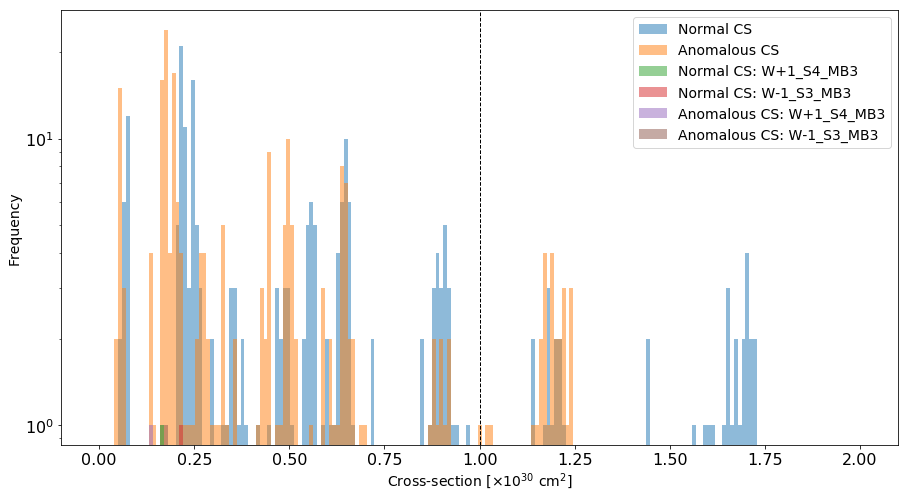

In [53]:
fig, ax = plt.subplots()
ax.set_yscale('log')
#ax.set_xscale('log')
bins = np.linspace(0, 2, 200)
rule1 = (ratio.wheel == 1) & (ratio.sector == 4) & (ratio.station == 3)
rule2 = (ratio.wheel == -1) & (ratio.sector == 3) & (ratio.station == 3)
plt.hist(ratio["ref"], bins=bins, alpha=0.5, label="Normal CS")
plt.hist(ratio["anomal"], bins=bins, alpha=0.5, label="Anomalous CS")
plt.hist(ratio[rule1]["ref"], bins=bins, alpha=0.5, label="Normal CS: W+1_S4_MB3")
plt.hist(ratio[rule2]["ref"], bins=bins, alpha=0.5, label="Normal CS: W-1_S3_MB3")
plt.hist(ratio[rule1]["anomal"], bins=bins, alpha=0.5, label="Anomalous CS: W+1_S4_MB3")
plt.hist(ratio[rule2]["anomal"], bins=bins, alpha=0.5, label="Anomalous CS: W-1_S3_MB3")
plt.title("")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel(r'Cross-section [$\times 10^{30}$ cm$^{2}$]')
plt.axvline(1.0, color='k', linestyle='dashed', linewidth=1)
plt.show()

Create a new dataframe with the input features already organized in a numpy array:

In [54]:
print len(df_rates)
algos = ['RPC1', 'RPC2', 'RPC3', 'RPC4', 'DT1', 'DT2', 'DT3', 'DT4', 'DT5']
df_rates_new = pd.DataFrame(columns=['run', 'group', 'board', 'wheel', 'sector', 'ls',\
                                     'lumi', 'errLumi', 'rate', 'err', 'system', 'station'])

for i in algos:
    list_a = ['run', 'group', 'board', 'wheel', 'sector', 'ls', 'lumi', 'errLumi', i, 'err'+i,]
    temp = df_rates.copy()
    temp = temp[list_a]
    temp["system"] = -1
    temp["station"] = -1
    j = i
    if (i.find("RPC") != -1):
        temp["system"] = 1
        num = i.replace("RPC", "")
        temp["station"] = int(num)
    else:
        temp["system"] = 2
        num = i.replace("DT", "")
        temp["station"] = int(num)
    temp = temp.rename(columns={j: 'rate', 'err'+j: 'err'})
    #print temp.columns
    df_rates_new = pd.concat([df_rates_new, temp], ignore_index=True)

print len(df_rates_new)

29520
265680


In [55]:
def plot_rate_vs_ls(df, run, x_val, y_val, z_val, x_err, y_err, title_x, title_y, title, opt, log):
    df_temp = df.copy()
    fig, ax = plt.subplots()
    fig.autofmt_xdate()
    plt.xlabel(title_x)
    plt.ylabel(title_y)
    ax.grid()
    if log:
        ax.set_yscale('log')
    for i in range(len(run)):
        rule = ((df_temp["board"] == z_val) & (df_temp["run"] == run[i]))
        plt.errorbar(df_temp[rule][x_val], df_temp[rule][y_val], xerr=x_err,\
                     yerr=df_temp[rule][y_err], fmt=opt, ecolor='r')
    plt.legend(loc="best")
    plt.title(title)
    plt.show()

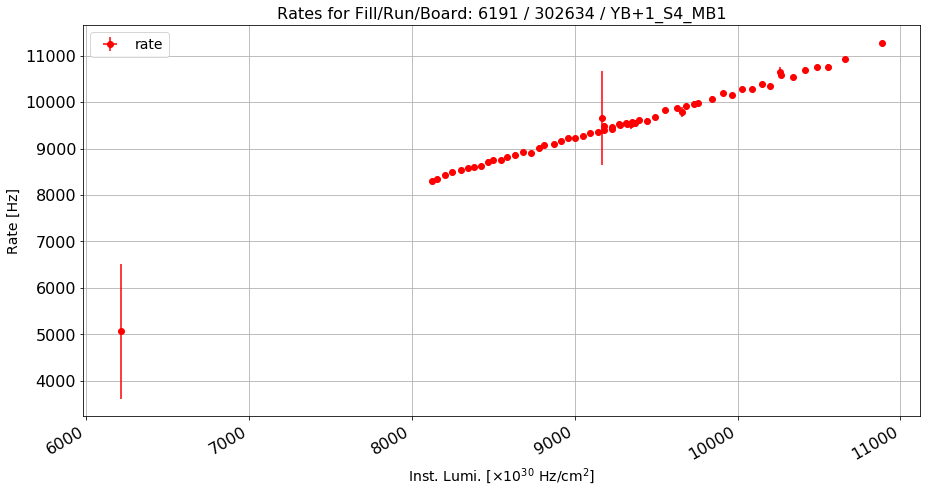

In [56]:
title = "Rates for Fill/Run/Board: "+str(int_lumi2["fill"].iloc[0])+\
                            " / 302634 / YB+1_S4_MB1"
plot_rate_vs_ls(df_rates_new[(df_rates_new["system"] == 2) & (df_rates_new["station"] == 1)], [302634],\
                "lumi", "rate", "YB+1_S4", 0, "err", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]",\
                "Rate [Hz]", title, "ro", False)

In [57]:
def plot_vs_ls(df, run, x_val, y_val, z_val, x_err, y_err, title_x, title_y, title, opt, log):
    df_temp = df.copy()
    fig, ax = plt.subplots()
    fig.autofmt_xdate()
    plt.xlabel(title_x)
    plt.ylabel(title_y)
    ax.grid()
    if log:
        ax.set_yscale('log')
    for i in range(len(run)):
        rule = ((df_temp["board"] == z_val) & (df_temp["run"] == run[i]))
        plt.errorbar(df_temp[rule][x_val], df_temp[rule][y_val], xerr=x_err, yerr=df_temp[rule][y_err],\
                     fmt=opt, ecolor='r')
        plt.errorbar(df_temp[rule][x_val], df_temp[rule]["lumi"], xerr=x_err, yerr=df_temp[rule]["errLumi"],\
                     fmt='bo', ecolor='b')
    plt.legend(loc="best")
    plt.title(title)
    plt.show()

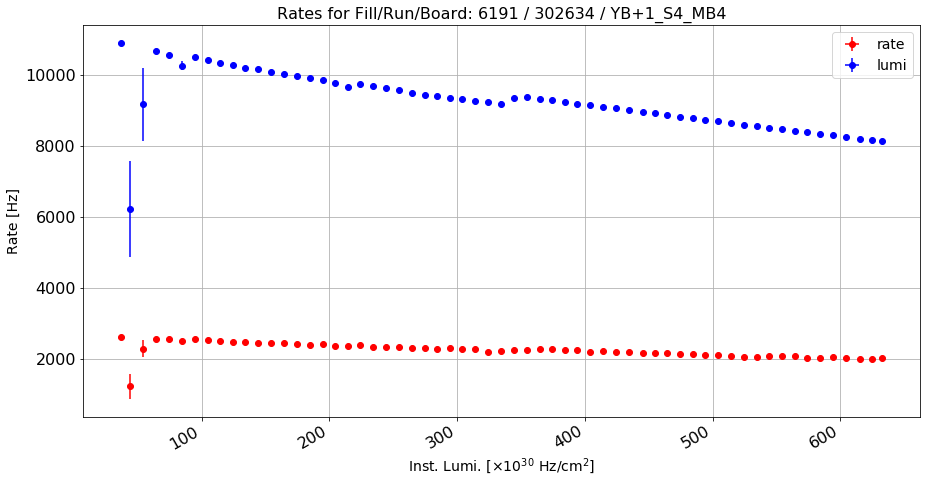

In [58]:
title = "Rates for Fill/Run/Board: "+str(int_lumi2["fill"].iloc[0])+\
                            " / 302634 / YB+1_S4_MB4"
plot_vs_ls(df_rates_new[(df_rates_new["system"] == 2) & (df_rates_new["station"] == 4)], [302634],\
                "ls", "rate", "YB+1_S4", 0, "err", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]",\
                "Rate [Hz]", title, "ro", False)

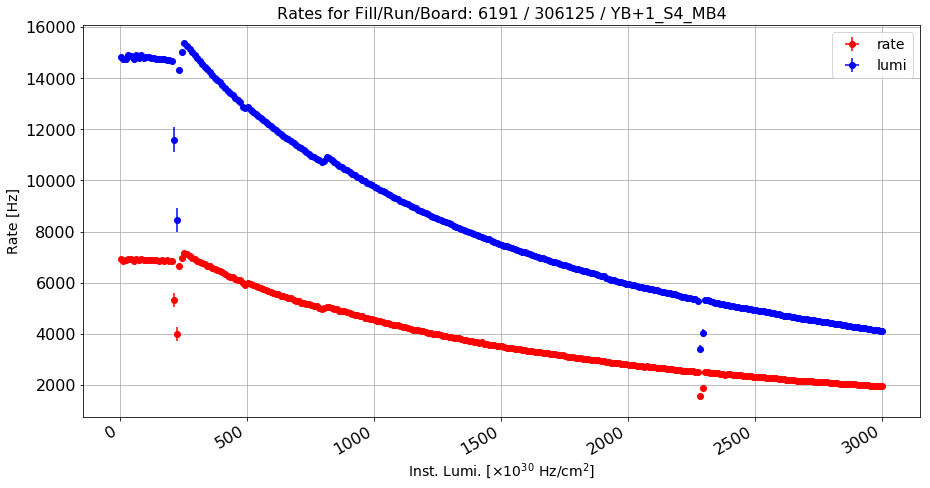

In [59]:
title = "Rates for Fill/Run/Board: "+str(int_lumi2["fill"].iloc[0])+\
                            " / 306125 / YB+1_S4_MB4"
plot_vs_ls(df_rates_new[(df_rates_new["system"] == 2) & (df_rates_new["station"] == 4)], [306125],\
                "ls", "rate", "YB+1_S4", 0, "err", r"Inst. Lumi. [$\times10^{30}$ Hz/cm$^2$]",\
                "Rate [Hz]", title, "ro", False)

In [60]:
df_rates_new["CS"] = -1
df_rates_new["errCS"] = -1

df_rates_new["CS"] = df_rates_new["rate"]/df_rates_new["lumi"]
print "Number of NaN's in CS before:"
print len(df_rates_new["CS"][df_rates_new["CS"].isnull() == True])
print "Number of Inf's in CS before:"
print len(df_rates_new["CS"][np.isinf(df_rates_new["CS"])])

df_rates_new["CS"] = df_rates_new["CS"].replace([np.inf, -np.inf], np.nan)
df_rates_new["CS"] = df_rates_new["CS"].fillna(-1)

print "Number of NaN's in CS after:"
print len(df_rates_new["CS"][df_rates_new["CS"].isnull() == True])
print "Number of Inf's in CS after:"
print len(df_rates_new["CS"][np.isinf(df_rates_new["CS"])])

df_rates_new["errCS"] = (1/df_rates_new["lumi"])*\
np.sqrt(df_rates_new["err"]**2 + df_rates_new["CS"]**2 * df_rates_new["errLumi"]**2)

print "Number of NaN's in errCS before:"
print len(df_rates_new["errCS"][df_rates_new["errCS"].isnull() == True])
print "Number of Inf's in errCS before:"
print len(df_rates_new["errCS"][np.isinf(df_rates_new["errCS"])])

df_rates_new["errCS"] = df_rates_new["errCS"].replace([np.inf, -np.inf], np.nan)
df_rates_new["errCS"] = df_rates_new["errCS"].fillna(-1)

print "Number of NaN's in errCS after:"
print len(df_rates_new["errCS"][df_rates_new["errCS"].isnull() == True])
print "Number of Inf's in errCS after:"
print len(df_rates_new["errCS"][np.isinf(df_rates_new["errCS"])])

Number of NaN's in CS before:
0
Number of Inf's in CS before:
0
Number of NaN's in CS after:
0
Number of Inf's in CS after:
0
Number of NaN's in errCS before:
0
Number of Inf's in errCS before:
0
Number of NaN's in errCS after:
0
Number of Inf's in errCS after:
0


In [61]:
array = df_rates_new.as_matrix(columns=['system', 'wheel', 'sector', 'station',\
                                        'lumi', 'errLumi', 'rate', 'err',\
                                        'CS', 'errCS'])

/Users/cesarecalabria/Library/Python/2.7/lib/python/site-packages/ipykernel_launcher.py:1: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """Entry point for launching an IPython kernel.


In [62]:
print len(array)
print len(df_rates_new)

265680
265680


In [63]:
df_rates_new["content"] = np.empty((len(df_rates_new), 0)).tolist()

In [64]:
for index, rows in df_rates_new.iterrows():
    #print index, array[index]
    df_rates_new.at[index, "content"] = array[index]
df_rates_new["score"] = -1

In [65]:
#print df_rates_new[(df_rates_new["station"] == 5) & ((df_rates_new["sector"] != 4) &\
 #                                                    (df_rates_new["sector"] != 10))]["content"]

rule = ((df_rates_new["station"] == 5) & ((df_rates_new["sector"] != 4) & (df_rates_new["sector"] != 10)))
df_rates_new = df_rates_new[rule == False]

In [66]:
df_rates_new["ratio"] = 0
for i in [-2, -1, 0, +1, +2]:
    for j in range(1, 13):
        range_ = range(1, 5)
        if ((j == 4) | (j == 10)):
            range_ = range(1, 6)
        for k in range_:
            rule = (df_rates_new.wheel == i) & (df_rates_new.sector == j) & (df_rates_new.station == k)
            rule_r = (ratio.wheel == i) & (ratio.sector == j) & (ratio.station == k)
            idx = df_rates_new[rule].index
            value = ratio[rule_r]["ratio"].item()
            #print idx, value
            for w in idx:
                df_rates_new.loc[w, "ratio"] = value

# Model inference section <a class="anchor" id="fourth-bullet"></a>

## Creating the train and test samples

In [67]:
df_rates_new_2 = df_rates_new.copy()
print df_rates_new["content"].iloc[1]

[1 1 10 1 10886.7395 12.832500000000437 16957.5 14195.5 1.557628893389063
 1.3039270455995822]


In [68]:
#To be run just one time!!!!!!
df_rates_new["content_in"] = df_rates_new["content"].copy()
def change_data(data):
    temp = data.copy()
    temp[2] = temp[2] - 6
    temp[3] = temp[3] - 3
    return temp

df_rates_new["content"] = df_rates_new["content"].apply(change_data)

In [69]:
df_rates_new = df_rates_new[df_rates_new["system"] == 2]

In [70]:
print df_rates_new["content"].iloc[1]

[2 1 4 -2 10886.7395 12.832500000000437 12638.5 57.5 1.1609077263215493
 0.005456040640702972]


In [71]:
normalies = df_rates_new.copy()
anomalies = df_rates_new.copy()
print len(normalies), len(anomalies)

123000 123000


In [72]:
def deduceLS(data):
    if (bunch == 10):
        return data*10+5
anomalies["averageLS"] = anomalies["group"].apply(deduceLS)
#print anomalies.columns

In [73]:
rule = (normalies["wheel"] == -1) & (normalies["sector"] == 3) & (normalies["station"] == 3) 
print "Normal chimney:"
print normalies[rule]["content"].iloc[100]

rule = (normalies["wheel"] == 1) & (normalies["sector"] == 4) & (normalies["station"] == 3)
print "Anomalous chimney:"
print normalies[rule]["content"].iloc[100]

Normal chimney:
[2 -1 -3 0 7121.628625 3.2604384123343406 1258.0 18.4951731154761
 0.17664498757824512 0.0025983014996690404]
Anomalous chimney:
[2 1 -2 0 7121.628625 3.2604384123343406 958.75 10.279574060103016
 0.1346251048017826 0.0014447455232369122]


In [74]:
def assignScore(df, score):
    temp = df.copy()
    rule = (temp["wheel"] == 1) & (temp["sector"] == 4) & (temp["station"] == 3)
    indexes = temp[rule].index
    #print indexes
    for i in indexes:
        temp.loc[i, "score"] = score
    return temp

temp = assignScore(anomalies, 1)
anomalies = temp

During runs 302634 (all LS') and 302635 (LS <= 404) one layer per station did not reach the correct HV, except for: MB1, MB4 in sectors 3, 4, 5 in wheels 2, -2, 0: 

In [75]:
def assignScore2(df, score, run, ls_in, ls_end, ls_string):
    temp = df.copy()
    rule = (temp["run"] == run)
    if ((ls_in != -1) & (ls_end != -1)):
        rule = rule & (temp[ls_string] >= ls_in) & (temp[ls_string] <= ls_end)
    elif (ls_in != -1):
        rule = rule & (temp[ls_string] >= ls_in)
    elif (ls_end != -1):
        rule = rule & (temp[ls_string] <= ls_end)
    indexes = temp[rule].index
    for w in indexes:
        temp.loc[w, "score"] = score

    #Correct score for the chambers with normal HV
    for i in [-2, 0, 2]: #wheels that are ok
        for j in [3, 4, 5]: #sectors that are ok
            if (i == 0):
                range_ = [1]
            elif (abs(i) == 2):
                range_ = [1, 4, 5]
            else:
                range_ = [1, 4]
            for k in range_: #stations that are ok
                rule = (temp["run"] == run) & (temp["wheel"] == i) \
                        & (temp["sector"] == j) & (temp["station"] == k)
                indexes = temp[rule].index
                for w in indexes:
                    temp.loc[w, "score"] = -1
    return temp

In [76]:
rule = ((anomalies["wheel"] == 2) & (anomalies["sector"] == 3) & (anomalies["station"] == 1))
print anomalies[rule]["score"].iloc[1]
temp = assignScore2(anomalies, 1, 302634, -1, -1, "group")
anomalies = temp
#temp = assignScore2(temp, 1, 302635, 1, 404, "group")
#anomalies = temp
print anomalies[rule]["score"].iloc[1]

-1
-1


In [77]:
rule = ((anomalies["wheel"] == 1) & (anomalies["sector"] == 3) & (anomalies["station"] == 1))
print anomalies[rule]["score"].iloc[1]

1


In [78]:
rule = ((anomalies["wheel"] == 2) & (anomalies["sector"] == 4) & (anomalies["station"] == 5))
print anomalies[rule]["score"].iloc[1]
rule = ((anomalies["wheel"] == -2) & (anomalies["sector"] == 4) & (anomalies["station"] == 5))
print anomalies[rule]["score"].iloc[1]

-1
-1


In [79]:
def change(data, red = 1):
    #print data
    temp = data.copy()
    temp[4] = temp[4]*red #Increase lumi by "red"
    temp[5] = temp[5]*red
    temp[8] = temp[8]*red #Increase CS by "red"
    temp[9] = temp[9]*red
    #print temp
    return temp

print anomalies["content"].iloc[0]
anomalies["content_2"] = anomalies["content"].copy()
anomalies["content_2"] = anomalies["content"].apply(change)
print anomalies["content_2"].iloc[0]

[2 1 -5 -2 10886.7395 12.832500000000437 12394.0 135.0 1.138449211538496
 0.012472804231774649]
[2 1 -5 -2 10886.7395 12.832500000000437 12394.0 135.0 1.138449211538496
 0.012472804231774649]


In [80]:
#Scale the data
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import minmax_scale
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing.data import QuantileTransformer
def scale_data(data, scaler_type = 2):
    
    types = ["RobustScaler", "MaxAbsScaler", "QuantileTransformerUniform",\
             "QuantileTransformerNormal", "Normalizer", "MinMaxScaler"]
    #print "Scaling data using:", types[scaler_type-1]
    
    # Need to reshape since scaler works per column

    if (scaler_type == 0):
        return data
    if (scaler_type == 1):
        data = data.reshape(-1, 1)
        scaler = RobustScaler(quantile_range=(25, 75)).fit(data)
        return scaler.transform(data).reshape(1, -1)
    if (scaler_type == 2):
        data = data.reshape(-1, 1)
        scaler = MaxAbsScaler().fit(data)
        return scaler.transform(data).reshape(1, -1)
    if (scaler_type == 3):
        data = data.reshape(-1, 1)
        scaler = QuantileTransformer(output_distribution='uniform').fit(data)
        return scaler.transform(data).reshape(1, -1)
    if (scaler_type == 4):
        data = data.reshape(-1, 1)
        scaler = QuantileTransformer(output_distribution='normal').fit(data)
        return scaler.transform(data).reshape(1, -1)
    if (scaler_type == 5):
        data = data.reshape(1, -1)
        scaler = Normalizer(norm='l2').fit_transform(data)
        return scaler.reshape(1, -1)
    if (scaler_type == 6):
        data = data.reshape(-1, 1)
        scaler = MinMaxScaler().fit(data)
        return scaler.transform(data).reshape(1, -1)

In [81]:
anomalies["content"] = anomalies["content"].apply(np.array)
anomalies["content_2"] = anomalies["content_2"].apply(np.array)
anomalies["content_scaled"] = anomalies["content"].apply(scale_data)
#anomalies["content_scaled"] = anomalies["content_2"].apply(scale_data)

Testing on the high rate issue:

In [82]:
#layers_test = anomalies.copy()
layers_test = (anomalies[(anomalies.run == 302634) | (anomalies.run == 306125)]).copy()
print "Tot:", len(layers_test)
print "Normalies:", len(layers_test[layers_test.score == -1])
print "Anomalies", len(layers_test[layers_test.score == 1])

Tot: 90500
Normalies: 75986
Anomalies 14514


In [83]:
def score_to_array(score):
    if score == -1:
        return np.asarray([1, 0]) #Normaly
    return np.asarray([0, 1]) #Anomaly

def nn_generate_input():  
    return np.array(np.concatenate(layers_test.content_scaled.values)).reshape(-1, 10)

test_x = nn_generate_input()

## Simple test

In [84]:
def simple_test(cross_sections, df, coeff):
    for i in df.index:
        wheel = df.wheel.loc[i]
        sector = df.sector.loc[i]
        station = df.station.loc[i]
        cs = df.CS.loc[i]
        #err_cs = df.errCS.loc[i]
        #print cs
        rule = ((cross_sections.wheel == wheel) & (cross_sections.sector == sector) &\
                (cross_sections.station == station))
        cs_norm = cross_sections[rule].ref.iloc[0]
        #err_cs_norm = cross_sections[rule].errCS.iloc[0]
        #low = cs_norm - coeff*err_cs_norm
        #hi = cs_norm + coeff*err_cs_norm
        low = cs_norm*(1 - coeff)
        hi = cs_norm*(1 + coeff)
        #print low, hi
        if ((cs > low) & (cs < hi)):
            res = 0
        else:
            res = +1
        df.loc[i, "st_score"] = res

In [85]:
layers_test["st_score"] = 0
layers_test.index = pd.RangeIndex(len(layers_test.index))
simple_test(ratio, layers_test, 0.05)

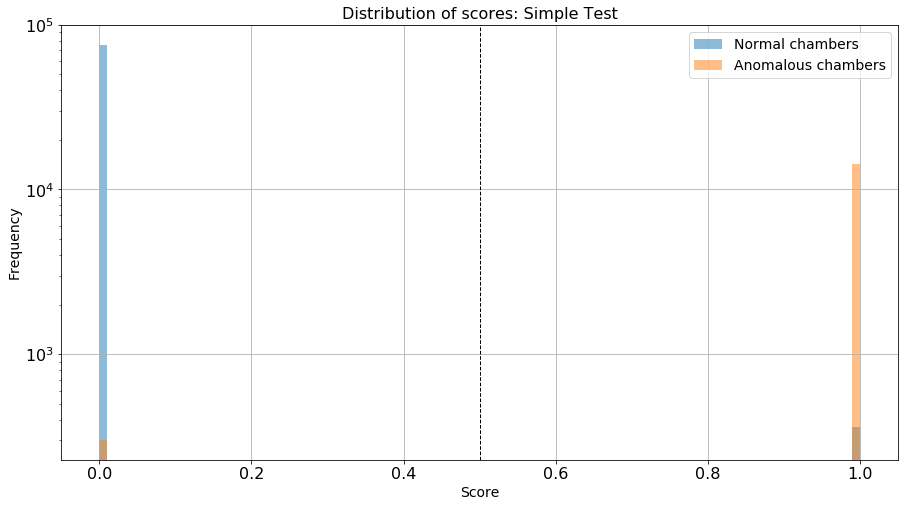

In [86]:
# Distribution of scores:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(0, 1, 100)
plt.hist(layers_test[layers_test["score"] < 0]["st_score"], bins=bins, alpha=0.5,\
         label="Normal chambers")
plt.hist(layers_test[layers_test["score"] > 0]["st_score"], bins=bins, alpha=0.5,\
         label="Anomalous chambers")
plt.title("Distribution of scores: Simple Test")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.5, color='k', linestyle='dashed', linewidth=1)
plt.show()

## Inference

Making an inference using the model and the test sample:

In [109]:
sess = tf.Session()
sess.run(tf.global_variables_initializer())
K.set_session(sess)

In [110]:
ann_model_1 = load_model("./model_keras/ann_1.h5")
ann_model_2 = load_model("./model_keras/ann_2.h5")
ann_model_3 = load_model("./model_keras/ann_3.h5")
ann_model_4 = load_model("./model_keras/ann_4.h5")

In [111]:
layers_test["ann_score_1"] = ann_model_1.predict(np.array(test_x))[:, 1]
layers_test["ann_score_2"] = ann_model_2.predict(np.array(test_x))[:, 1]
layers_test["ann_score_3"] = ann_model_3.predict(np.array(test_x))[:, 1]
layers_test["ann_score_4"] = ann_model_4.predict(np.array(test_x))[:, 1]

In [112]:
cae_model = load_model("./model_keras/cae.h5")
layers_test["cae_score"] = np.sum(abs(test_x - cae_model.predict(np.array(test_x))), axis=1)

In [113]:
def benchmark(y_true, y_score, treshold):
    y_pred = 2*(y_score > treshold)-1
    y_true = 2*(y_true > treshold)-1
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    sensitivity = round(float(tp)/(tp+fn), 4)
    specificity = round(float(tn)/(tn+fp), 4)

    print("Model accuracy: %s" % round(accuracy_score(y_true, y_pred), 4))
    print("Model sensitivity: %s" % sensitivity)
    print("Model specificity: %s" % specificity)

    return specificity, sensitivity
    
print "DNN:"
specificity_ann, sensitivity_ann = benchmark(layers_test["score"], layers_test["ann_score_4"], 0.5)
print "AE:"
specificity_cae, sensitivity_cae = benchmark(layers_test["score"], layers_test["cae_score"], 0.055)

DNN:
Model accuracy: 0.8784
Model sensitivity: 0.2416
Model specificity: 1.0
AE:
Model accuracy: 0.8453
Model sensitivity: 0.038
Model specificity: 0.9995


In [146]:
def get_roc_curve(test_df, models, working_point=None):
    """Generates ROC Curves for a given array"""
    fig, ax = plt.subplots()
    ax.grid()

    for legend_label, model_score in models:
        false_positive_rate, true_positive_rate, _ = roc_curve(test_df["score"],
                                                               test_df[model_score])
        #plt.xlim(0, 0.2)
        plt.plot(false_positive_rate, true_positive_rate, linewidth=2,
                 label=('%s, AUC: %s' % (legend_label,
                                         round(auc(false_positive_rate, true_positive_rate), 4))))
    if working_point:
        plt.plot(1-working_point[0],
                 working_point[1],
                 'o',
                 label="DNN working point")
    plt.title("ROC")
    plt.legend(loc='best')
    plt.ylabel('True positive rate')
    plt.xlabel('False positive rate')
    plt.show();

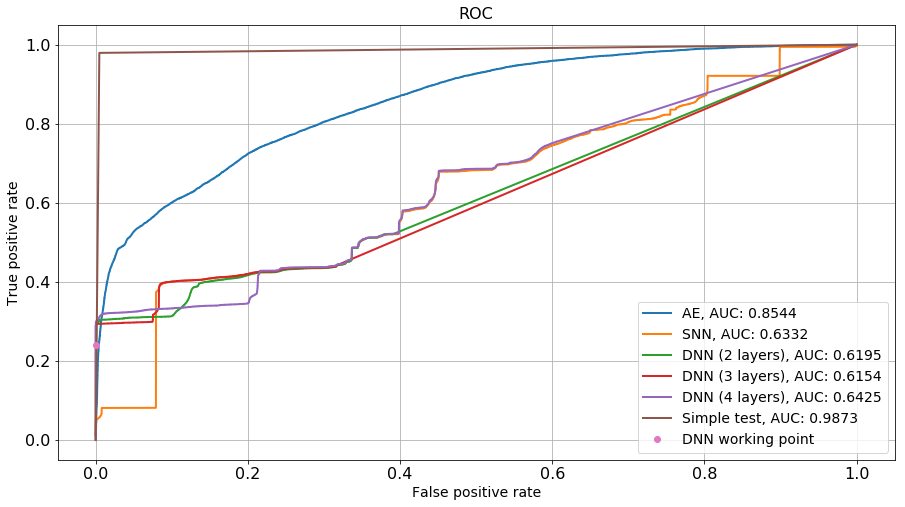

In [119]:
get_roc_curve(layers_test, 
              [
               ("AE", "cae_score"),
               ("SNN", "ann_score_1"),
               ("DNN (2 layers)", "ann_score_2"),
               ("DNN (3 layers)", "ann_score_3"),
               ("DNN (4 layers)", "ann_score_4"),
               ("Simple test", "st_score"),
               ], (specificity_ann, sensitivity_ann))

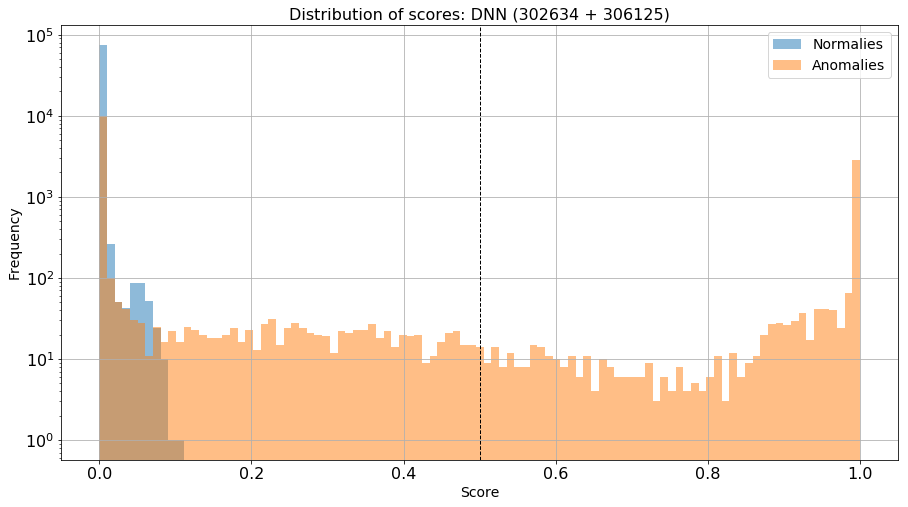

In [96]:
# Distribution of scores:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(0, 1, 100)
plt.hist(layers_test[layers_test["score"] < 0]["ann_score_4"], bins=bins, alpha=0.5, label="Normalies")
plt.hist(layers_test[layers_test["score"] > 0]["ann_score_4"], bins=bins, alpha=0.5, label="Anomalies")
plt.title("Distribution of scores: DNN (302634 + 306125)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.5, color='k', linestyle='dashed', linewidth=1)
plt.show()

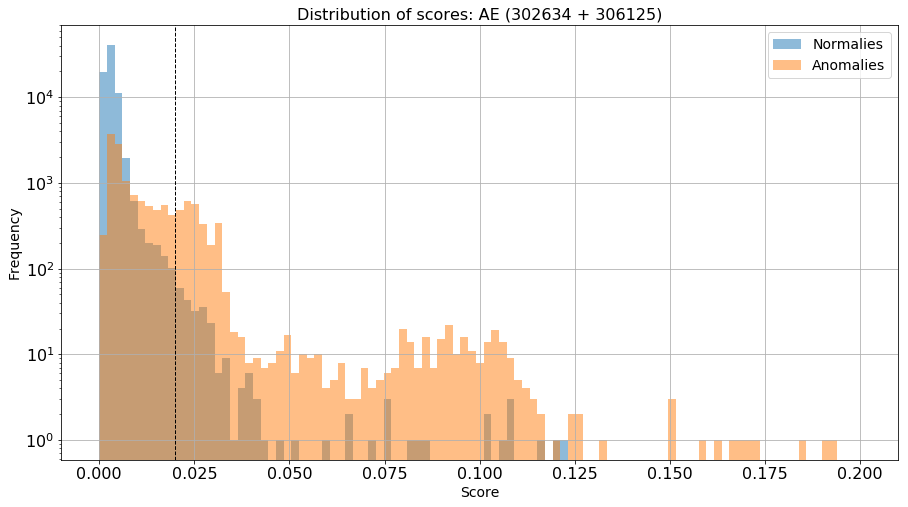

In [97]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
#ax.set_xscale('log')
bins = np.linspace(0, 0.2, 100)
plt.hist(layers_test[layers_test["score"] < 0]["cae_score"], bins=bins, alpha=0.5, label="Normalies")
plt.hist(layers_test[layers_test["score"] > 0]["cae_score"], bins=bins, alpha=0.5, label="Anomalies")
#for i in [-1, +1]:
#    plt.hist(layers_test[(layers_test["score"] < 0) & (layers_test["wheel"] == int(i))]\
#             ["cae_score"], bins=bins, alpha=0.5, label="Normalies_Wheel_"+str(i))
plt.title("Distribution of scores: AE (302634 + 306125)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.02, color='k', linestyle='dashed', linewidth=1)
plt.show()

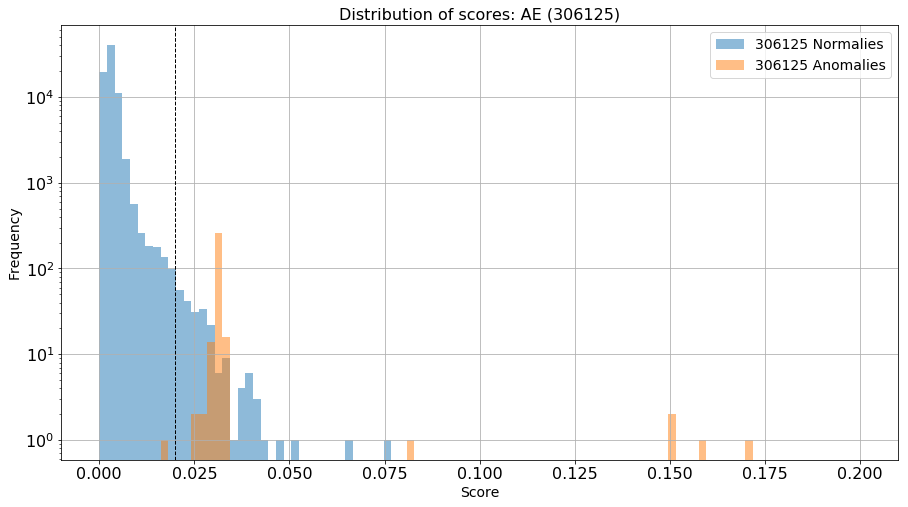

In [98]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
#ax.set_xscale('log')
bins = np.linspace(0, 0.2, 100)
plt.hist(layers_test[(layers_test["run"] == 306125) & (layers_test["score"] < 0)]["cae_score"],\
         bins=bins, alpha=0.5, label="306125 Normalies")
plt.hist(layers_test[(layers_test["run"] == 306125) & (layers_test["score"] > 0)]["cae_score"],\
         bins=bins, alpha=0.5, label="306125 Anomalies")
plt.title("Distribution of scores: AE (306125)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.02, color='k', linestyle='dashed', linewidth=1)
plt.show()

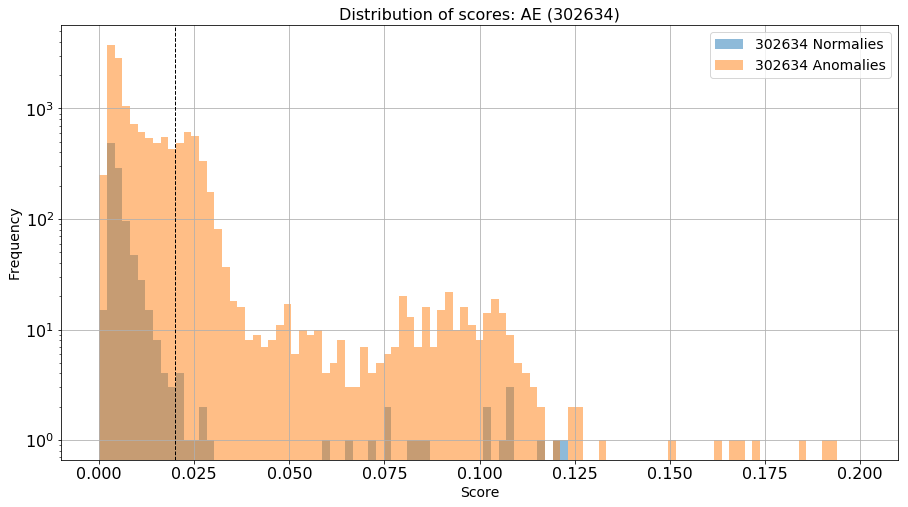

In [99]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
#ax.set_xscale('log')
bins = np.linspace(0, 0.2, 100)
plt.hist(layers_test[(layers_test["run"] == 302634) & (layers_test["score"] < 0)]["cae_score"],\
         bins=bins, alpha=0.5, label="302634 Normalies")
plt.hist(layers_test[(layers_test["run"] == 302634) & (layers_test["score"] > 0)]["cae_score"],\
         bins=bins, alpha=0.5, label="302634 Anomalies")
#for i in [-1, +1]:
#    plt.hist(layers_test[(layers_test["score"] < 0) & (layers_test["wheel"] == int(i))]\
#             ["cae_score"], bins=bins, alpha=0.5, label="Normalies_Wheel_"+str(i))
plt.title("Distribution of scores: AE (302634)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.02, color='k', linestyle='dashed', linewidth=1)
plt.show()

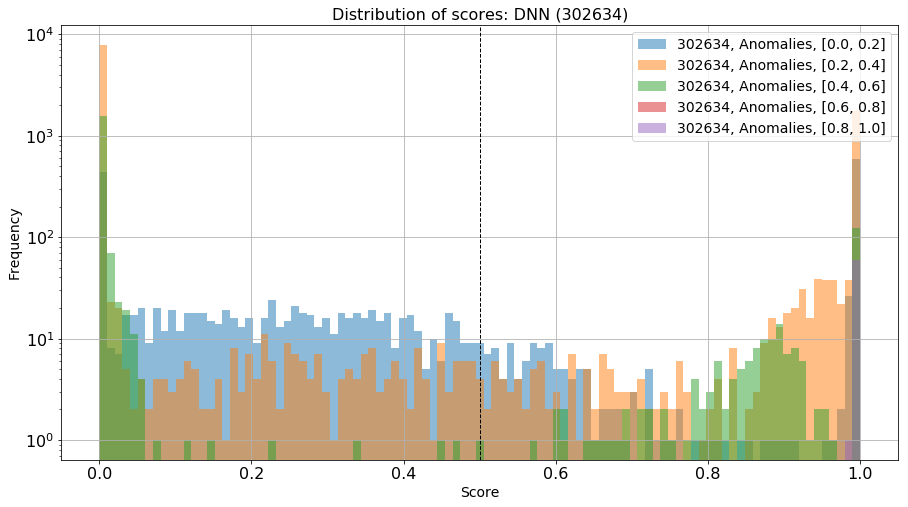

In [100]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
#ax.set_xscale('log')
bins = np.linspace(0, 1.0, 100)
rule = (layers_test["run"] == 302634) & (layers_test["score"] > 0)
range_r = (np.array(range(0, 10, 2))/10.0)
for h in range_r:
    #print h
    rule_r = (layers_test.ratio > h) & (layers_test.ratio < (h+0.2))
    plt.hist(layers_test[rule & rule_r ]["ann_score_4"],\
         bins=bins, alpha=0.5, label="302634, Anomalies, ["+str(h)+", "+str(h+0.2)+"]")
plt.title("Distribution of scores: DNN (302634)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.5, color='k', linestyle='dashed', linewidth=1)
plt.show()

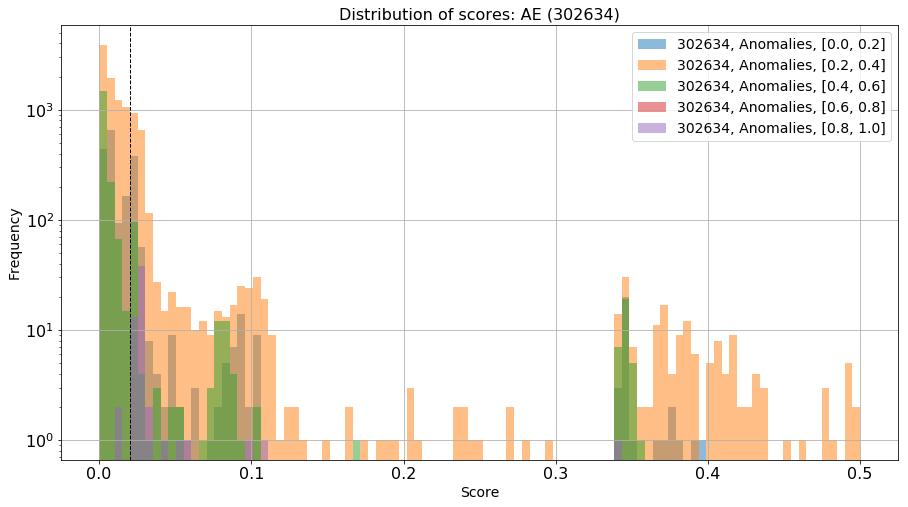

In [101]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
#ax.set_xscale('log')
bins = np.linspace(0, 0.5, 100)
rule = (layers_test["run"] == 302634) & (layers_test["score"] > 0)
range_r = (np.array(range(0, 10, 2))/10.0)
for h in range_r:
    #print h
    rule_r = (layers_test.ratio > h) & (layers_test.ratio < (h+0.2))
    plt.hist(layers_test[rule & rule_r]["cae_score"],\
         bins=bins, alpha=0.5, label="302634, Anomalies, ["+str(h)+", "+str(h+0.2)+"]")
plt.title("Distribution of scores: AE (302634)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.axvline(0.02, color='k', linestyle='dashed', linewidth=1)
plt.show()

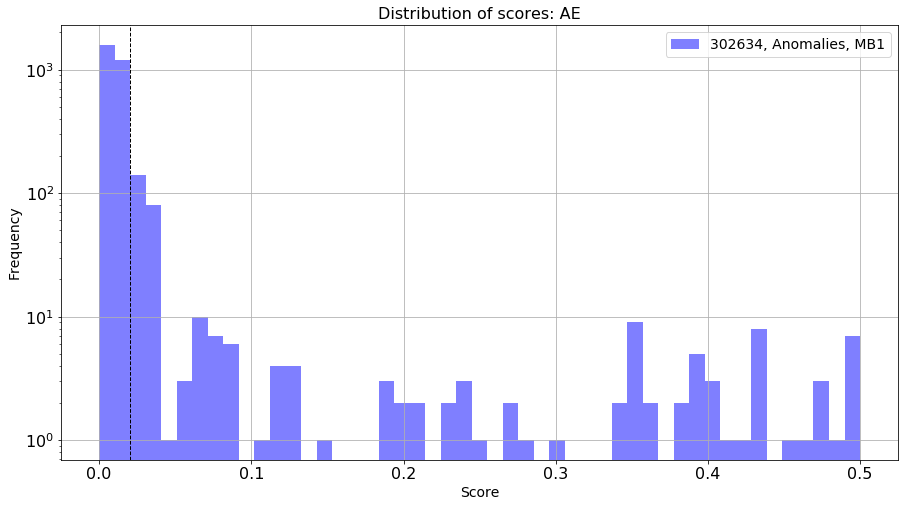

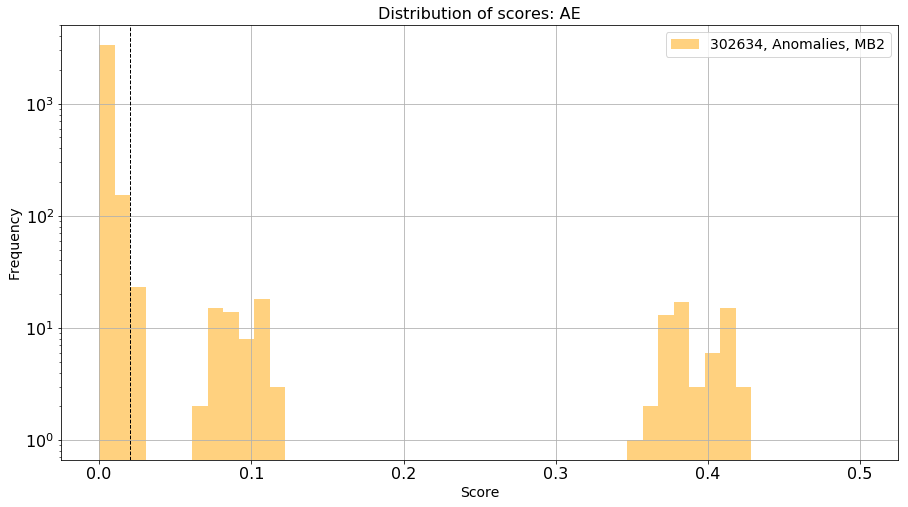

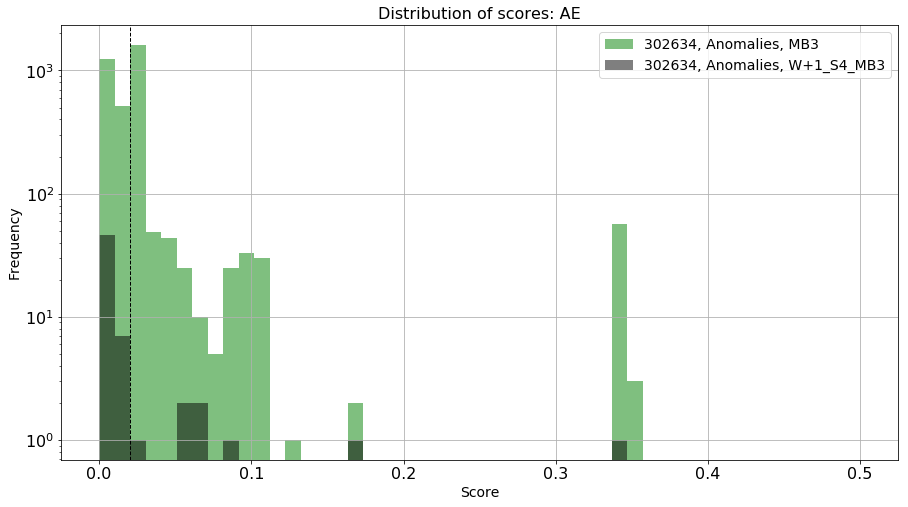

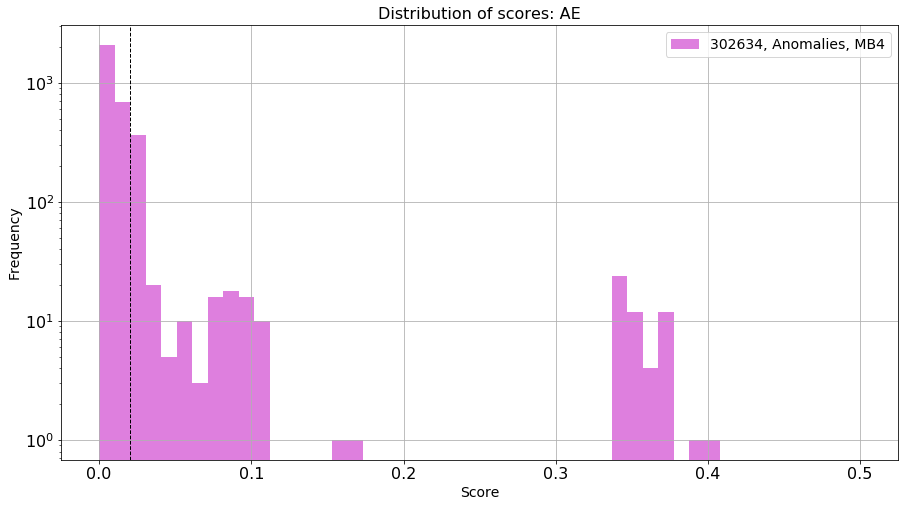

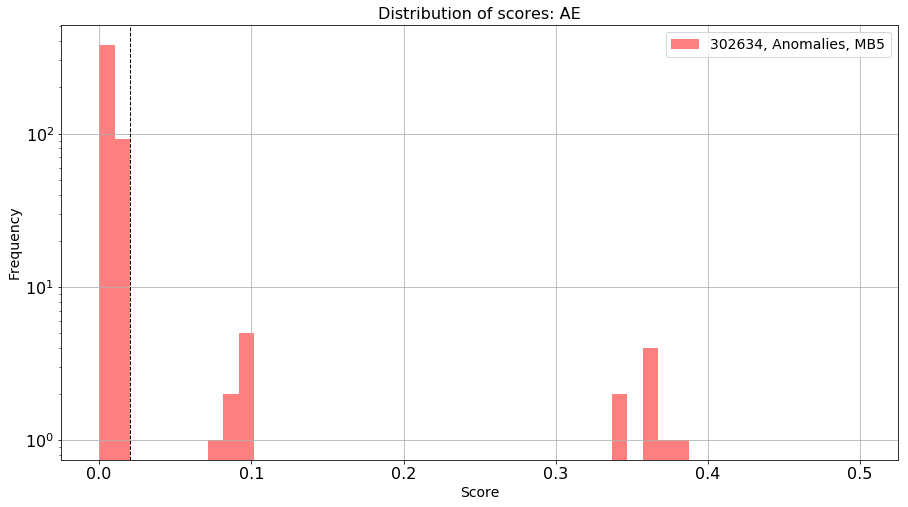

In [102]:
bins = np.linspace(0, 0.5, 50)
rule = (layers_test["run"] == 302634) & (layers_test["score"] > 0)
colors = ["b", "orange", "g", "m", "r"]
for h in range(1, 6):
    fig, ax = plt.subplots()
    ax.set_yscale('log')
    ax.grid()
    #ax.set_xscale('log')
    #print h
    rule_r = (layers_test.station == h)
    plt.hist(layers_test[rule & rule_r]["cae_score"],\
         bins=bins, alpha=0.5, label="302634, Anomalies, MB"+str(h),\
             color=colors[h-1],\
             histtype = "bar")
    if (h ==3):
        rule_k = (layers_test.sector == 4) & (layers_test.wheel == +1)
        plt.hist(layers_test[rule & rule_r & rule_k]["cae_score"],\
             bins=bins, alpha=0.5, label="302634, Anomalies, W+1_S4_MB"+str(h),\
                 color="k",\
                 histtype = "bar")
    plt.title("Distribution of scores: AE")
    plt.legend(loc='best')
    plt.ylabel('Frequency')
    plt.xlabel('Score')
    plt.axvline(0.02, color='k', linestyle='dashed', linewidth=1)
    plt.show()

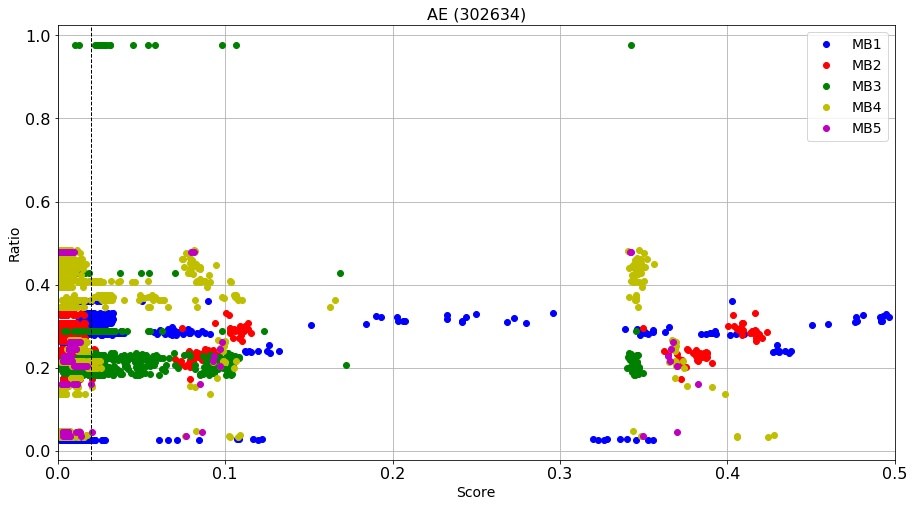

In [103]:
fig, ax = plt.subplots()
#ax.set_yscale('log')
plt.xlabel("Score")
plt.ylabel("Ratio")
plt.xlim(0, 0.5)
ax.grid()
rule = (layers_test.run == 302634) #& (layers_test.board == "YB+1_S3")
style = ["bo", "ro", "go", "yo", "mo"]
names = ["MB1", "MB2", "MB3", "MB4", "MB5"]
for i in range(1, 6):
    rule_st = (layers_test.station == i)
    plt.plot(layers_test[rule & rule_st]["cae_score"], layers_test[rule & rule_st]["ratio"],\
             style[i-1], label=names[i-1])
plt.title("AE (302634)")
plt.legend(loc='best')
plt.axvline(0.02, color='k', linestyle='dashed', linewidth=1)
plt.show()

In [105]:
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Normalized confusion matrix
[[  9.99986840e-01   1.31603190e-05]
 [  7.04285517e-01   2.95714483e-01]]


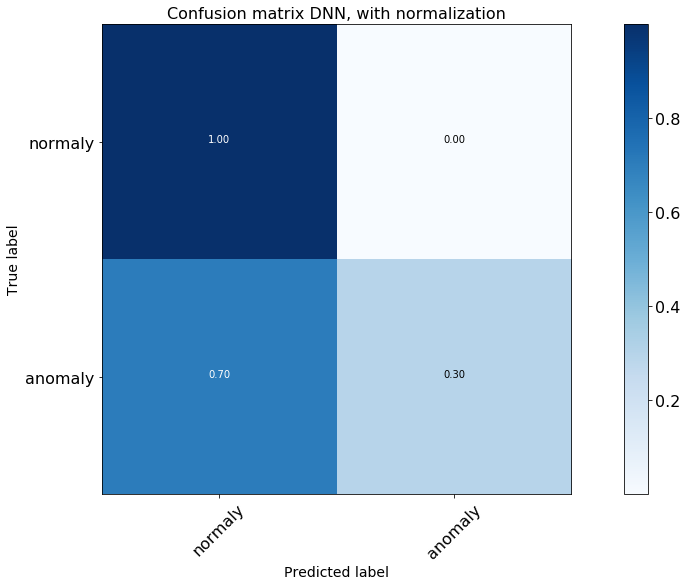

In [105]:
th_DNN = 0.1
y_pred = 2*(layers_test["ann_score_4"] > th_DNN)-1
layers_test["score"] = 2*(layers_test["score"] > th_DNN)-1

cnf_matrix = confusion_matrix(layers_test["score"], y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix DNN, with normalization')

Normalized confusion matrix
[[ 0.99647303  0.00352697]
 [ 0.77304671  0.22695329]]


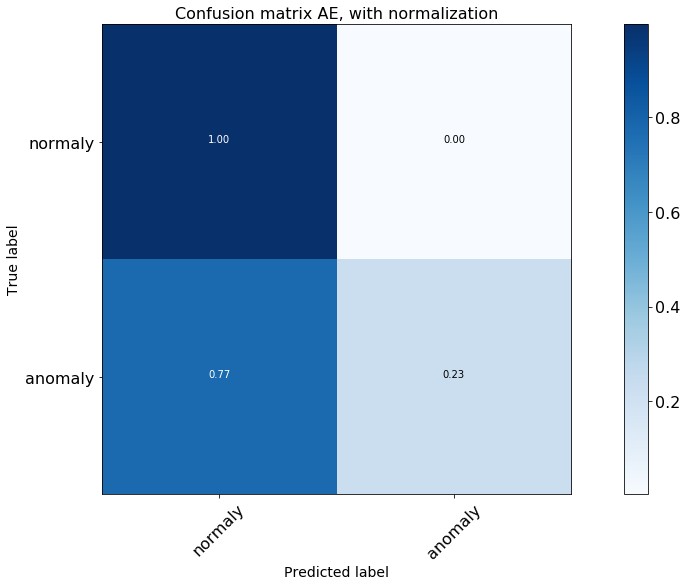

In [107]:
th_AE = 0.02
y_pred = 2*(layers_test["cae_score"] > th_AE)-1
cnf_matrix = confusion_matrix(layers_test["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix AE, with normalization')

In [108]:
print "Number of FPs for the DNN:", len(layers_test[(layers_test["score"] == -1) &\
                                                    (layers_test["ann_score_4"] > th_DNN)])

Number of FPs for the DNN: 1


In [109]:
print "Number of FPs for the AE:", len(layers_test[(layers_test["score"] == -1) &\
                                                   (layers_test["cae_score"] > th_AE)])

Number of FPs for the AE: 268


In [110]:
layers_test["name"] = ("W" + layers_test["wheel"].astype(str) + "_S" + layers_test["sector"].astype(str) +\
       "_St" + layers_test["station"].astype(str))

Where are the FPs located?

In [ ]:
def count_fp(df, dis_nn, th, filt):
    df_temp = df[(layers_test["score"] == -1) & (layers_test[dis_nn] > th)].copy()
    df_temp = df_temp.groupby(['run', 'wheel', 'sector', 'station', 'name'])\
    .size().reset_index(name='counts')
    if filt:
        df_temp = df_temp[df_temp["counts"] > 1]
    #print df_temp
    return len(df_temp), df_temp

num_fp_ann, fp_ann = count_fp(layers_test, "ann_score_4", th_DNN, False)
num_fp_cae, fp_cae = count_fp(layers_test, "cae_score", th_AE, True)

print "Number of chambers with false positives DNN:", num_fp_ann
print "Number of chambers with false positives AE:", num_fp_cae
fp_cae.set_index("name",drop=True,inplace=True)
fp_ann.set_index("name",drop=True,inplace=True)

In [ ]:
fp_ann["counts"].plot(kind='bar', title ="False positives DNN", legend=True, fontsize=12)

In [ ]:
fp_cae["counts"].plot(kind='bar', title ="False positives AE", legend=True, fontsize=12)

In [114]:
def get_matrix(df):
    x = np.zeros((5,12),dtype=int)
    for i in range(len(df)):
        a = int(5-df["station"].iloc[i])
        b = int(df["sector"].iloc[i]-1)
        x[a,b] = x[a,b] + 1
    return x

In [111]:
def plot_scatter(df, run, wheel, ls_min, ls_max):
    run_s = "All"
    wheel_s = "All"
    ls_s = "All"
    temp = df.copy()
    if wheel != -3:
        temp = temp[(temp["wheel"] == wheel)]
        wheel_s = str(wheel)
    if run != -1:
        temp = temp[(temp["run"] == run)]
        run_s = str(run)
    if ((ls_min != -1) & (ls_max == -1)):
        temp = temp[(temp["averageLS"] >= ls_min)]
        ls_s = "> "+str(ls_min)
    elif ((ls_min == -1) & (ls_max != -1)):
        temp = temp[(temp["averageLS"] <= ls_max)]
        ls_s = "< "+str(ls_max)
    elif ((ls_min != -1) & (ls_max != -1)):
        temp = temp[(temp["averageLS"] >= ls_min) & (temp["averageLS"] <= ls_max)]
        ls_s = " ["+str(ls_min)+", "+str(ls_max)+"]"
    mat = get_matrix(temp)
    #print mat
    #print mat.sum()

    plt.figure()
    
    ax = plt.gca()
    ax.set_yticklabels(["1", "2", "3", "4", "5"])
    ax.set_yticks([4, 3, 2, 1, 0])
    ax.set_xticklabels(["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12"])
    ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11])
    
    plt.xlabel("Sector")
    plt.ylabel("Station")
    
    im = ax.imshow(mat, interpolation="nearest")
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    
    for i in range(0,5):
        for j in range(0,12):
            text = ax.text(j, i, mat[i, j],\
            ha="center", va="center", color="w")
    
    plt.colorbar(im, cax=cax, ticks=[np.min(np.nan_to_num(mat)), np.max(np.nan_to_num(mat))])
    title = "Run: "+run_s+", Wheel: "+wheel_s+", LS: "+ls_s
    plt.title(title, loc="right")   
    plt.show()

In [112]:
def plot_scatter_2(df, arg, wheel):
    wheel_s = "All"
    temp = df.copy()
    if wheel != -3:
        temp = temp[(temp["wheel"] == wheel)]
        wheel_s = str(wheel)
    else:
        return 1
    
    mat = []
    for i in [5, 4, 3, 2, 1]:
        rule = (temp.station == i)
        vec = list(temp[rule][arg].values)
        if (i == 5):
            tmp = list(temp[rule][arg].values)
            vec = [0, 0, 0, tmp[0], 0, 0, 0, 0, 0, tmp[1], 0, 0]
        mat.append(vec)
        #print i, temp[rule]["ratio"].values
    #print mat

    plt.figure()
    
    ax = plt.gca()
    ax.set_yticklabels(["1", "2", "3", "4", "5"])
    ax.set_yticks([4, 3, 2, 1, 0])
    ax.set_xticklabels(["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12"])
    ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11])
    
    plt.xlabel("Sector")
    plt.ylabel("Station")
    
    im = ax.imshow(mat, interpolation="nearest")
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    
    for i in range(0,5):
        for j in range(0,12):
            text = ax.text(j, i, round(mat[i][j], 2),\
            ha="center", va="center", color="w")
    
    plt.colorbar(im, cax=cax, ticks=[np.min(np.nan_to_num(mat)), np.max(np.nan_to_num(mat))])
    title = "Wheel: "+wheel_s
    plt.title(title, loc="right")   
    plt.show()

Decrease in rate per station and sector in each wheel:

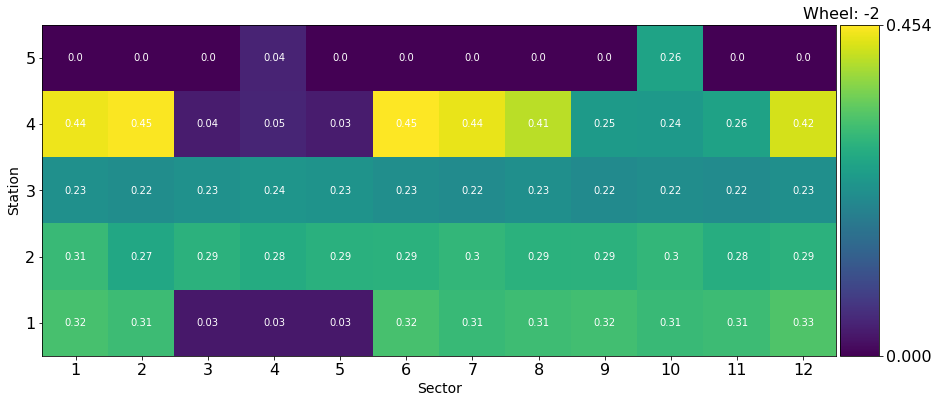

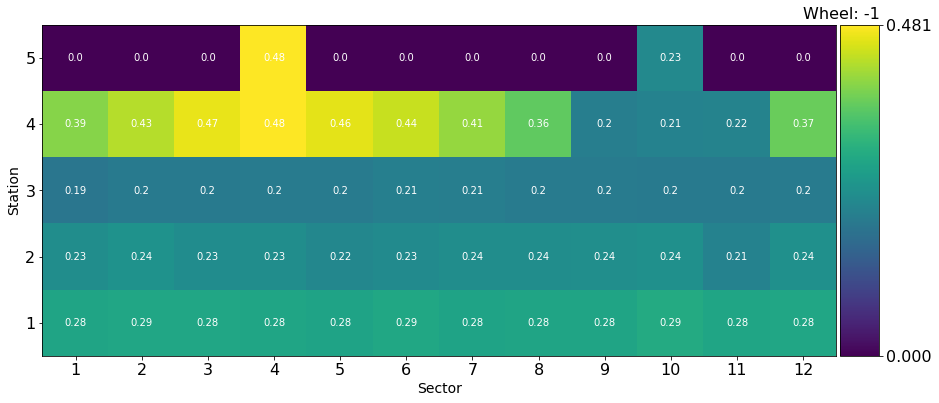

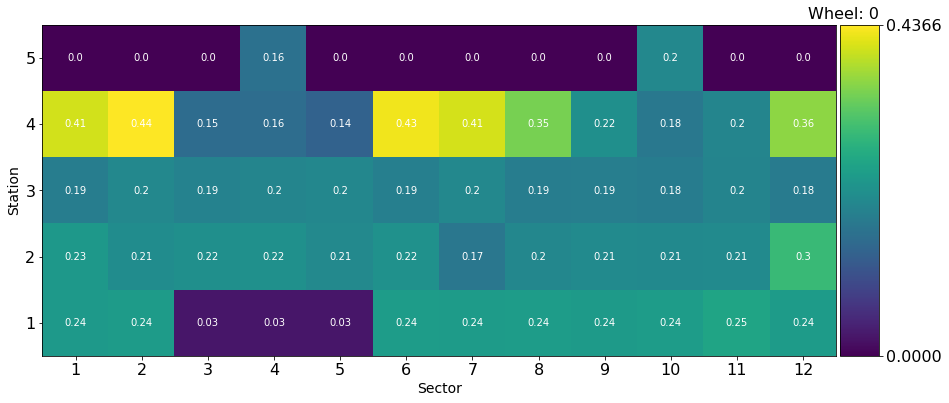

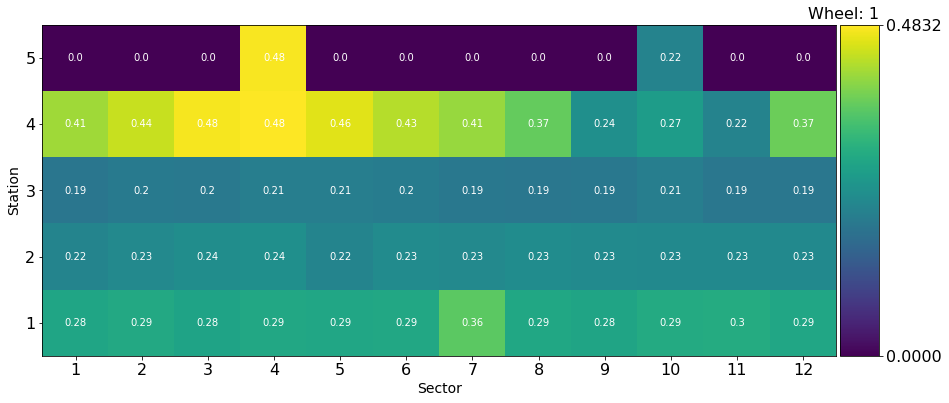

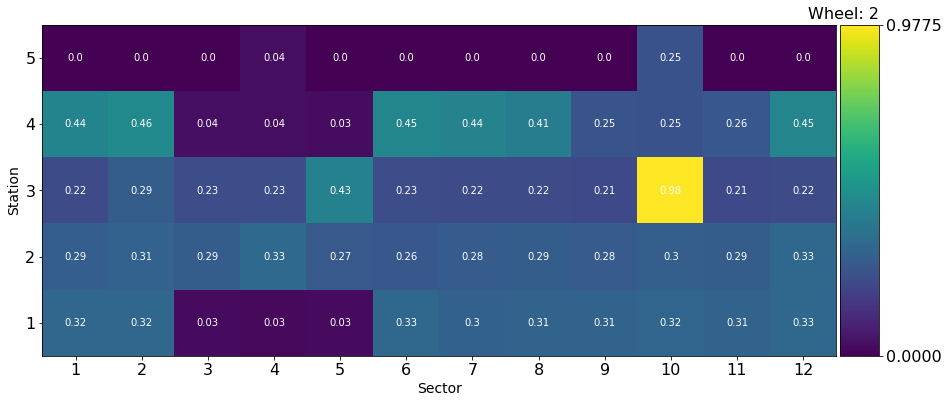

In [124]:
plot_scatter_2(ratio, "ratio", -2)
plot_scatter_2(ratio, "ratio", -1)
plot_scatter_2(ratio, "ratio", 0)
plot_scatter_2(ratio, "ratio", +1)
plot_scatter_2(ratio, "ratio", +2)

Cross-section per station and sector in each wheel for the reference run:

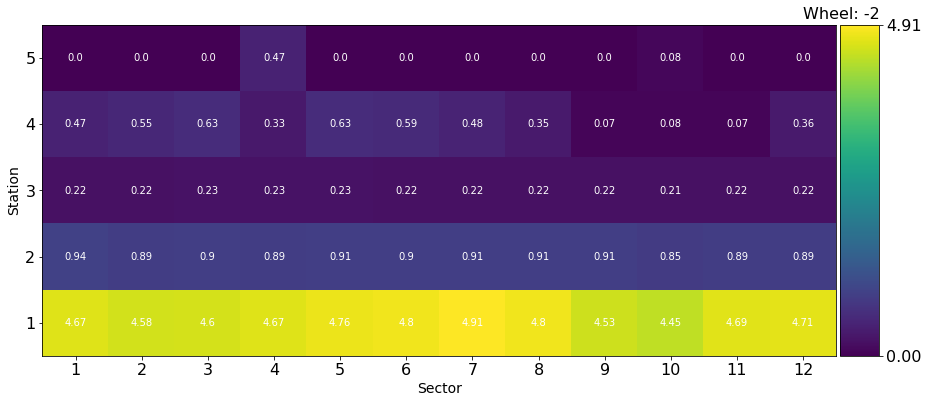

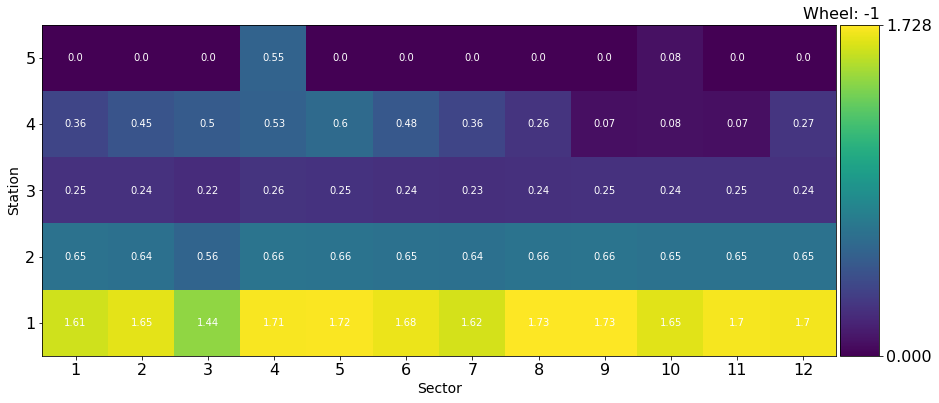

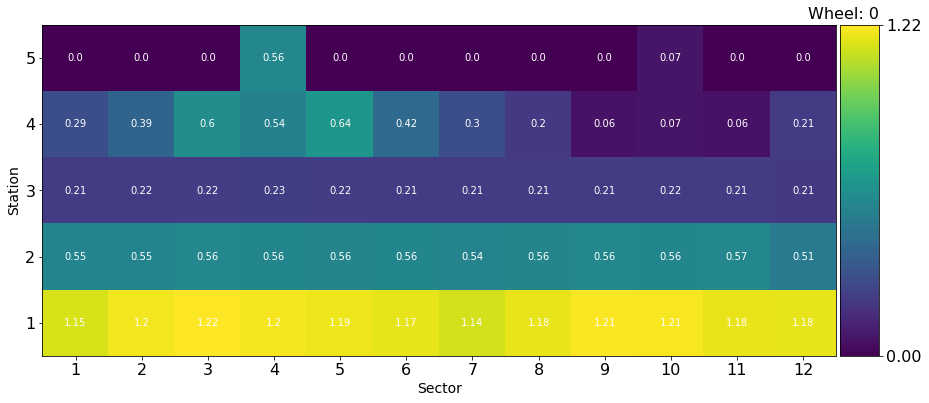

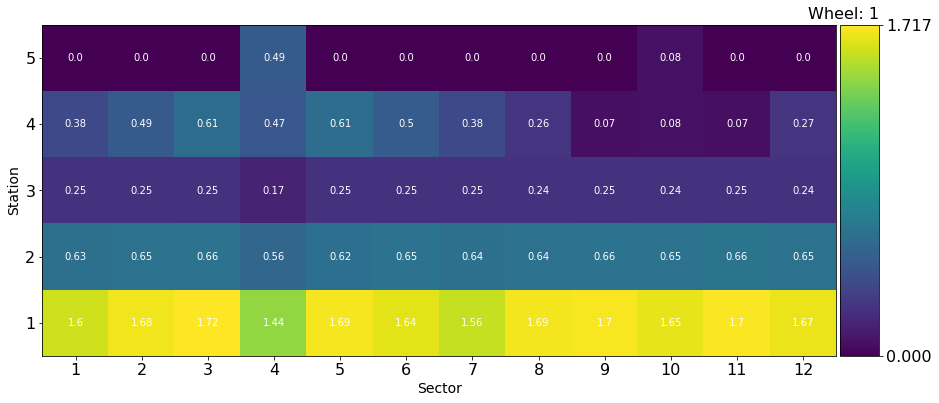

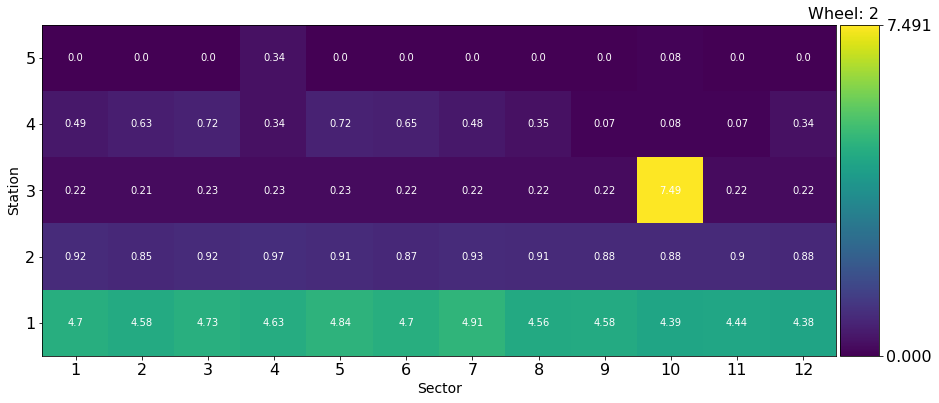

In [499]:
plot_scatter_2(ratio, "ref", -2)
plot_scatter_2(ratio, "ref", -1)
plot_scatter_2(ratio, "ref", 0)
plot_scatter_2(ratio, "ref", +1)
plot_scatter_2(ratio, "ref", +2)

Cross-section per station and sector in each wheel for the anomalous run:

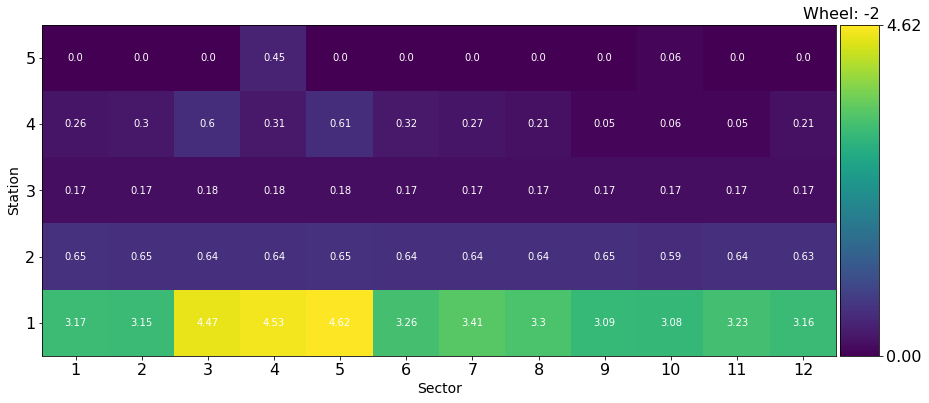

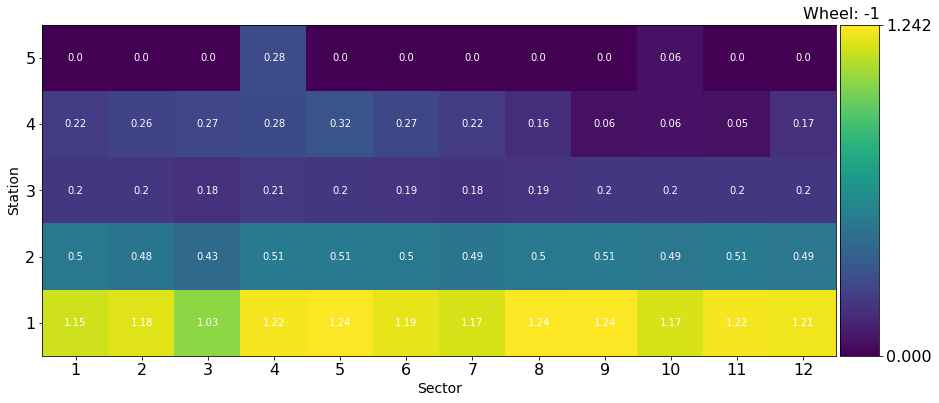

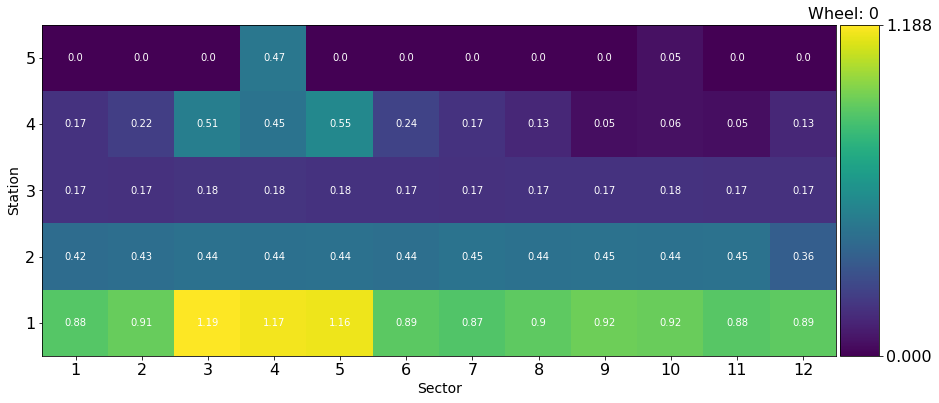

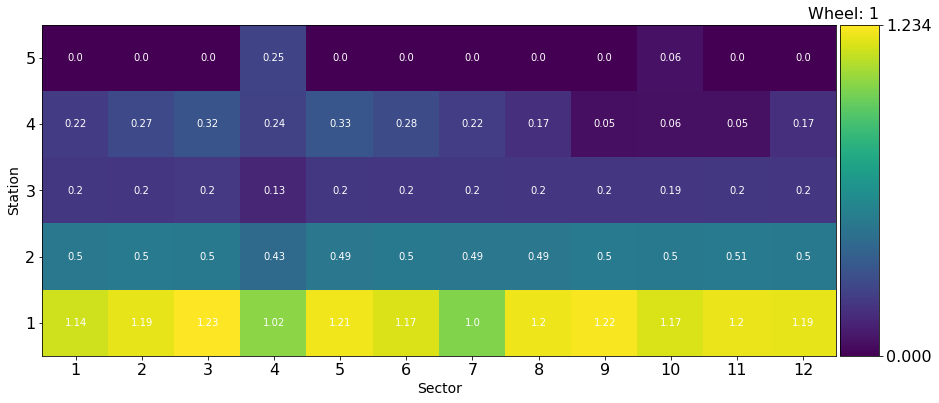

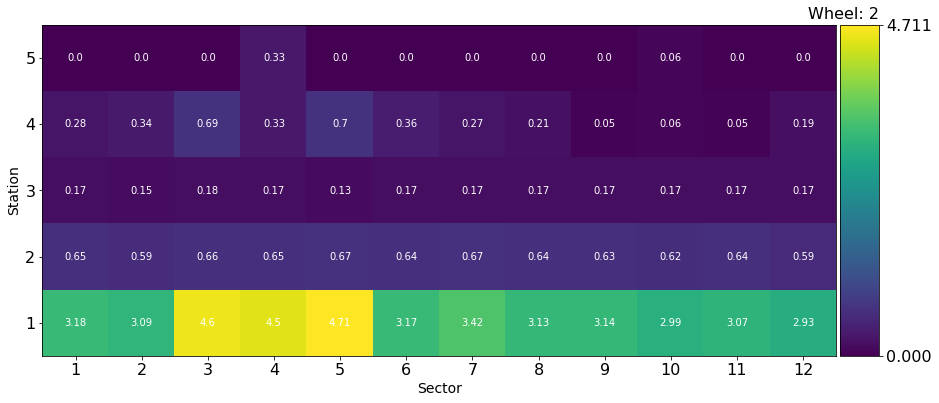

In [500]:
plot_scatter_2(ratio, "anomal", -2)
plot_scatter_2(ratio, "anomal", -1)
plot_scatter_2(ratio, "anomal", 0)
plot_scatter_2(ratio, "anomal", +1)
plot_scatter_2(ratio, "anomal", +2)

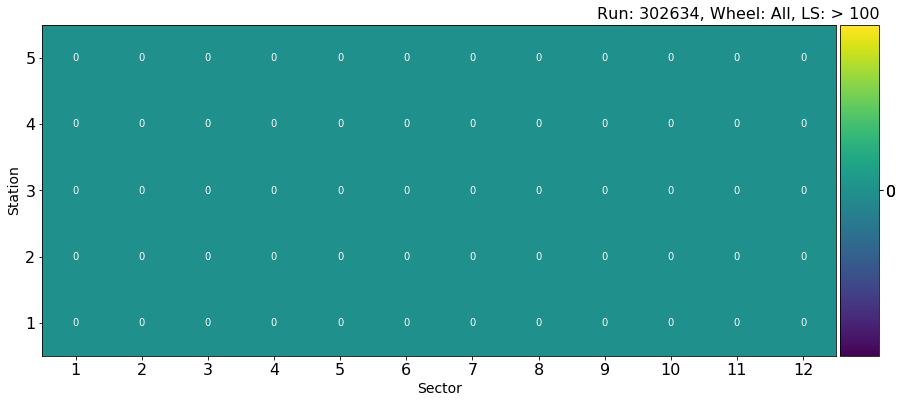

In [506]:
dis_nn = "cae_score"
rule = (layers_test["score"] == -1) & (layers_test[dis_nn] > th_AE)
plot_scatter(layers_test[rule], 302634, -3, 100, -1)

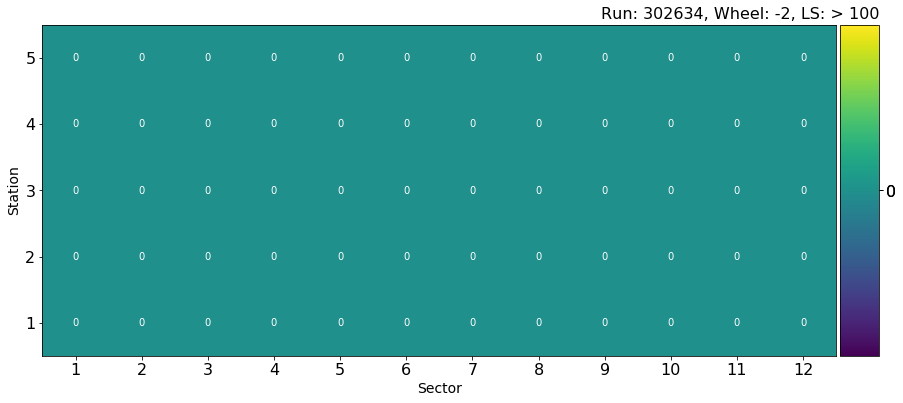

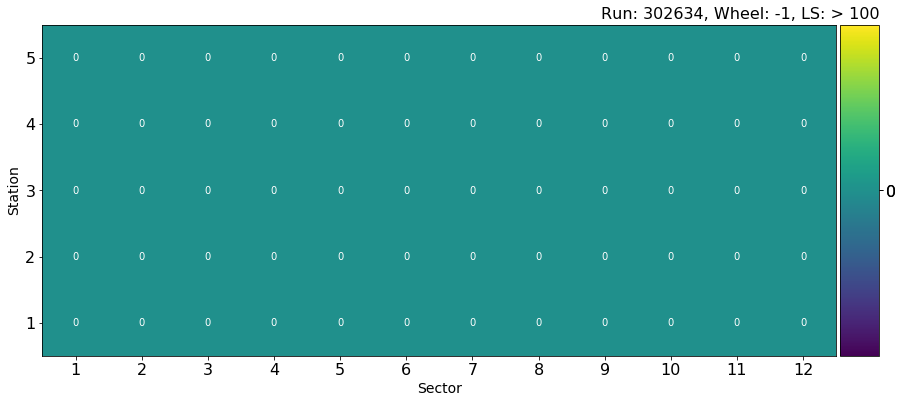

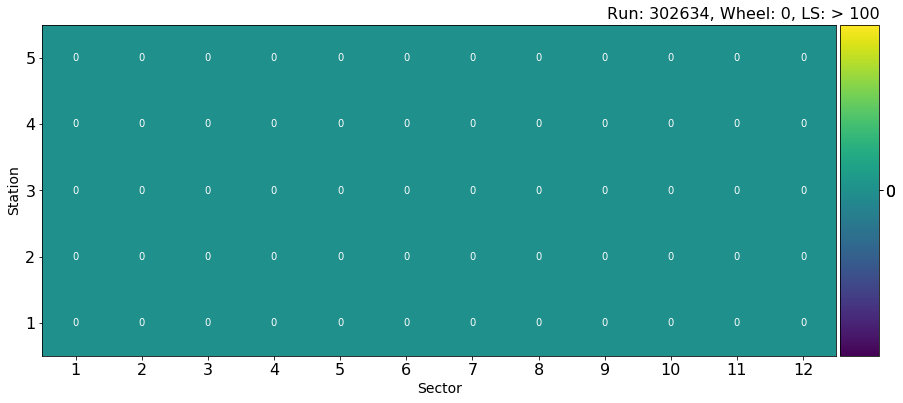

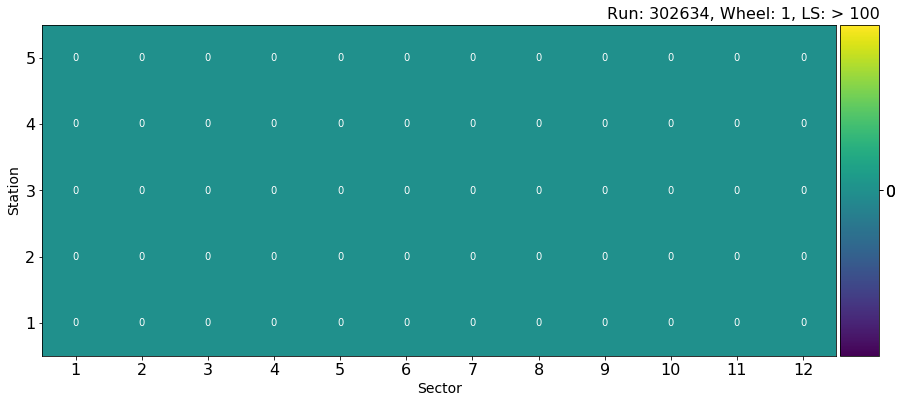

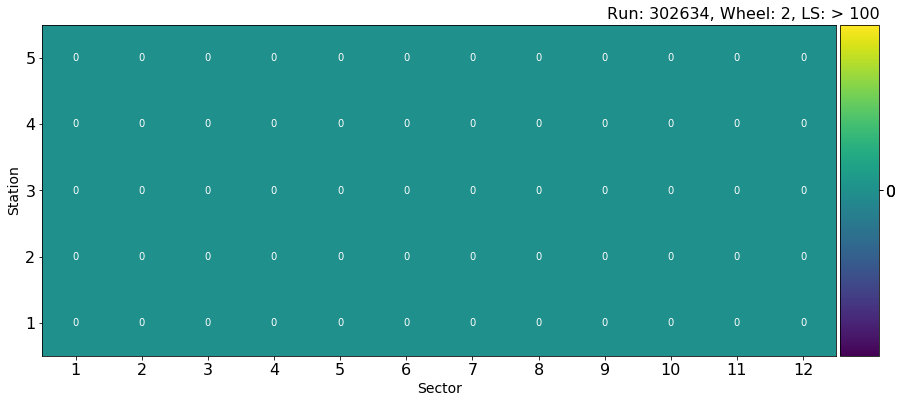

In [507]:
plot_scatter(layers_test[rule], 302634, -2, 100, -1)
plot_scatter(layers_test[rule], 302634, -1, 100, -1)
plot_scatter(layers_test[rule], 302634, 0, 100, -1)
plot_scatter(layers_test[rule], 302634, +1, 100, -1)
plot_scatter(layers_test[rule], 302634, +2, 100, -1)

Looking at how the recognized and unrecognized anomalies are distributed:

ANOMALIES: NOT SELECTED WITH AE


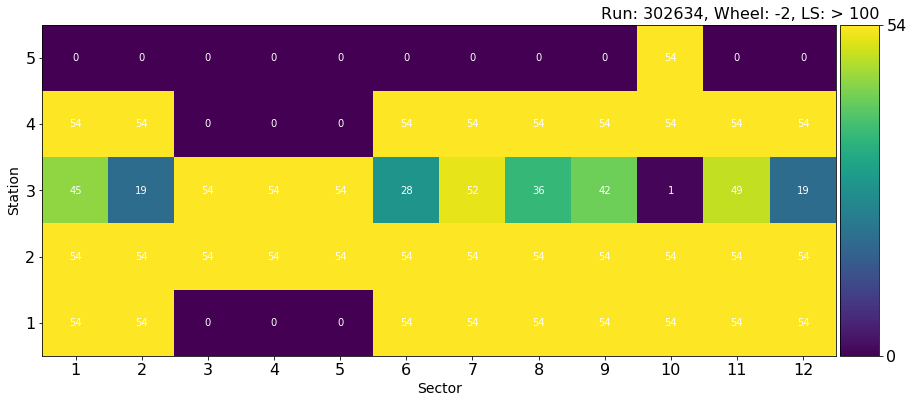

ANOMALIES: SELECTED WITH AE


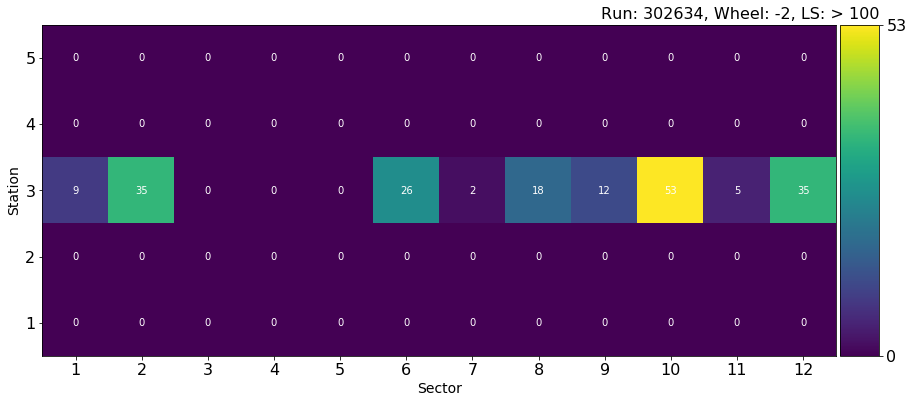

In [508]:
print "ANOMALIES: NOT SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] < th_AE)
plot_scatter(layers_test[rule], 302634, -2, 100, -1)
print "ANOMALIES: SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] > th_AE)
plot_scatter(layers_test[rule], 302634, -2, 100, -1)

ANOMALIES: NOT SELECTED WITH AE


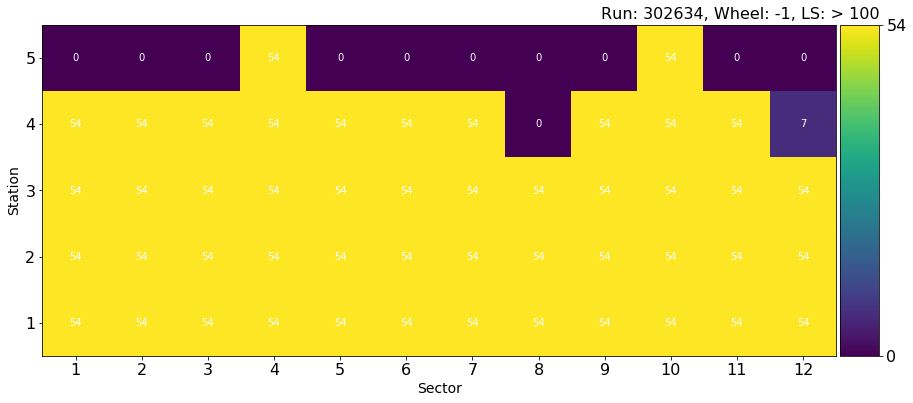

ANOMALIES: SELECTED WITH AE


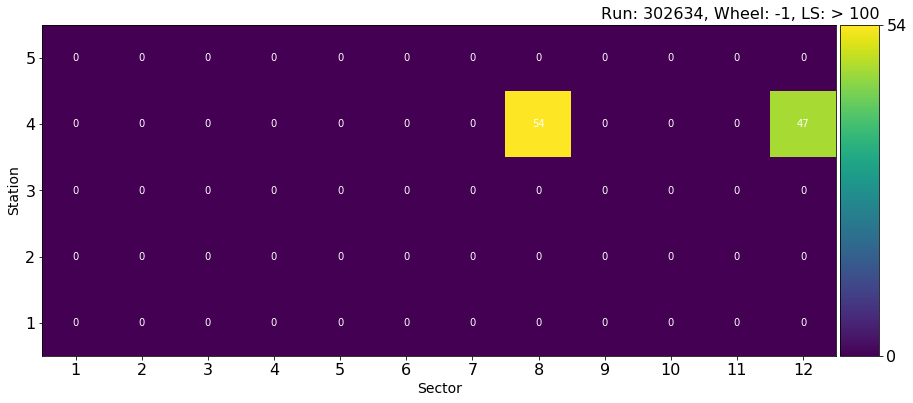

In [509]:
print "ANOMALIES: NOT SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] < th_AE)
plot_scatter(layers_test[rule], 302634, -1, 100, -1)
print "ANOMALIES: SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] > th_AE)
plot_scatter(layers_test[rule], 302634, -1, 100, -1)

ANOMALIES: NOT SELECTED WITH AE


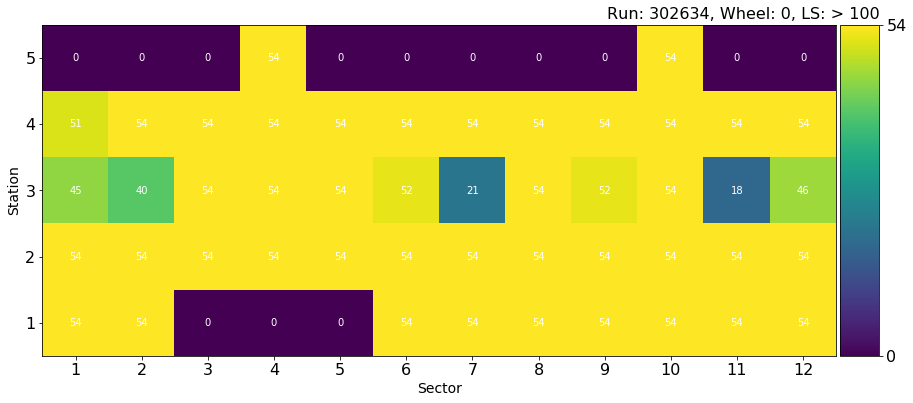

ANOMALIES: SELECTED WITH AE


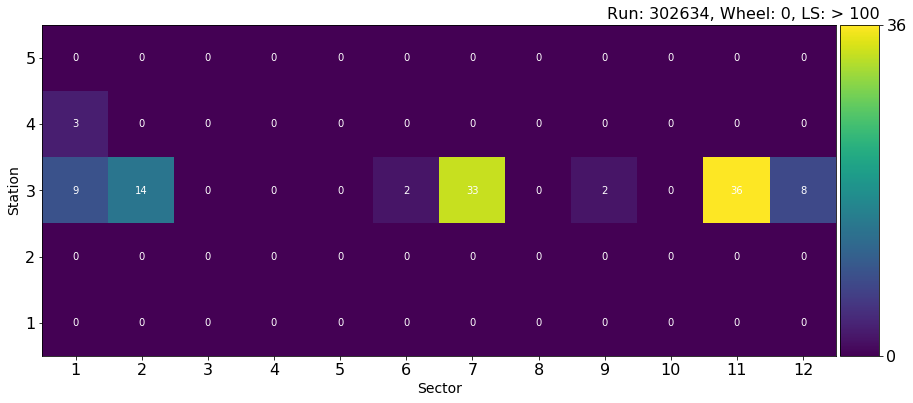

In [510]:
print "ANOMALIES: NOT SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] < th_AE)
plot_scatter(layers_test[rule], 302634, 0, 100, -1)
print "ANOMALIES: SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] > th_AE)
plot_scatter(layers_test[rule], 302634, 0, 100, -1)

ANOMALIES: NOT SELECTED WITH AE


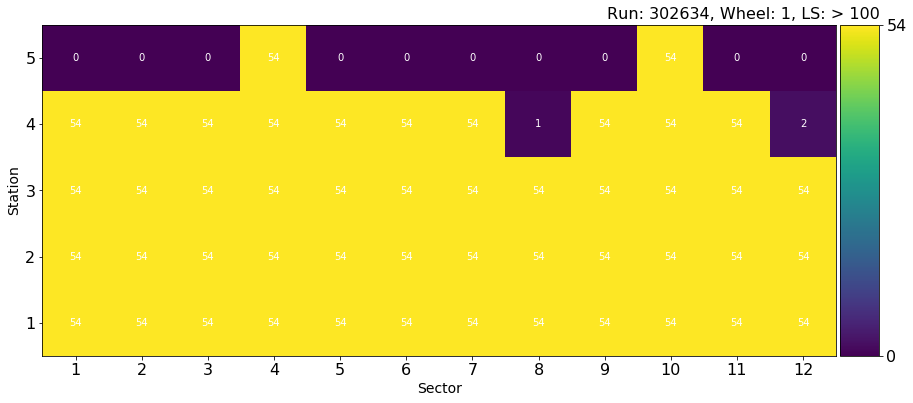

ANOMALIES: SELECTED WITH AE


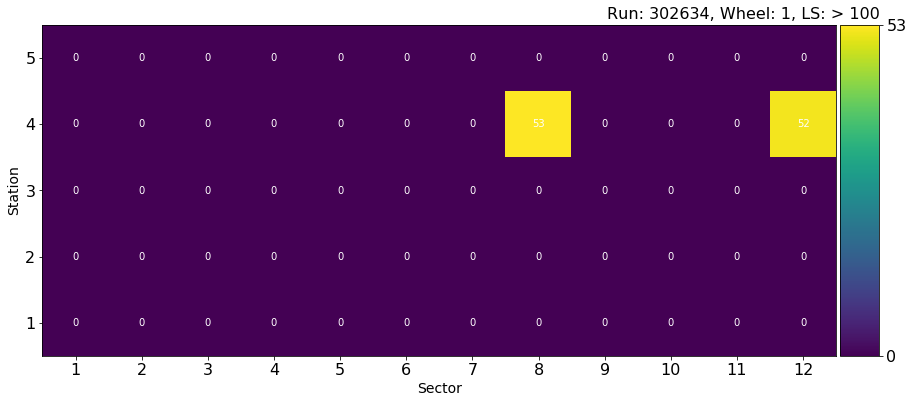

In [511]:
print "ANOMALIES: NOT SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] < th_AE)
plot_scatter(layers_test[rule], 302634, +1, 100, -1)
print "ANOMALIES: SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] > th_AE)
plot_scatter(layers_test[rule], 302634, +1, 100, -1)

ANOMALIES: NOT SELECTED WITH AE


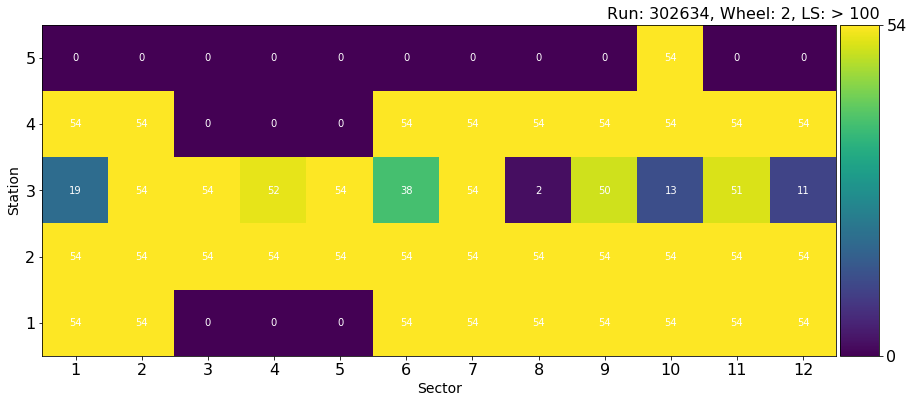

ANOMALIES: SELECTED WITH AE


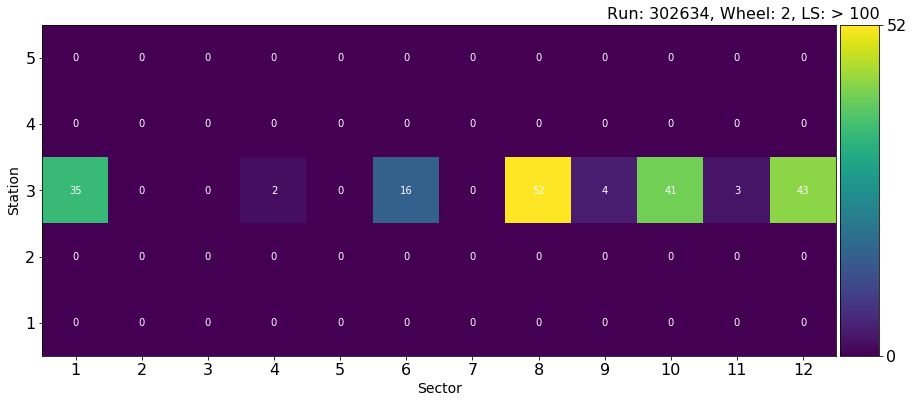

In [512]:
print "ANOMALIES: NOT SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] < th_AE)
plot_scatter(layers_test[rule], 302634, +2, 100, -1)
print "ANOMALIES: SELECTED WITH AE"
rule = (layers_test["score"] == 1) & (layers_test[dis_nn] > th_AE)
plot_scatter(layers_test[rule], 302634, +2, 100, -1)

Where are the FPs located in time?

In [108]:
def plotFpVsLs(run, wheel, sector, station, title, df, algo, threshold, log, bound):
    fig, ax = plt.subplots()
    if log:
        ax.set_yscale('log')
    bins = np.linspace(0, bound, int(bound/10)+10)
    (n, bins, patches) = plt.hist(df[(df["score"] == -1) & (df[algo] > threshold)
                         #& (df["wheel"] == 2) &\
                         #& (df["sector"] == 4) &\
                         #& (df["station"] == 2) &\
                         & (df["run"] == run)\
                        ]["averageLS"],
             bins=bins, alpha=0.5, label="False positives")
    plt.hist(df[(df["score"] == 1) & (df[algo] > threshold)
                         #& (df["wheel"] == 2) &\
                         #& (df["sector"] == 4) &\
                         #& (df["station"] == 2) &\
                         & (df["run"] == run)\
                        ]["averageLS"],
             bins=bins, alpha=0.5, label="True positives")
    plt.plot(df[(df["run"] == run)]["averageLS"],\
             df[(df["run"] == run)]["lumi"], "ro",\
             alpha=0.5, label="Inst. Lumi. $(x 10^{30} Hz/cm^2)$")
    plt.title(title+str(run))
    plt.legend(loc='best')
    plt.ylabel('Frequency')
    plt.xlabel('LS')
    plt.grid(True)
    #plt.plot([bound, bound], [0, 100], color='r', linestyle='--', linewidth=2)
    plt.show()
    return n

def deduceLS(data):
    return data*10+5
anomalies["averageLS"] = anomalies["group"].apply(deduceLS)

In [ ]:
threshold = th_AE
plotFpVsLs(302634, 0, 0, 0, "Distribution of false positives: AE, ", layers_test, "cae_score",\
           threshold, True, boundaries[boundaries["run"] == 302634]["ls_end"])
#plotFpVsLs(302635, 0, 0, 0, "Distribution of false positives: AE, ", layers_test, "cae_score",\
           #threshold, True, boundaries[boundaries["run"] == 302635]["ls_end"])

Trying unsupervised algorithms:

In [327]:
from sklearn.neighbors import LocalOutlierFactor
threshold = 0.0
result_lof = []
for i in range(5, 500, 10):
    lofclf = LocalOutlierFactor(n_neighbors=i, contamination=0.2)#It has to be a odd number
    layers_test["lof_score"] = -lofclf.fit_predict(np.vstack(layers_test["content_red_scaled"].values))
    y_pred = 2*(layers_test["lof_score"] > threshold)-1
    tn, fp, fn, tp = confusion_matrix(layers_test["score"].astype(int), y_pred).ravel()
    result_lof.append([i, tn, fp, fn, tp])

In [333]:
for i in range(505, 1000, 100):
    lofclf = LocalOutlierFactor(n_neighbors=i, contamination=0.2)#It has to be a odd number
    layers_test["lof_score"] = -lofclf.fit_predict(np.vstack(layers_test["content_red_scaled"].values))
    y_pred = 2*(layers_test["lof_score"] > threshold)-1
    tn, fp, fn, tp = confusion_matrix(layers_test["score"].astype(int), y_pred).ravel()
    result_lof.append([i, tn, fp, fn, tp])

In [336]:
for i in range(1005, 2000, 200):
    lofclf = LocalOutlierFactor(n_neighbors=i, contamination=0.2)#It has to be a odd number
    layers_test["lof_score"] = -lofclf.fit_predict(np.vstack(layers_test["content_red_scaled"].values))
    y_pred = 2*(layers_test["lof_score"] > threshold)-1
    tn, fp, fn, tp = confusion_matrix(layers_test["score"].astype(int), y_pred).ravel()
    result_lof.append([i, tn, fp, fn, tp])

In [ ]:
for i in range(2005, 5000, 500):
    lofclf = LocalOutlierFactor(n_neighbors=i, contamination=0.2)#It has to be a odd number
    layers_test["lof_score"] = -lofclf.fit_predict(np.vstack(layers_test["content_scaled"].values))
    y_pred = 2*(layers_test["lof_score"] > threshold)-1
    tn, fp, fn, tp = confusion_matrix(layers_test["score"].astype(int), y_pred).ravel()
    result_lof.append([i, tn, fp, fn, tp])

In [337]:
fp_rate = []
tp_rate = []
for i in range(len(result_lof)):
    fp_rate.append([result_lof[i][0], result_lof[i][2]*1.0/(result_lof[i][1]+result_lof[i][2])])
    tp_rate.append([result_lof[i][0], result_lof[i][4]*1.0/(result_lof[i][3]+result_lof[i][4])])

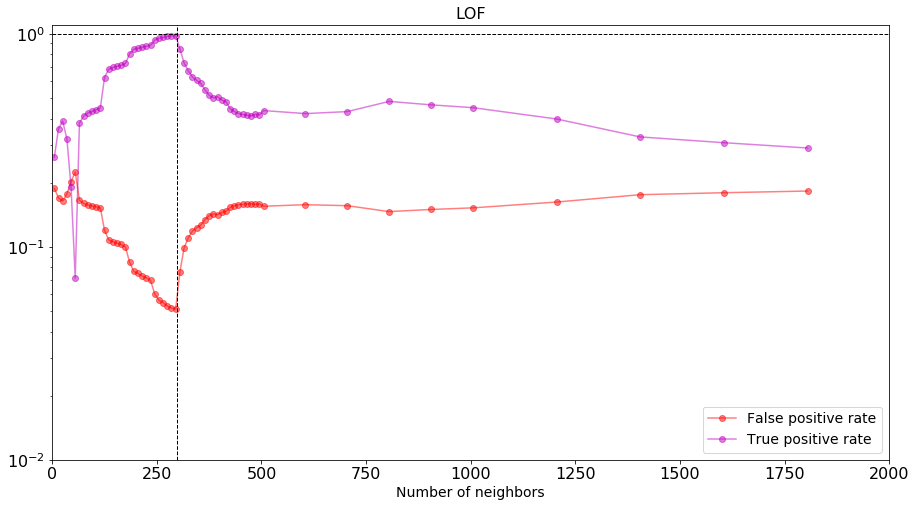

In [364]:
def plot_perf(der, rel, xaxis, yaxis, x1, x2, y1, y2, logx, logy):
    fig, ax = plt.subplots()
    if logy:
        ax.set_yscale('log')
    if logx:
        ax.set_xscale('log')
    a, b = zip(*der)
    c, d = zip(*rel)
    plt.ylim(y1, y2)
    plt.xlim(x1, x2)
    plt.plot(a, b, "ro-", alpha=0.5, label = "False positive rate")
    plt.plot(c, d, "mo-", alpha=0.5, label = "True positive rate")
    plt.axhline(1.00, color='k', linestyle='dashed', linewidth=1)
    #plt.axhline(0.01, color='g', linestyle='dashed', linewidth=1)
    if (xaxis == 'Number of neighbors'):
        plt.axvline(299, color='k', linestyle='dashed', linewidth=1)
    elif (xaxis == 'Contamination'):
        plt.axvline(0.18, color='k', linestyle='dashed', linewidth=1)
        plt.axhline(0.02, color='k', linestyle='dashed', linewidth=1)
    plt.title("LOF")
    plt.legend(loc='best')
    #plt.ylabel('Inertia')
    plt.xlabel(xaxis)
    plt.show()
    
plot_perf(fp_rate, tp_rate, 'Number of neighbors', '', 0, 2000, 0.01, 1.1, False, True)

In [359]:
threshold = 0.0
result_lof = []
for i in np.array(range(1, 500, 5))/1000.0:
    lofclf = LocalOutlierFactor(n_neighbors=299, contamination=i)#It has to be a odd number
    layers_test["lof_score"] = -lofclf.fit_predict(np.vstack(layers_test["content_red_scaled"].values))
    y_pred = 2*(layers_test["lof_score"] > threshold)-1
    tn, fp, fn, tp = confusion_matrix(layers_test["score"].astype(int), y_pred).ravel()
    result_lof.append([i, tn, fp, fn, tp])

In [360]:
fp_rate_c = []
tp_rate_c = []
for i in range(len(result_lof)):
    fp_rate_c.append([result_lof[i][0], result_lof[i][2]*1.0/(result_lof[i][1]+result_lof[i][2])])
    tp_rate_c.append([result_lof[i][0], result_lof[i][4]*1.0/(result_lof[i][3]+result_lof[i][4])])

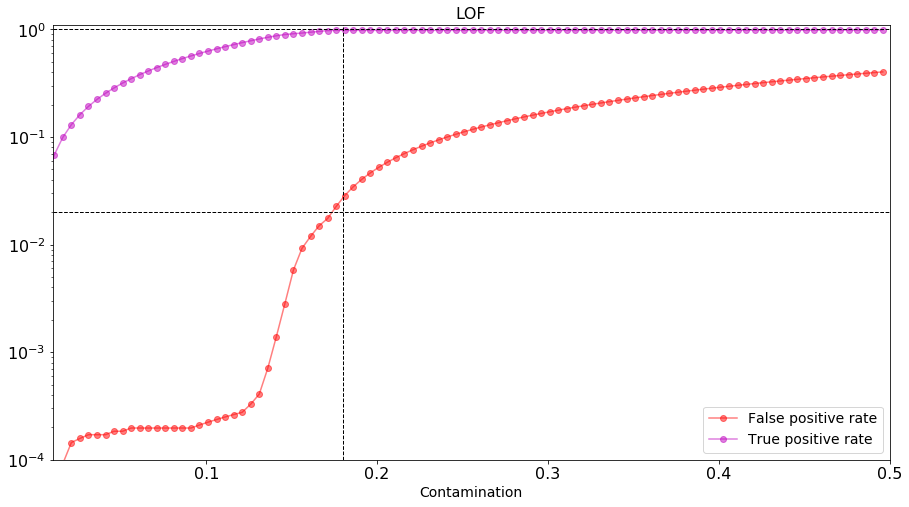

In [365]:
plot_perf(fp_rate_c, tp_rate_c, 'Contamination', '', 0.01, 0.5, 0.0001, 1.1, False, True)

In [392]:
# fit the model
from sklearn.neighbors import LocalOutlierFactor
lofclf = LocalOutlierFactor(n_neighbors=299,
                            contamination=0.15
                           )#It has to be a odd number
layers_test["lof_score"] = -lofclf.fit_predict(np.vstack(layers_test["content_red_scaled"].values))

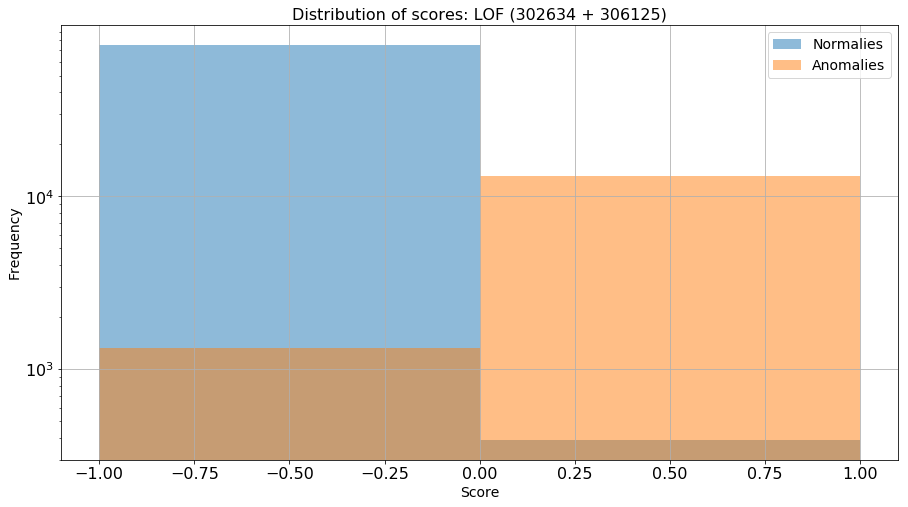

In [393]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(-1, +1, 3)
plt.hist(layers_test[layers_test["score"] < 0]["lof_score"], bins=bins, alpha=0.5, label="Normalies")
plt.hist(layers_test[layers_test["score"] > 0]["lof_score"], bins=bins, alpha=0.5, label="Anomalies")
plt.title("Distribution of scores: LOF (302634 + 306125)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Score')
plt.show()

Normalized confusion matrix
[[ 0.99488064  0.00511936]
 [ 0.09149786  0.90850214]]


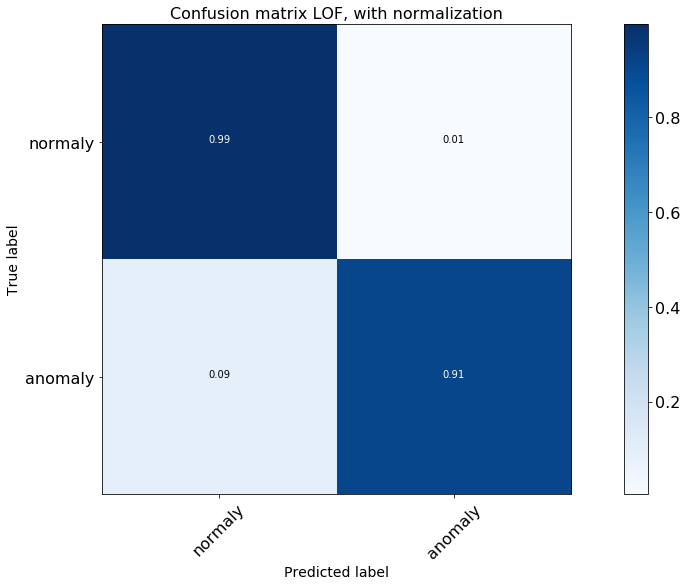

In [394]:
threshold = 0.0
y_pred = 2*(layers_test["lof_score"] > threshold)-1
cnf_matrix = confusion_matrix(layers_test["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix LOF, with normalization')

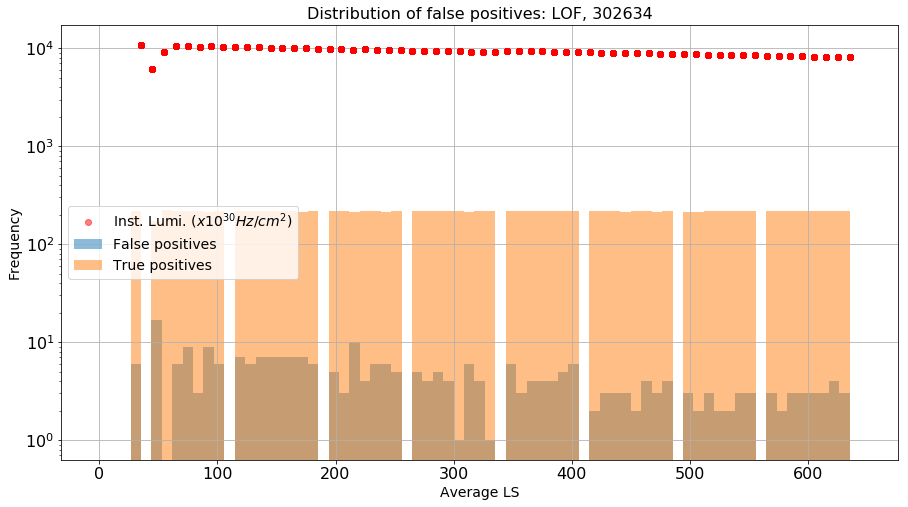

array([  0.,   0.,   0.,   6.,   0.,  17.,   0.,   6.,   9.,   3.,   9.,
         6.,   0.,   7.,   6.,   7.,   7.,   7.,   7.,   7.,   6.,   0.,
         5.,   3.,  10.,   4.,   6.,   6.,   5.,   0.,   5.,   4.,   5.,
         4.,   1.,   6.,   4.,   1.,   0.,   6.,   3.,   4.,   4.,   4.,
         5.,   6.,   0.,   2.,   3.,   3.,   3.,   2.,   4.,   3.,   4.,
         0.,   3.,   2.,   3.,   2.,   2.,   3.,   3.,   0.,   3.,   2.,
         3.,   3.,   3.,   3.,   4.,   3.,   0.])

In [395]:
layers_test["averageLS"] = layers_test["group"].apply(deduceLS)
threshold = 0.0
plotFpVsLs(302634, 0, 0, 0, "Distribution of false positives: LOF, ", layers_test, "lof_score",\
           threshold, True, boundaries[boundaries["run"] == 302634]["ls_end"])
#plotFpVsLs(302635, 0, 0, 0, "Distribution of false positives: LOF, ", layers_test, "lof_score",\
            #threshold, True, boundaries[boundaries["run"] == 302635]["ls_end"])

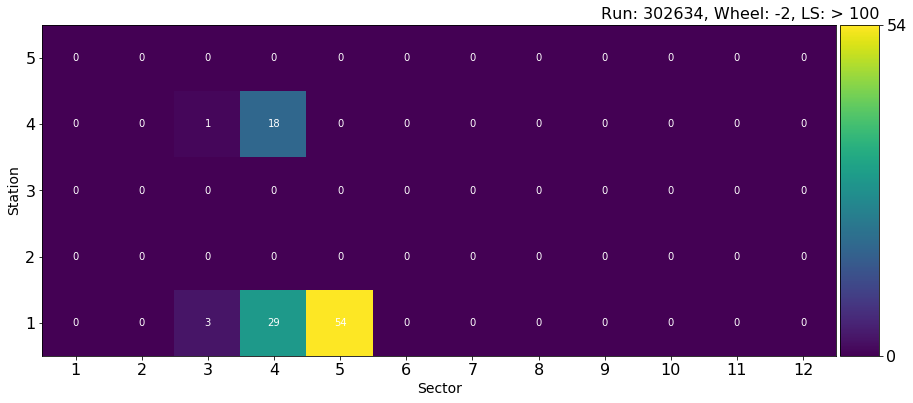

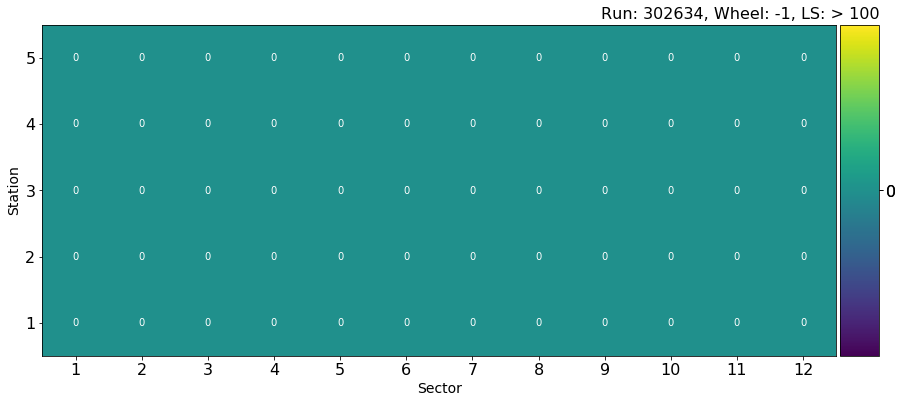

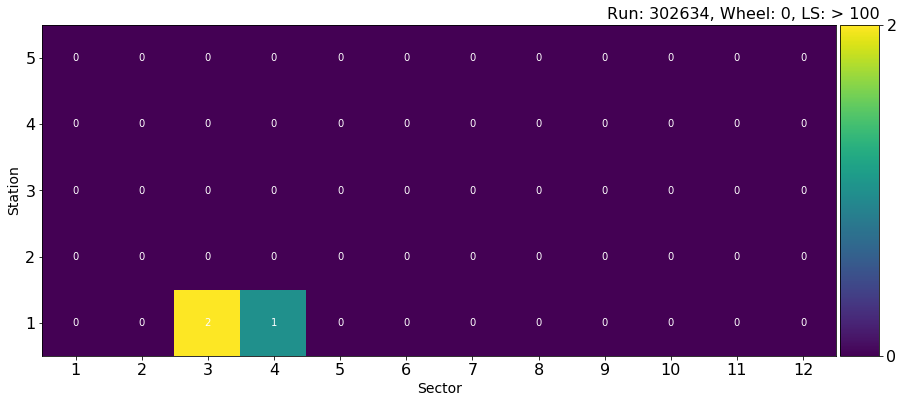

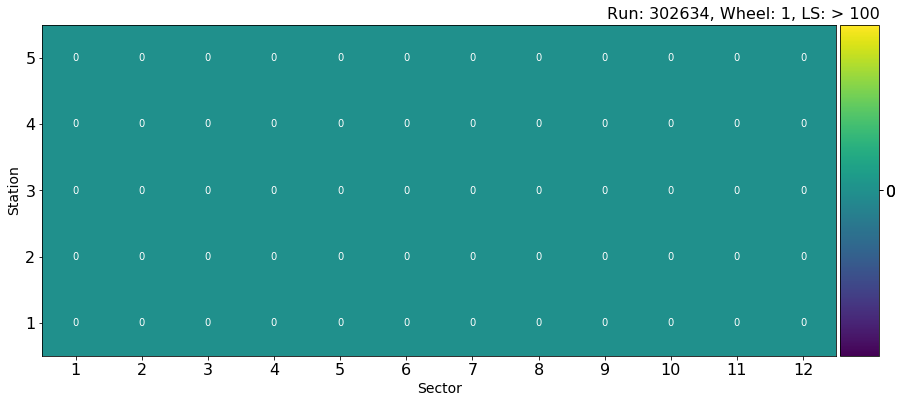

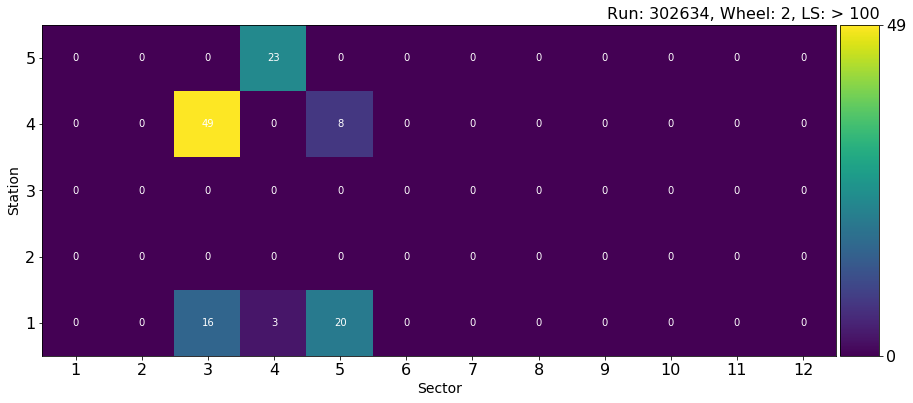

In [396]:
dis_nn = "lof_score"
rule = (layers_test["score"] == -1) & (layers_test[dis_nn] > 0)

plot_scatter(layers_test[rule], 302634, -2, 100, -1)
plot_scatter(layers_test[rule], 302634, -1, 100, -1)
plot_scatter(layers_test[rule], 302634, 0, 100, -1)
plot_scatter(layers_test[rule], 302634, +1, 100, -1)
plot_scatter(layers_test[rule], 302634, +2, 100, -1)

Trying KMeans:

In [121]:
factors = pd.DataFrame()

print("Loading SF")
path = "./factors.csv"
factors = factors.append(pd.read_csv(path,\
        names=["wheel", "sector", "station", "CS", "factor"]),\
        ignore_index=True)

print("Done.")

Loading SF
Done.


In [122]:
# 0.system, 1.wheel, 2.sector, 3.station, 4.lumi, 5.err, 6.rate, 7.err, 8.CS, 9.err
def removeItem(data):
    index = [0, 4, 5, 6, 7, 9] #leaving only position and CS
    #index = [0, 5, 7, 9] #removing system and errors
    temp = data.copy()
    temp = np.delete(temp, index)
    return temp

layers_test["content_red"] = layers_test["content"].apply(removeItem)
layers_test["content_red"] = layers_test["content_red"].apply(np.array)

In [123]:
#Reindex because otherwise anomalies and normalies have the same labels/indexes in W+3_S4_MB3
layers_test.index = pd.RangeIndex(len(layers_test.index))

def scale_cs(df, factors):
    for i in [-2, -1, 0, +1, +2]:
        for j in range(1, 13):
             for k in range(1, 6):
                rule = (df.wheel == i) & (df.sector == j) & (df.station == k)
                rule_f = (factors.wheel == i) & (factors.sector == j) & (factors.station == k)
                indexes = df[rule].index
                indexes_f = (factors[rule_f].index)
                if ((len(indexes) == 0) | (len(indexes_f) == 0)):
                    continue
                #print factors.loc[indexes_f[0], "factor"]
                for m in indexes:
                    #print i, j, k, m, df.loc[m, "content_red"]
                    content =  df.loc[m, "content_red"].copy()
                    #print i, j, k, m, df.loc[m, "content_red"], content
                    content[3] = content[3]*factors.loc[indexes_f[0], "factor"]
                    #print i, j, k, m, df.loc[m, "content_red"], content
                    df.at[m, "content_red"] = content

scale_cs(layers_test, factors)

In [124]:
#0.No rescaling
#1.RobustScaler
#2.MaxAbsScaler 
#3.QuantileTransformerUniform: NO
#4.QuantileTransformerNormal: NO
#5.Normalizer
#6.MinMaxScaler

scaler_type = 5
layers_test["content_red_scaled"] = layers_test["content_red"].apply(scale_data, args=[scaler_type])

In [125]:
print layers_test["content_red"].iloc[100]
print layers_test["content_red_scaled"].iloc[100]

[-2 -4 -2 2.7733425412050288]
[[-0.35527045 -0.7105409  -0.35527045  0.49264333]]


In [129]:
def extract_cs(data):
    #print data[0][3]
    return data[3]

layers_test["CS_red"] = layers_test["content_red"].apply(extract_cs)

In [130]:
def plot_scatter_3(df, arg, wheel):
    wheel_s = "All"
    temp = df.copy()
    if wheel != -3:
        temp = temp[(temp["wheel"] == wheel)]
        wheel_s = str(wheel)
    else:
        return 1
    
    temp = temp.groupby(['run', 'board', 'wheel', 'sector', 'system', 'station'])\
    [[arg]].mean().reset_index()
    #print temp
    
    mat = []
    for i in [5, 4, 3, 2, 1]:
        rule = (temp.station == i)
        temp2 = temp[rule].sort_values(["sector"], ascending=True)
        vec = list(temp2[arg].values)
        if (i == 5):
            tmp = list(temp2[arg].values)
            vec = [0, 0, 0, tmp[0], 0, 0, 0, 0, 0, tmp[1], 0, 0]
        mat.append(vec)
        #print i, temp[rule][arg].values
    #print mat

    plt.figure()
    
    ax = plt.gca()
    ax.set_yticklabels(["1", "2", "3", "4", "5"])
    ax.set_yticks([4, 3, 2, 1, 0])
    ax.set_xticklabels(["1", "2", "3", "4", "5", "6", "7", "8", "9", "10", "11", "12"])
    ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11])
    
    plt.xlabel("Sector")
    plt.ylabel("Station")
    
    im = ax.imshow(mat, interpolation="nearest")
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    
    for i in range(0,5):
        for j in range(0,12):
            text = ax.text(j, i, round(mat[i][j], 2),\
            ha="center", va="center", color="w")
    
    plt.colorbar(im, cax=cax, ticks=[np.min(np.nan_to_num(mat)), np.max(np.nan_to_num(mat))])
    title = "Wheel: "+wheel_s
    plt.title(title, loc="right")   
    plt.show()

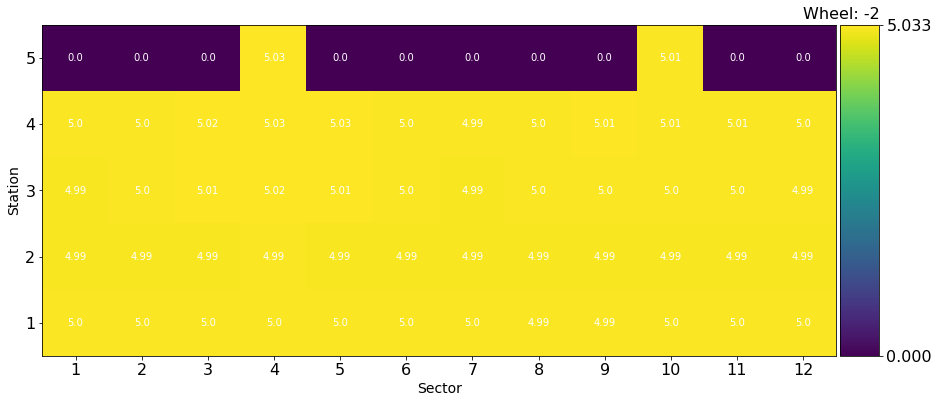

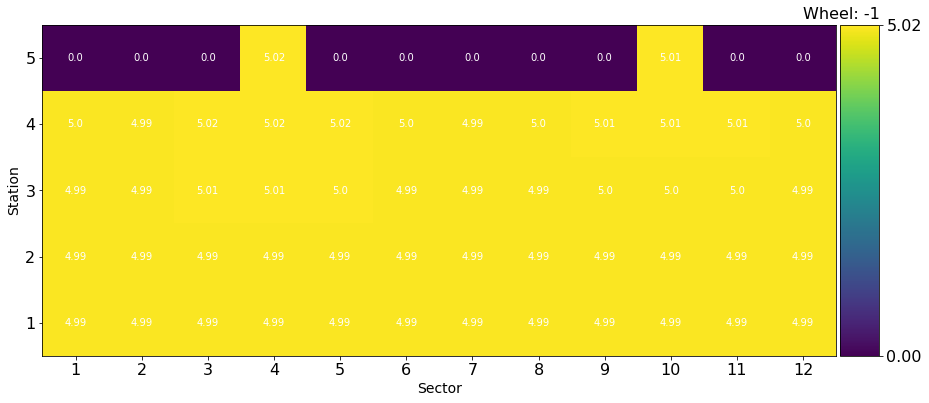

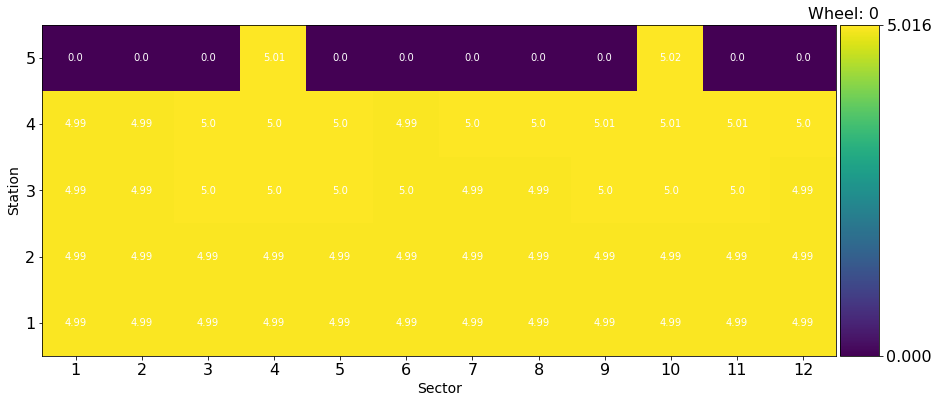

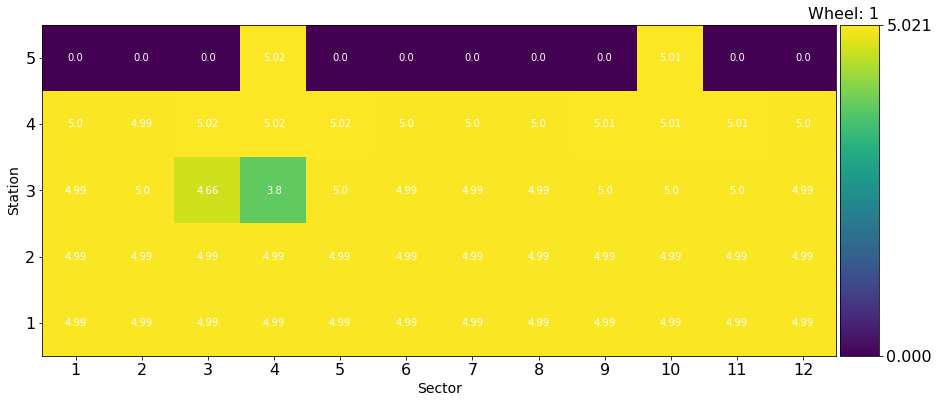

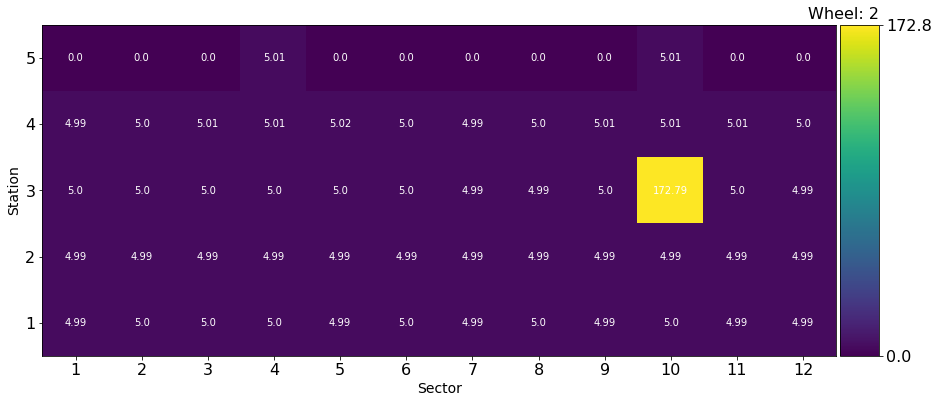

In [131]:
plot_scatter_3(layers_test[layers_test.run == 306125], "CS_red", -2)
plot_scatter_3(layers_test[layers_test.run == 306125], "CS_red", -1)
plot_scatter_3(layers_test[layers_test.run == 306125], "CS_red", 0)
plot_scatter_3(layers_test[layers_test.run == 306125], "CS_red", +1)
plot_scatter_3(layers_test[layers_test.run == 306125], "CS_red", +2)

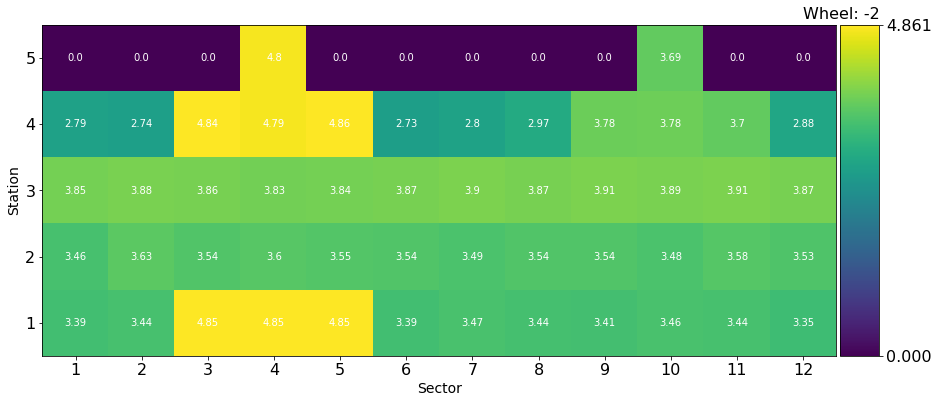

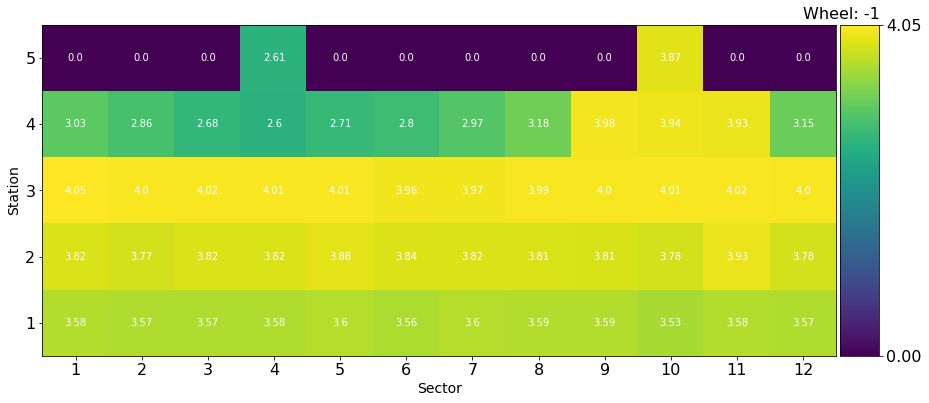

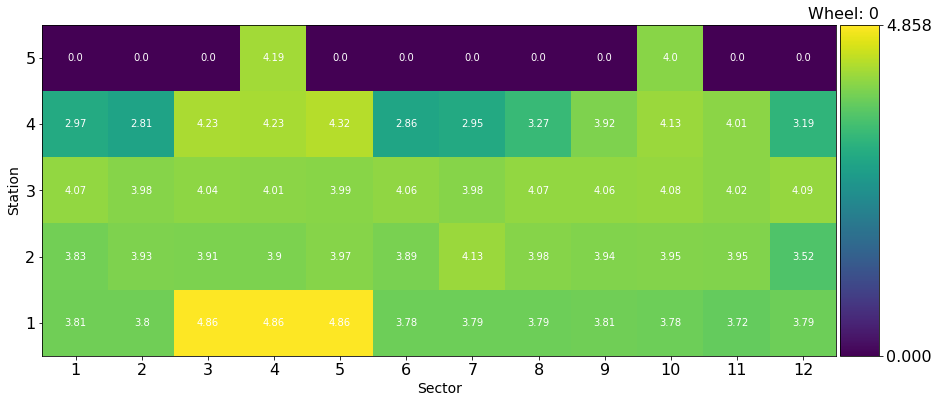

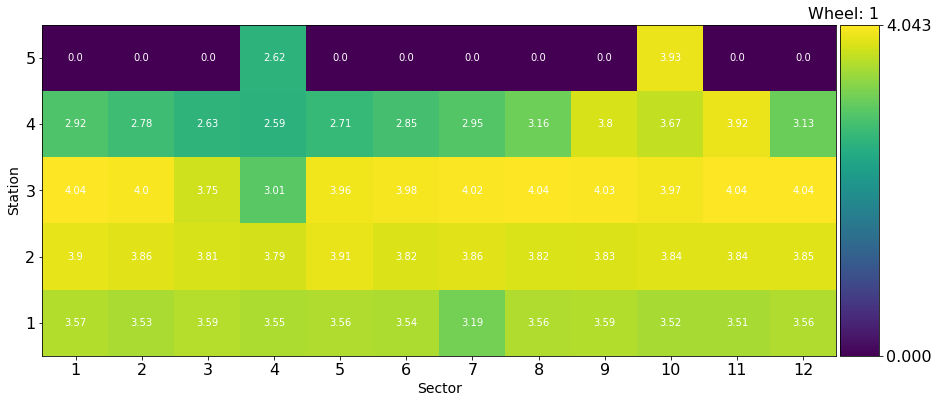

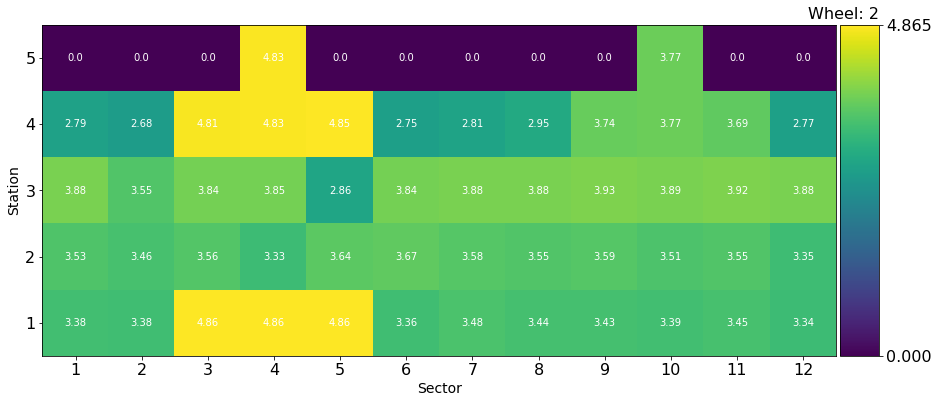

In [132]:
plot_scatter_3(layers_test[layers_test.run == 302634], "CS_red", -2)
plot_scatter_3(layers_test[layers_test.run == 302634], "CS_red", -1)
plot_scatter_3(layers_test[layers_test.run == 302634], "CS_red", 0)
plot_scatter_3(layers_test[layers_test.run == 302634], "CS_red", +1)
plot_scatter_3(layers_test[layers_test.run == 302634], "CS_red", +2)

In [96]:
#n_cls = 150
#from sklearn import cluster, datasets
#k_means = cluster.KMeans(n_clusters=n_cls)
#distances = k_means.fit_transform(np.vstack(layers_test["content_red"].values))
#layers_test["kmeans_score"] = k_means.labels_

In [133]:
# load the model from disk
from sklearn.externals import joblib
filename = './model_sktlearn/kmeans_red.sav'
k_means = joblib.load(filename)

In [134]:
rule = (layers_test.run == 302634) & ((layers_test.ls < 40) | (layers_test.ls > 70))\
#& (layers_test.score == 1)
reduced_anom = layers_test[rule].copy()

In [135]:
distances_test = k_means.transform(np.vstack(reduced_anom["content_red"].values))
minim = []
for i in range(0, len(distances_test)):
    #print  min(distances_test[i])
    minim.append(min(distances_test[i]))
reduced_anom["dist"] = minim

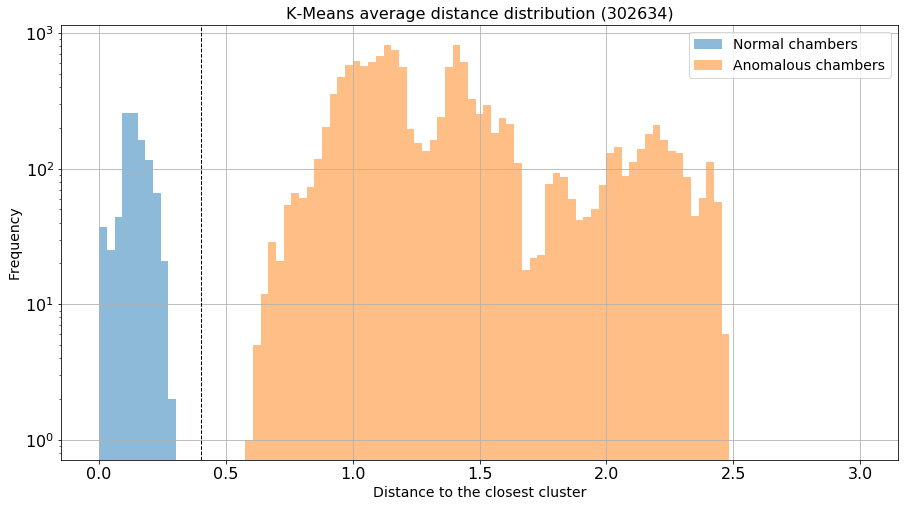

In [136]:
fig, ax = plt.subplots()
ax.set_yscale('log')
ax.grid()
bins = np.linspace(0, 3.0, 100)
plt.hist(reduced_anom[reduced_anom["score"] < 0]["dist"], bins=bins,\
         alpha=0.5, label="Normal chambers")
plt.hist(reduced_anom[reduced_anom["score"] > 0]["dist"], bins=bins,\
         alpha=0.5, label="Anomalous chambers")
plt.axvline(0.4, color='k', linestyle='dashed', linewidth=1)
plt.title("K-Means average distance distribution (302634)")
plt.legend(loc='best')
plt.ylabel('Frequency')
plt.xlabel('Distance to the closest cluster')
plt.show()

Normalized confusion matrix
[[ 1.  0.]
 [ 0.  1.]]


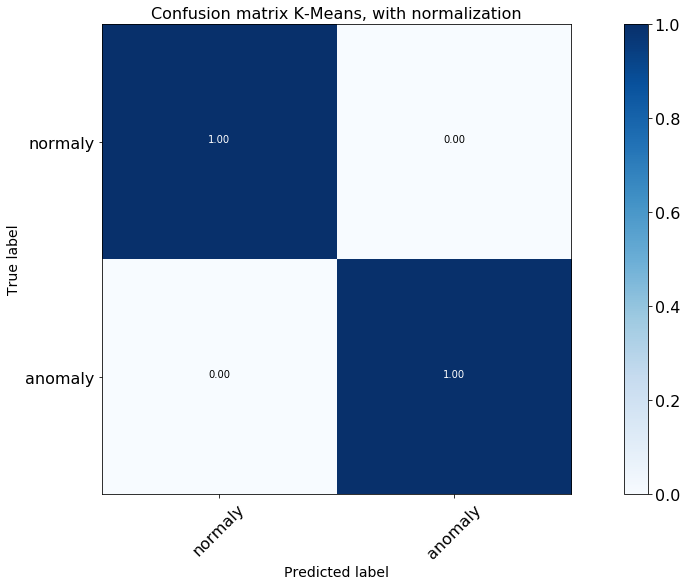

In [137]:
th_km = 0.4
y_pred = 2*(reduced_anom["dist"] > th_km)-1
cnf_matrix = confusion_matrix(reduced_anom["score"].astype(int), y_pred)
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=["normaly","anomaly"], normalize=True,
                      title='Confusion matrix K-Means, with normalization')

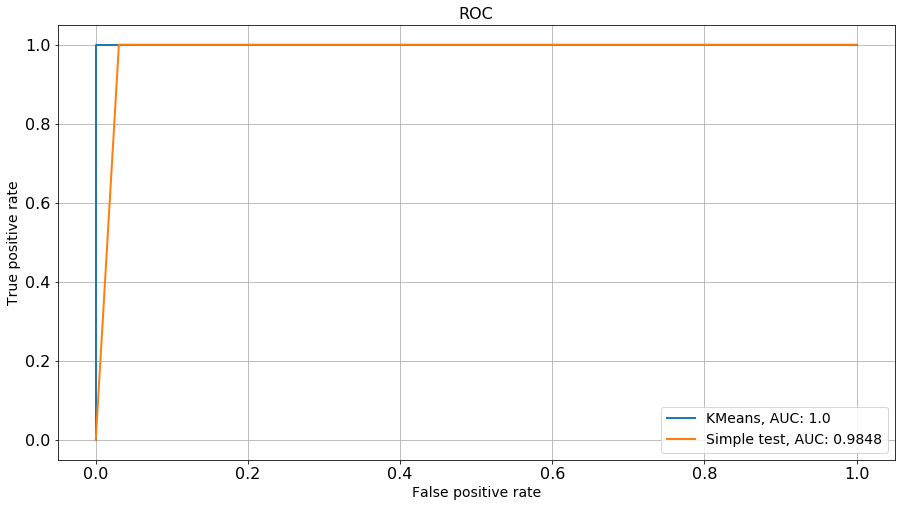

In [151]:
get_roc_curve(reduced_anom,[
                           #("Variance", "variance_score"),
                           #("IF", "if_score"),
                           #("SVM", "svm_score"),
                           #("AE", "cae_score"),
                           ("KMeans", "dist"),
                           #("DNN", "ann_score_4"),
                           ("Simple test", "st_score"),
                          ]
             )

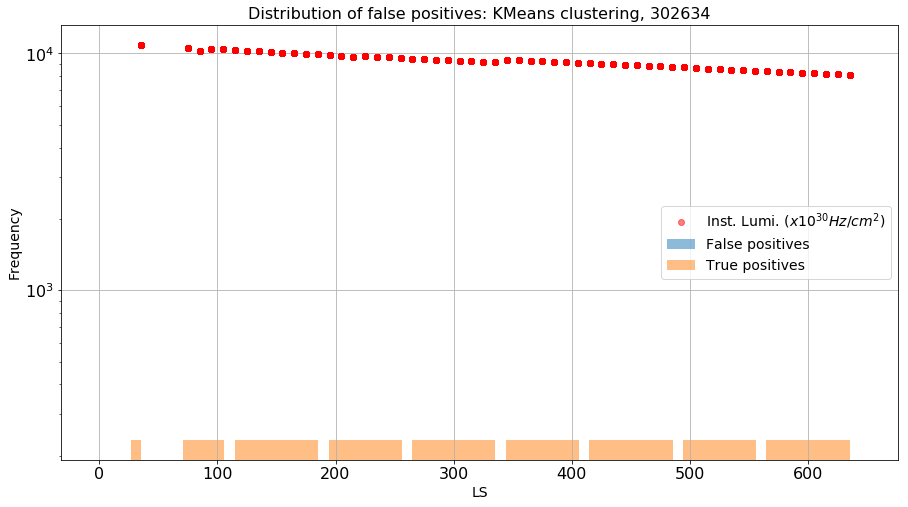

array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.])

In [138]:
threshold = th_km
plotFpVsLs(302634, 0, 0, 0, "Distribution of false positives: KMeans clustering, ", reduced_anom, "dist",\
           threshold, True, boundaries[boundaries["run"] == 302634]["ls_end"])
#plotFpVsLs(302635, 0, 0, 0, "Distribution of false positives: LOF, ", layers_test, "lof_score",\
            #threshold, True, boundaries[boundaries["run"] == 302635]["ls_end"])

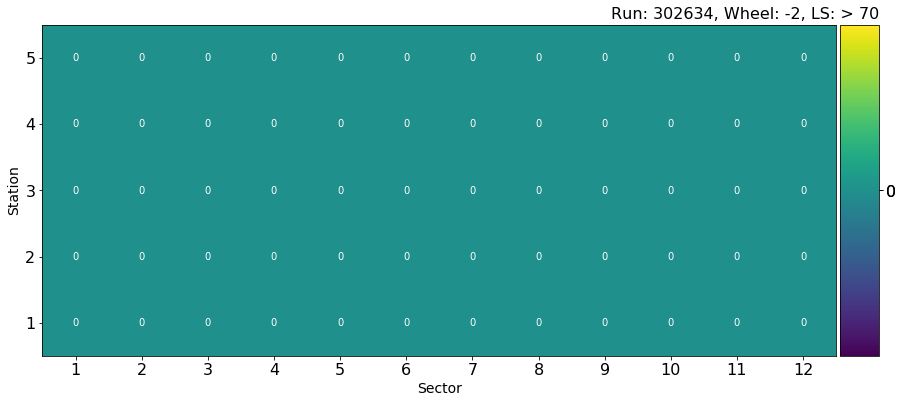

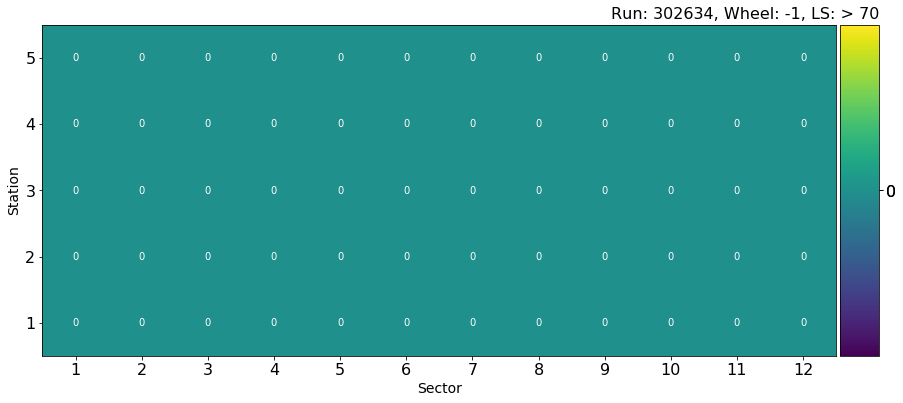

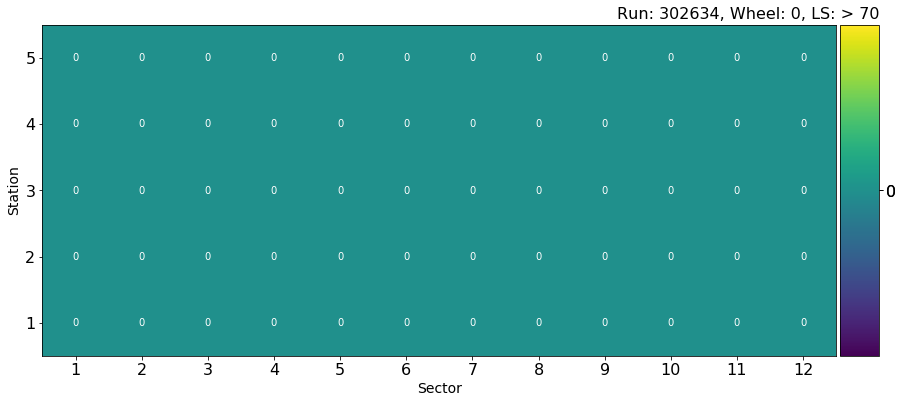

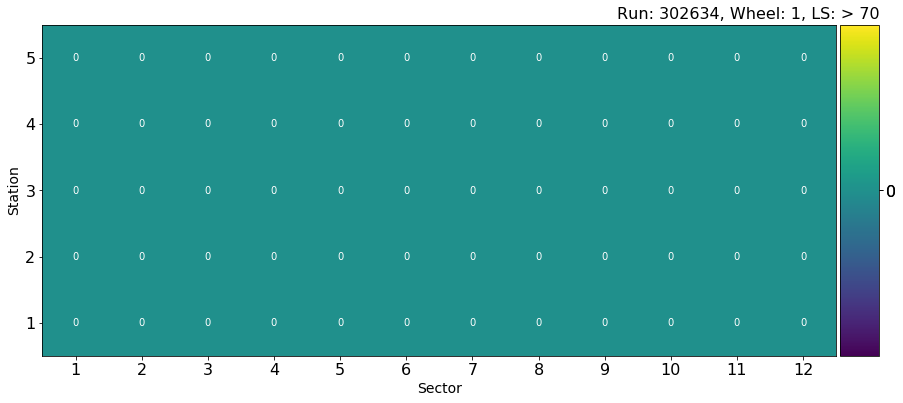

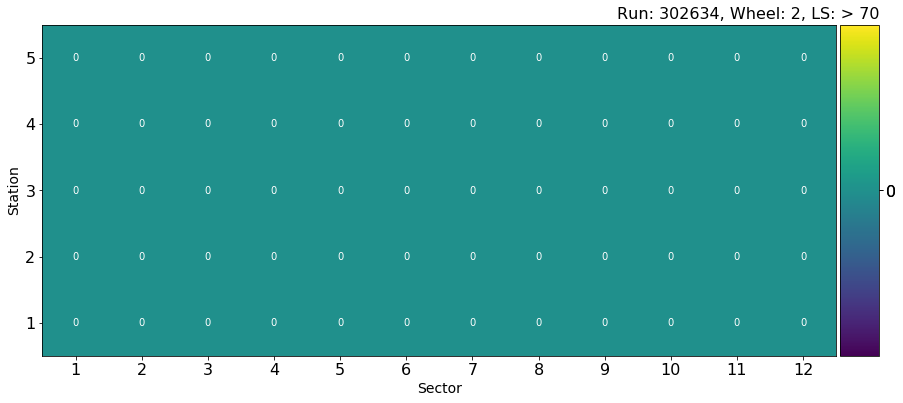

In [139]:
dis_nn = "dist"
rule = (reduced_anom["score"] == -1) & (reduced_anom[dis_nn] > th_km)

plot_scatter(reduced_anom[rule], 302634, -2, 70, -1)
plot_scatter(reduced_anom[rule], 302634, -1, 70, -1)
plot_scatter(reduced_anom[rule], 302634, 0, 70, -1)
plot_scatter(reduced_anom[rule], 302634, +1, 70, -1)
plot_scatter(reduced_anom[rule], 302634, +2, 70, -1)

ANOMALIES: NOT SELECTED WITH KMeans


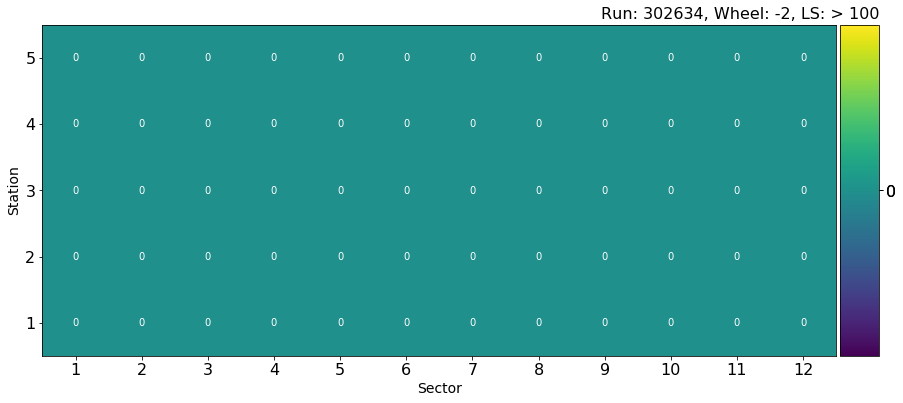

ANOMALIES: SELECTED WITH KMeans


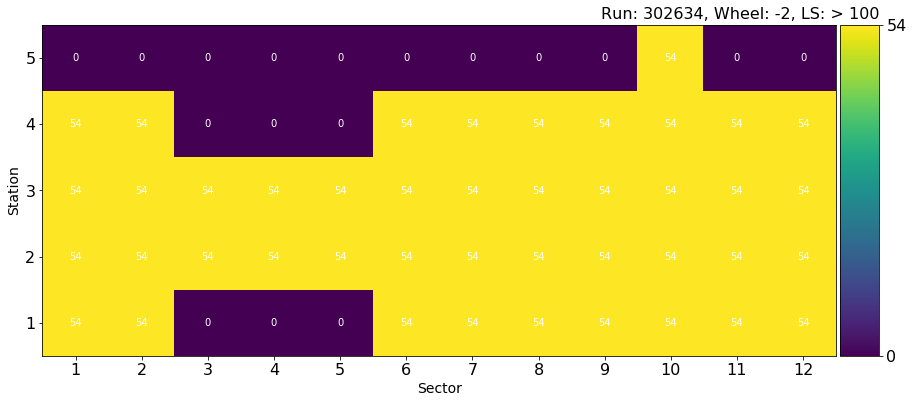

In [140]:
print "ANOMALIES: NOT SELECTED WITH KMeans"
rule = (reduced_anom["score"] == 1) & (reduced_anom[dis_nn] < th_km)
plot_scatter(reduced_anom[rule], 302634, -2, 100, -1)
print "ANOMALIES: SELECTED WITH KMeans"
rule = (reduced_anom["score"] == 1) & (reduced_anom[dis_nn] > th_km)
plot_scatter(reduced_anom[rule], 302634, -2, 100, -1)

ANOMALIES: NOT SELECTED WITH KMeans


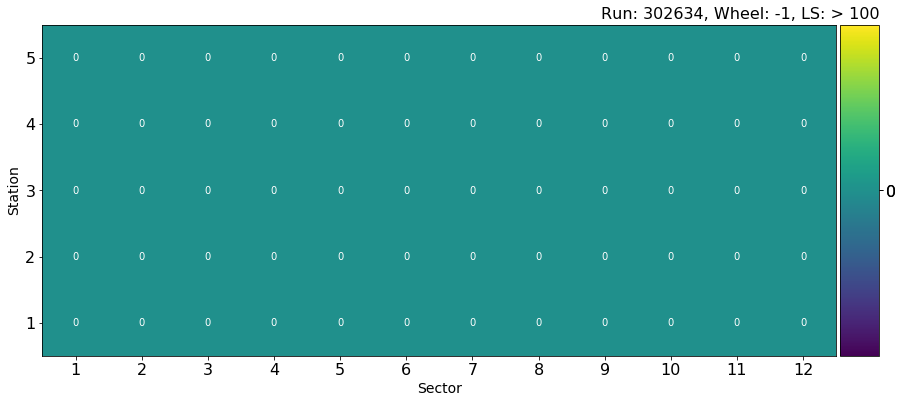

ANOMALIES: SELECTED WITH KMeans


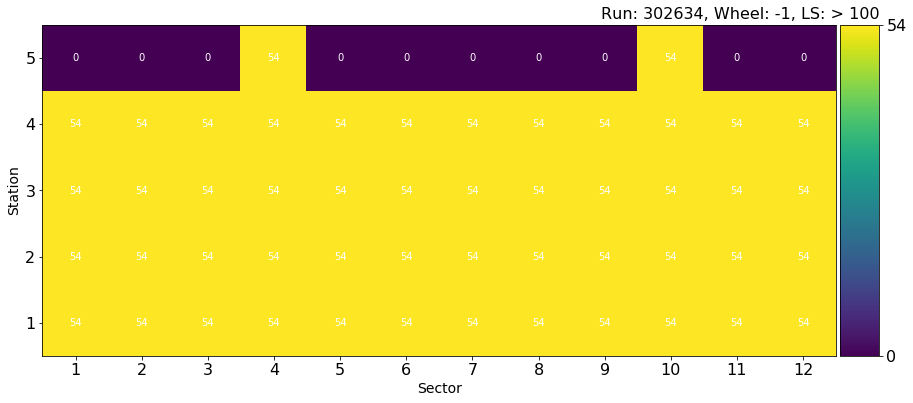

In [141]:
print "ANOMALIES: NOT SELECTED WITH KMeans"
rule = (reduced_anom["score"] == 1) & (reduced_anom[dis_nn] < th_km)
plot_scatter(reduced_anom[rule], 302634, -1, 100, -1)
print "ANOMALIES: SELECTED WITH KMeans"
rule = (reduced_anom["score"] == 1) & (reduced_anom[dis_nn] > th_km)
plot_scatter(reduced_anom[rule], 302634, -1, 100, -1)

ANOMALIES: NOT SELECTED WITH KMeans


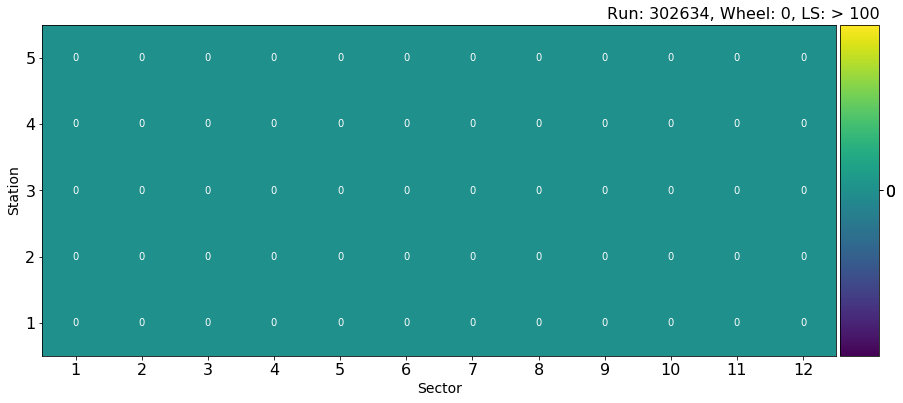

ANOMALIES: SELECTED WITH KMeans


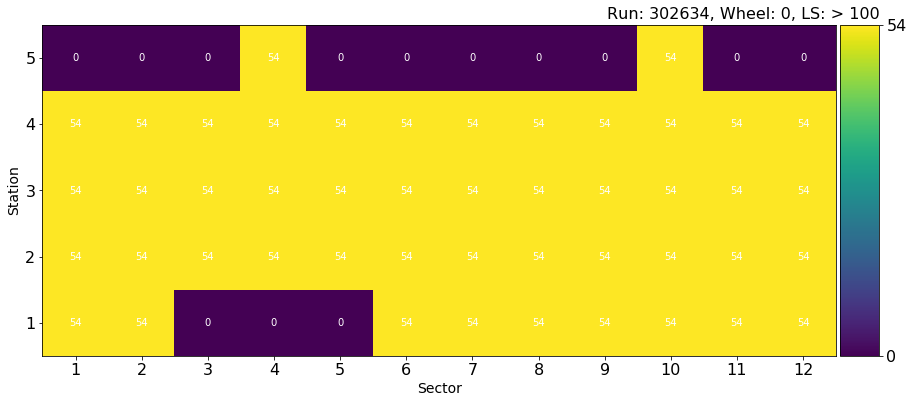

In [142]:
print "ANOMALIES: NOT SELECTED WITH KMeans"
rule = (reduced_anom["score"] == 1) & (reduced_anom[dis_nn] < th_km)
plot_scatter(reduced_anom[rule], 302634, 0, 100, -1)
print "ANOMALIES: SELECTED WITH KMeans"
rule = (reduced_anom["score"] == 1) & (reduced_anom[dis_nn] > th_km)
plot_scatter(reduced_anom[rule], 302634, 0, 100, -1)

ANOMALIES: NOT SELECTED WITH KMeans


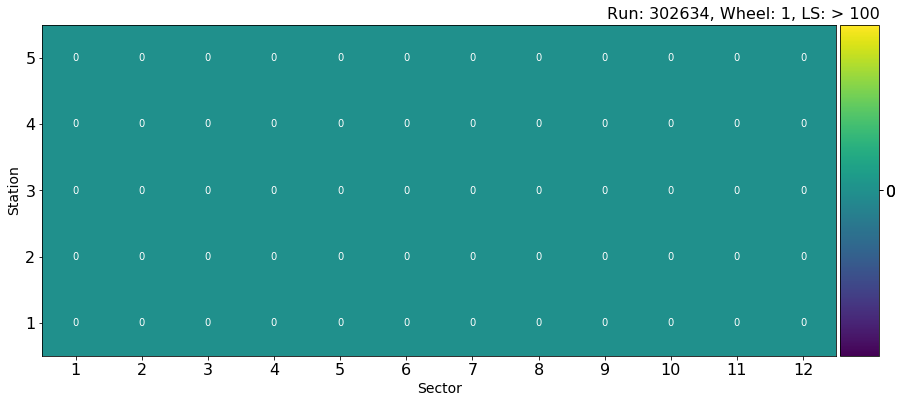

ANOMALIES: SELECTED WITH KMeans


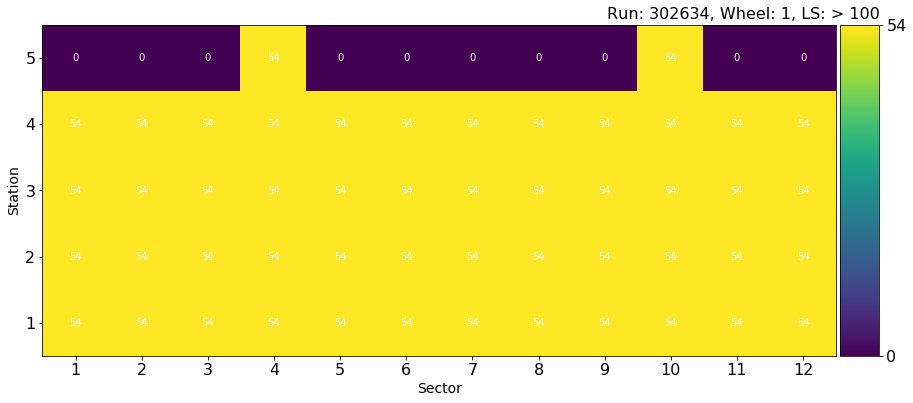

In [143]:
print "ANOMALIES: NOT SELECTED WITH KMeans"
rule = (reduced_anom["score"] == 1) & (reduced_anom[dis_nn] < th_km)
plot_scatter(reduced_anom[rule], 302634, +1, 100, -1)
print "ANOMALIES: SELECTED WITH KMeans"
rule = (reduced_anom["score"] == 1) & (reduced_anom[dis_nn] > th_km)
plot_scatter(reduced_anom[rule], 302634, +1, 100, -1)

ANOMALIES: NOT SELECTED WITH KMeans


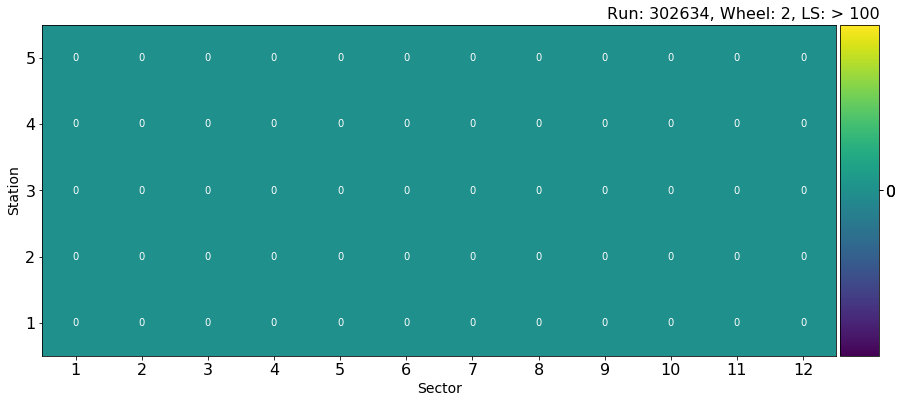

ANOMALIES: SELECTED WITH KMeans


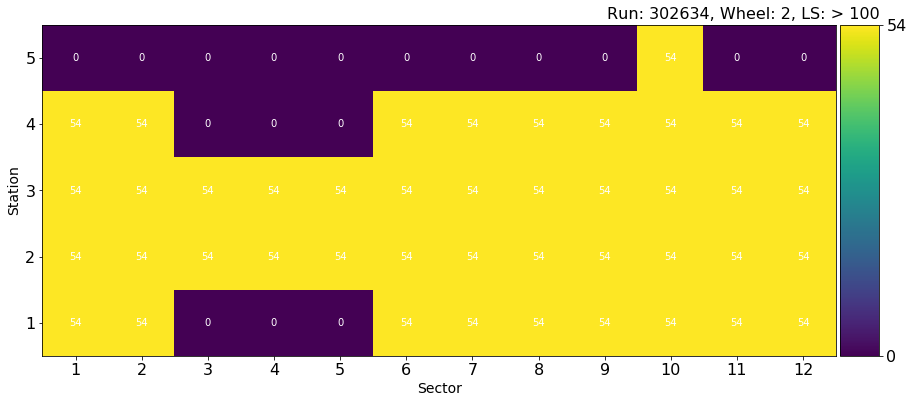

In [144]:
print "ANOMALIES: NOT SELECTED WITH KMeans"
rule = (reduced_anom["score"] == 1) & (reduced_anom[dis_nn] < th_km)
plot_scatter(reduced_anom[rule], 302634, +2, 100, -1)
print "ANOMALIES: SELECTED WITH KMeans"
rule = (reduced_anom["score"] == 1) & (reduced_anom[dis_nn] > th_km)
plot_scatter(reduced_anom[rule], 302634, +2, 100, -1)